In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as Data
import torch.optim as optim
import torchvision
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils import data
import numpy as np
import matplotlib.pyplot as plt
import os
import cProfile, pstats, io
from pstats import SortKey
from random import randint
from Utillities import Utillities
from cnn_model import CNN6     

try:
    from apex import amp
    APEX_AVAILABLE = True
except ModuleNotFoundError:
    APEX_AVAILABLE = False

#APEX_AVAILABLE = False    

print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

if os.path.exists("checkpoint.pt"):
    os.remove("checkpoint.pt")

torch.manual_seed(1)   # reproducible

OPTIMIZATION_PLUGIN = 'Bayesian' # 'Bayesian' or 'Scikit' or 'GradDescent'
#Bayesian requires: $ conda install -c conda-forge bayesian-optimization

GET_STATS = False
GPU_SELECT = 0 # can be 0, 1, 2 (both)
PARALLEL_PROCESSES = 2
TRIALS = 1
RANDOM_STARTS = 5000
LR  = 1e-5                    # learning rate
SCI_LR =  1e-5
LR2 = 1e-5
SCI_MM = 0.5                  # momentum - used only with SGD optimizer
MM = 0.5
L_FIRST = 14                  # initial number of channels
KERNEL_X = 14
patience = 7                 # if validation loss not going down, wait "patience" number of epochs
accuracy = 0
MaxPercent = 0

PercentVector = np.zeros(RANDOM_STARTS + TRIALS)
PercentVec = np.zeros(RANDOM_STARTS + TRIALS)
count = 0

pr = cProfile.Profile()

if GET_STATS:
    pr.enable()
    

if GPU_SELECT == 2:
    if torch.cuda.device_count() > 1:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        print("Using", torch.cuda.device_count(), "NVIDIA 1080TI GPUs!")

if GPU_SELECT == 1:
    device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")    
    print("Using one (the second) NVIDIA 1080TI GPU!")

if GPU_SELECT == 0:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")       
    print("Using one (the first) NVIDIA 1080TI GPU!")


PyTorch Version:  1.3.0.dev20190917
Torchvision Version:  0.5.0a0+e8b830f
Using one (the first) NVIDIA 1080TI GPU!


In [2]:
from early_stopping import EarlyStopping
from dataset import dataset


early_stopping = EarlyStopping(patience=patience, verbose=True)  # initialize the early_stopping object

# Counter for the execution time
start = torch.cuda.Event(enable_timing=True)
end = torch.cuda.Event(enable_timing=True)

start.record()

In [3]:
if OPTIMIZATION_PLUGIN == 'Scikit' :
    from skopt import gp_minimize
    from sklearn.datasets import load_boston
    from sklearn.ensemble import GradientBoostingRegressor
    from sklearn.model_selection import cross_val_score
    from skopt.space import Real, Integer
    from skopt.utils import use_named_args
    from skopt.plots import plot_convergence
    from functools import partial
    from skopt.plots import plot_evaluations
    from skopt import gp_minimize, forest_minimize, dummy_minimize, gbrt_minimize
    from skopt.plots import plot_objective
    from sklearn.preprocessing import LabelEncoder
    from skopt.space import Real, Categorical, Integer
    from sklearn.externals.joblib import Parallel, delayed

    SCI_LR = Categorical(categories=[1e-1, 3e-1, 5e-1, 7e-1, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3, 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.08, 0.09],name= 'SCI_LR')
    SCI_MM = Categorical(categories=[0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99, 0.999], name='SCI_MM')
    SCI_REGULARIZATION = Categorical(categories=[0.0001, 0.0003, 0.0007, 0.001, 0.003, 0.007, 0.01, 0.03, 0.07, 0.1, 0.3, 0.7], name='SCI_REGULARIZATION')
    SCI_EPOCHS = Categorical(categories=[2000, 1000], name='SCI_EPOCHS')
    SCI_optimizer = Categorical(categories=['Adam', 'AMSGrad', 'SGD', 'RMSprop', 'Rprop', 'AdamW', 'ASGD', 'Adadelta', 'Adamax'],name='SCI_optimizer') #
    SCI_loss_type = Categorical(categories=['CrossEntropyLoss', 'MultiMarginLoss','NLLLoss', 'L1Loss'],name='SCI_loss_type') # 
    SCI_BATCH_SIZE = Categorical(categories=[4, 8, 12, 16, 24, 32, 48, 64, 80, 96, 104, 128, 144, 160, 192, 224, 256], name='SCI_BATCH_SIZE')
    SCI_DROPOUT = Categorical(categories=[0, 0.01, 0.03, 0.07, 0.1, 0.13, 0.17, 0.2, 0.23, 0.27, 0.3, 0.33, 0.37, 0.4] , name = 'SCI_DROPOUT')
    SCI_RELU = Categorical(categories=['True', 'False'] , name = 'SCI_RELU')
    SCI_BIAS = Categorical(categories=['True', 'False'] , name = 'SCI_BIAS')
    SCI_L_SECOND = Categorical(categories=[2, 4, 6, 8, 12, 16, 20, 24, 32, 48, 64], name='SCI_L_SECOND')
    SCI_BN_MOMENTUM = Categorical(categories=[0, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99] , name = 'SCI_BN_MOMENTUM') 
    SCI_SGD_MOMENTUM = Categorical(categories=[0, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99] , name = 'SCI_SGD_MOMENTUM') 
    SCI_LINEARITY = Categorical(categories=[1, 2],name= 'SCI_LINEARITY')
   

    dimensions = [SCI_BATCH_SIZE, SCI_MM, SCI_REGULARIZATION, SCI_optimizer, SCI_LR, SCI_loss_type, SCI_DROPOUT, SCI_RELU, SCI_BIAS, SCI_L_SECOND, SCI_EPOCHS, SCI_BN_MOMENTUM, SCI_SGD_MOMENTUM, SCI_LINEARITY]

    @use_named_args(dimensions = dimensions)

    def objective(SCI_BATCH_SIZE, SCI_MM, SCI_REGULARIZATION, SCI_optimizer, SCI_LR, SCI_loss_type, SCI_DROPOUT, SCI_RELU, SCI_BIAS, SCI_L_SECOND, SCI_EPOCHS, SCI_BN_MOMENTUM, SCI_SGD_MOMENTUM, SCI_LINEARITY):
        global device  

        loss_func = nn.CrossEntropyLoss()

        def create_loss(LOSS):   
            if LOSS == 'CrossEntropyLoss':
                loss_func = nn.CrossEntropyLoss()
            if LOSS == 'NLLLoss':
                loss_func = nn.NLLLoss()
            else:
                loss_func = nn.MultiMarginLoss()
            return loss_func

        MM = float(str(SCI_MM))
        REGULARIZATION = float(str(SCI_REGULARIZATION))
        optimizer = str(SCI_optimizer)
        LR = float(str(SCI_LR))
        train_losses = []         # to track the training loss as the model trains
        output = 0
        loss = 0
        accuracy = 0
        early_stopping.counter = 0
        early_stopping.best_score = None
        early_stopping.early_stop = False
        early_stopping.verbose = False  
        TEST_RESULTS = torch.zeros(1,2)
 
        loss_type = create_loss(SCI_loss_type)
                
        cnn = CNN6(L_FIRST, SCI_L_SECOND, KERNEL_X, SCI_BIAS, SCI_BN_MOMENTUM, SCI_RELU, SCI_DROPOUT, dataset.CLASSES, SCI_LINEARITY)     

        optimizer = Utillities.optimization_algorithms(SCI_optimizer,cnn, SCI_LR, SCI_SGD_MOMENTUM,
                                                       SCI_REGULARIZATION)
        
        if GPU_SELECT == 2:
            if torch.cuda.device_count() > 1:
                cnn = nn.DataParallel(cnn,device_ids=[0, 1], dim=0) 
            cnn = cnn.cuda()
        if GPU_SELECT == 1:
            cnn.to(device)  
        if GPU_SELECT == 0:
            cnn.to(device)        

        cnn.apply(CNN6.weights_reset)
        cnn.share_memory()
     

        Utillities.listing(optimizer, SCI_SGD_MOMENTUM, SCI_BN_MOMENTUM, SCI_L_SECOND, SCI_LR, SCI_RELU, SCI_BIAS, SCI_loss_type, REGULARIZATION, SCI_BATCH_SIZE, SCI_DROPOUT, SCI_LINEARITY)
    
        #SCI_BATCH_SIZE = 1
        # Data Loader for easy mini-batch return in training
        SCI_BATCH_SIZE = int(SCI_BATCH_SIZE)
        train_loader = Data.DataLoader(dataset = dataset.train_dataset, batch_size = SCI_BATCH_SIZE, shuffle = False, num_workers = 0, drop_last=True, pin_memory=True)
        validation_loader = Data.DataLoader(dataset = dataset.validation_dataset, batch_size = SCI_BATCH_SIZE, shuffle = False, num_workers = 0, drop_last=True, pin_memory=True)    
        test_loader = Data.DataLoader(dataset = dataset.test_dataset, batch_size = SCI_BATCH_SIZE, shuffle = False, num_workers = 0, pin_memory=True)
    
        for epoch in range(SCI_EPOCHS):
            loss = None        
            cnn.train().cuda()
            for step, (train_data, train_target) in enumerate(train_loader):   
                train_data, train_target = train_data.to(device), train_target.to(device)
                output, temp = cnn(train_data)                # forward pass: compute predicted outputs by passing inputs to the model     
                loss = loss_func(output, train_target)
                train_losses.append(loss.item())              # record training loss 
                loss.backward()                               # backward pass: compute gradient of the loss with respect to model parameters
                optimizer.zero_grad()
                optimizer.step()                              # perform a single optimization step (parameter update)
      
            cnn.eval().cuda()                 # switch to evaluation (no change) mode           
            valid_loss = 0
            accuracy = 0
            with torch.no_grad():
                for step, (validation_data, validation_target) in enumerate(validation_loader):
                    validation_data, validation_target = validation_data.to(device), validation_target.to(device)
                    output, temp = cnn(validation_data)            # forward pass: compute predicted outputs by passing inputs to the model
                    valid_loss += loss_func(output, validation_target).item()
                    #ps = torch.exp(output)
                    #equality = (validation_target[0].data == ps.max(dim=1)[1])
                    #accuracy += equality.type(torch.FloatTensor).mean()      
               
            train_losses = []
            early_stopping(valid_loss, cnn)
       
            if early_stopping.early_stop:
                if os.path.exists('checkpoint.pt'):
                    print("Loaded the model with the lowest Validation Loss!")
                    #nn.load_state_dict(torch.load('checkpoint.pt', map_location="cuda:1"))  # Choose whatever GPU device number you want
                    cnn.load_state_dict(torch.load('checkpoint.pt', map_location="cuda:1"))  # Choose whatever GPU device number you want
                    cnn.to(device)
                break
      
        cnn.eval()
        class_correct = list(0. for i in range(1000))
        class_total = list(0. for i in range(1000))
        with torch.no_grad():
            for (test_data, test_target) in test_loader:
                test_data, test_target = test_data.to(device), test_target.to(device)
                outputs, temp = cnn(test_data)
                _, predicted = torch.max(outputs, 1)
                c = (predicted == test_target).squeeze()
                for i in range(test_target.size(0)):
                    label = test_target[i]
                    class_correct[label] += c[i].item()
                    class_total[label] += 1

        for i in range(dataset.CLASSES):
            TEST_RESULTS[0,i] = class_correct[i] / dataset.TESTED_ELEMENTS[i]
            print('Class: ',i,' accuracy: ', TEST_RESULTS[0,i])
            print('Class: ',i,' correct: ', class_correct[i])
        percent = (TEST_RESULTS[0,0]+TEST_RESULTS[0,1])/2
        print('Final percentage: ',percent)
    
        CreditCost = int((1 - TEST_RESULTS[0,0]) * dataset.TESTED_ELEMENTS[0] + (1 - TEST_RESULTS[0,1]) * dataset.TESTED_ELEMENTS[1] * 5)
    
        if TEST_RESULTS[0,0] == 0 or TEST_RESULTS[0,1] == 0 :
            CreditCost = CreditCost + 300
    
        print('Last epoch: ', epoch)
        print('Credit Cost: ',CreditCost)
    
        if os.path.exists('checkpoint.pt'):  
            os.remove('checkpoint.pt') 

        print()
        torch.cuda.empty_cache()
        print()
        
        return CreditCost
    
    #not working #res_gp = gp_minimize(objective, dimensions=dimensions, n_calls=TRIALS, random_state=1, verbose=True, acq_func='gp_hedge', acq_optimizer='auto', n_jobs=1)
    res_gp = forest_minimize(objective, dimensions=dimensions, base_estimator='RF', n_calls=TRIALS, n_random_starts=RANDOM_STARTS, acq_func='EI', x0=None, y0=None, random_state=None, verbose=True, callback=None, n_points=10000, xi=0.01, kappa=1.5, n_jobs=4)
    #res_gp = gbrt_minimize(objective, dimensions=dimensions, base_estimator='ET', n_calls=TRIALS+RANDOM_STARTS, n_random_starts=RANDOM_STARTS, acq_func='LCB', x0=None, y0=None, random_state=None, verbose=True, callback=None, n_points=100, xi=0.01, kappa=1.96, n_jobs=1)
    #res_gp = dummy_minimize(objective, dimensions=dimensions, n_calls=TRIALS, x0=None, y0=None, random_state=None, verbose=True, callback=None)      

    "Best score=%.4f" % res_gp.fun
    print("""Best parameters: - optimization=%d""" % (res_gp.x[0]))
  
    print(res_gp)
    plot_convergence(res_gp)
    #plot_evaluations(res_gp)
    #plot_objective(res_gp)
    

|   iter    |  target   | SCI_16... | SCI_BA... | SCI_BIAS  | SCI_BN... | SCI_BN... | SCI_BN... | SCI_DR... | SCI_EP... | SCI_LI... |  SCI_LR   | SCI_L_... |  SCI_MM   | SCI_RE... | SCI_RELU  | SCI_SG... | SCI_lo... | SCI_op... |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization option

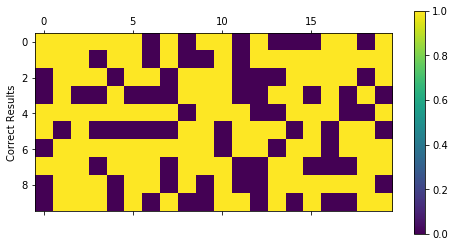

Final percentage:  tensor(0.5942)
Last epoch:  704


Best Score So Far:  tensor(-0.5942)


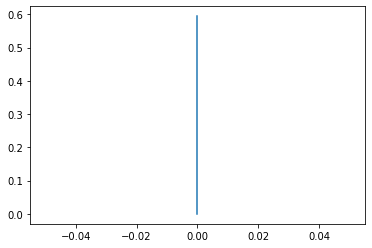

|  1        | -0.5942   |  0.8299   |  185.0    |  1.0      |  0.904    |  0.01468  |  0.1838   |  0.149    |  1.346e+0 |  2.186    |  0.4849   |  108.5    |  0.6848   |  0.184    |  2.747    |  0.02736  |  3.005    |  4.752    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

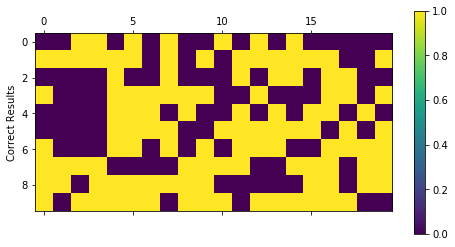

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.5942)


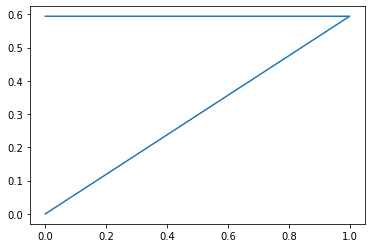

|  2        | -0.5      |  1.112    |  37.66    |  1.394    |  2.394    |  0.09683  |  0.6237   |  0.5539   |  1.876e+0 |  3.675    |  0.07655  |  11.92    |  0.1705   |  0.7903   |  1.196    |  0.4207   |  3.864    |  5.793    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

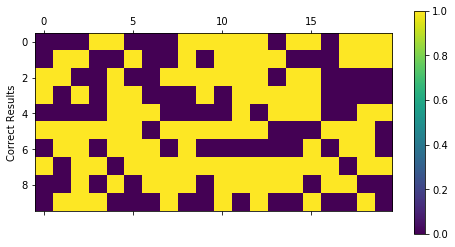

Final percentage:  tensor(0.5000)
Last epoch:  28


Best Score So Far:  tensor(-0.5942)


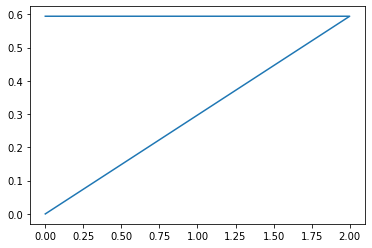

|  3        | -0.5      |  1.377    |  82.14    |  2.366    |  2.496    |  0.001829 |  1.493    |  0.7911   |  1.748e+0 |  1.839    |  0.7104   |  28.22    |  0.448    |  0.8177   |  1.584    |  0.2875   |  1.389    |  1.174    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

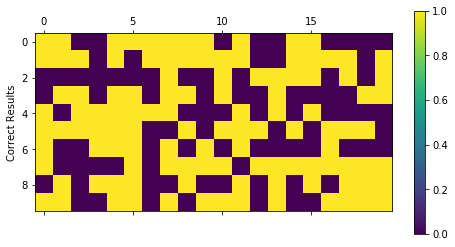

Final percentage:  tensor(0.5000)
Last epoch:  25


Best Score So Far:  tensor(-0.5942)


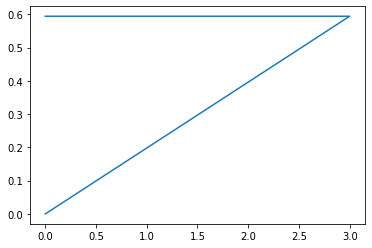

|  4        | -0.5      |  1.351    |  55.75    |  1.528    |  1.47     |  0.005336 |  1.142    |  0.1174   |  1.589e+0 |  3.092    |  0.09211  |  107.2    |  0.694    |  0.3728   |  1.099    |  0.5354   |  2.985    |  5.629    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

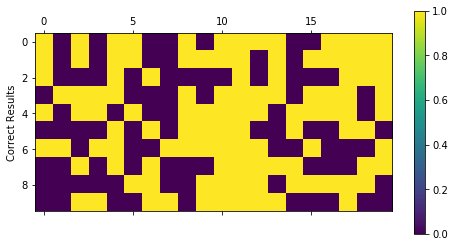

Final percentage:  tensor(0.5000)
Last epoch:  29


Best Score So Far:  tensor(-0.5942)


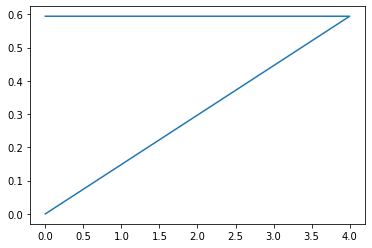

|  5        | -0.5      |  1.88     |  151.0    |  2.798    |  0.411    |  0.01393  |  1.607    |  0.3181   |  1.165e+0 |  3.773    |  0.313    |  192.7    |  0.7255   |  0.795    |  2.241    |  0.7502   |  2.043    |  3.427    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

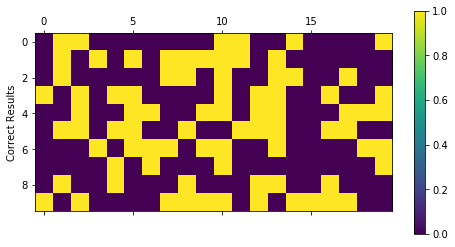

Final percentage:  tensor(0.4352)
Last epoch:  21


Best Score So Far:  tensor(-0.5942)


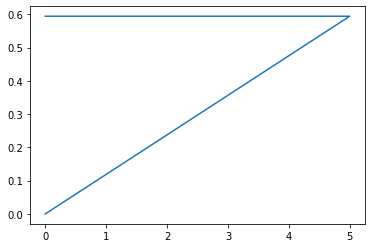

|  6        | -0.4352   |  1.783    |  110.7    |  2.92     |  1.984    |  0.06217  |  0.2283   |  0.7596   |  1.45e+03 |  2.729    |  0.3673   |  62.2     |  0.9026   |  0.5163   |  1.006    |  0.6165   |  1.977    |  5.738    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

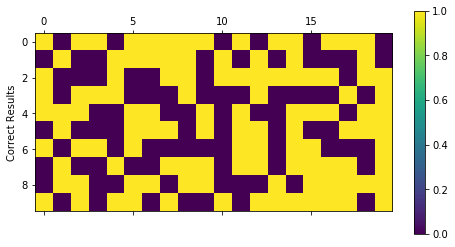

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.5942)


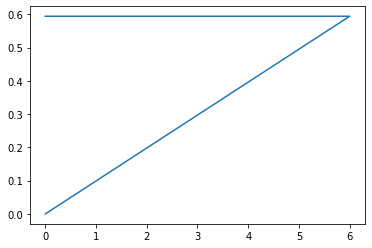

|  7        | -0.5      |  1.763    |  92.75    |  2.808    |  1.864    |  0.001582 |  1.85     |  0.5527   |  1.997e+0 |  1.515    |  0.1234   |  238.9    |  0.6964   |  0.0594   |  2.503    |  0.7531   |  3.76     |  7.397    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


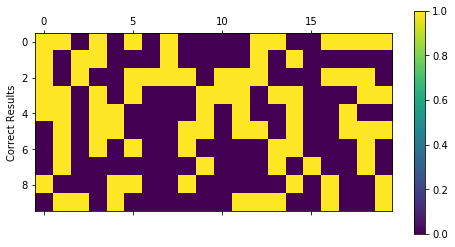

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.5942)


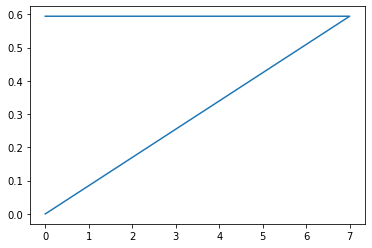

|  8        | -0.5      |  0.2473   |  7.05     |  1.052    |  0.08464  |  0.02462  |  1.711    |  0.4311   |  1.553e+0 |  3.518    |  0.1118   |  72.91    |  0.5856   |  0.8726   |  2.116    |  0.01863  |  3.394    |  3.094    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

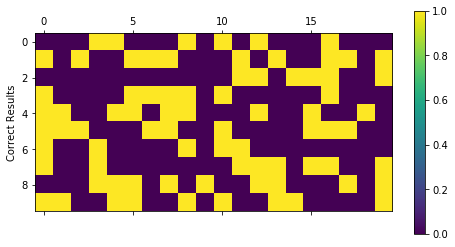

Final percentage:  tensor(0.3578)
Last epoch:  27


Best Score So Far:  tensor(-0.5942)


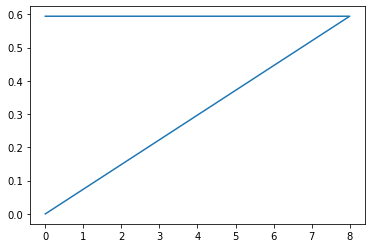

|  9        | -0.3578   |  1.606    |  100.5    |  2.718    |  2.234    |  0.05562  |  0.2715   |  0.04793  |  1.121e+0 |  1.133    |  0.09675  |  59.33    |  0.7126   |  0.5037   |  1.025    |  0.0719   |  3.892    |  6.107    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

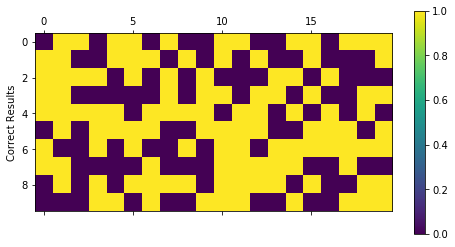

Final percentage:  tensor(0.5743)
Last epoch:  22


Best Score So Far:  tensor(-0.5942)


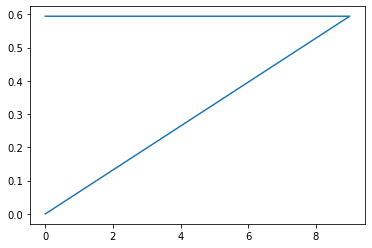

|  10       | -0.5743   |  0.4046   |  66.09    |  2.48     |  0.5843   |  0.05814  |  1.93     |  0.6775   |  1.24e+03 |  2.476    |  0.558    |  212.6    |  0.1575   |  0.01672  |  1.139    |  0.4859   |  2.813    |  6.114    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

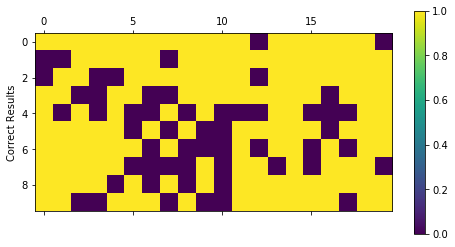

Final percentage:  tensor(0.7188)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


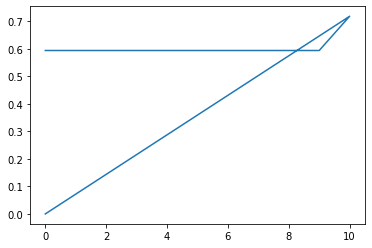

|  11       | -0.7188   |  0.6316   |  253.1    |  2.154    |  1.137    |  0.05509  |  1.483    |  0.5354   |  1.265e+0 |  1.198    |  0.3331   |  161.9    |  0.2108   |  0.6775   |  1.132    |  0.2601   |  3.406    |  2.739    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

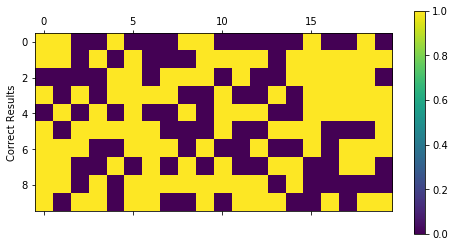

Final percentage:  tensor(0.5000)
Last epoch:  1906


Best Score So Far:  tensor(-0.7188)


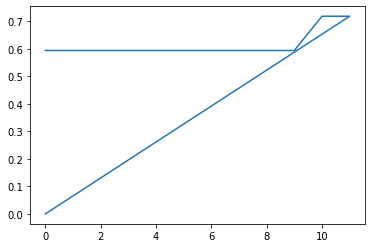

|  12       | -0.5      |  1.273    |  135.3    |  2.84     |  0.7873   |  0.006596 |  1.463    |  0.6177   |  1.908e+0 |  3.787    |  0.01257  |  61.53    |  0.6165   |  0.8541   |  2.891    |  0.5561   |  3.738    |  6.768    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

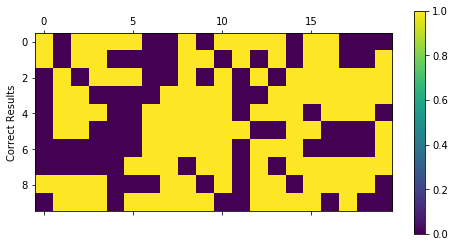

Final percentage:  tensor(0.6006)
Last epoch:  24


Best Score So Far:  tensor(-0.7188)


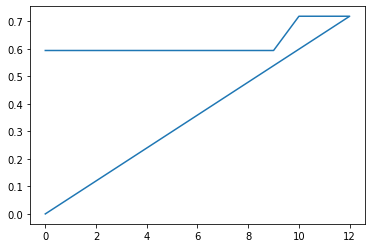

|  13       | -0.6006   |  0.7761   |  125.4    |  2.203    |  1.643    |  0.09262  |  1.828    |  0.3159   |  1.963e+0 |  1.52     |  0.1137   |  36.31    |  0.5057   |  0.01937  |  2.886    |  0.8263   |  1.045    |  2.584    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

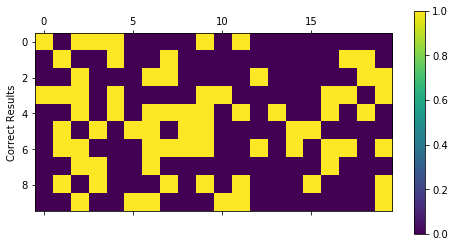

Final percentage:  tensor(0.3629)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


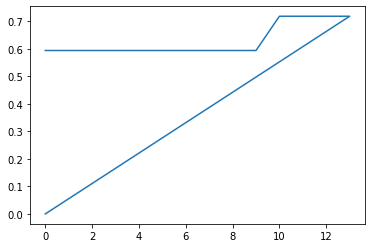

|  14       | -0.3629   |  0.6608   |  35.27    |  2.611    |  1.031    |  0.09401  |  1.158    |  0.7031   |  1.845e+0 |  3.707    |  0.4139   |  140.8    |  0.798    |  0.2571   |  1.976    |  0.5985   |  1.046    |  6.335    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

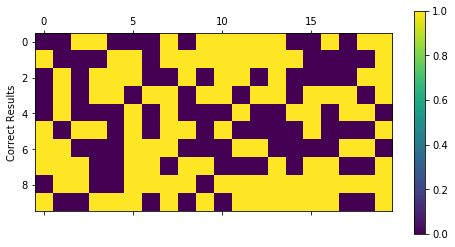

Final percentage:  tensor(0.5612)
Last epoch:  43


Best Score So Far:  tensor(-0.7188)


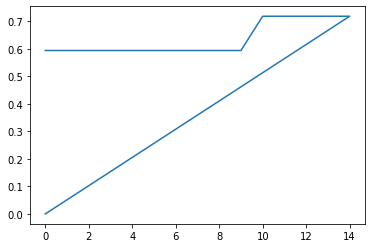

|  15       | -0.5612   |  0.863    |  207.1    |  1.627    |  2.67     |  0.05779  |  0.3662   |  0.6303   |  1.612e+0 |  1.161    |  0.3782   |  174.5    |  0.9178   |  0.000361 |  2.944    |  0.3762   |  3.912    |  6.436    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

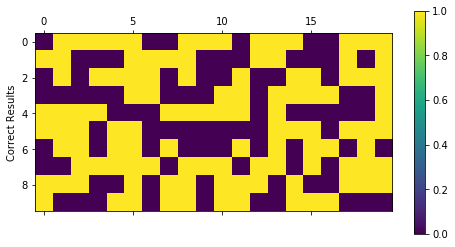

Final percentage:  tensor(0.5000)
Last epoch:  32


Best Score So Far:  tensor(-0.7188)


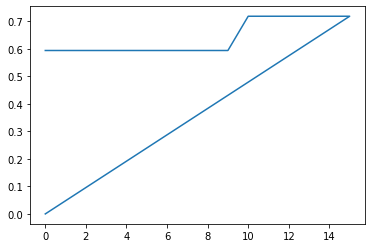

|  16       | -0.5      |  1.649    |  148.0    |  2.25     |  0.8539   |  0.05868  |  1.493    |  0.6867   |  1.755e+0 |  3.087    |  0.778    |  83.96    |  0.6704   |  0.4058   |  1.76     |  0.4104   |  2.2      |  3.853    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

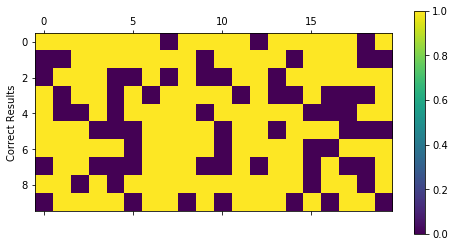

Final percentage:  tensor(0.6535)
Last epoch:  85


Best Score So Far:  tensor(-0.7188)


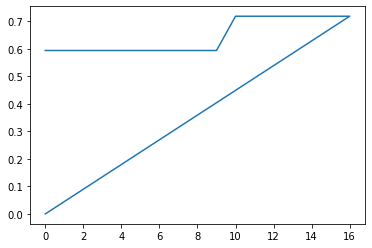

|  17       | -0.6535   |  1.238    |  111.3    |  2.938    |  2.027    |  0.01986  |  0.8491   |  0.2747   |  1.798e+0 |  3.631    |  0.8135   |  170.3    |  0.2707   |  0.2271   |  2.701    |  0.5272   |  3.398    |  6.147    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

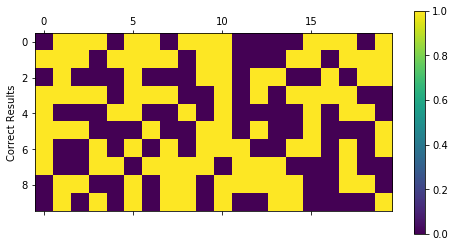

Final percentage:  tensor(0.5351)
Last epoch:  23


Best Score So Far:  tensor(-0.7188)


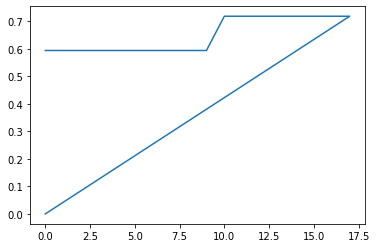

|  18       | -0.5351   |  1.459    |  133.8    |  2.534    |  1.701    |  0.04657  |  0.682    |  0.05457  |  1.378e+0 |  1.238    |  0.8845   |  48.13    |  0.8112   |  0.7875   |  2.37     |  0.5689   |  1.481    |  5.197    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

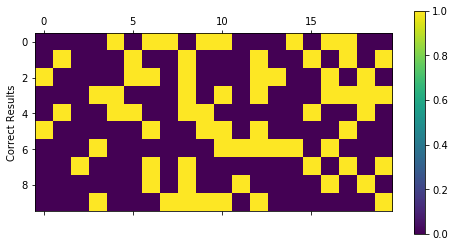

Final percentage:  tensor(0.3513)
Last epoch:  26


Best Score So Far:  tensor(-0.7188)


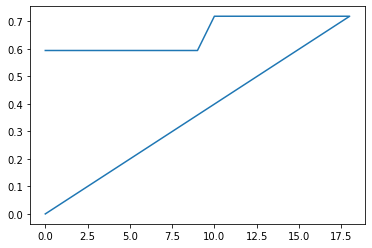

|  19       | -0.3513   |  0.6869   |  59.16    |  2.179    |  0.9337   |  0.09163  |  1.81     |  0.2057   |  1.111e+0 |  1.577    |  0.4496   |  187.1    |  0.2088   |  0.2232   |  2.695    |  0.4154   |  2.844    |  3.101    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


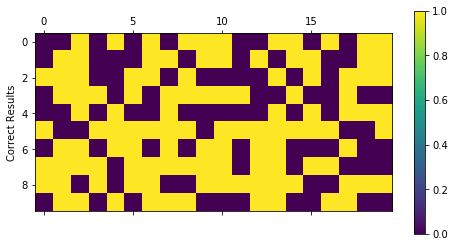

Final percentage:  tensor(0.5058)
Last epoch:  60


Best Score So Far:  tensor(-0.7188)


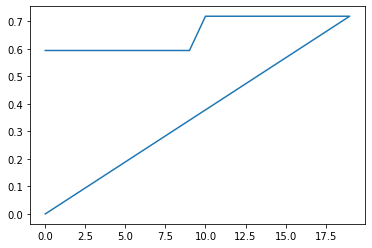

|  20       | -0.5058   |  0.2029   |  133.0    |  1.95     |  0.4565   |  0.06218  |  1.083    |  0.5233   |  1.145e+0 |  3.247    |  0.1999   |  133.9    |  0.7847   |  0.0201   |  1.645    |  0.872    |  3.526    |  5.841    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

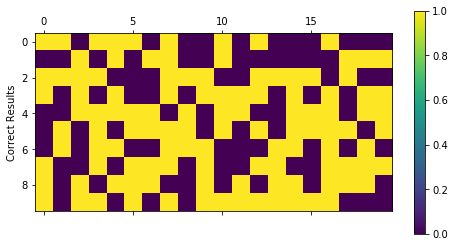

Final percentage:  tensor(0.5000)
Last epoch:  52


Best Score So Far:  tensor(-0.7188)


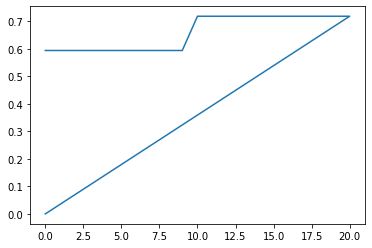

|  21       | -0.5      |  1.725    |  243.3    |  2.645    |  2.554    |  0.009874 |  1.296    |  0.5628   |  1.61e+03 |  3.391    |  0.03112  |  197.6    |  0.7313   |  0.2337   |  1.512    |  0.6317   |  2.032    |  8.161    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

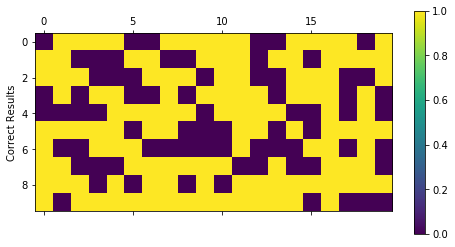

Final percentage:  tensor(0.6213)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


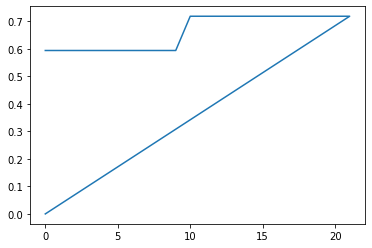

|  22       | -0.6213   |  0.8878   |  200.8    |  2.971    |  0.8977   |  0.0143   |  1.794    |  0.4332   |  1.975e+0 |  2.903    |  0.8945   |  140.7    |  0.5264   |  0.1219   |  1.708    |  0.02619  |  1.48     |  7.703    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

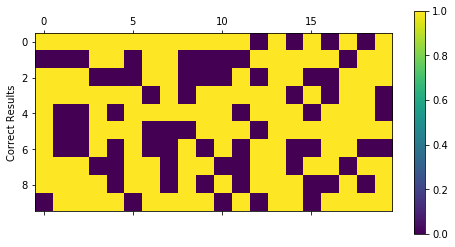

Final percentage:  tensor(0.6217)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


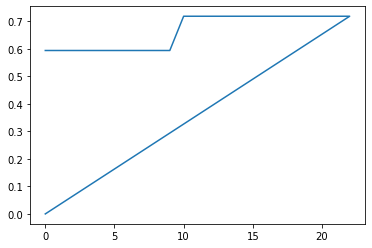

|  23       | -0.6217   |  0.0605   |  95.1     |  2.716    |  2.071    |  0.06909  |  0.3754   |  0.3535   |  1.582e+0 |  3.959    |  0.1835   |  64.92    |  0.2626   |  0.6752   |  1.909    |  0.05687  |  2.52     |  2.906    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

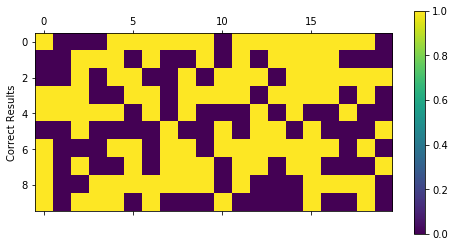

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


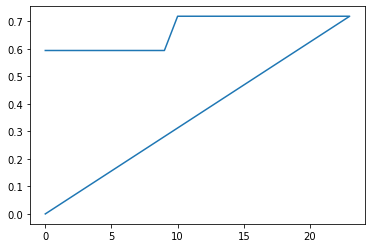

|  24       | -0.5      |  1.589    |  77.52    |  1.055    |  1.774    |  0.08438  |  0.7582   |  0.5999   |  1.511e+0 |  2.617    |  0.8635   |  206.2    |  0.03326  |  0.6384   |  1.925    |  0.9466   |  1.662    |  3.401    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

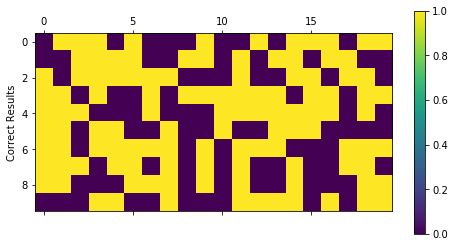

Final percentage:  tensor(0.5600)
Last epoch:  25


Best Score So Far:  tensor(-0.7188)


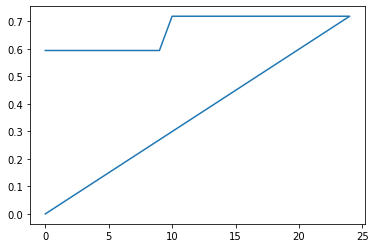

|  25       | -0.56     |  0.1621   |  110.9    |  1.217    |  1.895    |  0.0803   |  1.387    |  0.613    |  1.342e+0 |  3.529    |  0.3859   |  211.3    |  0.6262   |  0.1291   |  1.156    |  0.01831  |  1.2      |  5.123    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

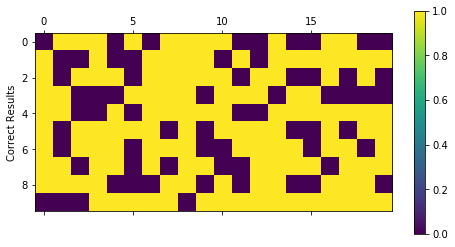

Final percentage:  tensor(0.6320)
Last epoch:  42


Best Score So Far:  tensor(-0.7188)


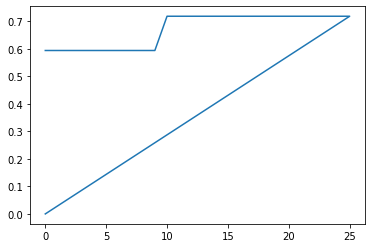

|  26       | -0.632    |  0.2256   |  9.057    |  2.502    |  1.181    |  0.07469  |  0.9003   |  0.3601   |  1.478e+0 |  2.417    |  0.7228   |  104.2    |  0.9039   |  0.03335  |  2.54     |  0.1255   |  2.849    |  1.093    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

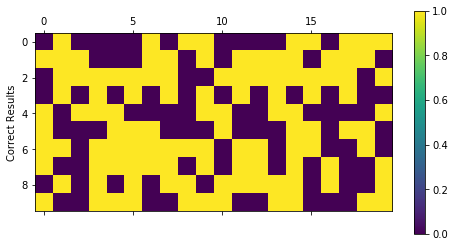

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


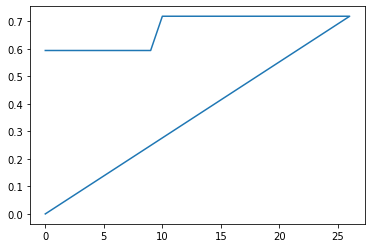

|  27       | -0.5      |  1.072    |  2.767    |  2.893    |  2.707    |  0.0796   |  1.821    |  0.1164   |  1.158e+0 |  1.561    |  0.5603   |  232.1    |  0.989    |  0.64     |  2.456    |  0.9084   |  2.199    |  3.246    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


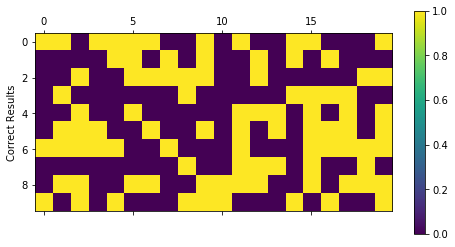

Final percentage:  tensor(0.4891)
Last epoch:  98


Best Score So Far:  tensor(-0.7188)


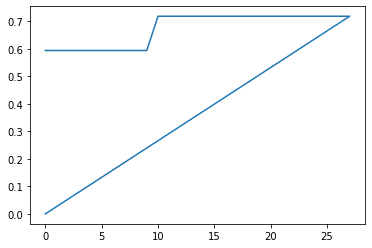

|  28       | -0.4891   |  0.3451   |  32.34    |  2.617    |  0.4389   |  0.02643  |  1.63     |  0.2485   |  1.982e+0 |  1.797    |  0.4803   |  81.87    |  0.91     |  0.3299   |  1.863    |  0.5118   |  3.807    |  1.278    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

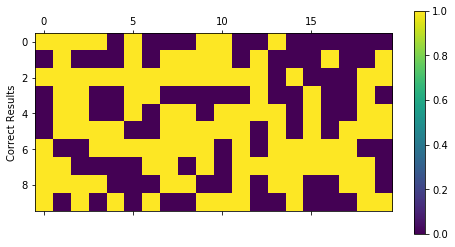

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


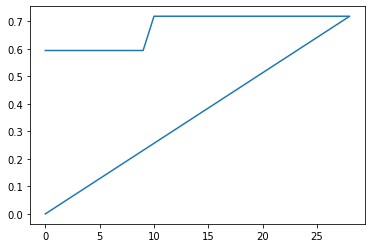

|  29       | -0.5      |  1.427    |  228.3    |  1.054    |  1.561    |  0.0326   |  1.71     |  0.4468   |  1.69e+03 |  2.354    |  0.5655   |  75.68    |  0.01033  |  0.5191   |  1.62     |  0.5168   |  3.74     |  4.834    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

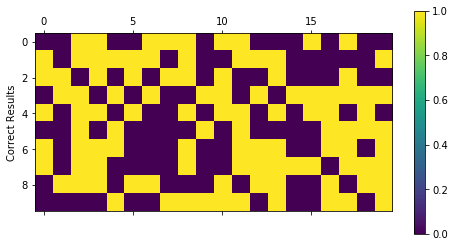

Final percentage:  tensor(0.5305)
Last epoch:  30


Best Score So Far:  tensor(-0.7188)


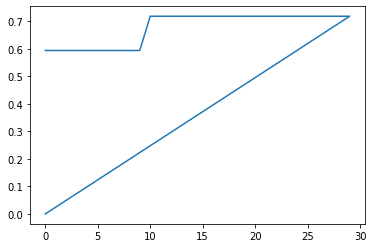

|  30       | -0.5305   |  0.4923   |  96.31    |  2.854    |  2.801    |  0.08443  |  1.831    |  0.1823   |  1.087e+0 |  1.68     |  0.2829   |  46.39    |  0.6069   |  0.3722   |  2.625    |  0.1849   |  3.099    |  3.161    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

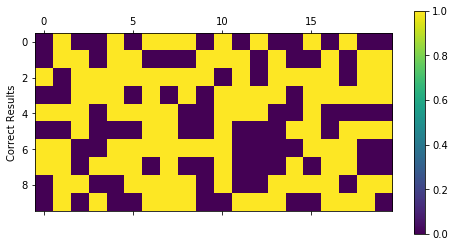

Final percentage:  tensor(0.5131)
Last epoch:  36


Best Score So Far:  tensor(-0.7188)


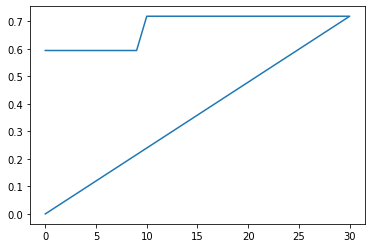

|  31       | -0.5131   |  1.143    |  90.64    |  1.113    |  0.6842   |  0.06641  |  0.9895   |  0.4152   |  1.175e+0 |  2.706    |  0.8971   |  209.5    |  0.5942   |  0.8784   |  2.794    |  0.595    |  1.097    |  1.841    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

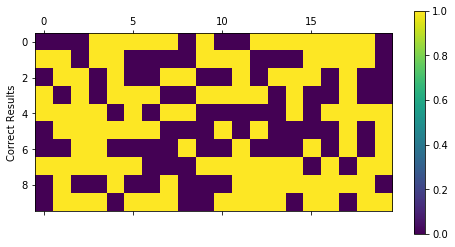

Final percentage:  tensor(0.5000)
Last epoch:  29


Best Score So Far:  tensor(-0.7188)


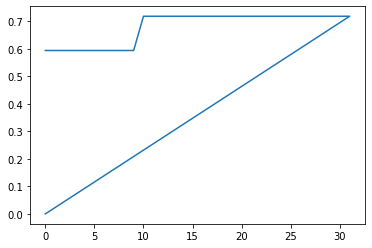

|  32       | -0.5      |  0.1301   |  116.7    |  1.747    |  2.916    |  0.0168   |  1.936    |  0.614    |  1.824e+0 |  2.892    |  0.6019   |  123.1    |  0.01411  |  0.3177   |  1.979    |  0.7294   |  2.401    |  5.112    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

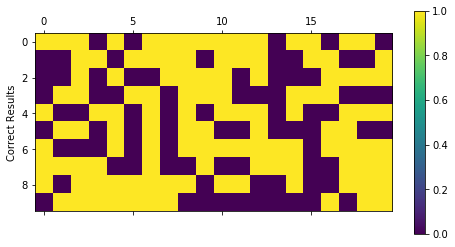

Final percentage:  tensor(0.6005)
Last epoch:  39


Best Score So Far:  tensor(-0.7188)


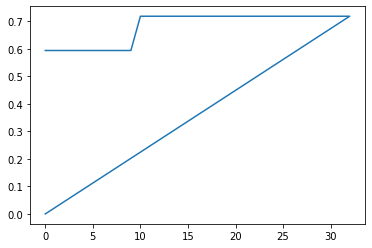

|  33       | -0.6005   |  0.2739   |  4.766    |  2.509    |  0.9567   |  0.09844  |  0.4383   |  0.271    |  1.524e+0 |  3.257    |  0.4175   |  33.7     |  0.3129   |  0.4541   |  2.341    |  0.7694   |  1.39     |  1.206    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

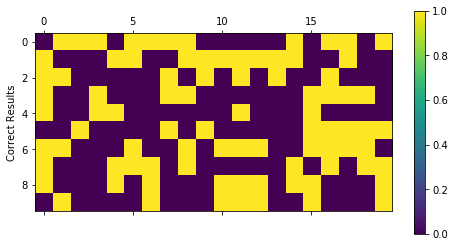

Final percentage:  tensor(0.4986)
Last epoch:  602


Best Score So Far:  tensor(-0.7188)


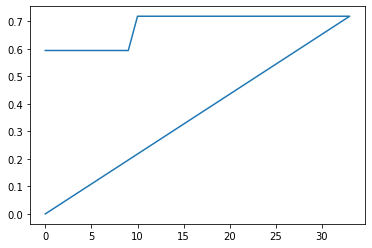

|  34       | -0.4986   |  1.033    |  207.7    |  1.025    |  2.011    |  0.06868  |  0.894    |  0.7318   |  1.644e+0 |  1.016    |  0.436    |  220.3    |  0.8297   |  0.5842   |  2.341    |  0.5779   |  1.82     |  6.039    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

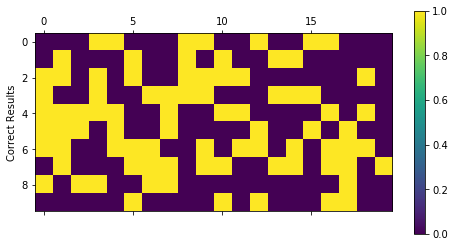

Final percentage:  tensor(0.4783)
Last epoch:  23


Best Score So Far:  tensor(-0.7188)


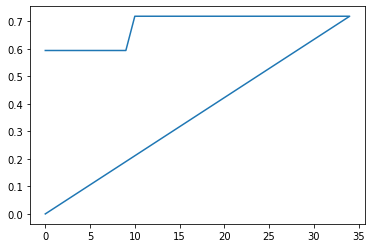

|  35       | -0.4783   |  1.337    |  91.52    |  2.703    |  0.5832   |  0.07473  |  0.5763   |  0.619    |  1.428e+0 |  3.415    |  0.3182   |  56.28    |  0.7667   |  0.2778   |  2.459    |  0.7437   |  1.662    |  2.925    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

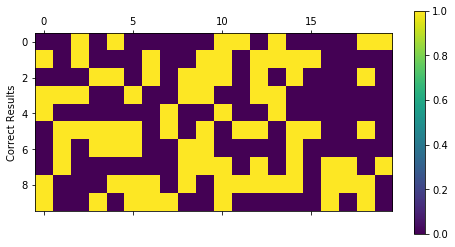

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


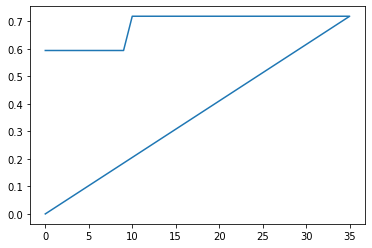

|  36       | -0.5      |  0.3959   |  38.2     |  1.75     |  0.07962  |  0.01109  |  1.342    |  0.6398   |  1.081e+0 |  1.693    |  0.1869   |  235.0    |  0.7109   |  0.4985   |  1.606    |  0.834    |  2.302    |  9.302    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

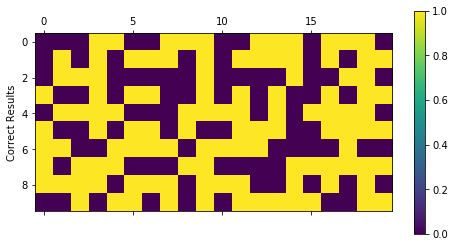

Final percentage:  tensor(0.5000)
Last epoch:  222


Best Score So Far:  tensor(-0.7188)


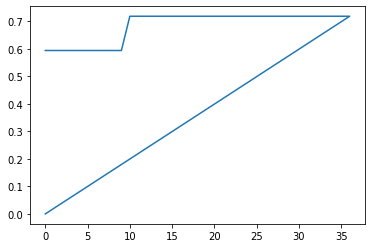

|  37       | -0.5      |  1.405    |  123.4    |  1.251    |  2.918    |  0.01598  |  0.4032   |  0.3449   |  1.404e+0 |  1.439    |  0.6564   |  49.94    |  0.6436   |  0.6789   |  1.419    |  0.6004   |  3.239    |  6.738    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

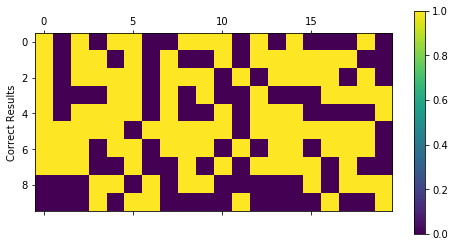

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


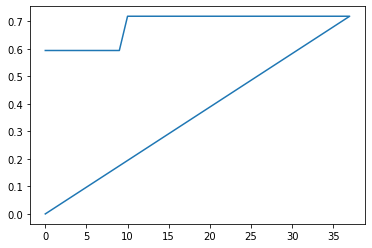

|  38       | -0.5      |  1.188    |  77.05    |  2.456    |  2.826    |  0.04256  |  1.557    |  0.04491  |  1.835e+0 |  1.575    |  0.3556   |  78.22    |  0.08094  |  0.8142   |  1.737    |  0.5302   |  2.477    |  2.188    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

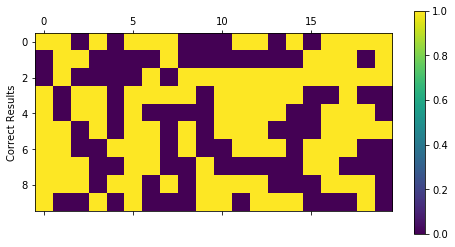

Final percentage:  tensor(0.4970)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


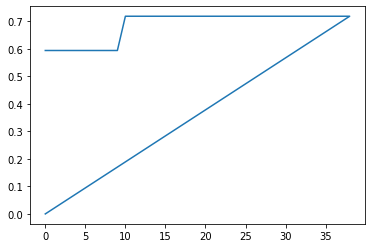

|  39       | -0.497    |  0.4108   |  21.35    |  2.011    |  0.782    |  0.03571  |  0.2151   |  0.63     |  1.107e+0 |  3.947    |  0.1595   |  147.4    |  0.04576  |  0.7084   |  1.377    |  0.5274   |  3.213    |  2.348    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

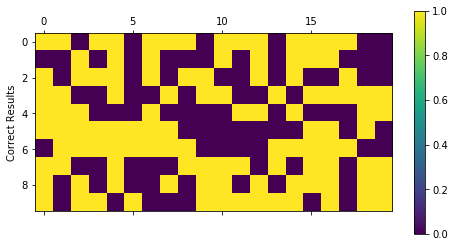

Final percentage:  tensor(0.5000)
Last epoch:  33


Best Score So Far:  tensor(-0.7188)


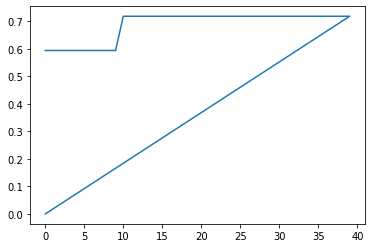

|  40       | -0.5      |  1.097    |  57.02    |  2.511    |  2.162    |  0.01765  |  1.715    |  0.01582  |  1.86e+03 |  2.671    |  0.3629   |  194.7    |  0.7165   |  0.8886   |  1.553    |  0.00379  |  3.792    |  8.712    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

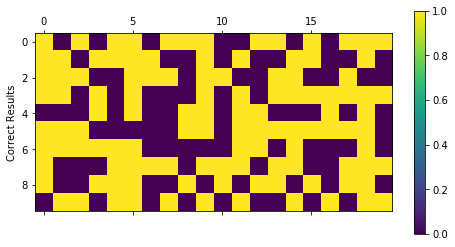

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


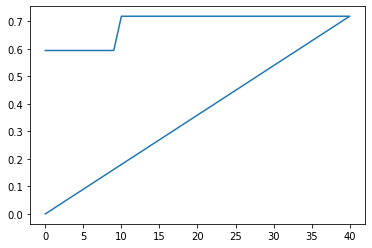

|  41       | -0.5      |  1.45     |  133.2    |  2.407    |  2.334    |  0.03749  |  1.533    |  0.6005   |  1.613e+0 |  2.202    |  0.6276   |  2.791    |  0.7743   |  0.8068   |  1.476    |  0.1206   |  1.659    |  3.716    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

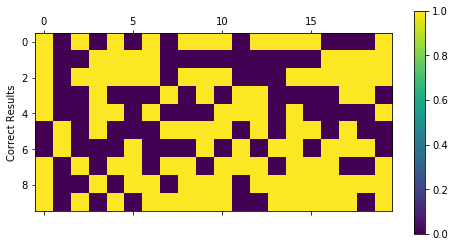

Final percentage:  tensor(0.5000)
Last epoch:  174


Best Score So Far:  tensor(-0.7188)


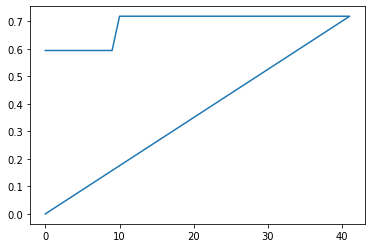

|  42       | -0.5      |  1.757    |  140.0    |  1.571    |  0.4137   |  0.02901  |  1.222    |  0.2593   |  1.457e+0 |  2.328    |  0.7453   |  110.3    |  0.346    |  0.6075   |  1.441    |  0.4668   |  1.941    |  6.635    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

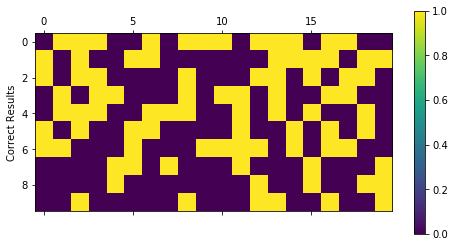

Final percentage:  tensor(0.4942)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


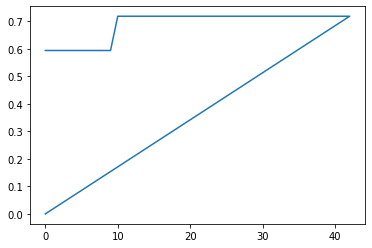

|  43       | -0.4942   |  1.746    |  115.7    |  2.561    |  1.366    |  0.06562  |  0.2624   |  0.3464   |  1.909e+0 |  2.81     |  0.6901   |  130.2    |  0.4981   |  0.7586   |  1.135    |  0.5727   |  3.819    |  5.656    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

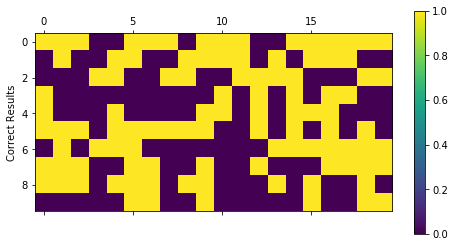

Final percentage:  tensor(0.5630)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


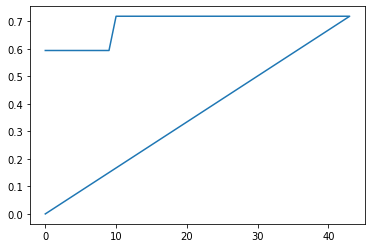

|  44       | -0.563    |  0.387    |  217.4    |  1.501    |  2.095    |  0.05403  |  1.888    |  0.4995   |  1.838e+0 |  1.024    |  0.8904   |  21.74    |  0.3225   |  0.8515   |  1.018    |  0.8219   |  3.575    |  4.954    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

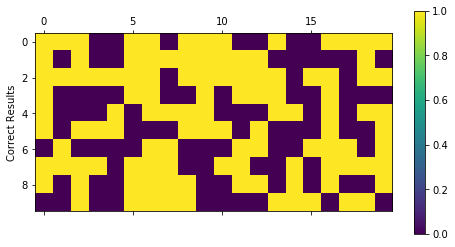

Final percentage:  tensor(0.5000)
Last epoch:  45


Best Score So Far:  tensor(-0.7188)


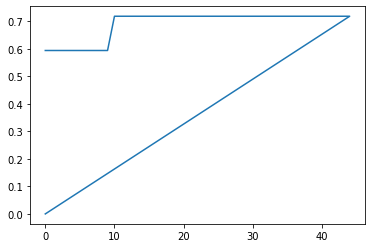

|  45       | -0.5      |  0.5089   |  205.9    |  1.951    |  0.4017   |  0.09278  |  1.783    |  0.3932   |  1.857e+0 |  2.252    |  0.6151   |  103.1    |  0.5057   |  0.1706   |  2.92     |  0.2939   |  1.309    |  2.297    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

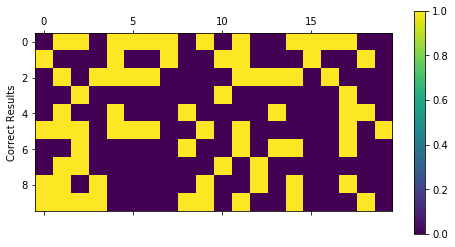

Final percentage:  tensor(0.3745)
Last epoch:  58


Best Score So Far:  tensor(-0.7188)


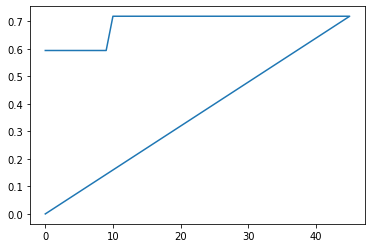

|  46       | -0.3745   |  0.02804  |  183.9    |  2.123    |  2.376    |  0.05071  |  1.576    |  0.5566   |  1.778e+0 |  2.215    |  0.583    |  47.67    |  0.3222   |  0.1553   |  1.813    |  0.2412   |  2.217    |  9.767    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

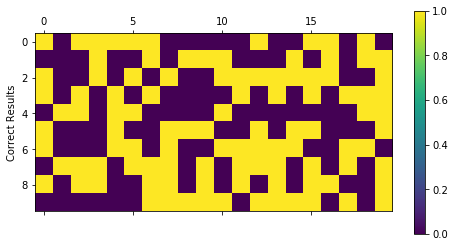

Final percentage:  tensor(0.5189)
Last epoch:  45


Best Score So Far:  tensor(-0.7188)


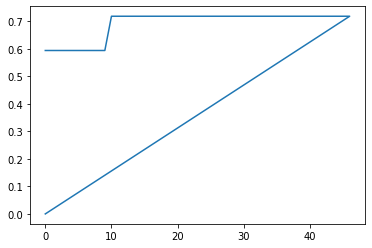

|  47       | -0.5189   |  0.6374   |  251.6    |  2.266    |  1.122    |  0.08575  |  1.233    |  0.2016   |  1.793e+0 |  2.294    |  0.3218   |  85.89    |  0.697    |  0.2418   |  2.608    |  0.295    |  2.627    |  5.386    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

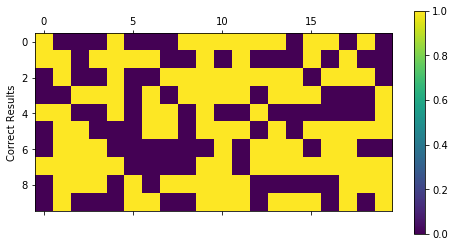

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


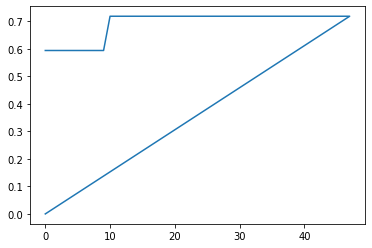

|  48       | -0.5      |  1.702    |  227.7    |  1.367    |  1.75     |  0.08982  |  0.8878   |  0.7375   |  1.279e+0 |  2.82     |  0.6142   |  59.96    |  0.01474  |  0.3751   |  2.868    |  0.3427   |  3.331    |  2.571    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

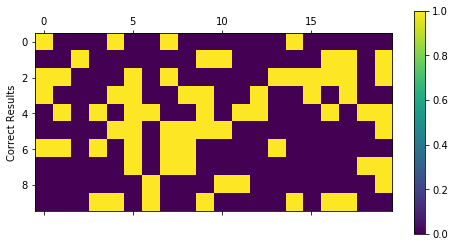

Final percentage:  tensor(0.3782)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


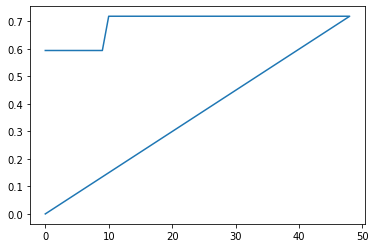

|  49       | -0.3782   |  0.6805   |  38.73    |  2.426    |  2.091    |  0.06885  |  0.5043   |  0.5539   |  1.227e+0 |  2.27     |  0.3347   |  92.25    |  0.05854  |  0.5685   |  2.408    |  0.613    |  2.938    |  2.528    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

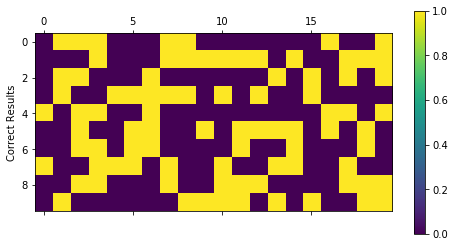

Final percentage:  tensor(0.4942)
Last epoch:  34


Best Score So Far:  tensor(-0.7188)


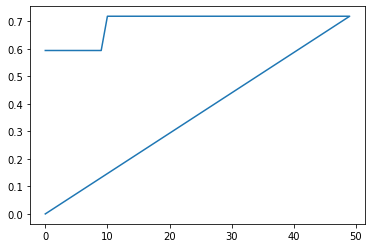

|  50       | -0.4942   |  0.2974   |  132.6    |  2.742    |  0.55     |  0.04628  |  0.8536   |  0.3978   |  1.162e+0 |  2.024    |  0.2357   |  216.5    |  0.7997   |  0.384    |  2.208    |  0.1453   |  2.524    |  3.67     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

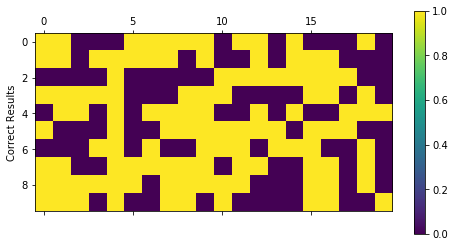

Final percentage:  tensor(0.5000)
Last epoch:  596


Best Score So Far:  tensor(-0.7188)


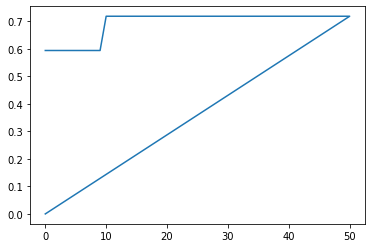

|  51       | -0.5      |  1.711    |  172.6    |  2.261    |  0.373    |  0.04706  |  1.963    |  0.7586   |  1.645e+0 |  1.454    |  0.5752   |  145.7    |  0.4687   |  0.3852   |  2.193    |  0.8491   |  3.246    |  6.208    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

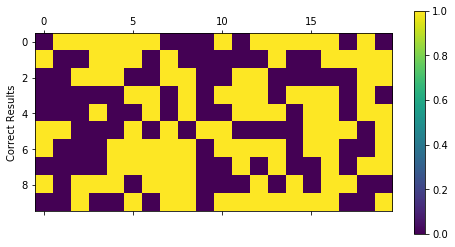

Final percentage:  tensor(0.4765)
Last epoch:  23


Best Score So Far:  tensor(-0.7188)


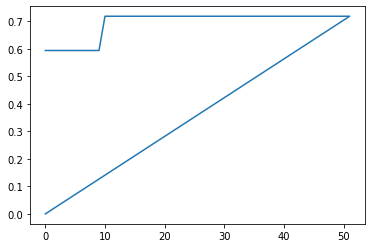

|  52       | -0.4765   |  1.84     |  18.44    |  2.973    |  0.1585   |  0.01995  |  0.8413   |  0.08601  |  1.624e+0 |  1.143    |  0.2562   |  17.5     |  0.7031   |  0.6016   |  1.753    |  0.188    |  3.234    |  4.06     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

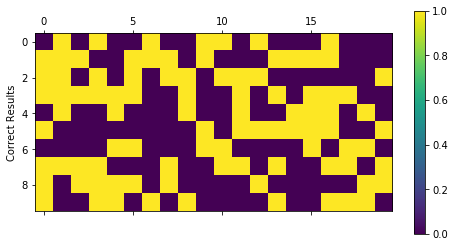

Final percentage:  tensor(0.5193)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


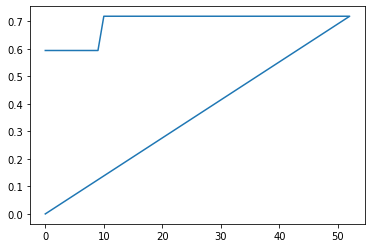

|  53       | -0.5193   |  1.583    |  125.9    |  2.046    |  0.08519  |  0.06442  |  0.6978   |  0.1834   |  1.434e+0 |  2.144    |  0.4228   |  250.8    |  0.3646   |  0.697    |  2.1      |  0.8882   |  2.061    |  3.207    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

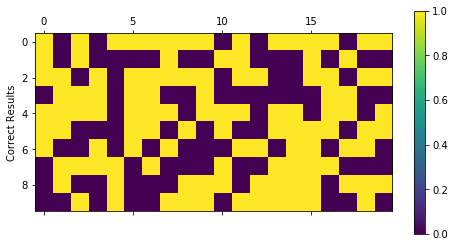

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


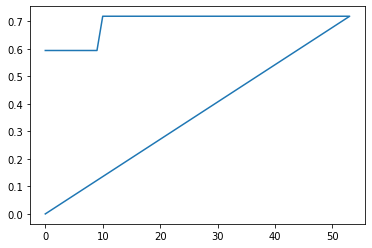

|  54       | -0.5      |  1.813    |  13.06    |  2.892    |  1.664    |  0.03764  |  1.98     |  0.04669  |  1.517e+0 |  1.093    |  0.5141   |  47.84    |  0.6307   |  0.8828   |  2.741    |  0.4514   |  3.118    |  7.989    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

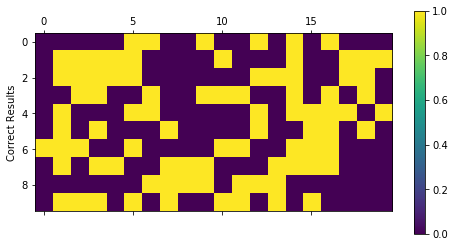

Final percentage:  tensor(0.5000)
Last epoch:  119


Best Score So Far:  tensor(-0.7188)


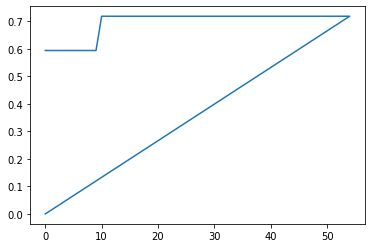

|  55       | -0.5      |  0.9847   |  136.2    |  1.3      |  1.105    |  0.01422  |  1.447    |  0.3816   |  1.449e+0 |  3.649    |  0.4749   |  105.9    |  0.2694   |  0.06481  |  1.832    |  0.02573  |  1.871    |  5.527    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

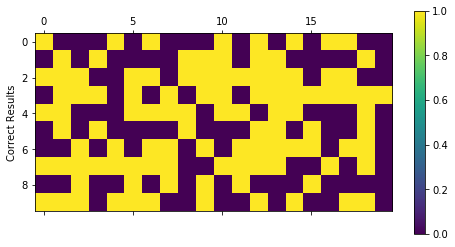

Final percentage:  tensor(0.5677)
Last epoch:  106


Best Score So Far:  tensor(-0.7188)


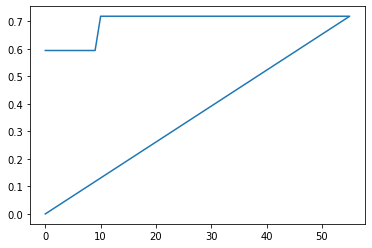

|  56       | -0.5677   |  1.922    |  29.78    |  2.339    |  1.495    |  0.07771  |  0.2858   |  0.06656  |  1.399e+0 |  3.383    |  0.1725   |  197.0    |  0.2907   |  0.1952   |  1.033    |  0.3983   |  2.139    |  6.928    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

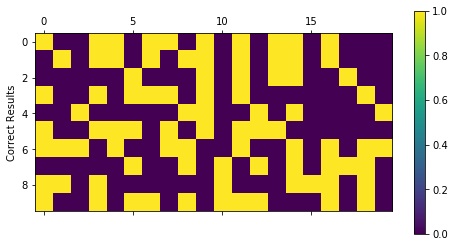

Final percentage:  tensor(0.5000)
Last epoch:  47


Best Score So Far:  tensor(-0.7188)


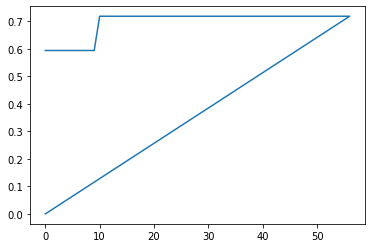

|  57       | -0.5      |  0.1411   |  40.76    |  1.033    |  0.3403   |  0.06518  |  0.8013   |  0.2568   |  1.558e+0 |  3.97     |  0.751    |  179.7    |  0.9174   |  0.03576  |  1.14     |  0.4735   |  2.044    |  9.426    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

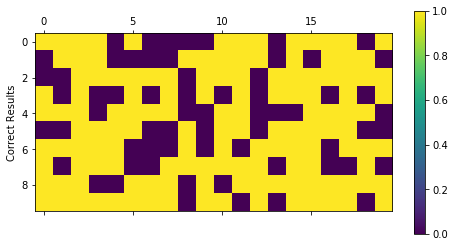

Final percentage:  tensor(0.6707)
Last epoch:  28


Best Score So Far:  tensor(-0.7188)


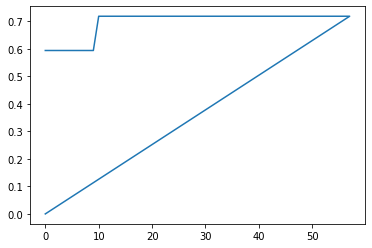

|  58       | -0.6707   |  0.9742   |  139.1    |  2.782    |  1.335    |  0.0877   |  0.5046   |  0.219    |  1.328e+0 |  2.637    |  0.1981   |  172.5    |  0.1435   |  0.08469  |  2.732    |  0.2366   |  2.154    |  6.138    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

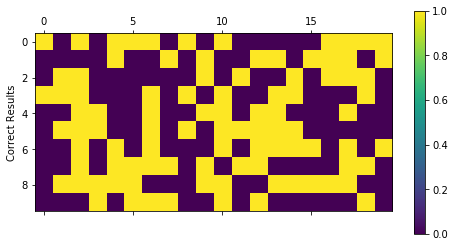

Final percentage:  tensor(0.4408)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


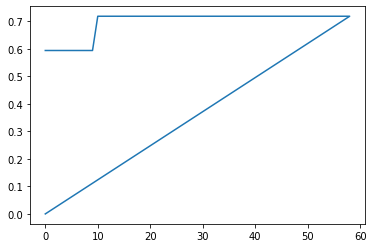

|  59       | -0.4408   |  1.046    |  21.31    |  2.74     |  2.844    |  0.08125  |  0.5648   |  0.4223   |  1.339e+0 |  2.658    |  0.877    |  81.17    |  0.6685   |  0.2934   |  2.541    |  0.3255   |  3.661    |  7.758    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

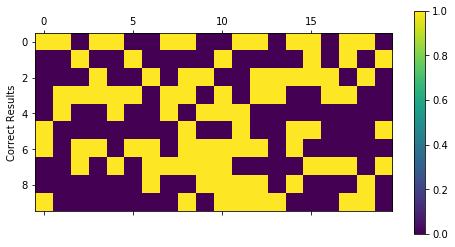

Final percentage:  tensor(0.4089)
Last epoch:  55


Best Score So Far:  tensor(-0.7188)


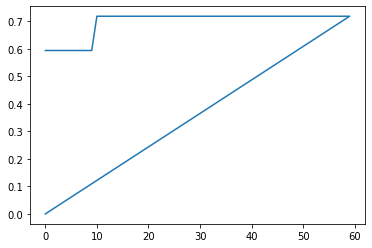

|  60       | -0.4089   |  1.518    |  121.2    |  1.419    |  0.124    |  0.03218  |  0.07385  |  0.5551   |  1.67e+03 |  2.287    |  0.691    |  138.1    |  0.04078  |  0.1213   |  1.385    |  0.3353   |  1.156    |  6.44     |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

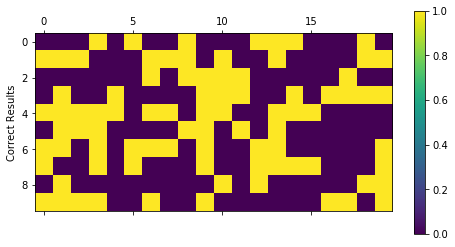

Final percentage:  tensor(0.4942)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


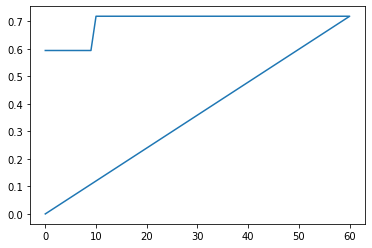

|  61       | -0.4942   |  1.019    |  158.8    |  1.86     |  2.535    |  0.04541  |  0.03065  |  0.6985   |  1.656e+0 |  3.461    |  0.8566   |  14.93    |  0.2356   |  0.05701  |  1.839    |  0.863    |  1.244    |  5.253    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

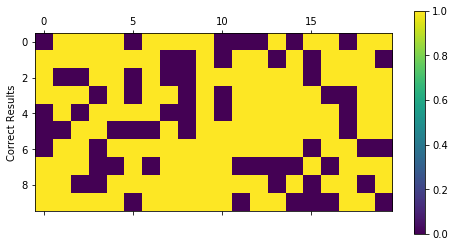

Final percentage:  tensor(0.6724)
Last epoch:  41


Best Score So Far:  tensor(-0.7188)


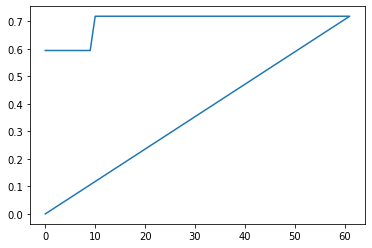

|  62       | -0.6724   |  0.2498   |  198.3    |  2.674    |  0.1294   |  0.04864  |  0.4764   |  0.762    |  1.944e+0 |  2.836    |  0.8761   |  89.59    |  0.8971   |  0.3911   |  1.469    |  0.9399   |  3.046    |  1.584    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

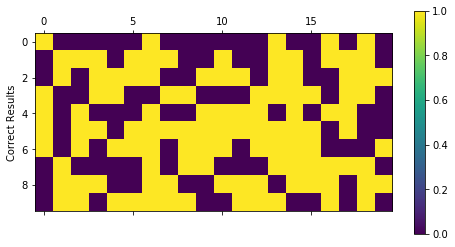

Final percentage:  tensor(0.5000)
Last epoch:  46


Best Score So Far:  tensor(-0.7188)


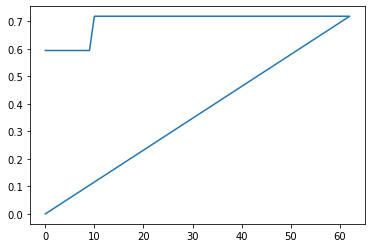

|  63       | -0.5      |  1.732    |  180.2    |  2.204    |  2.19     |  0.02534  |  1.195    |  0.6517   |  1.054e+0 |  1.39     |  0.7582   |  159.1    |  0.5312   |  0.2235   |  1.587    |  0.8718   |  2.261    |  1.579    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

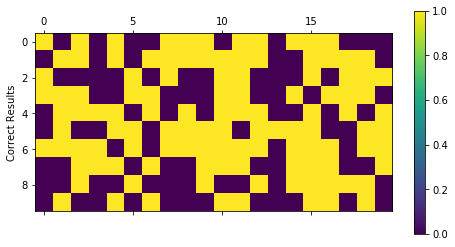

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


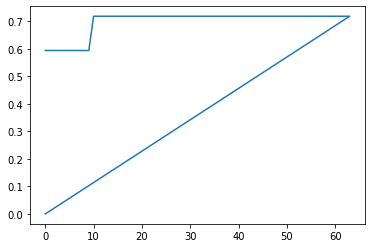

|  64       | -0.5      |  1.785    |  53.66    |  2.644    |  2.636    |  0.04868  |  1.191    |  0.4218   |  1.625e+0 |  3.557    |  0.2539   |  226.5    |  0.5676   |  0.1036   |  1.452    |  0.5954   |  1.716    |  2.181    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

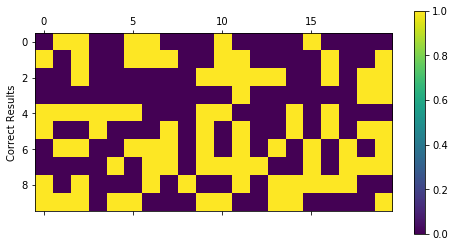

Final percentage:  tensor(0.4402)
Last epoch:  41


Best Score So Far:  tensor(-0.7188)


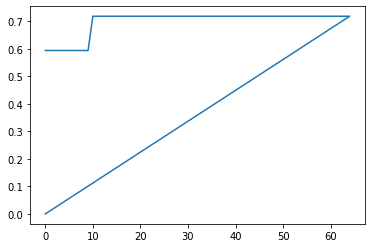

|  65       | -0.4402   |  0.3221   |  216.6    |  2.198    |  2.881    |  0.03457  |  1.185    |  0.4792   |  1.616e+0 |  1.177    |  0.6753   |  242.8    |  0.5346   |  0.1733   |  2.498    |  0.007312 |  1.981    |  9.249    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

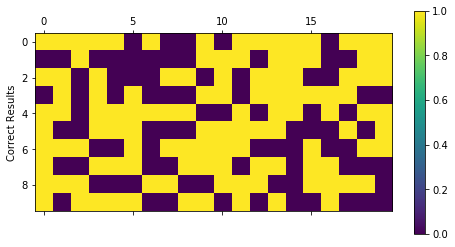

Final percentage:  tensor(0.5174)
Last epoch:  50


Best Score So Far:  tensor(-0.7188)


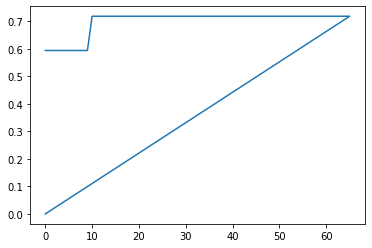

|  66       | -0.5174   |  1.171    |  219.2    |  2.203    |  2.46     |  0.08795  |  0.6388   |  0.09836  |  1.721e+0 |  2.317    |  0.1141   |  151.8    |  0.037    |  0.1802   |  2.569    |  0.01208  |  1.907    |  1.192    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

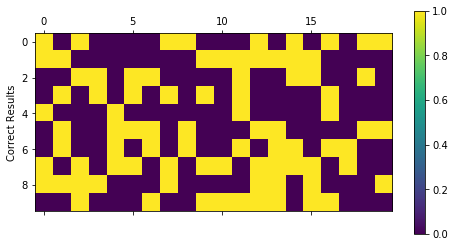

Final percentage:  tensor(0.4942)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


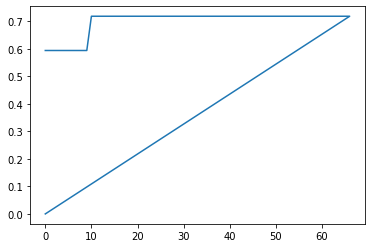

|  67       | -0.4942   |  1.985    |  149.8    |  1.584    |  2.778    |  0.05071  |  0.9048   |  0.4703   |  1.264e+0 |  1.913    |  0.3345   |  64.09    |  0.5844   |  0.6263   |  1.143    |  0.9701   |  3.252    |  8.247    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

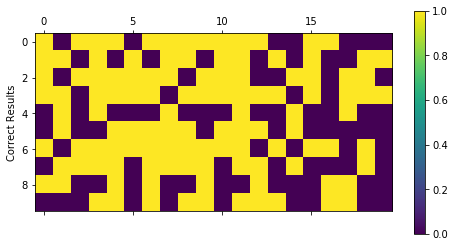

Final percentage:  tensor(0.5916)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


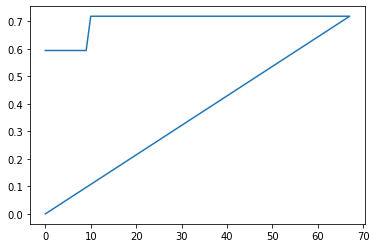

|  68       | -0.5916   |  1.496    |  22.34    |  1.959    |  1.333    |  0.06725  |  0.893    |  0.5635   |  1.682e+0 |  3.084    |  0.5567   |  40.35    |  0.7603   |  0.7029   |  2.799    |  0.2335   |  1.528    |  4.516    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

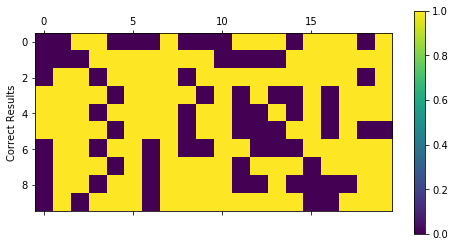

Final percentage:  tensor(0.6189)
Last epoch:  55


Best Score So Far:  tensor(-0.7188)


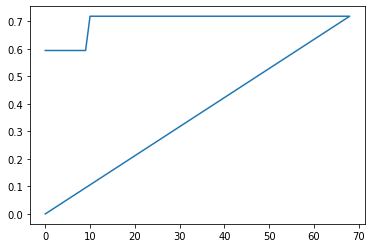

|  69       | -0.6189   |  0.6379   |  209.1    |  2.221    |  2.272    |  0.04277  |  0.1979   |  0.09203  |  1.373e+0 |  1.58     |  0.7387   |  154.3    |  0.6885   |  0.442    |  1.175    |  0.2348   |  2.38     |  2.785    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

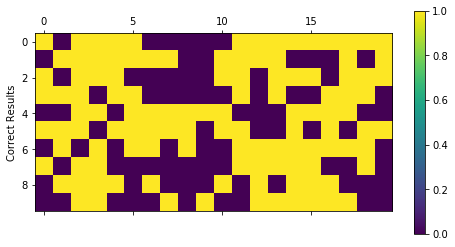

Final percentage:  tensor(0.5446)
Last epoch:  31


Best Score So Far:  tensor(-0.7188)


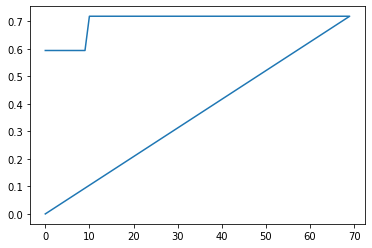

|  70       | -0.5446   |  0.0507   |  187.3    |  2.443    |  0.9879   |  0.08435  |  0.8526   |  0.6917   |  1.657e+0 |  2.737    |  0.1807   |  136.5    |  0.8936   |  0.2745   |  2.733    |  0.9078   |  1.986    |  7.141    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

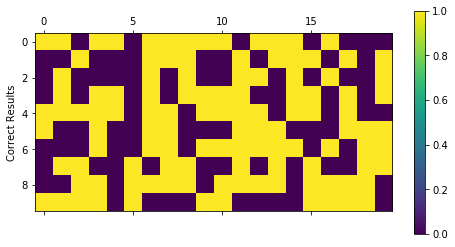

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


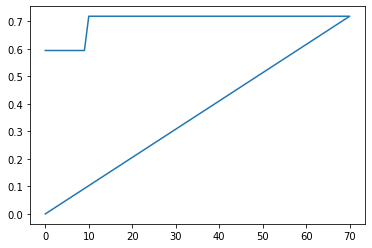

|  71       | -0.5      |  1.789    |  21.23    |  2.748    |  0.5706   |  0.08498  |  1.328    |  0.2755   |  1.151e+0 |  2.9      |  0.763    |  210.7    |  0.628    |  0.8607   |  2.174    |  0.1976   |  2.284    |  4.027    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

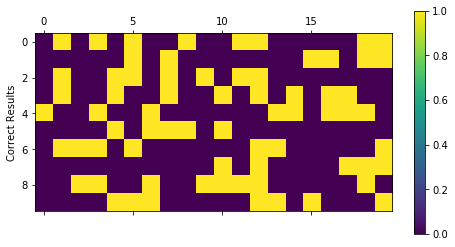

Final percentage:  tensor(0.3855)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


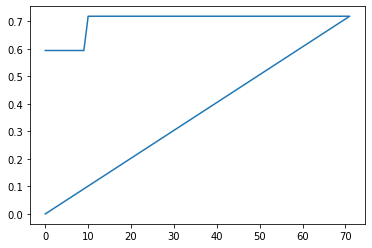

|  72       | -0.3855   |  1.974    |  98.58    |  2.975    |  1.551    |  0.01723  |  0.1484   |  0.2962   |  1.123e+0 |  2.897    |  0.3725   |  253.7    |  0.9291   |  0.1343   |  1.786    |  0.4611   |  2.677    |  8.015    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

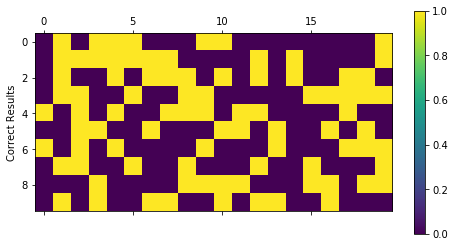

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7188)


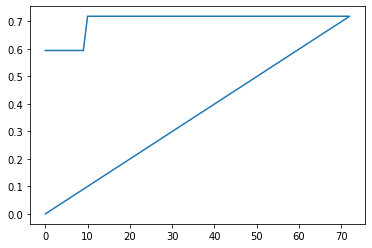

|  73       | -0.5      |  0.9695   |  108.7    |  1.521    |  2.723    |  0.002227 |  1.634    |  0.1508   |  1.686e+0 |  2.062    |  0.8768   |  33.18    |  0.1882   |  0.8005   |  2.161    |  0.3089   |  1.002    |  3.046    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

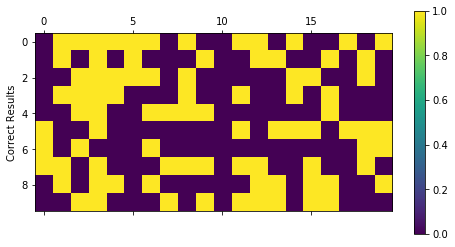

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


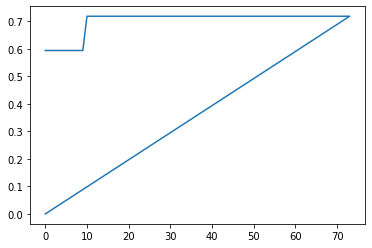

|  74       | -0.5      |  0.2894   |  53.67    |  2.784    |  2.611    |  0.07003  |  0.9363   |  0.6617   |  1.496e+0 |  2.087    |  0.2481   |  236.9    |  0.3872   |  0.4436   |  1.506    |  0.8841   |  2.146    |  3.675    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

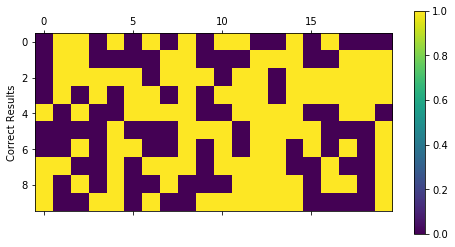

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


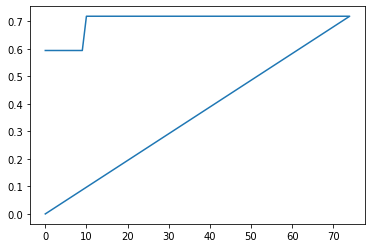

|  75       | -0.5      |  1.428    |  50.48    |  1.235    |  2.503    |  0.07441  |  1.175    |  0.1943   |  1.623e+0 |  2.909    |  0.2948   |  19.14    |  0.8798   |  0.414    |  2.52     |  0.2536   |  2.768    |  4.855    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


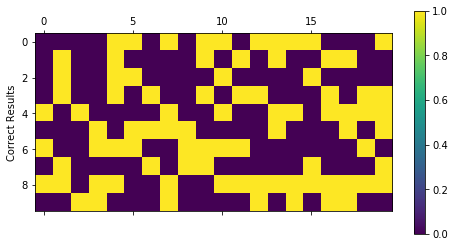

Final percentage:  tensor(0.5000)
Last epoch:  30


Best Score So Far:  tensor(-0.7188)


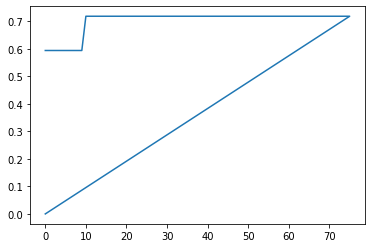

|  76       | -0.5      |  0.7604   |  34.19    |  1.486    |  0.2372   |  0.03029  |  1.476    |  0.492    |  1.672e+0 |  1.025    |  0.6105   |  129.8    |  0.2314   |  0.1574   |  1.368    |  0.8434   |  3.938    |  9.215    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

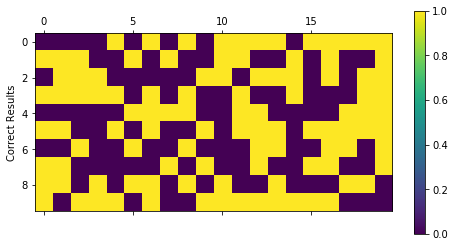

Final percentage:  tensor(0.4977)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


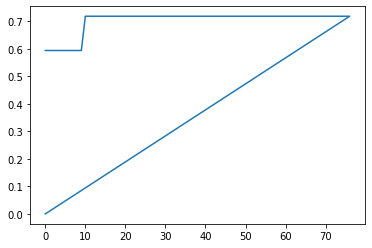

|  77       | -0.4977   |  0.6913   |  200.2    |  2.087    |  2.441    |  0.04837  |  1.174    |  0.6298   |  1.1e+03  |  2.606    |  0.3294   |  155.5    |  0.9579   |  0.3535   |  1.782    |  0.7898   |  2.929    |  4.541    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

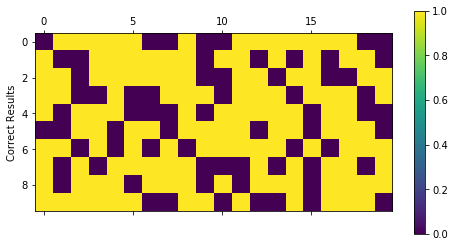

Final percentage:  tensor(0.6575)
Last epoch:  35


Best Score So Far:  tensor(-0.7188)


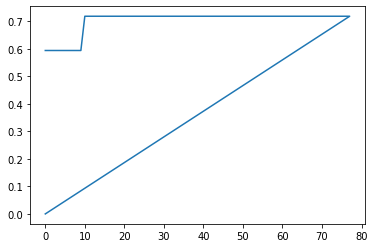

|  78       | -0.6575   |  1.371    |  104.6    |  1.271    |  1.347    |  0.03344  |  0.4338   |  0.7406   |  1.69e+03 |  2.79     |  0.672    |  139.7    |  0.7001   |  0.8375   |  2.717    |  0.1673   |  1.787    |  1.644    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

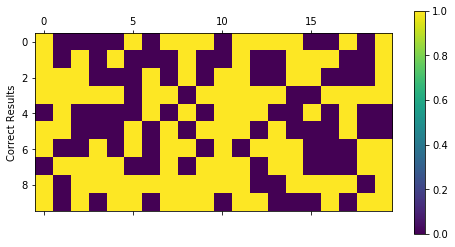

Final percentage:  tensor(0.5000)
Last epoch:  196


Best Score So Far:  tensor(-0.7188)


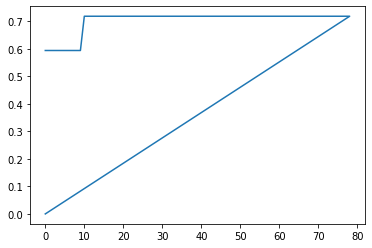

|  79       | -0.5      |  1.948    |  62.04    |  2.315    |  0.268    |  0.02108  |  1.001    |  0.08396  |  1.389e+0 |  2.609    |  0.3053   |  143.2    |  0.5367   |  0.3515   |  2.386    |  0.6778   |  3.055    |  6.048    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

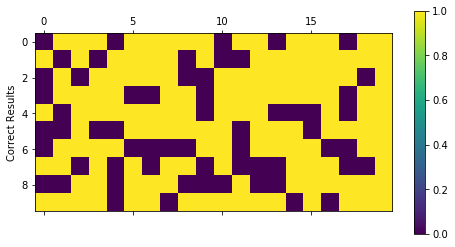

Final percentage:  tensor(0.6925)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


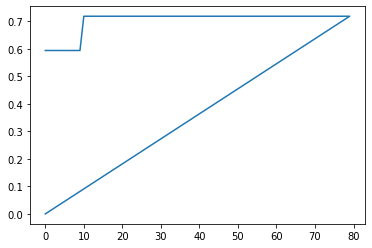

|  80       | -0.6925   |  0.7126   |  157.7    |  2.862    |  1.785    |  0.09796  |  0.8776   |  0.5917   |  1.038e+0 |  3.287    |  0.4665   |  3.35     |  0.2776   |  0.4813   |  2.528    |  0.05304  |  2.642    |  8.201    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

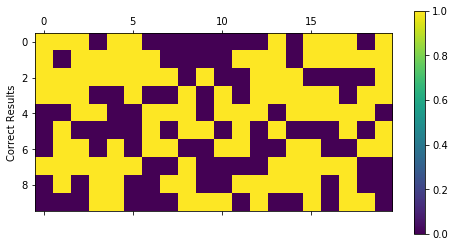

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


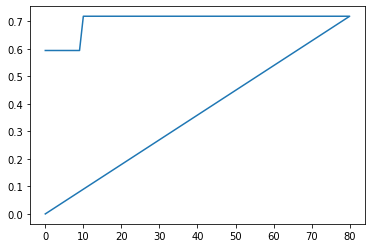

|  81       | -0.5      |  1.293    |  238.6    |  1.149    |  0.8277   |  0.09192  |  1.522    |  0.4798   |  1.833e+0 |  3.679    |  0.8754   |  255.6    |  0.1404   |  0.06349  |  1.146    |  0.01473  |  3.906    |  1.852    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

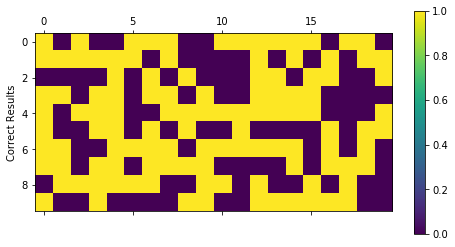

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


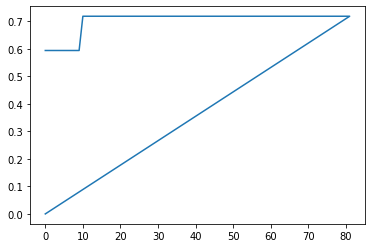

|  82       | -0.5      |  1.675    |  176.0    |  1.97     |  1.037    |  0.03536  |  0.5051   |  0.7288   |  1.726e+0 |  1.078    |  0.4154   |  73.45    |  0.02991  |  0.7962   |  2.534    |  0.3294   |  3.382    |  3.918    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

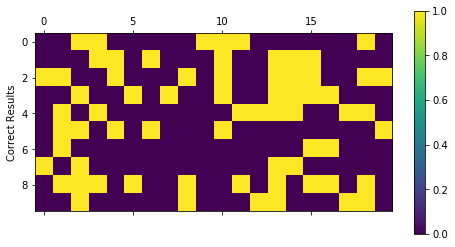

Final percentage:  tensor(0.3925)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


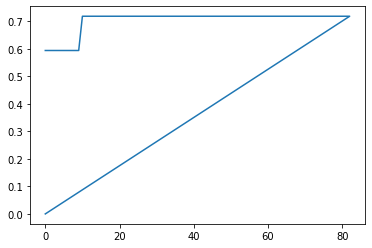

|  83       | -0.3925   |  0.6127   |  237.7    |  2.944    |  1.565    |  0.09519  |  1.767    |  0.4144   |  1.373e+0 |  3.124    |  0.4101   |  155.7    |  0.9894   |  0.6965   |  1.665    |  0.08891  |  1.553    |  5.736    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

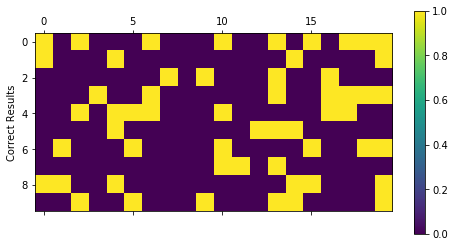

Final percentage:  tensor(0.2870)
Last epoch:  1036


Best Score So Far:  tensor(-0.7188)


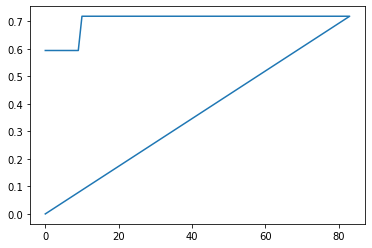

|  84       | -0.287    |  0.83     |  205.4    |  2.857    |  0.5318   |  0.08601  |  1.905    |  0.7676   |  1.038e+0 |  1.172    |  0.005228 |  81.42    |  0.05659  |  0.2645   |  1.708    |  0.9527   |  2.426    |  3.501    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

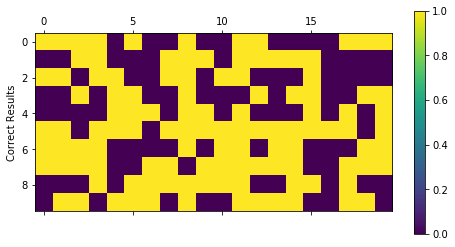

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


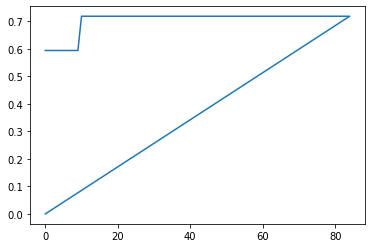

|  85       | -0.5      |  1.001    |  165.4    |  1.221    |  2.267    |  0.08519  |  1.68     |  0.7124   |  1.382e+0 |  2.327    |  0.09143  |  59.35    |  0.9704   |  0.2562   |  2.806    |  0.8897   |  3.758    |  2.404    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

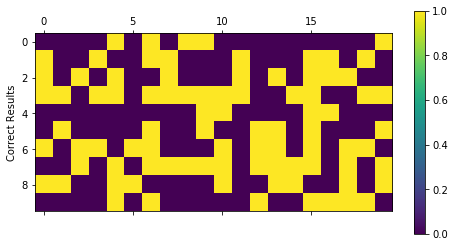

Final percentage:  tensor(0.4801)
Last epoch:  25


Best Score So Far:  tensor(-0.7188)


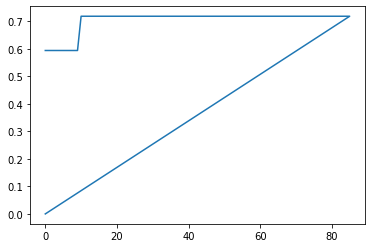

|  86       | -0.4801   |  1.751    |  162.5    |  1.419    |  1.032    |  0.01599  |  0.8843   |  0.06702  |  1.165e+0 |  1.59     |  0.6219   |  147.7    |  0.8726   |  0.2202   |  2.253    |  0.0344   |  2.543    |  8.76     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

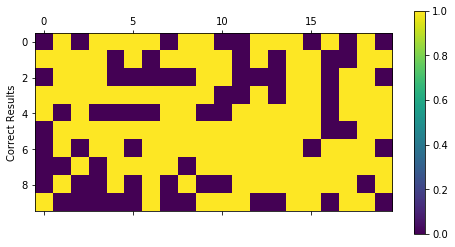

Final percentage:  tensor(0.6489)
Last epoch:  26


Best Score So Far:  tensor(-0.7188)


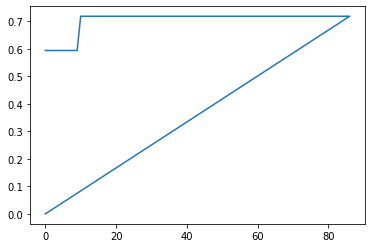

|  87       | -0.6489   |  1.958    |  4.508    |  1.503    |  0.6693   |  0.004754 |  0.02024  |  0.3922   |  1.045e+0 |  1.832    |  0.576    |  76.85    |  0.2701   |  0.5315   |  1.757    |  0.7018   |  2.483    |  6.693    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

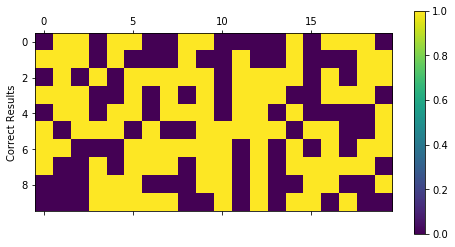

Final percentage:  tensor(0.5443)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


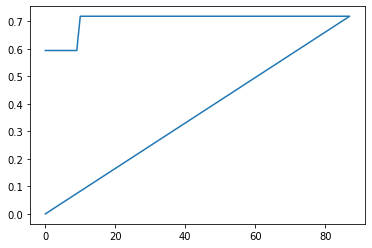

|  88       | -0.5443   |  0.7033   |  74.91    |  1.265    |  2.802    |  0.08048  |  1.867    |  0.1483   |  1.933e+0 |  3.798    |  0.2552   |  71.76    |  0.5513   |  0.1668   |  1.88     |  0.1851   |  3.833    |  5.439    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

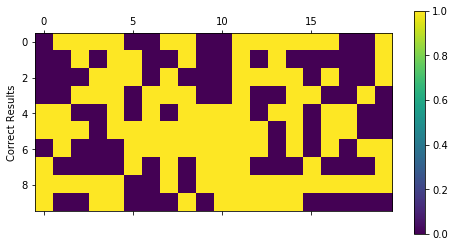

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7188)


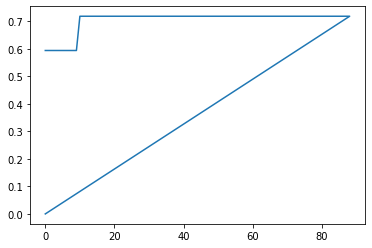

|  89       | -0.5      |  1.918    |  165.8    |  1.964    |  2.893    |  0.01432  |  1.258    |  0.5295   |  1.434e+0 |  1.177    |  0.4435   |  120.1    |  0.8061   |  0.231    |  1.779    |  0.2399   |  3.052    |  9.899    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

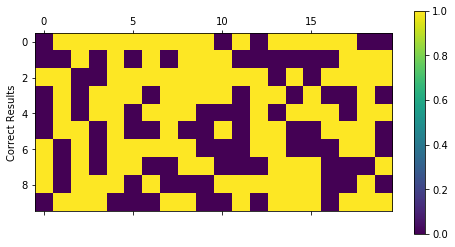

Final percentage:  tensor(0.5348)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


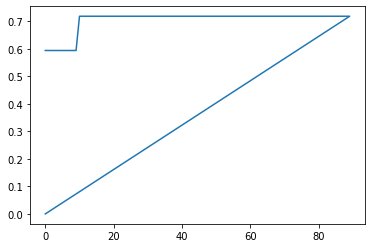

|  90       | -0.5348   |  0.3531   |  210.6    |  1.46     |  0.1733   |  0.01388  |  1.861    |  0.7108   |  1.289e+0 |  3.834    |  0.7649   |  112.4    |  0.4681   |  0.5669   |  1.314    |  0.01477  |  1.794    |  1.139    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

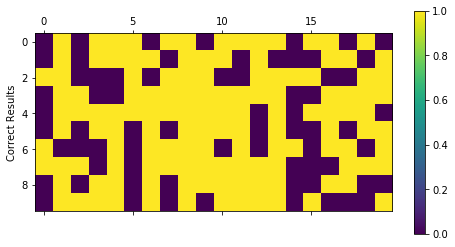

Final percentage:  tensor(0.6203)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


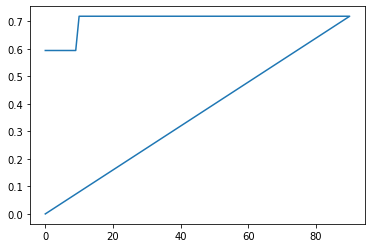

|  91       | -0.6203   |  1.342    |  142.1    |  1.64     |  2.333    |  0.01458  |  0.4873   |  0.2339   |  1.196e+0 |  1.263    |  0.783    |  24.4     |  0.6833   |  0.1084   |  1.021    |  0.5567   |  3.712    |  8.736    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

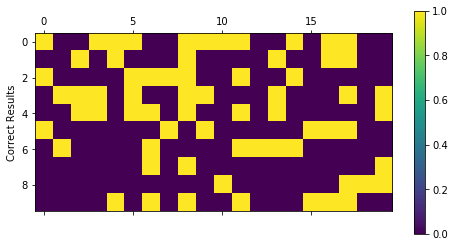

Final percentage:  tensor(0.3224)
Last epoch:  22


Best Score So Far:  tensor(-0.7188)


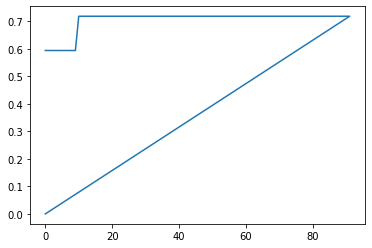

|  92       | -0.3224   |  0.6735   |  8.898    |  2.594    |  2.41     |  0.08685  |  1.333    |  0.6462   |  1.897e+0 |  2.357    |  0.502    |  130.6    |  0.6916   |  0.6146   |  2.035    |  0.8276   |  2.512    |  8.415    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

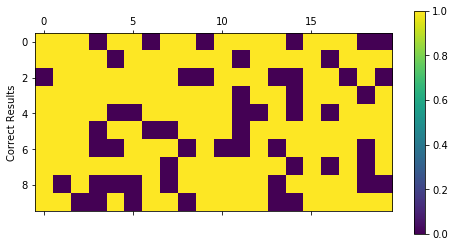

Final percentage:  tensor(0.7403)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


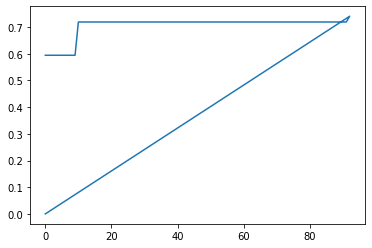

|  93       | -0.7403   |  0.5609   |  47.34    |  2.93     |  2.218    |  0.02598  |  1.157    |  0.7642   |  1.081e+0 |  1.25     |  0.5572   |  59.02    |  0.7647   |  0.5113   |  2.326    |  0.1077   |  1.252    |  6.62     |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

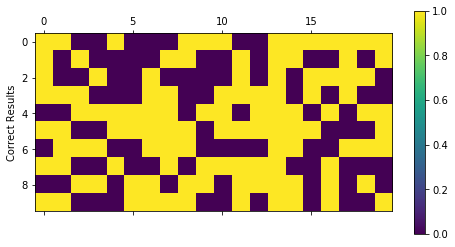

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7403)


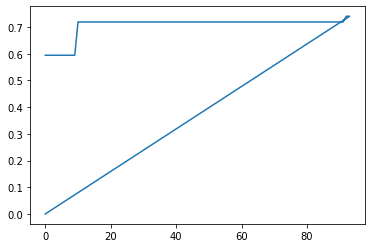

|  94       | -0.5      |  0.8154   |  24.16    |  1.738    |  2.01     |  0.01896  |  1.783    |  0.7599   |  1.962e+0 |  3.183    |  0.3657   |  190.9    |  0.2884   |  0.283    |  2.206    |  0.5943   |  3.627    |  3.289    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

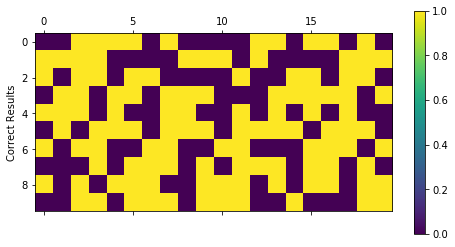

Final percentage:  tensor(0.5000)
Last epoch:  34


Best Score So Far:  tensor(-0.7403)


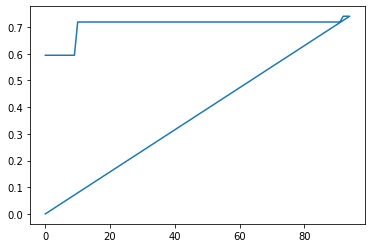

|  95       | -0.5      |  1.525    |  241.0    |  1.002    |  1.424    |  0.0657   |  1.678    |  0.147    |  1.856e+0 |  2.089    |  0.803    |  9.039    |  0.08622  |  0.8833   |  2.213    |  0.4172   |  1.506    |  6.843    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

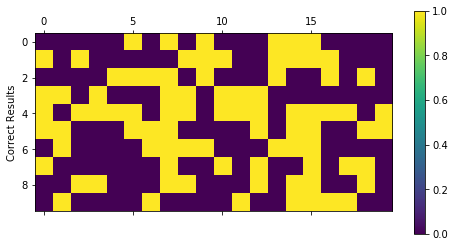

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


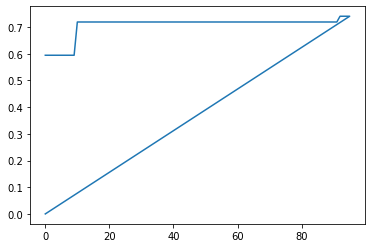

|  96       | -0.5      |  0.07358  |  81.15    |  1.644    |  1.816    |  0.06508  |  1.684    |  0.7421   |  1.66e+03 |  2.729    |  0.3589   |  247.5    |  0.1548   |  0.8056   |  1.619    |  0.5479   |  3.039    |  3.126    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

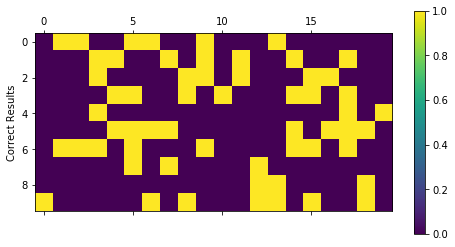

Final percentage:  tensor(0.2887)
Last epoch:  324


Best Score So Far:  tensor(-0.7403)


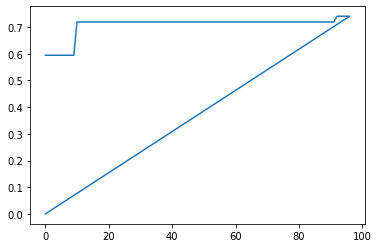

|  97       | -0.2887   |  0.3338   |  131.2    |  2.576    |  2.07     |  0.0119   |  1.792    |  0.3838   |  1.947e+0 |  2.655    |  0.07633  |  53.43    |  0.8535   |  0.6353   |  2.781    |  0.3288   |  2.579    |  6.847    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

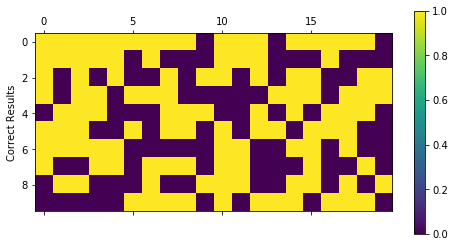

Final percentage:  tensor(0.5000)
Last epoch:  128


Best Score So Far:  tensor(-0.7403)


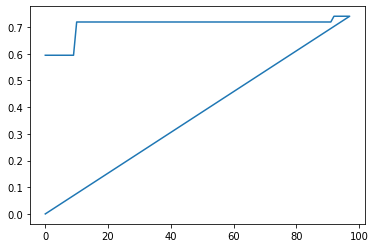

|  98       | -0.5      |  1.183    |  60.79    |  1.849    |  0.7419   |  0.08456  |  1.963    |  0.05326  |  1.714e+0 |  1.987    |  0.5629   |  67.56    |  0.6507   |  0.334    |  1.587    |  0.9109   |  3.818    |  6.516    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

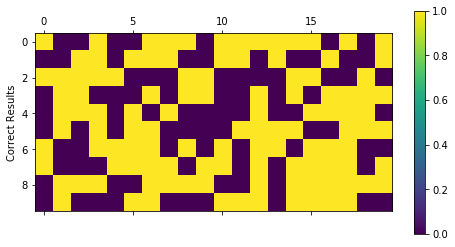

Final percentage:  tensor(0.6000)
Last epoch:  22


Best Score So Far:  tensor(-0.7403)


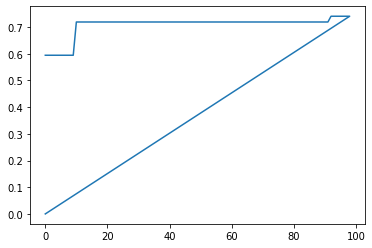

|  99       | -0.6      |  0.4268   |  240.6    |  2.493    |  2.246    |  0.02117  |  1.652    |  0.1921   |  1.632e+0 |  3.125    |  0.6681   |  101.1    |  0.7593   |  0.8126   |  2.169    |  0.09032  |  1.386    |  1.946    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

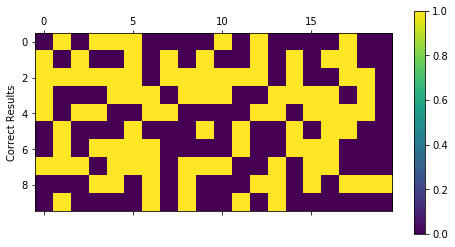

Final percentage:  tensor(0.4754)
Last epoch:  32


Best Score So Far:  tensor(-0.7403)


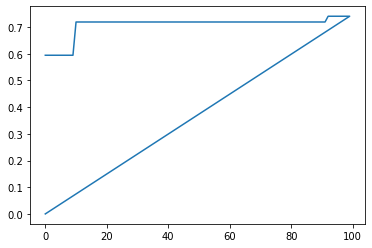

|  100      | -0.4754   |  0.3437   |  34.11    |  2.549    |  0.1178   |  0.02416  |  1.749    |  0.7788   |  1.605e+0 |  3.919    |  0.03912  |  242.9    |  0.3117   |  0.7191   |  2.613    |  0.8591   |  2.371    |  9.366    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

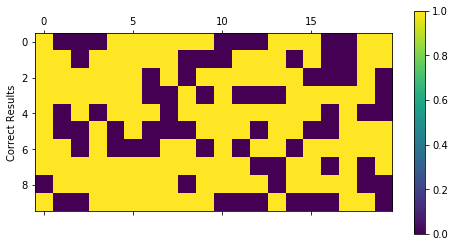

Final percentage:  tensor(0.6118)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


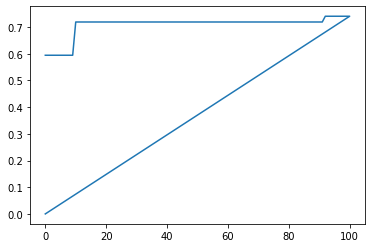

|  101      | -0.6118   |  0.5132   |  239.3    |  2.232    |  2.946    |  0.003264 |  1.443    |  0.4524   |  1.492e+0 |  1.775    |  0.2942   |  65.36    |  0.2198   |  0.7197   |  2.0      |  0.08311  |  3.323    |  5.798    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

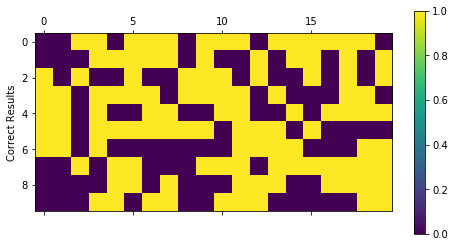

Final percentage:  tensor(0.5000)
Last epoch:  35


Best Score So Far:  tensor(-0.7403)


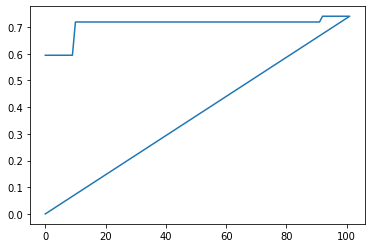

|  102      | -0.5      |  1.471    |  132.9    |  1.796    |  2.949    |  0.002824 |  1.856    |  0.7447   |  1.391e+0 |  1.641    |  0.5573   |  47.2     |  0.8026   |  0.2285   |  1.579    |  0.915    |  3.7      |  5.813    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

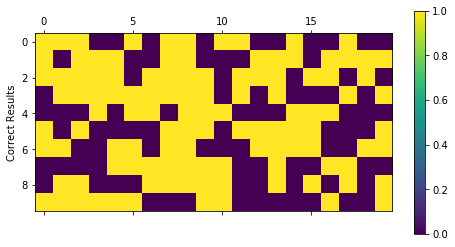

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


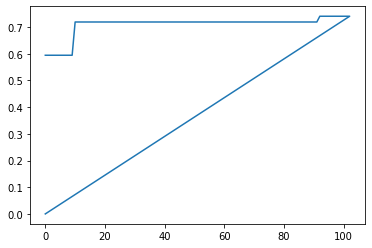

|  103      | -0.5      |  1.717    |  91.54    |  2.986    |  1.297    |  0.02948  |  0.08273  |  0.7918   |  1.465e+0 |  3.196    |  0.5767   |  185.7    |  0.05201  |  0.828    |  2.844    |  0.5514   |  3.882    |  3.526    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

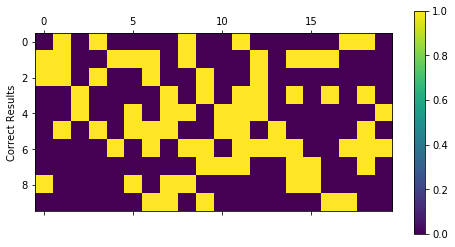

Final percentage:  tensor(0.3504)
Last epoch:  25


Best Score So Far:  tensor(-0.7403)


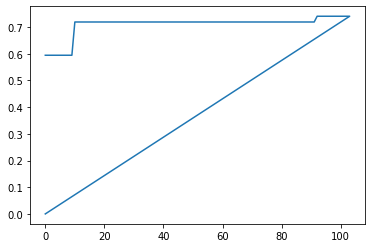

|  104      | -0.3504   |  1.198    |  102.7    |  2.25     |  0.8989   |  0.08194  |  0.1389   |  0.0335   |  1.049e+0 |  1.45     |  0.3558   |  244.7    |  0.1116   |  0.5828   |  2.05     |  0.3529   |  1.593    |  2.983    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

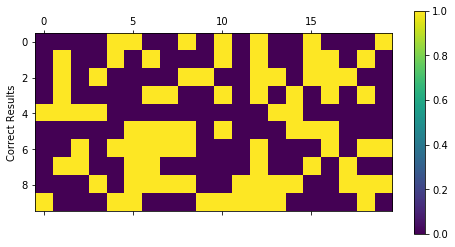

Final percentage:  tensor(0.4598)
Last epoch:  30


Best Score So Far:  tensor(-0.7403)


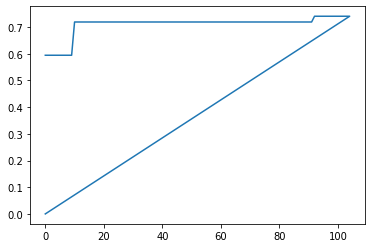

|  105      | -0.4598   |  0.0872   |  183.1    |  2.301    |  1.327    |  0.07189  |  0.2189   |  0.751    |  1.848e+0 |  2.971    |  0.341    |  107.8    |  0.4822   |  0.8418   |  2.719    |  0.4774   |  2.658    |  8.87     |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

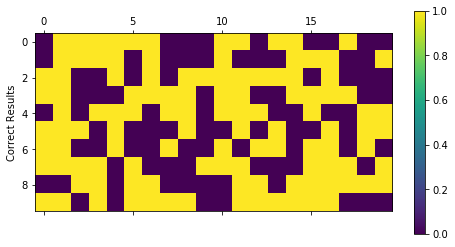

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


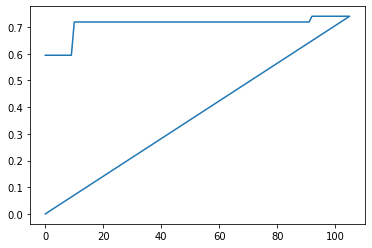

|  106      | -0.5      |  1.889    |  164.4    |  2.49     |  1.051    |  0.0918   |  1.665    |  0.4416   |  1.868e+0 |  3.541    |  0.7276   |  35.2     |  0.5359   |  0.8107   |  2.534    |  0.4203   |  3.924    |  3.254    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

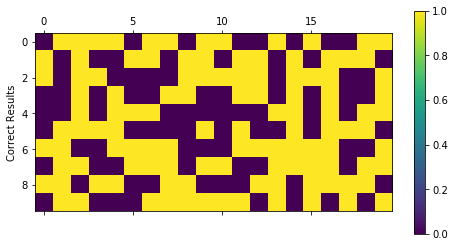

Final percentage:  tensor(0.5143)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


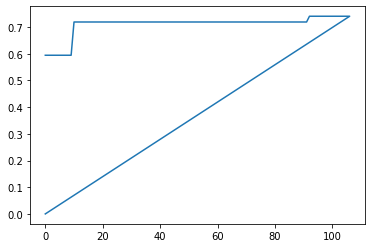

|  107      | -0.5143   |  0.6639   |  244.4    |  2.609    |  2.692    |  0.001159 |  0.7557   |  0.1884   |  1.296e+0 |  3.207    |  0.6517   |  119.3    |  0.3655   |  0.5262   |  2.062    |  0.55     |  2.84     |  4.557    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

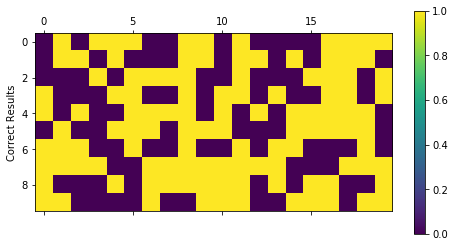

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


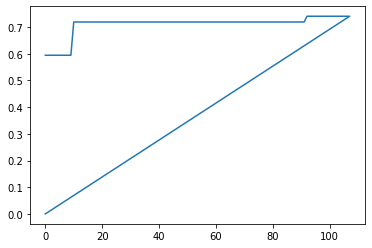

|  108      | -0.5      |  1.536    |  65.81    |  2.305    |  2.872    |  0.000355 |  1.439    |  0.0872   |  1.544e+0 |  2.874    |  0.2187   |  234.1    |  0.6221   |  0.2085   |  2.533    |  0.1054   |  2.66     |  1.854    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

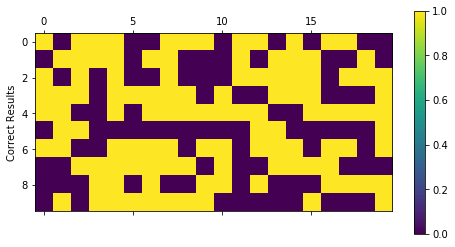

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.7403)


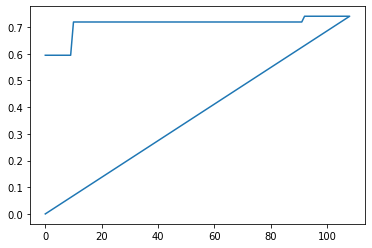

|  109      | -0.5      |  1.156    |  66.26    |  2.292    |  2.14     |  0.05242  |  1.308    |  0.6506   |  1.808e+0 |  2.853    |  0.406    |  105.6    |  0.874    |  0.6326   |  1.368    |  0.5652   |  3.717    |  2.355    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

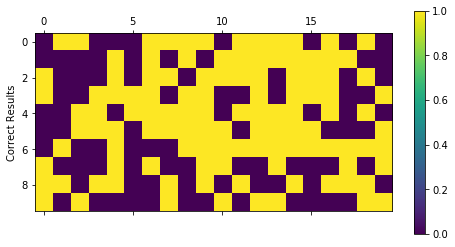

Final percentage:  tensor(0.5000)
Last epoch:  34


Best Score So Far:  tensor(-0.7403)


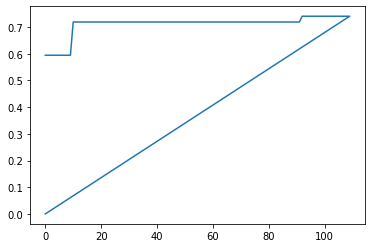

|  110      | -0.5      |  1.683    |  210.3    |  1.994    |  0.1124   |  0.01475  |  1.836    |  0.03532  |  1.372e+0 |  2.851    |  0.1773   |  251.2    |  0.1567   |  0.4857   |  2.23     |  0.2308   |  2.394    |  5.414    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

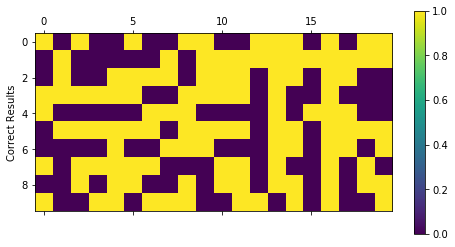

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


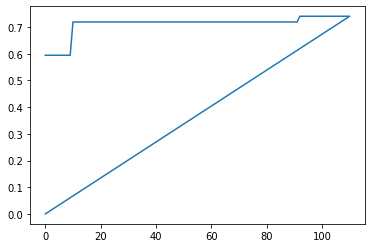

|  111      | -0.5      |  1.526    |  163.1    |  1.93     |  1.994    |  0.04534  |  1.046    |  0.5269   |  1.181e+0 |  3.356    |  0.5426   |  251.0    |  0.2229   |  0.4196   |  2.782    |  0.6008   |  3.171    |  4.719    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

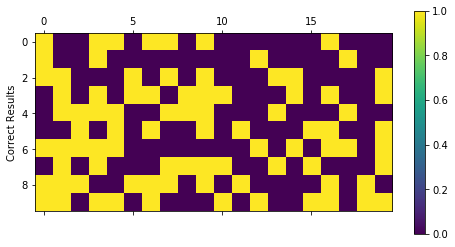

Final percentage:  tensor(0.4072)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


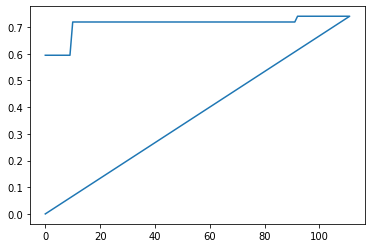

|  112      | -0.4072   |  1.362    |  242.3    |  1.398    |  2.414    |  0.09695  |  0.02899  |  0.1722   |  1.117e+0 |  3.295    |  0.0731   |  255.6    |  0.3898   |  0.8147   |  1.375    |  0.4404   |  3.526    |  6.351    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

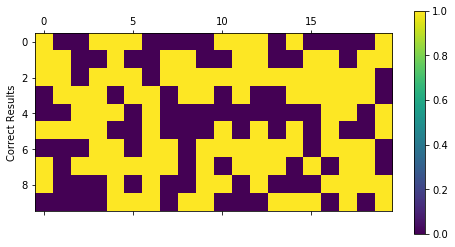

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


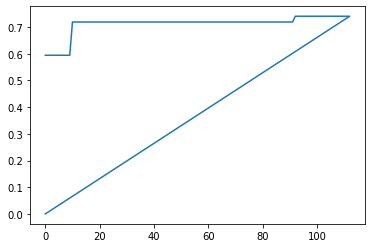

|  113      | -0.5      |  0.9197   |  132.2    |  2.142    |  1.317    |  0.01936  |  0.2268   |  0.121    |  1.052e+0 |  2.67     |  0.763    |  93.22    |  0.07616  |  0.3832   |  2.198    |  0.425    |  3.424    |  9.468    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

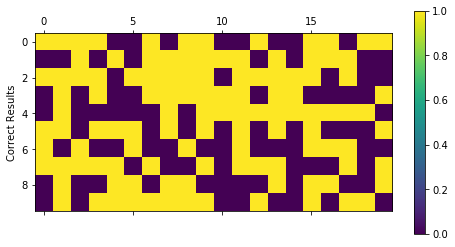

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


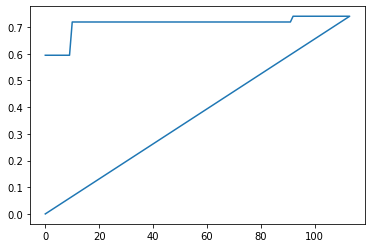

|  114      | -0.5      |  1.731    |  180.8    |  1.936    |  2.041    |  0.001342 |  1.955    |  0.1377   |  1.906e+0 |  3.413    |  0.7201   |  70.31    |  0.2197   |  0.3859   |  2.69     |  0.4499   |  3.797    |  4.171    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

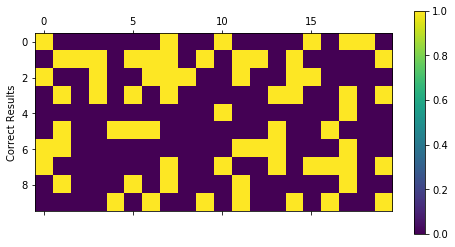

Final percentage:  tensor(0.3724)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


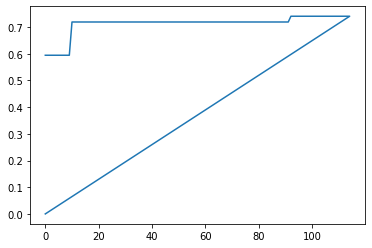

|  115      | -0.3724   |  1.233    |  251.1    |  2.28     |  0.136    |  0.04636  |  0.6662   |  0.4257   |  1.285e+0 |  1.366    |  0.6015   |  175.1    |  0.8664   |  0.1191   |  2.589    |  0.8259   |  2.933    |  2.842    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

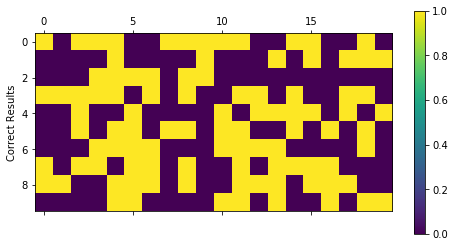

Final percentage:  tensor(0.4510)
Last epoch:  54


Best Score So Far:  tensor(-0.7403)


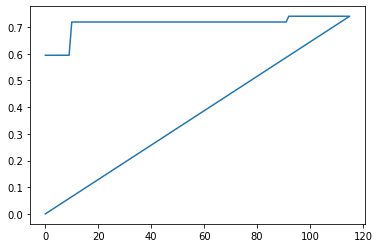

|  116      | -0.451    |  0.5202   |  108.3    |  2.078    |  1.428    |  0.04675  |  1.671    |  0.6961   |  1.817e+0 |  3.625    |  0.5139   |  246.9    |  0.6063   |  0.5436   |  1.635    |  0.6805   |  1.155    |  2.21     |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

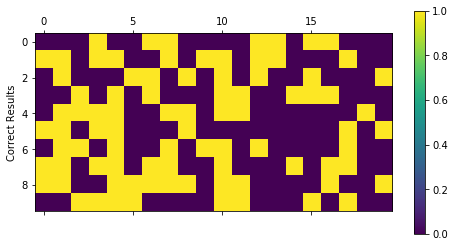

Final percentage:  tensor(0.4857)
Last epoch:  27


Best Score So Far:  tensor(-0.7403)


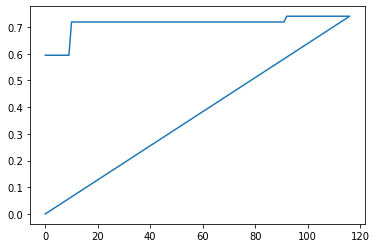

|  117      | -0.4857   |  0.2592   |  168.4    |  1.349    |  1.02     |  0.004431 |  0.4651   |  0.7714   |  1.509e+0 |  1.452    |  0.4707   |  241.7    |  0.865    |  0.3529   |  1.565    |  0.761    |  1.719    |  3.286    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

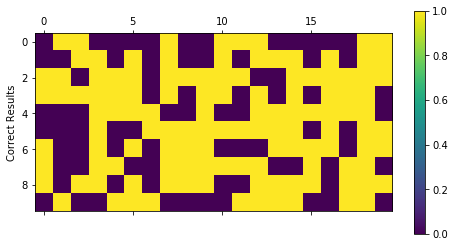

Final percentage:  tensor(0.5922)
Last epoch:  46


Best Score So Far:  tensor(-0.7403)


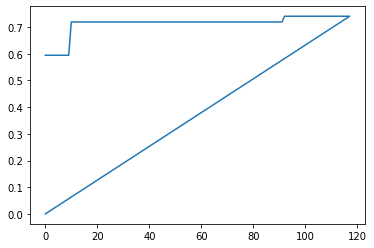

|  118      | -0.5922   |  0.1673   |  221.5    |  1.891    |  1.68     |  0.07367  |  1.585    |  0.358    |  1.184e+0 |  3.478    |  0.02791  |  242.5    |  0.5768   |  0.7878   |  2.211    |  0.2514   |  1.885    |  5.791    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

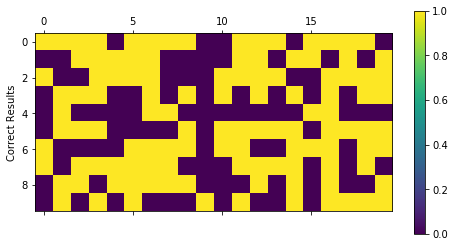

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


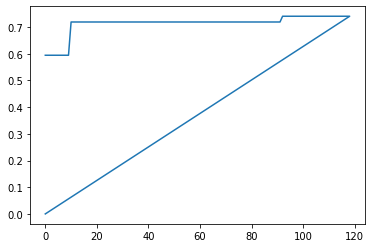

|  119      | -0.5      |  1.915    |  48.86    |  2.015    |  1.028    |  0.07697  |  1.598    |  0.3396   |  1.204e+0 |  1.201    |  0.1788   |  71.19    |  0.5986   |  0.7858   |  1.255    |  0.9572   |  3.043    |  7.67     |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

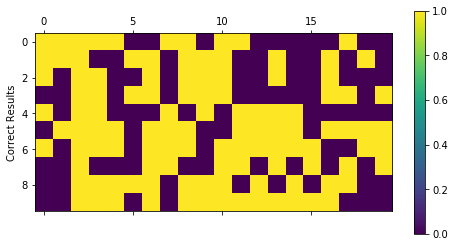

Final percentage:  tensor(0.5099)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


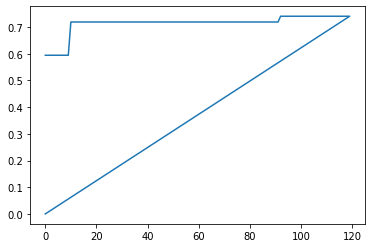

|  120      | -0.5099   |  1.956    |  107.7    |  2.058    |  2.031    |  0.05129  |  0.5952   |  0.08431  |  1.285e+0 |  3.299    |  0.5767   |  205.5    |  0.5171   |  0.2089   |  2.25     |  0.3037   |  1.088    |  9.121    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

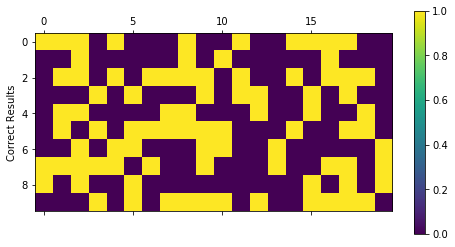

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


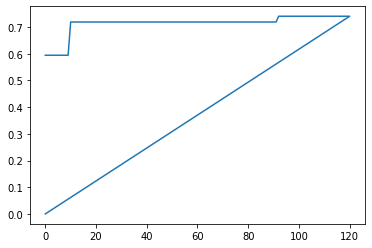

|  121      | -0.5      |  0.8365   |  110.2    |  2.475    |  2.836    |  0.007252 |  0.3437   |  0.2579   |  1.248e+0 |  2.482    |  0.742    |  218.9    |  0.5956   |  0.2162   |  1.371    |  0.7426   |  1.709    |  5.85     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

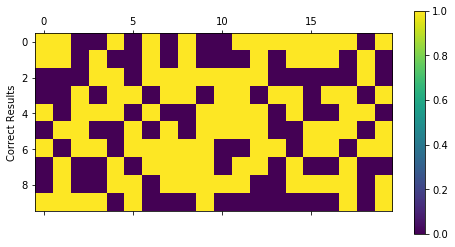

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7403)


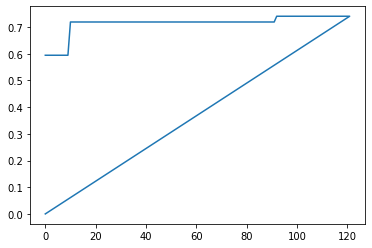

|  122      | -0.5      |  1.491    |  59.98    |  1.347    |  0.1188   |  0.01476  |  1.694    |  0.08371  |  1.224e+0 |  1.098    |  0.6087   |  60.85    |  0.4138   |  0.1254   |  1.751    |  0.424    |  2.414    |  4.801    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

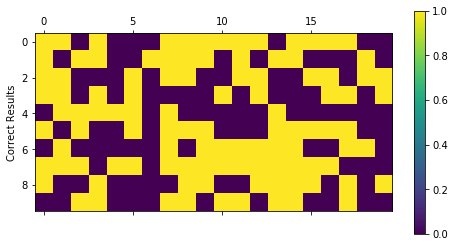

Final percentage:  tensor(0.5792)
Last epoch:  23


Best Score So Far:  tensor(-0.7403)


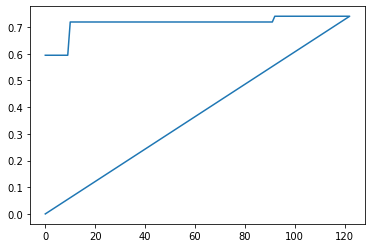

|  123      | -0.5792   |  0.2045   |  198.2    |  1.273    |  1.269    |  0.0272   |  0.599    |  0.5379   |  1.518e+0 |  1.568    |  0.4222   |  88.24    |  0.7041   |  0.2035   |  2.682    |  0.5257   |  2.497    |  3.281    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


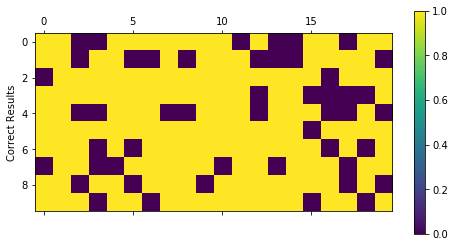

Final percentage:  tensor(0.7522)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


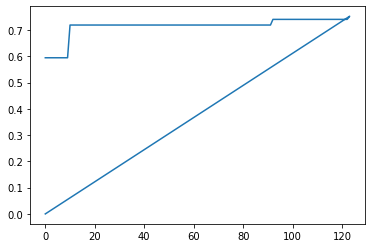

|  124      | -0.7522   |  0.3704   |  121.8    |  2.954    |  0.3974   |  0.02835  |  1.593    |  0.5318   |  1.279e+0 |  1.941    |  0.378    |  155.1    |  0.7189   |  0.7716   |  2.355    |  0.2367   |  3.768    |  8.023    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

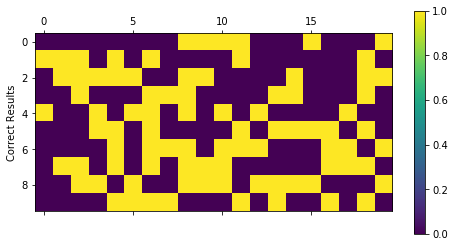

Final percentage:  tensor(0.5000)
Last epoch:  39


Best Score So Far:  tensor(-0.7522)


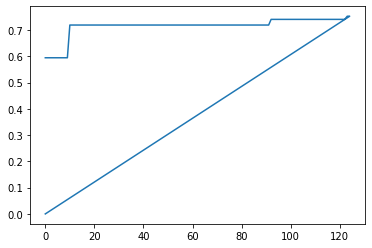

|  125      | -0.5      |  0.6117   |  79.46    |  2.754    |  0.377    |  0.06335  |  0.5526   |  0.6618   |  1.365e+0 |  3.193    |  0.1732   |  124.3    |  0.803    |  0.3573   |  1.322    |  0.6483   |  3.252    |  3.519    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

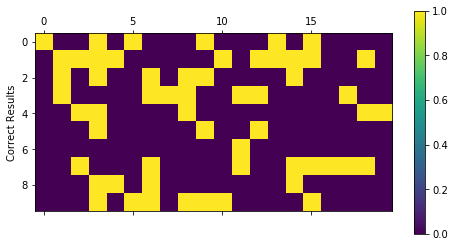

Final percentage:  tensor(0.2900)
Last epoch:  132


Best Score So Far:  tensor(-0.7522)


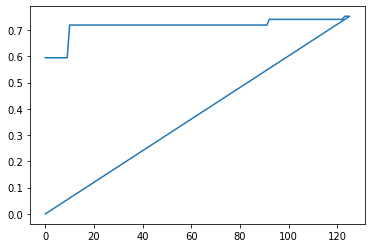

|  126      | -0.29     |  0.8982   |  230.7    |  2.735    |  2.114    |  0.05909  |  1.627    |  0.7261   |  1.003e+0 |  2.188    |  0.5053   |  188.4    |  0.0883   |  0.3598   |  1.556    |  0.4231   |  2.489    |  6.934    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

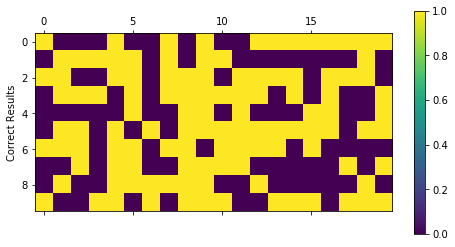

Final percentage:  tensor(0.4956)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


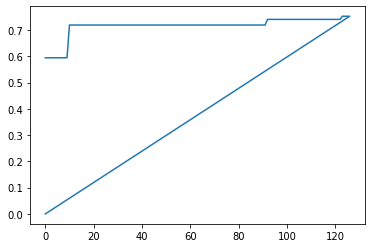

|  127      | -0.4956   |  0.9875   |  159.6    |  2.159    |  1.281    |  0.000497 |  0.3871   |  0.2562   |  1.147e+0 |  2.79     |  0.5504   |  129.0    |  0.3212   |  0.5879   |  1.379    |  0.005875 |  3.197    |  4.987    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

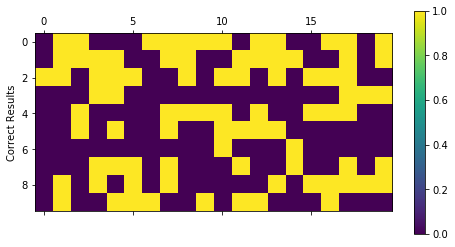

Final percentage:  tensor(0.4942)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


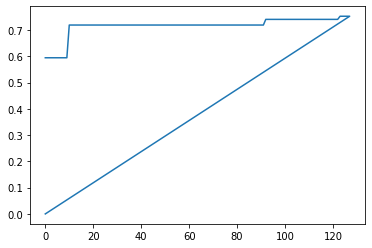

|  128      | -0.4942   |  1.389    |  49.0     |  1.125    |  1.131    |  0.0696   |  0.2046   |  0.1567   |  1.454e+0 |  2.857    |  0.6751   |  29.87    |  0.6244   |  0.3486   |  2.333    |  0.2034   |  2.578    |  2.548    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

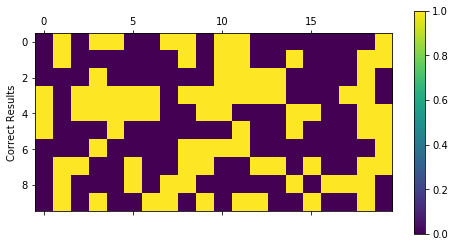

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


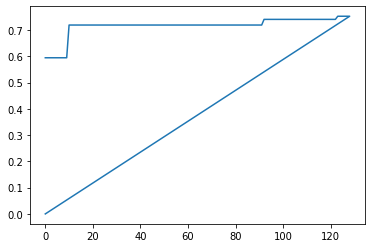

|  129      | -0.5      |  0.03718  |  125.7    |  1.367    |  1.909    |  0.05366  |  1.542    |  0.3144   |  1.989e+0 |  2.54     |  0.4309   |  192.4    |  0.5725   |  0.3262   |  1.974    |  0.1889   |  2.177    |  1.269    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

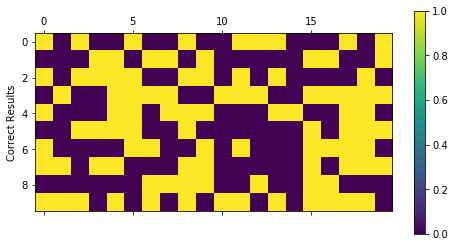

Final percentage:  tensor(0.5198)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


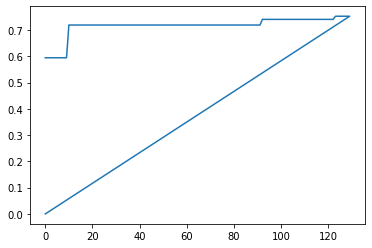

|  130      | -0.5198   |  0.9204   |  71.72    |  2.048    |  0.08752  |  0.05551  |  0.5831   |  0.462    |  1.733e+0 |  2.317    |  0.5968   |  62.68    |  0.9976   |  0.2186   |  2.872    |  0.217    |  2.488    |  8.382    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

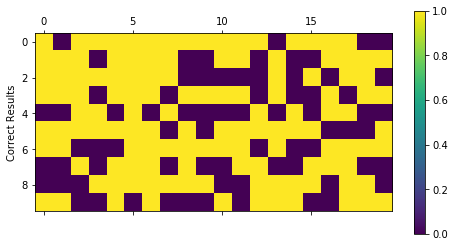

Final percentage:  tensor(0.5870)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


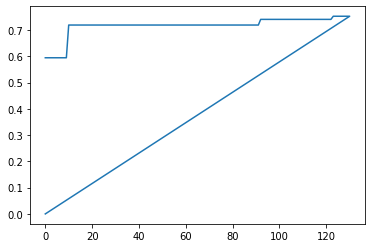

|  131      | -0.587    |  1.426    |  181.2    |  1.876    |  2.255    |  0.092    |  0.8783   |  0.4224   |  1.066e+0 |  2.168    |  0.4205   |  229.4    |  0.1113   |  0.658    |  2.085    |  0.6059   |  1.089    |  2.319    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

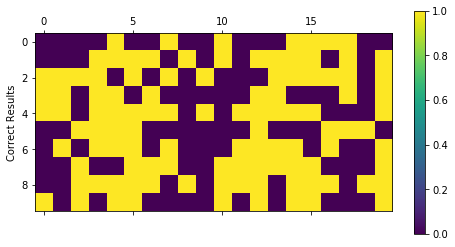

Final percentage:  tensor(0.5165)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


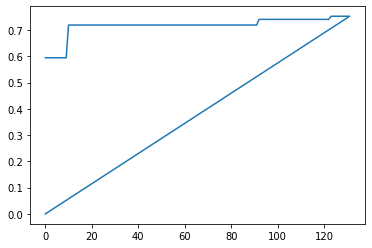

|  132      | -0.5165   |  0.5651   |  3.238    |  2.332    |  2.602    |  0.0547   |  1.081    |  0.4926   |  1.302e+0 |  2.097    |  0.5175   |  207.5    |  0.2022   |  0.2948   |  2.478    |  0.3406   |  1.142    |  2.406    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

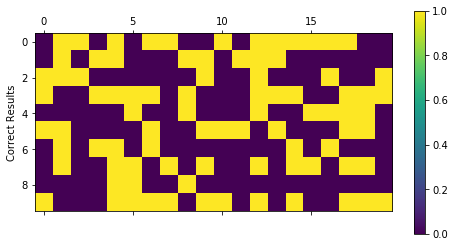

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


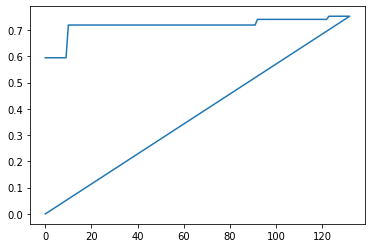

|  133      | -0.5      |  0.3858   |  127.8    |  2.264    |  2.632    |  0.09025  |  0.6112   |  0.6027   |  1.282e+0 |  2.102    |  0.2635   |  107.1    |  0.2153   |  0.2871   |  1.243    |  0.9621   |  2.507    |  9.299    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

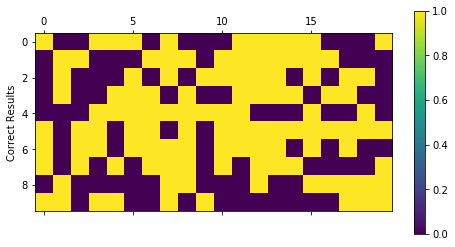

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


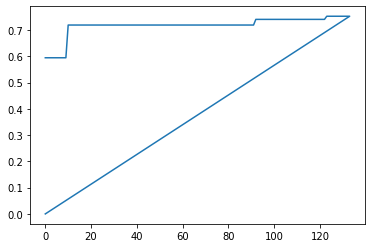

|  134      | -0.5      |  1.485    |  118.3    |  2.502    |  1.878    |  0.03038  |  1.038    |  0.5698   |  1.305e+0 |  1.037    |  0.2414   |  204.4    |  0.9291   |  0.5628   |  1.264    |  0.7568   |  2.575    |  7.777    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

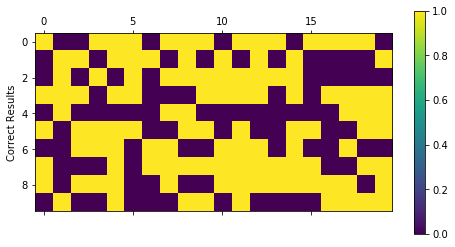

Final percentage:  tensor(0.5000)
Last epoch:  44


Best Score So Far:  tensor(-0.7522)


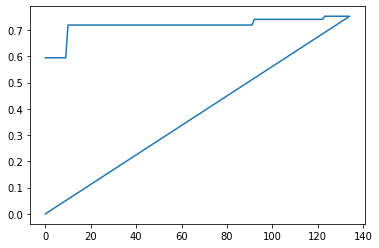

|  135      | -0.5      |  1.709    |  242.7    |  2.303    |  2.554    |  0.07426  |  1.447    |  0.687    |  1.923e+0 |  3.697    |  0.3562   |  23.34    |  0.8289   |  0.485    |  2.079    |  0.8244   |  1.096    |  8.893    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

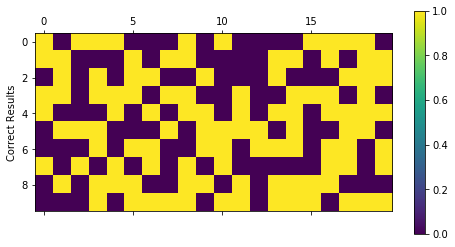

Final percentage:  tensor(0.5908)
Last epoch:  27


Best Score So Far:  tensor(-0.7522)


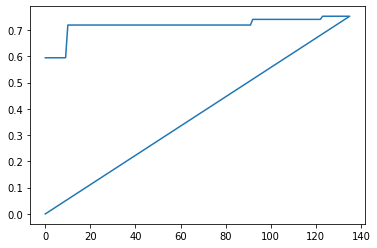

|  136      | -0.5908   |  0.06892  |  178.1    |  2.169    |  1.919    |  0.03741  |  0.5482   |  0.4075   |  1.886e+0 |  2.69     |  0.5968   |  114.1    |  0.9712   |  0.6683   |  1.706    |  0.6529   |  2.622    |  8.948    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

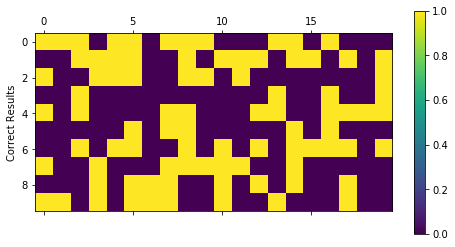

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


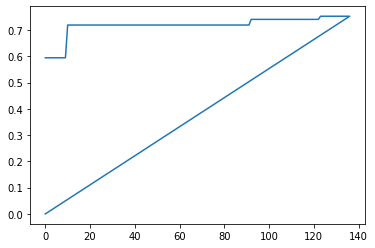

|  137      | -0.5      |  0.5474   |  29.45    |  1.381    |  1.157    |  0.08541  |  0.539    |  0.5011   |  1.624e+0 |  2.22     |  0.04531  |  191.2    |  0.2961   |  0.3586   |  1.751    |  0.6629   |  1.258    |  5.944    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

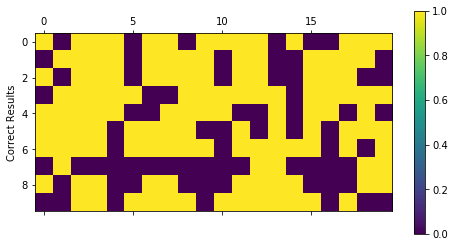

Final percentage:  tensor(0.6500)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


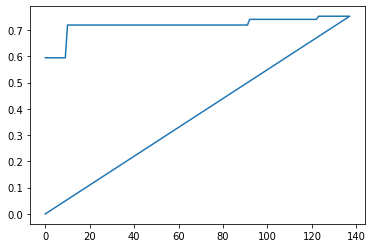

|  138      | -0.65     |  0.03069  |  251.7    |  2.191    |  1.149    |  0.01467  |  1.387    |  0.7246   |  1.318e+0 |  3.292    |  0.2588   |  245.1    |  0.7019   |  0.5625   |  2.852    |  0.2688   |  3.762    |  7.096    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

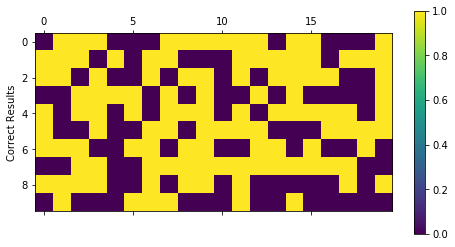

Final percentage:  tensor(0.5000)
Last epoch:  25


Best Score So Far:  tensor(-0.7522)


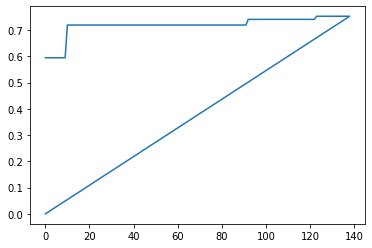

|  139      | -0.5      |  1.535    |  147.2    |  2.659    |  2.088    |  0.01466  |  1.219    |  0.2235   |  1.916e+0 |  1.593    |  0.2572   |  14.1     |  0.4477   |  0.5018   |  2.141    |  0.9045   |  2.039    |  5.023    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

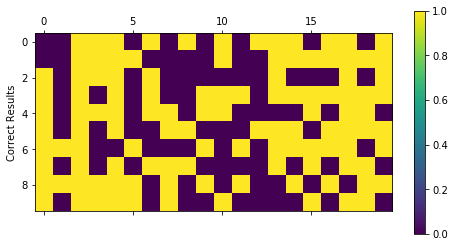

Final percentage:  tensor(0.5000)
Last epoch:  125


Best Score So Far:  tensor(-0.7522)


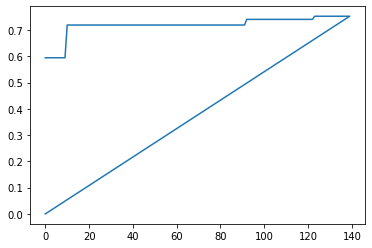

|  140      | -0.5      |  1.694    |  148.5    |  2.301    |  0.8323   |  0.04875  |  1.236    |  0.1067   |  1.033e+0 |  1.339    |  0.4297   |  8.103    |  0.626    |  0.08782  |  1.499    |  0.4261   |  1.346    |  3.432    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

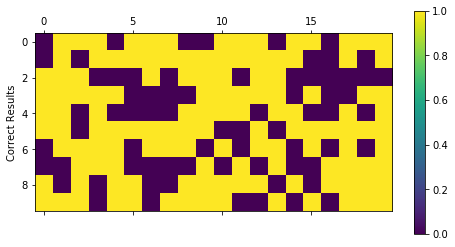

Final percentage:  tensor(0.6372)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


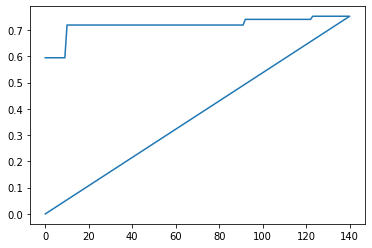

|  141      | -0.6372   |  0.04195  |  252.2    |  2.217    |  1.131    |  0.002653 |  0.7758   |  0.362    |  1.931e+0 |  1.833    |  0.5533   |  171.0    |  0.1866   |  0.4552   |  2.565    |  0.09648  |  2.812    |  1.234    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

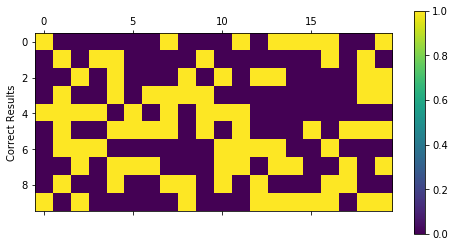

Final percentage:  tensor(0.5000)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


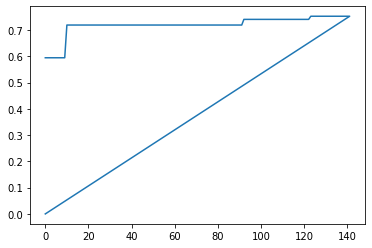

|  142      | -0.5      |  0.01402  |  17.12    |  1.958    |  2.768    |  0.04056  |  0.1493   |  0.6891   |  1.519e+0 |  1.954    |  0.8667   |  240.3    |  0.2605   |  0.1813   |  2.172    |  0.8417   |  2.007    |  6.272    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

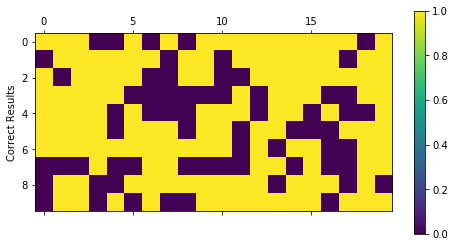

Final percentage:  tensor(0.6278)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


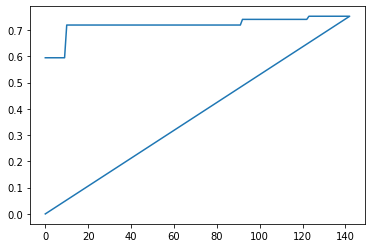

|  143      | -0.6278   |  0.3229   |  51.43    |  2.515    |  0.4488   |  0.02659  |  1.372    |  0.01207  |  1.032e+0 |  1.86     |  0.303    |  94.0     |  0.8066   |  0.03238  |  1.713    |  0.6376   |  1.428    |  8.711    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

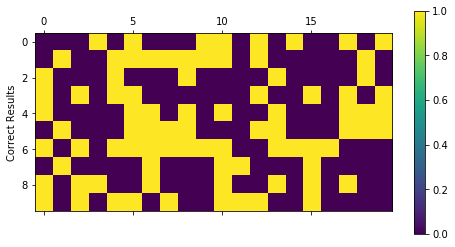

Final percentage:  tensor(0.4942)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


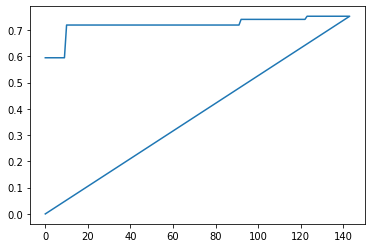

|  144      | -0.4942   |  1.285    |  31.28    |  1.414    |  2.229    |  0.04034  |  0.9641   |  0.71     |  1.137e+0 |  3.883    |  0.03838  |  27.26    |  0.2238   |  0.7259   |  1.907    |  0.6526   |  1.521    |  2.499    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

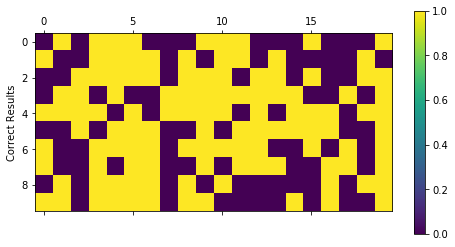

Final percentage:  tensor(0.5360)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


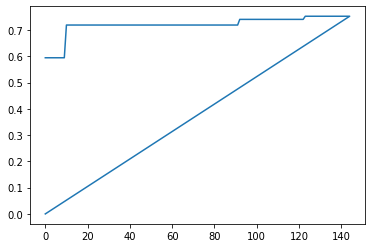

|  145      | -0.536    |  1.036    |  190.0    |  1.92     |  2.6      |  0.06604  |  0.4957   |  0.1879   |  1.374e+0 |  3.262    |  0.8441   |  220.9    |  0.2621   |  0.3711   |  2.217    |  0.5463   |  2.164    |  1.912    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

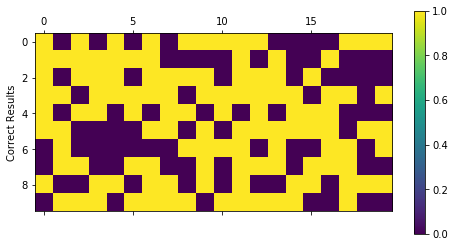

Final percentage:  tensor(0.5848)
Last epoch:  34


Best Score So Far:  tensor(-0.7522)


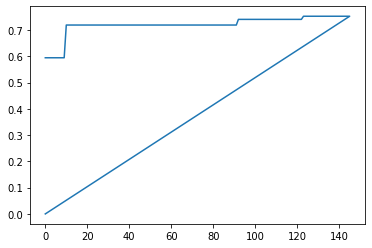

|  146      | -0.5848   |  1.417    |  24.39    |  2.723    |  2.582    |  0.07085  |  0.968    |  0.5593   |  1.395e+0 |  3.385    |  0.7078   |  41.5     |  0.3182   |  0.3096   |  1.725    |  0.5661   |  1.125    |  6.933    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

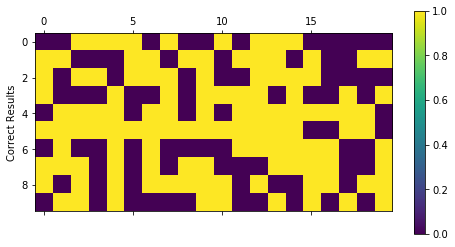

Final percentage:  tensor(0.5475)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


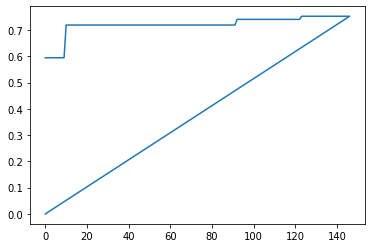

|  147      | -0.5475   |  0.4012   |  107.8    |  1.897    |  1.043    |  0.03833  |  0.3588   |  0.0545   |  1.551e+0 |  2.782    |  0.131    |  60.66    |  0.2868   |  0.7477   |  1.305    |  0.5516   |  2.699    |  4.087    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

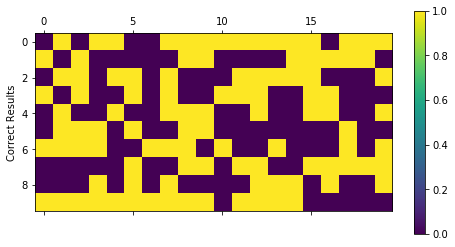

Final percentage:  tensor(0.4903)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


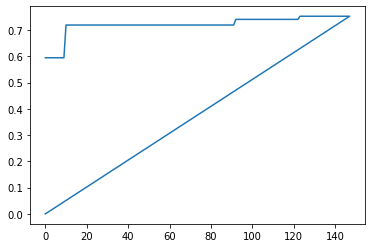

|  148      | -0.4903   |  0.6977   |  245.6    |  2.101    |  1.952    |  0.04907  |  1.287    |  0.4842   |  1.145e+0 |  2.001    |  0.4144   |  34.47    |  0.3633   |  0.2053   |  2.687    |  0.3411   |  1.678    |  4.67     |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

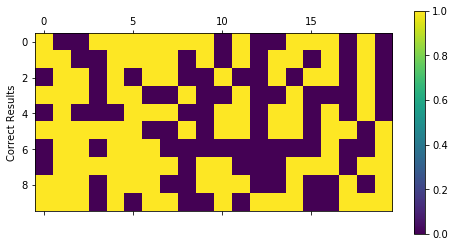

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


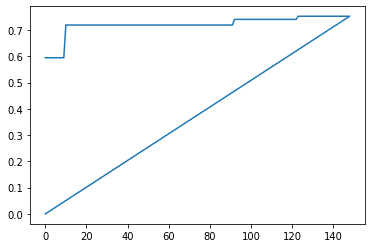

|  149      | -0.5      |  1.359    |  18.67    |  1.36     |  2.076    |  0.07523  |  1.229    |  0.7034   |  1.169e+0 |  3.104    |  0.8255   |  40.29    |  0.2443   |  0.492    |  1.685    |  0.6899   |  1.172    |  2.445    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

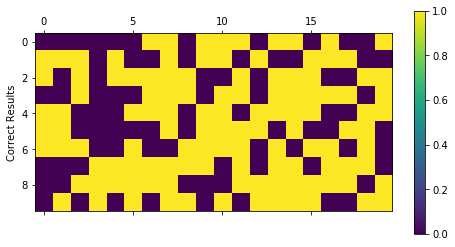

Final percentage:  tensor(0.5291)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


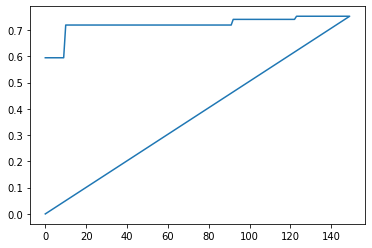

|  150      | -0.5291   |  1.425    |  248.5    |  2.85     |  2.694    |  0.01277  |  0.2904   |  0.05781  |  1.543e+0 |  3.639    |  0.4786   |  200.6    |  0.1891   |  0.7768   |  1.373    |  0.05471  |  2.26     |  5.99     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

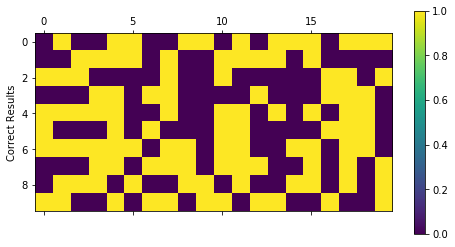

Final percentage:  tensor(0.4905)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


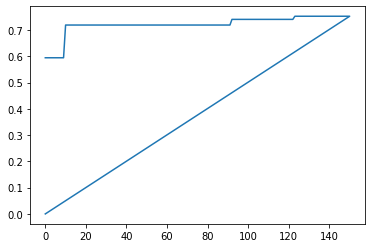

|  151      | -0.4905   |  1.932    |  25.31    |  1.545    |  0.3143   |  0.03904  |  0.5751   |  0.4106   |  1.348e+0 |  3.775    |  0.711    |  220.7    |  0.1302   |  0.5176   |  1.427    |  0.8674   |  1.045    |  1.951    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

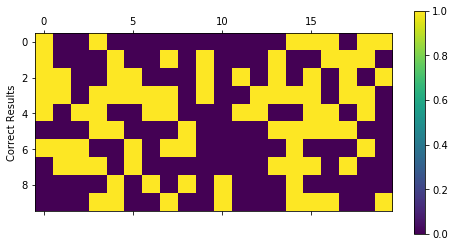

Final percentage:  tensor(0.5000)
Last epoch:  92


Best Score So Far:  tensor(-0.7522)


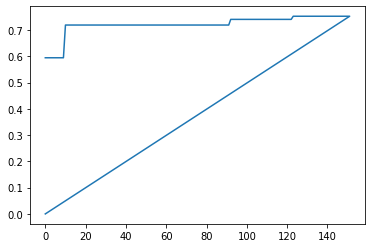

|  152      | -0.5      |  0.7484   |  104.1    |  1.552    |  0.2872   |  0.01187  |  0.6327   |  0.7606   |  1.207e+0 |  3.234    |  0.2324   |  11.46    |  0.01702  |  0.1374   |  1.92     |  0.7551   |  3.179    |  4.168    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

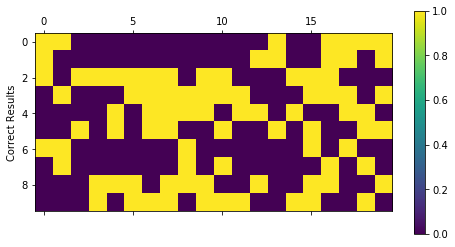

Final percentage:  tensor(0.5000)
Last epoch:  37


Best Score So Far:  tensor(-0.7522)


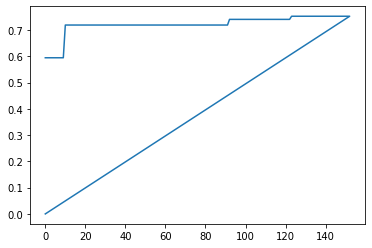

|  153      | -0.5      |  0.9535   |  208.8    |  2.668    |  0.9566   |  0.000426 |  0.09339  |  0.5902   |  1.273e+0 |  2.44     |  0.1728   |  217.2    |  0.5034   |  0.4744   |  1.573    |  0.5115   |  1.006    |  3.493    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

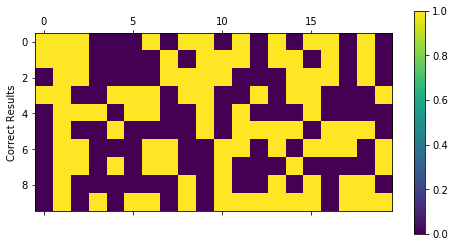

Final percentage:  tensor(0.5558)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


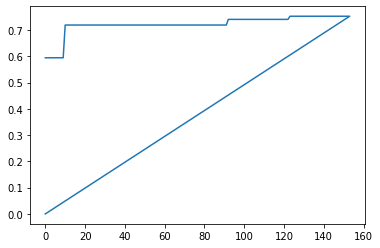

|  154      | -0.5558   |  0.694    |  74.12    |  1.171    |  1.56     |  0.07885  |  1.876    |  0.3978   |  1.594e+0 |  1.87     |  0.1343   |  35.5     |  0.7319   |  0.661    |  1.357    |  0.4131   |  2.776    |  2.126    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

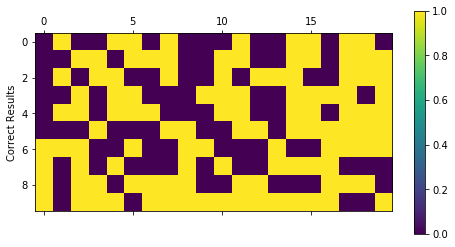

Final percentage:  tensor(0.5000)
Last epoch:  37


Best Score So Far:  tensor(-0.7522)


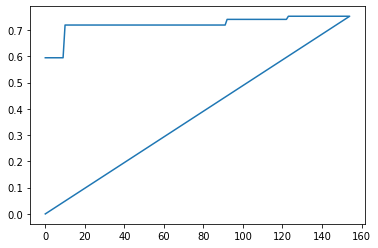

|  155      | -0.5      |  1.563    |  159.5    |  2.224    |  2.097    |  0.09872  |  1.119    |  0.6915   |  1.419e+0 |  2.957    |  0.8327   |  170.7    |  0.3035   |  0.558    |  1.699    |  0.322    |  2.825    |  2.441    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

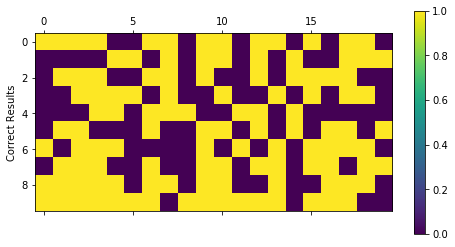

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


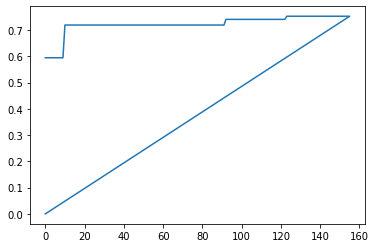

|  156      | -0.5      |  0.9686   |  242.2    |  1.764    |  0.565    |  0.04688  |  1.673    |  0.6741   |  1.828e+0 |  1.034    |  0.2403   |  256.0    |  0.1204   |  0.4411   |  2.572    |  0.1221   |  2.981    |  5.388    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

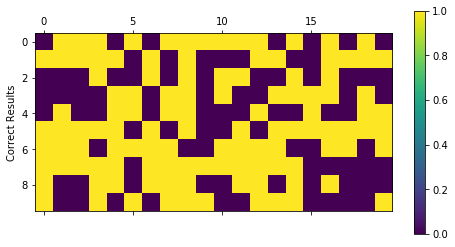

Final percentage:  tensor(0.5058)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


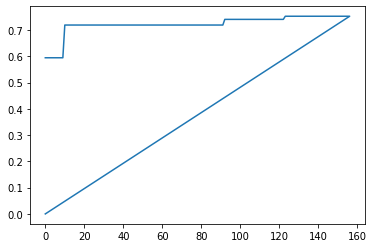

|  157      | -0.5058   |  0.3866   |  225.2    |  1.361    |  1.911    |  0.07408  |  1.12     |  0.5031   |  1.119e+0 |  1.921    |  0.5283   |  102.4    |  0.6636   |  0.7668   |  1.379    |  0.9024   |  2.146    |  9.479    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

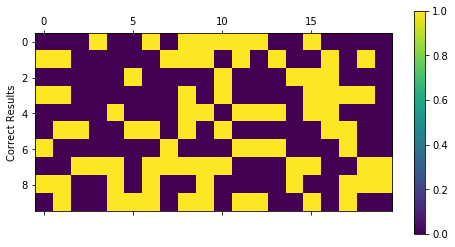

Final percentage:  tensor(0.4611)
Last epoch:  284


Best Score So Far:  tensor(-0.7522)


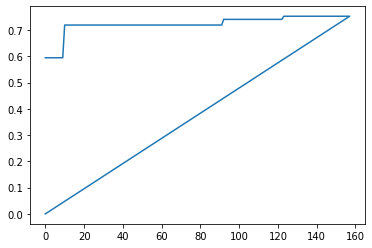

|  158      | -0.4611   |  1.229    |  202.7    |  2.024    |  1.588    |  0.03276  |  0.2574   |  0.3071   |  1.215e+0 |  1.098    |  0.2474   |  47.87    |  0.8748   |  0.07311  |  1.366    |  0.7033   |  3.748    |  3.261    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


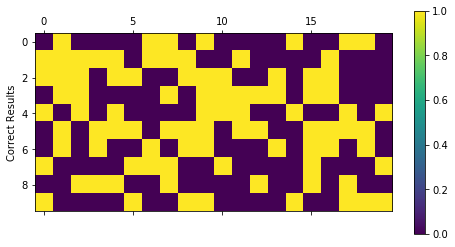

Final percentage:  tensor(0.4919)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


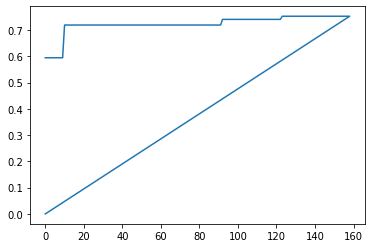

|  159      | -0.4919   |  0.04239  |  246.0    |  2.358    |  0.9289   |  0.04724  |  1.193    |  0.2991   |  1.874e+0 |  3.171    |  0.8589   |  91.17    |  0.9363   |  0.4312   |  2.278    |  0.7359   |  3.42     |  4.562    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

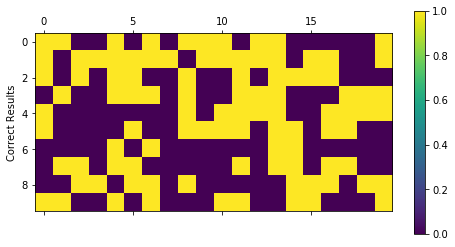

Final percentage:  tensor(0.4869)
Last epoch:  50


Best Score So Far:  tensor(-0.7522)


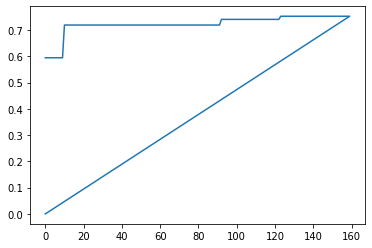

|  160      | -0.4869   |  0.8914   |  209.6    |  2.428    |  2.813    |  0.09796  |  0.356    |  0.1823   |  1.716e+0 |  3.235    |  0.5429   |  224.8    |  0.2525   |  0.3055   |  1.984    |  0.3147   |  2.631    |  7.135    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


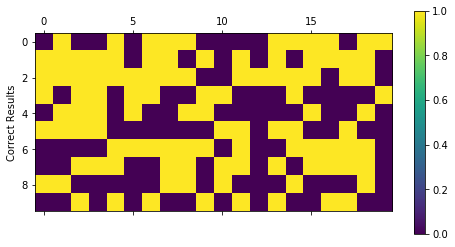

Final percentage:  tensor(0.5206)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


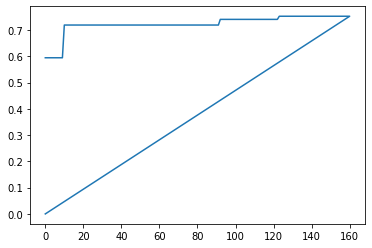

|  161      | -0.5206   |  0.4385   |  125.3    |  2.976    |  0.9692   |  0.003536 |  1.627    |  0.4026   |  1.053e+0 |  3.662    |  0.3641   |  238.0    |  0.4023   |  0.06915  |  1.488    |  0.3499   |  3.245    |  2.661    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


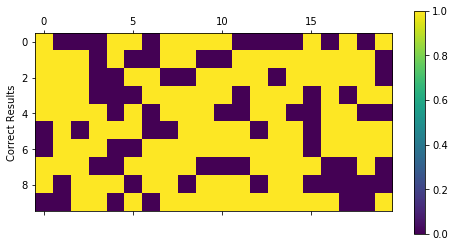

Final percentage:  tensor(0.6017)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


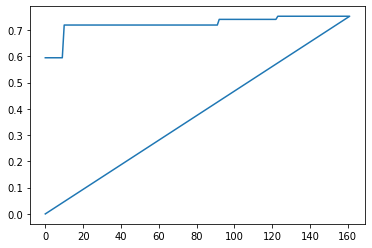

|  162      | -0.6017   |  0.8576   |  223.8    |  2.062    |  0.3084   |  0.002452 |  1.405    |  0.7833   |  1.785e+0 |  3.287    |  0.6079   |  204.1    |  0.04094  |  0.2382   |  2.384    |  0.8661   |  3.017    |  2.585    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

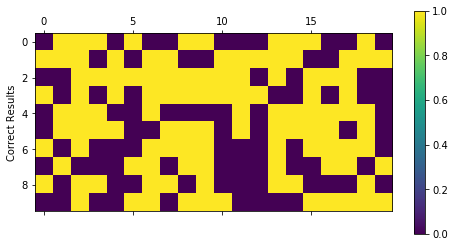

Final percentage:  tensor(0.5000)
Last epoch:  47


Best Score So Far:  tensor(-0.7522)


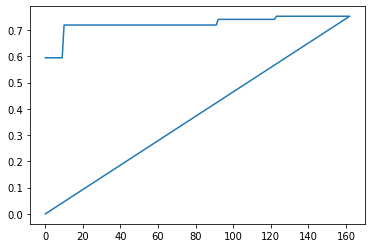

|  163      | -0.5      |  1.863    |  231.5    |  1.172    |  0.5771   |  0.02752  |  1.469    |  0.6875   |  1.578e+0 |  1.597    |  0.3736   |  37.02    |  0.9166   |  0.6881   |  2.015    |  0.4531   |  1.293    |  3.865    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

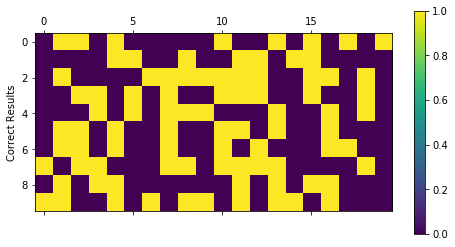

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


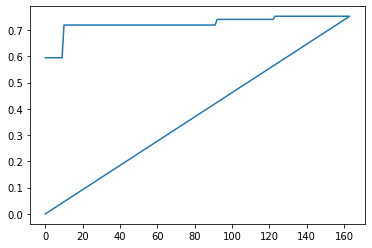

|  164      | -0.5      |  0.2401   |  200.7    |  2.084    |  0.6796   |  0.02242  |  0.5182   |  0.2471   |  1.388e+0 |  1.89     |  0.6116   |  10.91    |  0.3285   |  0.6708   |  2.876    |  0.8019   |  1.72     |  3.094    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

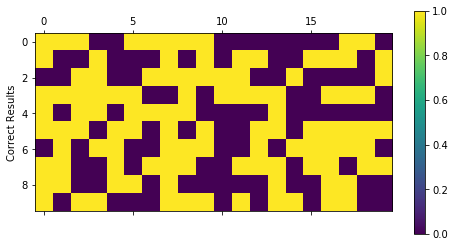

Final percentage:  tensor(0.5624)
Last epoch:  39


Best Score So Far:  tensor(-0.7522)


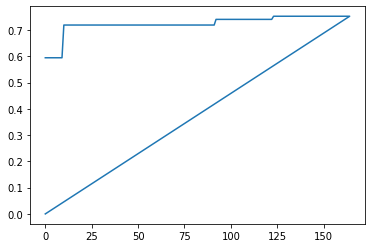

|  165      | -0.5624   |  0.3788   |  226.2    |  1.473    |  2.267    |  0.0261   |  0.06583  |  0.5868   |  1.726e+0 |  1.266    |  0.294    |  242.9    |  0.1636   |  0.07801  |  2.183    |  0.9301   |  1.4      |  5.612    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

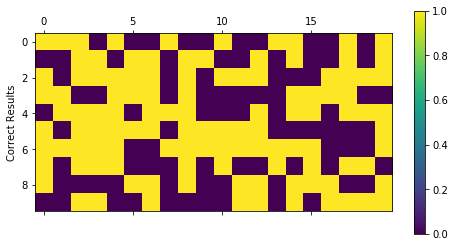

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


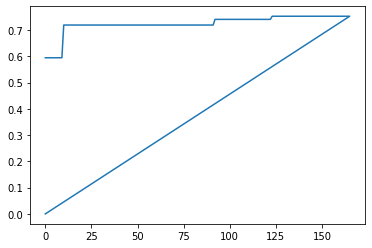

|  166      | -0.5      |  1.361    |  45.64    |  1.022    |  2.654    |  0.003523 |  0.5123   |  0.5213   |  1.286e+0 |  1.029    |  0.5179   |  80.18    |  0.1522   |  0.8742   |  1.328    |  0.7265   |  3.663    |  8.72     |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

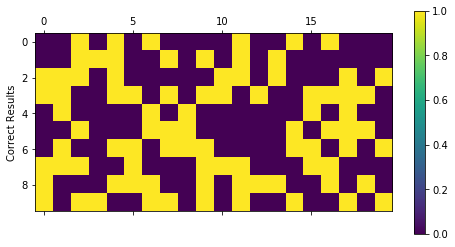

Final percentage:  tensor(0.5000)
Last epoch:  56


Best Score So Far:  tensor(-0.7522)


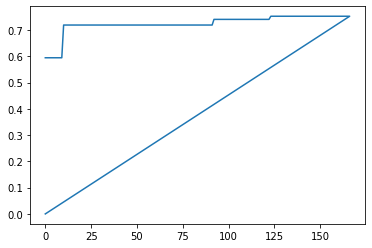

|  167      | -0.5      |  0.3667   |  62.15    |  1.037    |  2.785    |  0.08871  |  1.185    |  0.08749  |  1.174e+0 |  2.725    |  0.2265   |  78.24    |  0.1716   |  0.1706   |  1.922    |  0.5094   |  2.53     |  9.964    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

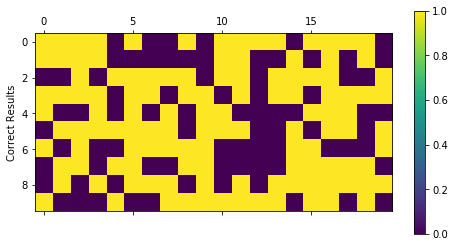

Final percentage:  tensor(0.6335)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


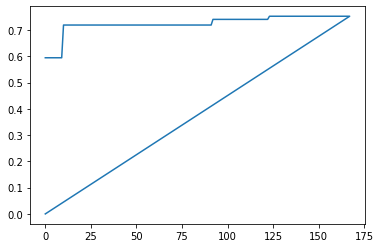

|  168      | -0.6335   |  0.2579   |  194.1    |  2.58     |  1.749    |  0.04627  |  1.778    |  0.6625   |  1.05e+03 |  3.879    |  0.006616 |  147.6    |  0.5723   |  0.7509   |  1.766    |  0.09095  |  2.739    |  1.223    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


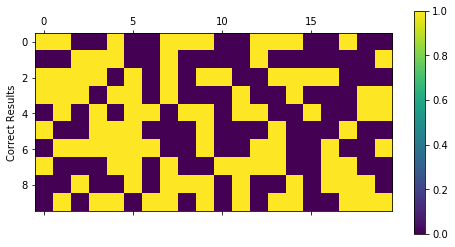

Final percentage:  tensor(0.4771)
Last epoch:  25


Best Score So Far:  tensor(-0.7522)


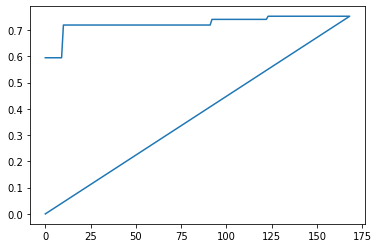

|  169      | -0.4771   |  0.72     |  252.3    |  2.729    |  0.456    |  0.07988  |  1.614    |  0.7426   |  1.224e+0 |  2.492    |  0.7447   |  171.5    |  0.5937   |  0.5868   |  1.475    |  0.02551  |  3.201    |  3.938    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

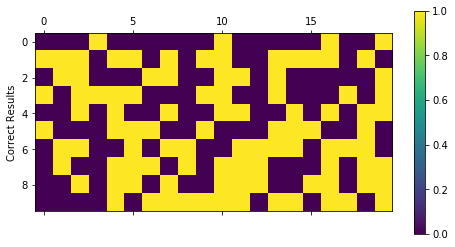

Final percentage:  tensor(0.5427)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


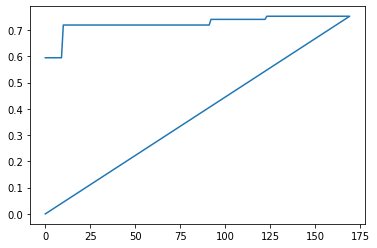

|  170      | -0.5427   |  0.7497   |  157.6    |  2.308    |  0.6067   |  0.0826   |  0.7566   |  0.5054   |  1.966e+0 |  2.689    |  0.323    |  159.2    |  0.5018   |  0.4071   |  2.457    |  0.9236   |  2.433    |  1.793    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

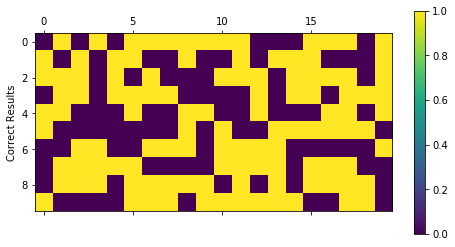

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


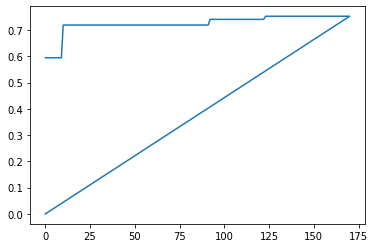

|  171      | -0.5      |  1.134    |  64.22    |  1.079    |  2.357    |  0.02728  |  1.546    |  0.3906   |  1.318e+0 |  1.939    |  0.03783  |  137.7    |  0.8229   |  0.07551  |  1.216    |  0.5287   |  2.974    |  7.246    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

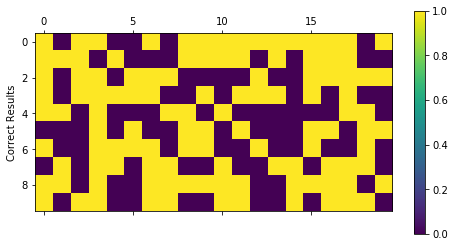

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


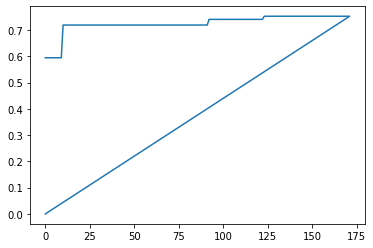

|  172      | -0.5      |  0.6233   |  11.6     |  1.825    |  0.6759   |  0.000111 |  1.365    |  0.7617   |  1.391e+0 |  1.898    |  0.4984   |  218.4    |  0.7944   |  0.6163   |  1.86     |  0.6897   |  1.646    |  3.553    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

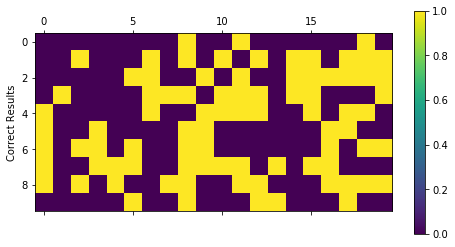

Final percentage:  tensor(0.4769)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


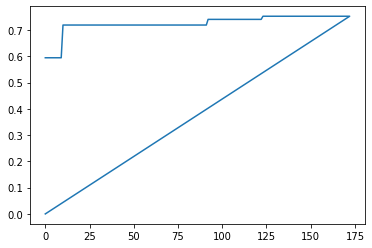

|  173      | -0.4769   |  1.548    |  238.2    |  1.378    |  0.8852   |  0.000621 |  0.8588   |  0.1682   |  1.641e+0 |  3.122    |  0.1069   |  22.86    |  0.9055   |  0.3503   |  2.061    |  0.9623   |  3.27     |  3.927    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

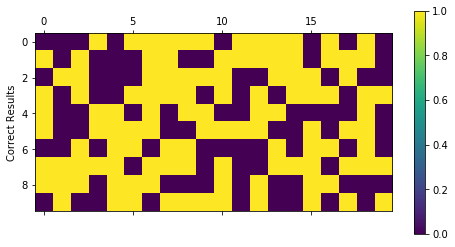

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


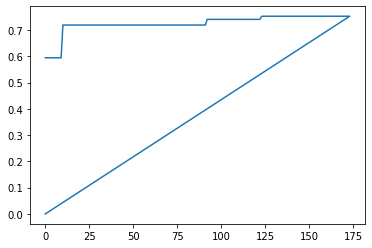

|  174      | -0.5      |  0.1708   |  138.2    |  1.669    |  0.06484  |  0.07712  |  0.766    |  0.4571   |  1.756e+0 |  3.813    |  0.5511   |  82.11    |  0.1109   |  0.06653  |  1.636    |  0.6602   |  3.079    |  2.867    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

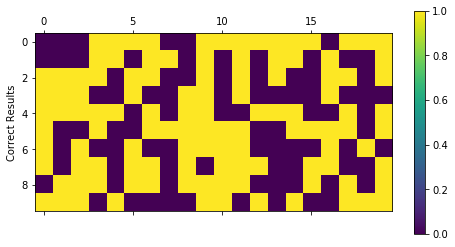

Final percentage:  tensor(0.5000)
Last epoch:  41


Best Score So Far:  tensor(-0.7522)


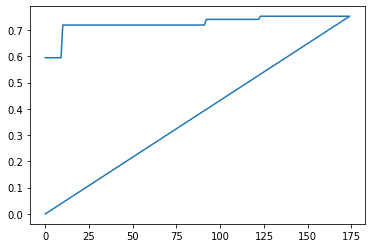

|  175      | -0.5      |  0.1648   |  79.6     |  2.09     |  2.256    |  0.05297  |  0.5711   |  0.4993   |  1.265e+0 |  2.952    |  0.7577   |  164.3    |  0.5655   |  0.2764   |  2.745    |  0.9878   |  3.325    |  6.157    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


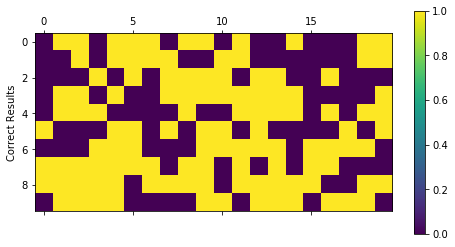

Final percentage:  tensor(0.5000)
Last epoch:  27


Best Score So Far:  tensor(-0.7522)


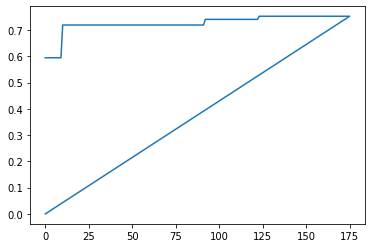

|  176      | -0.5      |  0.2811   |  81.99    |  1.73     |  0.8728   |  0.0446   |  1.215    |  0.1703   |  1.25e+03 |  1.335    |  0.2768   |  128.4    |  0.4898   |  0.896    |  2.952    |  0.4361   |  3.906    |  2.927    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

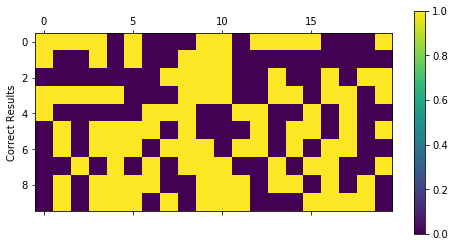

Final percentage:  tensor(0.5690)
Last epoch:  40


Best Score So Far:  tensor(-0.7522)


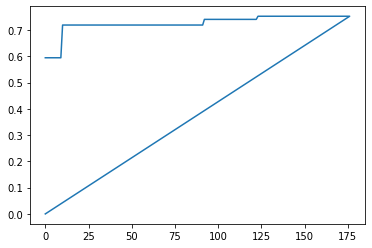

|  177      | -0.569    |  1.077    |  117.2    |  2.926    |  2.5      |  0.02141  |  0.8747   |  0.1348   |  1.529e+0 |  3.373    |  0.0323   |  50.61    |  0.9765   |  0.8647   |  2.108    |  0.6454   |  1.814    |  9.559    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

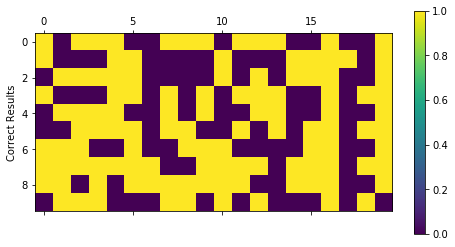

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


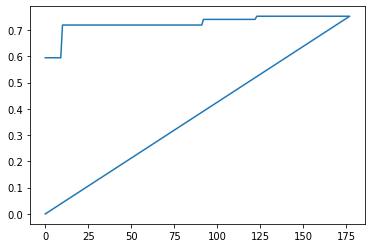

|  178      | -0.5      |  1.333    |  171.4    |  1.022    |  2.55     |  0.07783  |  1.363    |  0.5926   |  1.157e+0 |  3.149    |  0.08715  |  181.6    |  0.003627 |  0.6986   |  1.978    |  0.2042   |  3.18     |  3.838    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

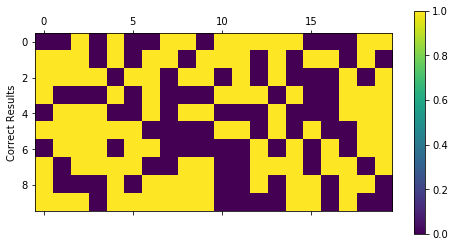

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


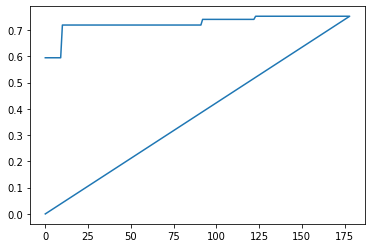

|  179      | -0.5      |  1.759    |  47.78    |  2.868    |  2.903    |  0.03045  |  1.716    |  0.6737   |  1.425e+0 |  2.087    |  0.2542   |  254.3    |  0.2562   |  0.8286   |  1.852    |  0.9345   |  3.508    |  2.4      |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

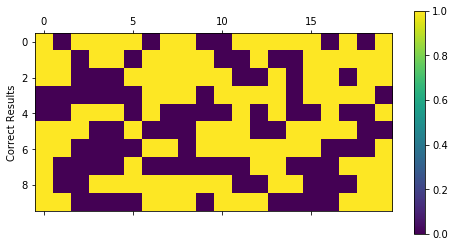

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


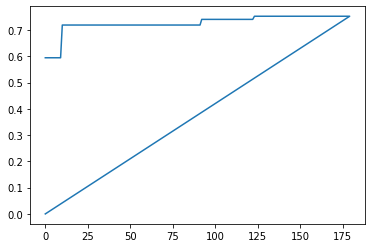

|  180      | -0.5      |  1.143    |  173.1    |  1.808    |  0.01458  |  0.03253  |  1.67     |  0.05026  |  1.105e+0 |  3.098    |  0.4627   |  128.5    |  0.3739   |  0.5432   |  2.694    |  0.2766   |  3.526    |  4.745    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

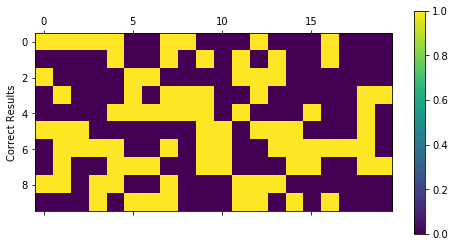

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


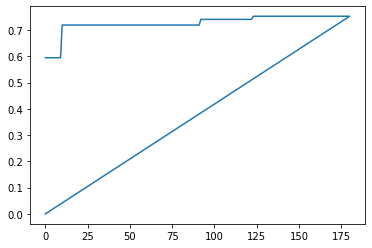

|  181      | -0.5      |  0.997    |  187.3    |  1.515    |  2.756    |  0.07021  |  1.232    |  0.2184   |  1.696e+0 |  1.769    |  0.7348   |  4.914    |  0.1672   |  0.502    |  2.417    |  0.492    |  3.625    |  9.773    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

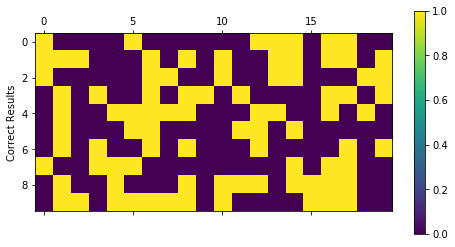

Final percentage:  tensor(0.5000)
Last epoch:  49


Best Score So Far:  tensor(-0.7522)


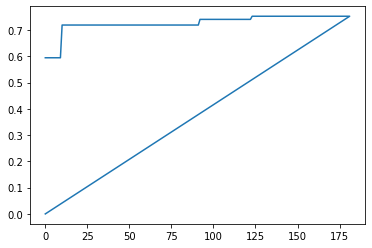

|  182      | -0.5      |  0.9239   |  197.1    |  1.985    |  1.989    |  0.02249  |  0.218    |  0.7832   |  1.815e+0 |  1.853    |  0.5272   |  98.54    |  0.177    |  0.377    |  1.591    |  0.01661  |  2.158    |  9.279    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

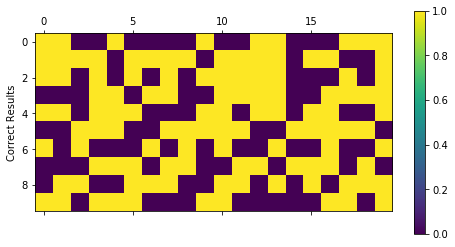

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


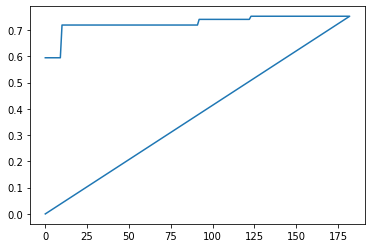

|  183      | -0.5      |  1.648    |  147.8    |  1.634    |  0.6915   |  0.0956   |  1.124    |  0.1741   |  1.249e+0 |  3.869    |  0.2149   |  29.11    |  0.1846   |  0.6896   |  2.41     |  0.4375   |  3.373    |  5.652    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


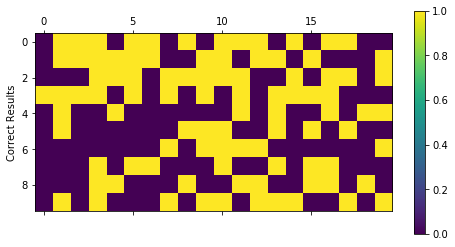

Final percentage:  tensor(0.4593)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


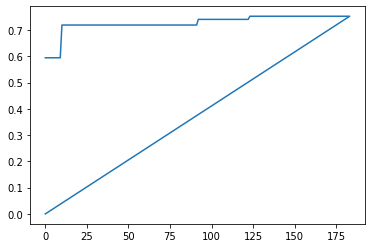

|  184      | -0.4593   |  0.8231   |  31.83    |  2.759    |  0.824    |  0.06163  |  1.959    |  0.1515   |  1.965e+0 |  2.952    |  0.1159   |  198.1    |  0.9509   |  0.5065   |  2.37     |  0.02632  |  3.957    |  3.863    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

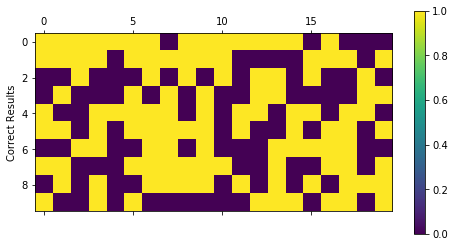

Final percentage:  tensor(0.5000)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


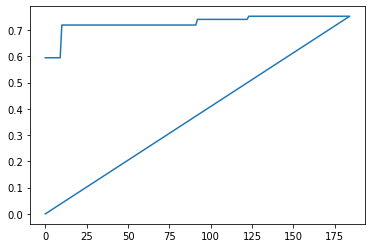

|  185      | -0.5      |  0.04757  |  207.4    |  2.937    |  2.205    |  0.000273 |  0.1261   |  0.4674   |  1.336e+0 |  3.637    |  0.7863   |  252.8    |  0.7154   |  0.7892   |  1.636    |  0.1111   |  3.587    |  3.728    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

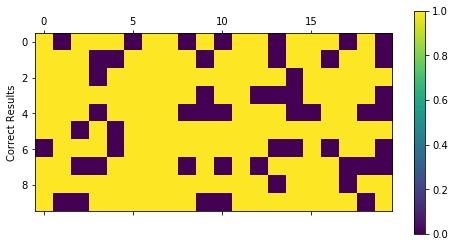

Final percentage:  tensor(0.7392)
Last epoch:  88


Best Score So Far:  tensor(-0.7522)


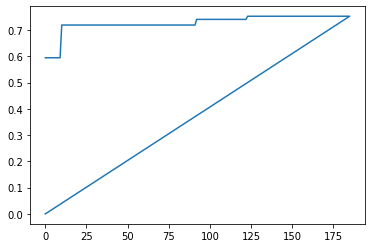

|  186      | -0.7392   |  0.8345   |  166.1    |  2.204    |  1.259    |  0.03862  |  0.2441   |  0.4271   |  1.233e+0 |  3.257    |  0.6074   |  20.27    |  0.9883   |  0.7024   |  1.453    |  0.03071  |  2.43     |  4.171    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

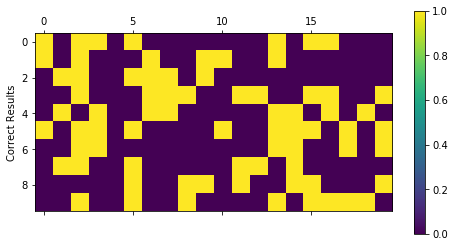

Final percentage:  tensor(0.3530)
Last epoch:  48


Best Score So Far:  tensor(-0.7522)


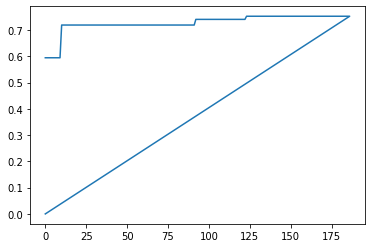

|  187      | -0.353    |  1.088    |  169.6    |  2.586    |  0.0405   |  0.07143  |  0.5877   |  0.7891   |  1.846e+0 |  2.676    |  0.538    |  50.79    |  0.2268   |  0.1386   |  1.752    |  0.1118   |  2.529    |  6.74     |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

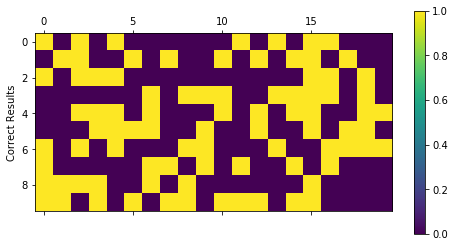

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


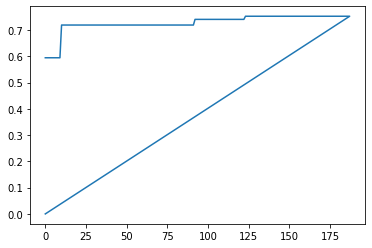

|  188      | -0.5      |  0.2432   |  89.43    |  1.14     |  1.572    |  0.06503  |  1.225    |  0.6511   |  1.236e+0 |  2.848    |  0.2726   |  24.55    |  0.3057   |  0.06422  |  2.908    |  0.7264   |  1.303    |  8.069    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

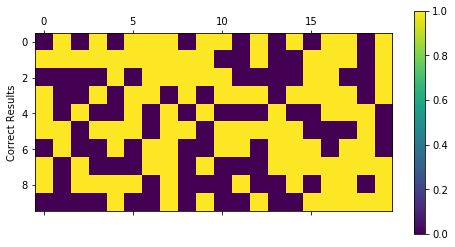

Final percentage:  tensor(0.5000)
Last epoch:  35


Best Score So Far:  tensor(-0.7522)


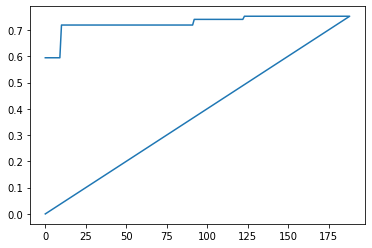

|  189      | -0.5      |  0.7008   |  233.5    |  1.986    |  2.609    |  0.02205  |  0.7307   |  0.2935   |  1.097e+0 |  1.99     |  0.5937   |  120.5    |  0.8785   |  0.2427   |  1.706    |  0.32     |  2.65     |  2.692    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

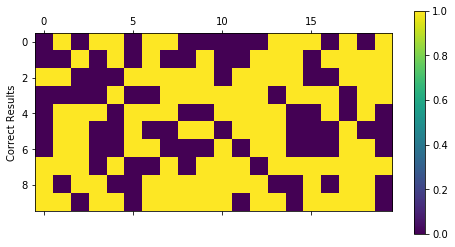

Final percentage:  tensor(0.6163)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


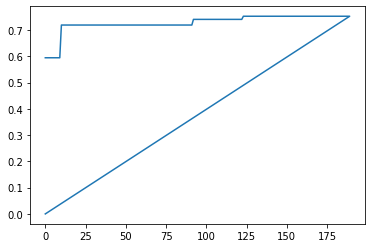

|  190      | -0.6163   |  0.3448   |  240.6    |  1.75     |  1.755    |  0.005515 |  0.2803   |  0.07709  |  1.812e+0 |  1.308    |  0.4647   |  41.52    |  0.2793   |  0.7943   |  2.257    |  0.9627   |  2.793    |  1.086    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

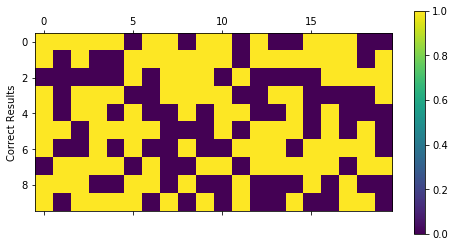

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


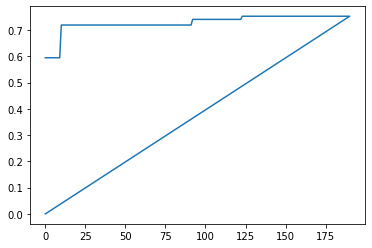

|  191      | -0.5      |  0.8271   |  7.7      |  1.625    |  1.44     |  0.05755  |  0.4749   |  0.4466   |  1.395e+0 |  2.515    |  0.1764   |  41.81    |  0.754    |  0.297    |  2.282    |  0.5649   |  3.69     |  8.917    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

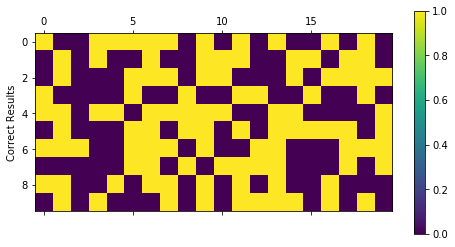

Final percentage:  tensor(0.5060)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


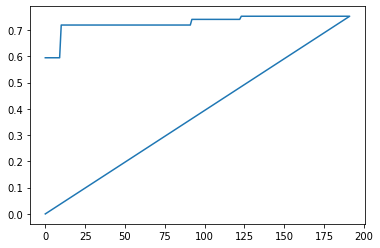

|  192      | -0.506    |  0.8818   |  54.0     |  2.258    |  1.904    |  0.06924  |  1.806    |  0.6261   |  1.625e+0 |  2.797    |  0.1915   |  167.4    |  0.8139   |  0.8301   |  2.824    |  0.5605   |  1.777    |  4.001    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

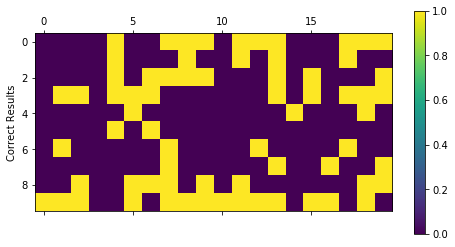

Final percentage:  tensor(0.3782)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


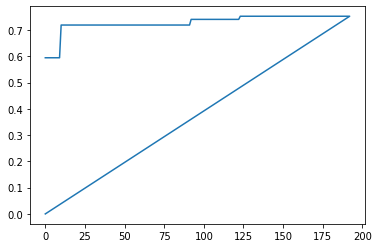

|  193      | -0.3782   |  1.986    |  135.5    |  2.624    |  1.785    |  0.05069  |  0.6936   |  0.4302   |  1.007e+0 |  3.621    |  0.5053   |  8.167    |  0.8175   |  0.1218   |  1.061    |  0.4619   |  3.872    |  1.842    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

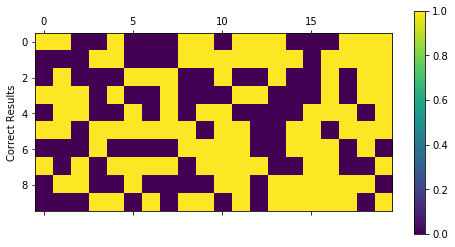

Final percentage:  tensor(0.5242)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


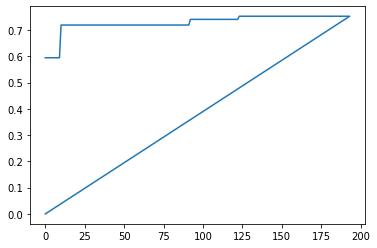

|  194      | -0.5242   |  0.1305   |  225.5    |  2.635    |  2.452    |  0.04678  |  0.8507   |  0.3209   |  1.582e+0 |  3.18     |  0.7059   |  168.3    |  0.5623   |  0.3712   |  1.637    |  0.286    |  1.886    |  7.138    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

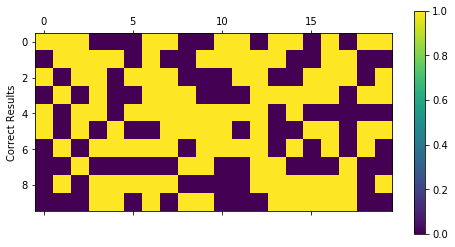

Final percentage:  tensor(0.5000)
Last epoch:  45


Best Score So Far:  tensor(-0.7522)


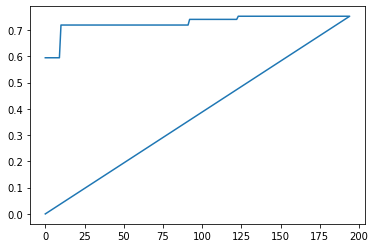

|  195      | -0.5      |  1.517    |  153.8    |  1.443    |  0.5812   |  0.07657  |  1.948    |  0.01273  |  1.249e+0 |  3.369    |  0.6473   |  64.48    |  0.5548   |  0.527    |  2.436    |  0.4632   |  2.21     |  3.769    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

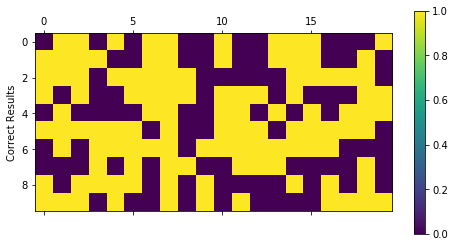

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


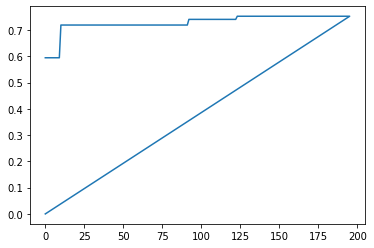

|  196      | -0.5      |  0.4742   |  25.5     |  2.285    |  2.002    |  0.06873  |  0.00626  |  0.3506   |  1.123e+0 |  2.575    |  0.8818   |  128.8    |  0.3749   |  0.7325   |  2.927    |  0.2868   |  3.401    |  9.955    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

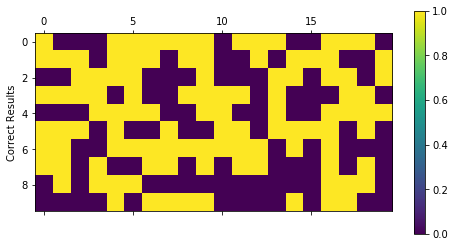

Final percentage:  tensor(0.5837)
Last epoch:  30


Best Score So Far:  tensor(-0.7522)


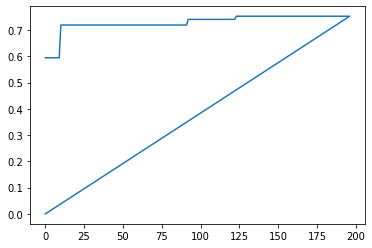

|  197      | -0.5837   |  0.2225   |  136.9    |  2.619    |  1.125    |  0.04458  |  1.494    |  0.07868  |  1.361e+0 |  2.685    |  0.2147   |  215.3    |  0.7653   |  0.869    |  2.041    |  0.1064   |  3.8      |  8.5      |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

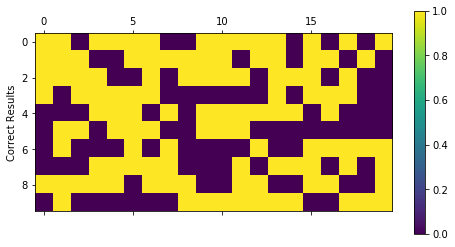

Final percentage:  tensor(0.5000)
Last epoch:  28


Best Score So Far:  tensor(-0.7522)


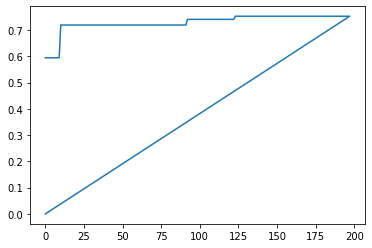

|  198      | -0.5      |  1.083    |  214.4    |  2.755    |  2.32     |  0.05713  |  1.224    |  0.6755   |  1.622e+0 |  1.617    |  0.6223   |  137.1    |  0.2637   |  0.000707 |  1.469    |  0.6729   |  3.626    |  8.468    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

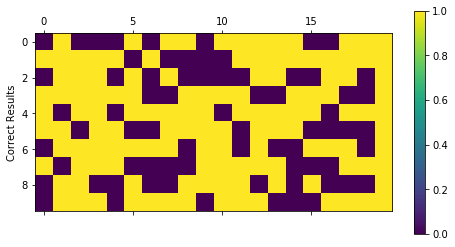

Final percentage:  tensor(0.6201)
Last epoch:  39


Best Score So Far:  tensor(-0.7522)


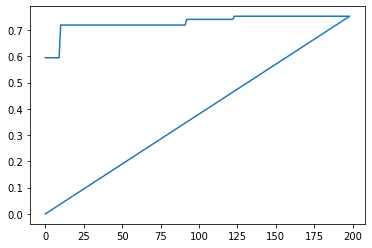

|  199      | -0.6201   |  0.2151   |  20.07    |  2.516    |  0.8517   |  0.02718  |  0.003981 |  0.07883  |  1.136e+0 |  1.476    |  0.4008   |  208.8    |  0.8117   |  0.819    |  1.883    |  0.708    |  2.46     |  1.448    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

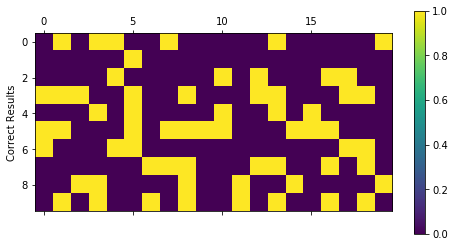

Final percentage:  tensor(0.3376)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


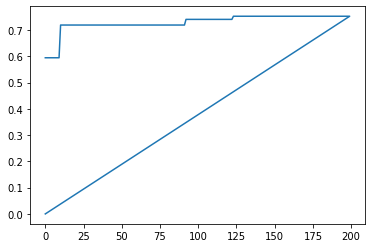

|  200      | -0.3376   |  0.1601   |  64.47    |  2.953    |  2.069    |  0.0268   |  1.405    |  0.5291   |  1.043e+0 |  2.081    |  0.6964   |  21.94    |  0.8836   |  0.8378   |  2.698    |  0.1173   |  2.69     |  7.361    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

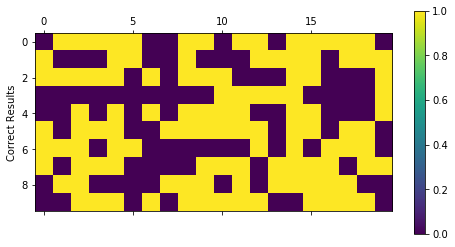

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


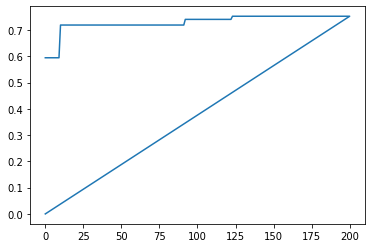

|  201      | -0.5      |  1.767    |  26.33    |  2.623    |  0.8313   |  0.05923  |  1.432    |  0.6216   |  1.295e+0 |  2.816    |  0.2587   |  255.6    |  0.8139   |  0.3726   |  2.749    |  0.7318   |  3.777    |  2.543    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

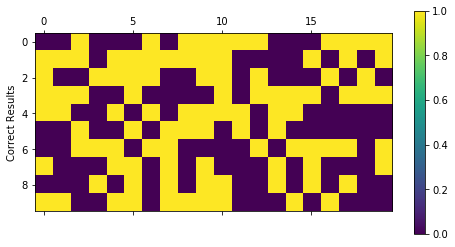

Final percentage:  tensor(0.5300)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


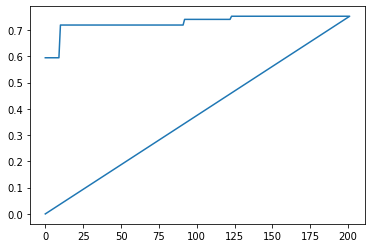

|  202      | -0.53     |  0.5867   |  25.81    |  1.633    |  1.14     |  0.06327  |  0.9383   |  0.5741   |  1.269e+0 |  1.517    |  0.3412   |  113.3    |  0.4223   |  0.8222   |  1.536    |  0.3517   |  1.643    |  4.344    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


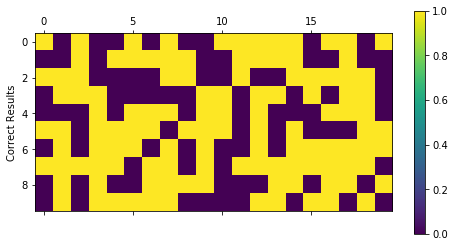

Final percentage:  tensor(0.5261)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


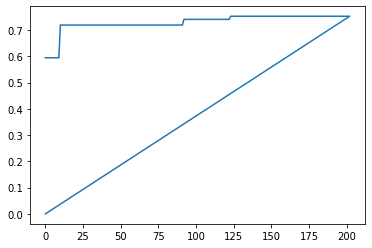

|  203      | -0.5261   |  0.7758   |  148.2    |  1.554    |  0.7759   |  0.07191  |  1.811    |  0.09768  |  1.182e+0 |  1.398    |  0.6153   |  56.36    |  0.6044   |  0.1815   |  2.627    |  0.3158   |  3.002    |  2.337    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

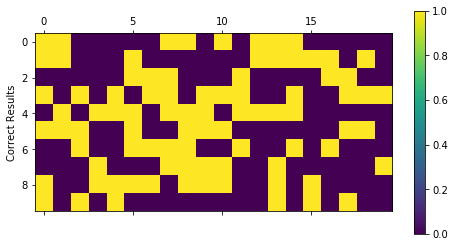

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


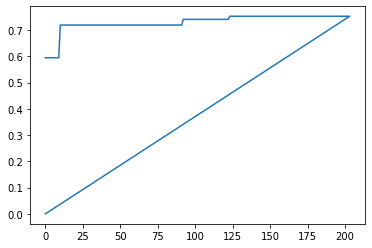

|  204      | -0.5      |  0.6088   |  77.5     |  2.264    |  2.036    |  0.08452  |  0.3649   |  0.6083   |  1.712e+0 |  2.667    |  0.5852   |  24.86    |  0.1476   |  0.374    |  2.416    |  0.1677   |  2.163    |  5.477    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

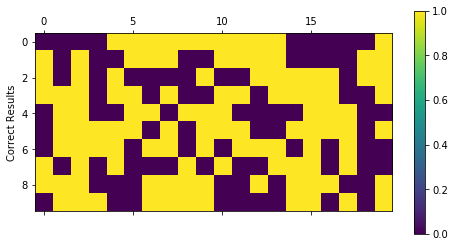

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


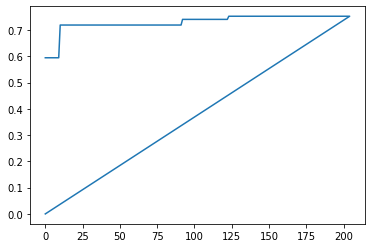

|  205      | -0.5      |  1.861    |  16.02    |  2.65     |  2.943    |  0.02673  |  1.771    |  0.2322   |  1.799e+0 |  2.375    |  0.5379   |  62.11    |  0.6872   |  0.1338   |  2.114    |  0.4938   |  3.503    |  5.328    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

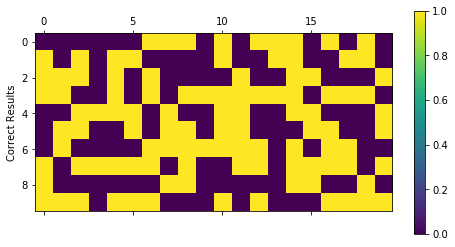

Final percentage:  tensor(0.5632)
Last epoch:  73


Best Score So Far:  tensor(-0.7522)


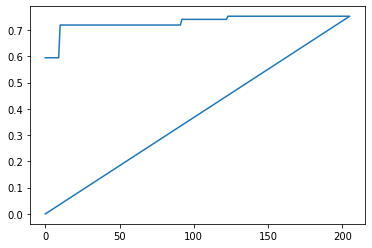

|  206      | -0.5632   |  1.562    |  103.7    |  1.613    |  2.354    |  0.04185  |  0.9886   |  0.4619   |  1.82e+03 |  2.738    |  0.3655   |  42.79    |  0.7017   |  0.7949   |  1.216    |  0.4657   |  3.794    |  6.066    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

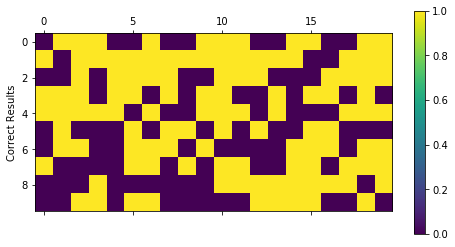

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


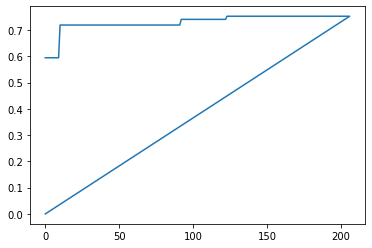

|  207      | -0.5      |  1.085    |  18.12    |  2.065    |  1.957    |  0.01466  |  1.903    |  0.1569   |  1.674e+0 |  1.82     |  0.0976   |  68.27    |  0.3345   |  0.4183   |  1.466    |  0.7268   |  3.414    |  8.111    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

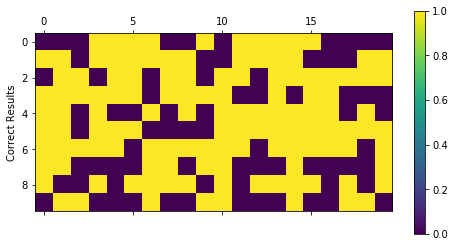

Final percentage:  tensor(0.6512)
Last epoch:  61


Best Score So Far:  tensor(-0.7522)


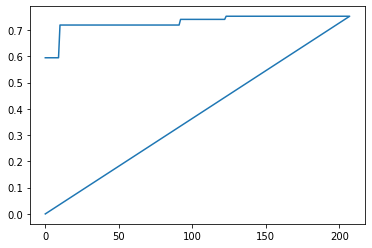

|  208      | -0.6512   |  1.424    |  70.49    |  1.419    |  0.3263   |  0.03967  |  0.1737   |  0.5243   |  1.95e+03 |  3.259    |  0.1052   |  7.202    |  0.3352   |  0.8936   |  1.623    |  0.7368   |  3.142    |  6.147    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

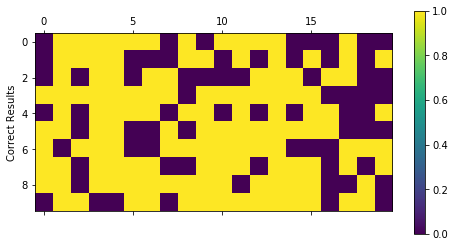

Final percentage:  tensor(0.6430)
Last epoch:  56


Best Score So Far:  tensor(-0.7522)


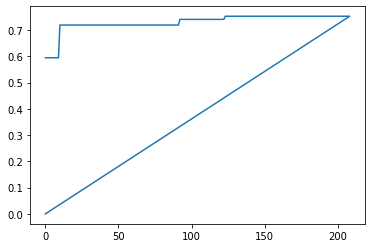

|  209      | -0.643    |  0.7316   |  54.9     |  2.95     |  0.197    |  0.02362  |  0.6147   |  0.7276   |  1.713e+0 |  1.793    |  0.1481   |  225.6    |  0.7932   |  0.03455  |  2.75     |  0.5874   |  2.368    |  7.058    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

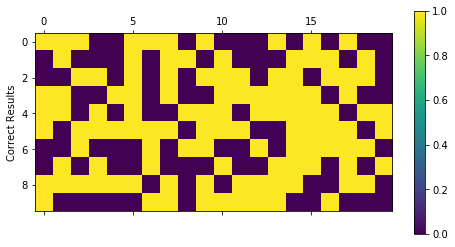

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


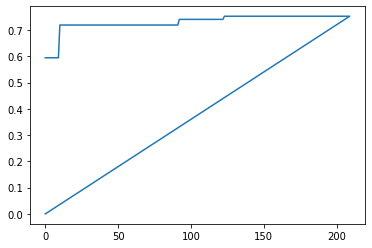

|  210      | -0.5      |  0.07849  |  85.9     |  1.175    |  2.044    |  0.0398   |  0.9531   |  0.2318   |  1.788e+0 |  1.139    |  0.253    |  152.0    |  0.7896   |  0.5414   |  2.454    |  0.0235   |  1.762    |  1.378    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

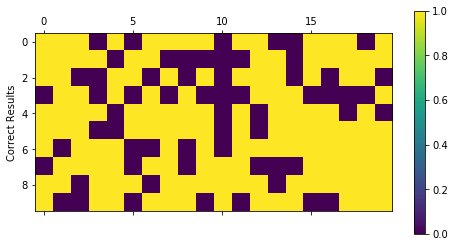

Final percentage:  tensor(0.6467)
Last epoch:  44


Best Score So Far:  tensor(-0.7522)


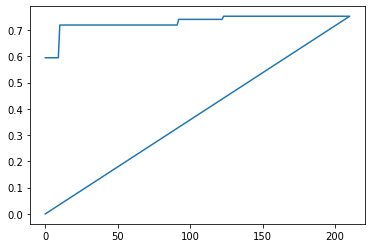

|  211      | -0.6467   |  0.995    |  253.2    |  1.027    |  1.318    |  0.000478 |  1.22     |  0.1467   |  1.713e+0 |  1.477    |  0.7457   |  54.37    |  0.3525   |  0.2075   |  2.607    |  0.4898   |  3.613    |  2.169    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

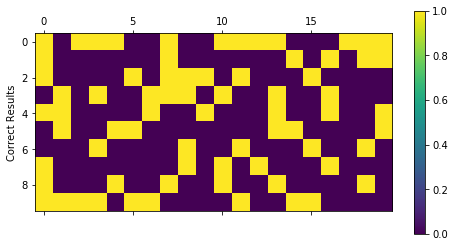

Final percentage:  tensor(0.3785)
Last epoch:  1761


Best Score So Far:  tensor(-0.7522)


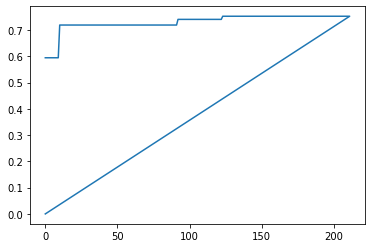

|  212      | -0.3785   |  0.9929   |  199.3    |  2.953    |  2.013    |  0.0183   |  1.512    |  0.05971  |  1.763e+0 |  3.475    |  0.5033   |  127.2    |  0.9357   |  8.726e-0 |  1.019    |  0.2517   |  2.512    |  5.858    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

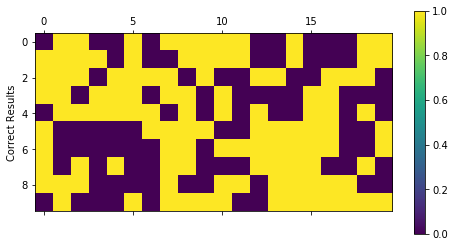

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


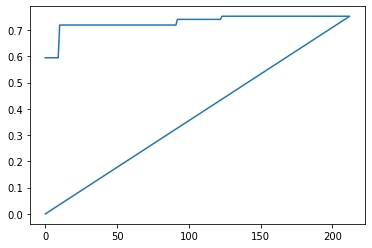

|  213      | -0.5      |  0.7389   |  76.35    |  1.403    |  2.393    |  0.03159  |  0.98     |  0.649    |  1.612e+0 |  2.222    |  0.1592   |  103.0    |  0.4852   |  0.8915   |  1.566    |  0.1655   |  1.66     |  2.901    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

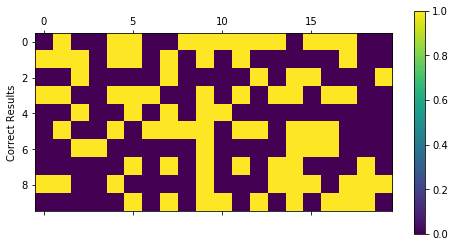

Final percentage:  tensor(0.5000)
Last epoch:  25


Best Score So Far:  tensor(-0.7522)


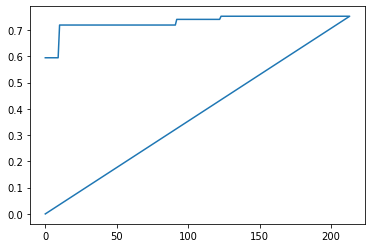

|  214      | -0.5      |  0.1513   |  94.69    |  1.567    |  2.654    |  0.07803  |  0.217    |  0.6804   |  1.11e+03 |  3.153    |  0.5155   |  24.05    |  0.9045   |  0.7871   |  2.679    |  0.3692   |  1.667    |  9.964    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

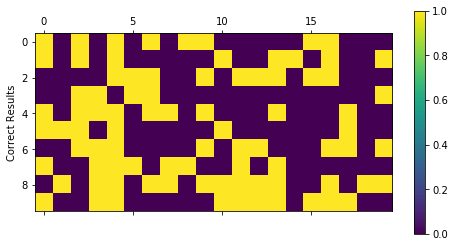

Final percentage:  tensor(0.4942)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


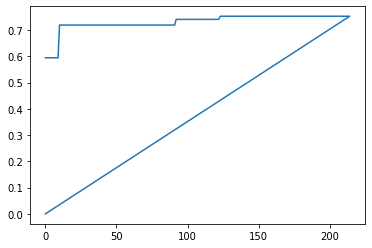

|  215      | -0.4942   |  1.627    |  12.7     |  1.743    |  2.428    |  0.05284  |  0.4918   |  0.6343   |  1.262e+0 |  1.001    |  0.2082   |  254.3    |  0.6559   |  0.1986   |  2.365    |  0.6862   |  2.916    |  1.634    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

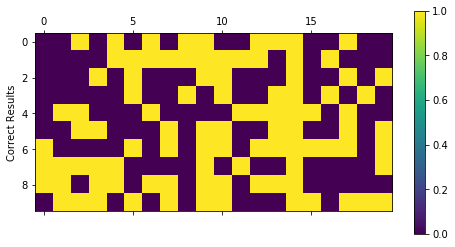

Final percentage:  tensor(0.4725)
Last epoch:  228


Best Score So Far:  tensor(-0.7522)


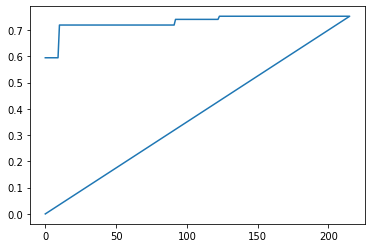

|  216      | -0.4725   |  0.4835   |  223.2    |  2.462    |  0.5018   |  0.02986  |  1.12     |  0.6612   |  1.201e+0 |  1.304    |  0.3437   |  233.7    |  0.261    |  0.09747  |  1.111    |  0.3513   |  1.113    |  6.241    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

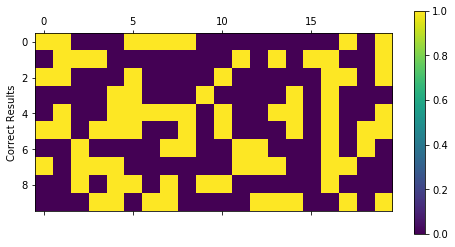

Final percentage:  tensor(0.4225)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


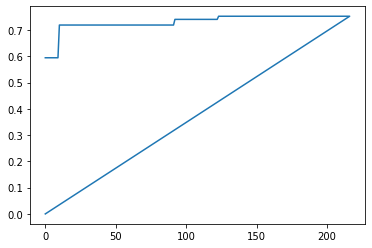

|  217      | -0.4225   |  1.338    |  119.0    |  2.475    |  1.498    |  0.07024  |  0.459    |  0.5957   |  1.502e+0 |  3.109    |  0.402    |  130.5    |  0.04245  |  0.4404   |  1.283    |  0.1424   |  2.296    |  6.18     |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

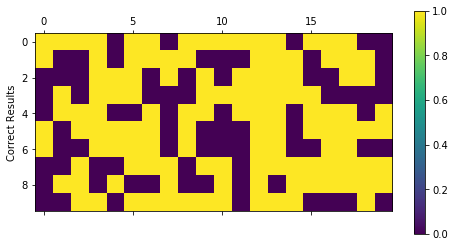

Final percentage:  tensor(0.6095)
Last epoch:  36


Best Score So Far:  tensor(-0.7522)


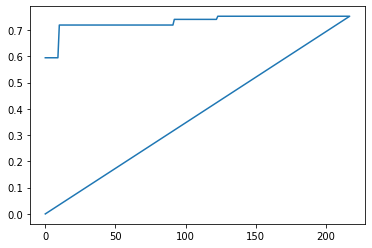

|  218      | -0.6095   |  0.6827   |  42.76    |  2.475    |  2.88     |  0.07336  |  0.1534   |  0.6727   |  1.068e+0 |  2.305    |  0.836    |  68.85    |  0.1287   |  0.686    |  2.848    |  0.3254   |  1.695    |  2.641    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

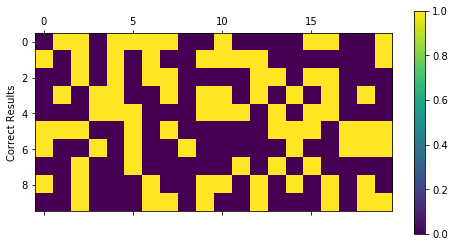

Final percentage:  tensor(0.4873)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


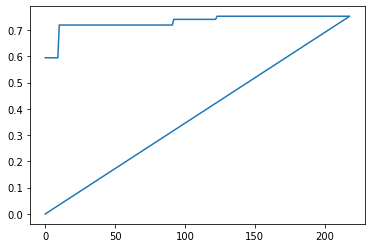

|  219      | -0.4873   |  1.917    |  148.5    |  2.712    |  0.922    |  0.005644 |  0.9031   |  0.1657   |  1.519e+0 |  2.609    |  0.2649   |  80.09    |  0.02513  |  0.3784   |  1.644    |  0.6189   |  3.571    |  5.429    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

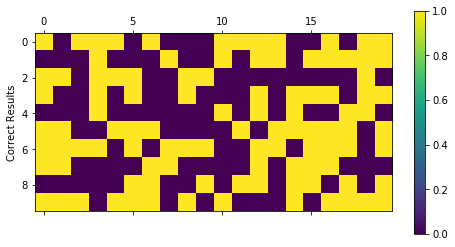

Final percentage:  tensor(0.5216)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


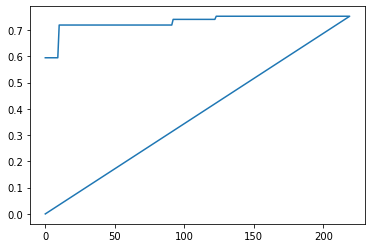

|  220      | -0.5216   |  0.1646   |  239.1    |  2.609    |  1.093    |  0.03307  |  1.866    |  0.2999   |  1.636e+0 |  3.946    |  0.03308  |  81.92    |  0.2318   |  0.8301   |  2.097    |  0.05366  |  3.258    |  7.15     |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

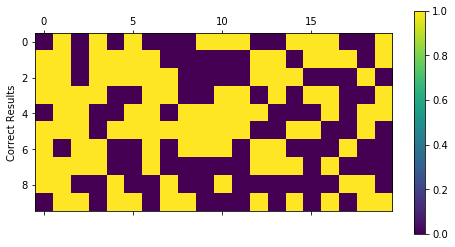

Final percentage:  tensor(0.5194)
Last epoch:  267


Best Score So Far:  tensor(-0.7522)


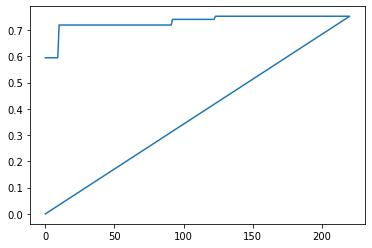

|  221      | -0.5194   |  1.318    |  244.8    |  2.74     |  2.252    |  0.02227  |  0.2746   |  0.1767   |  1.206e+0 |  2.698    |  0.5967   |  136.0    |  0.05724  |  0.3268   |  2.926    |  0.6948   |  2.106    |  7.038    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

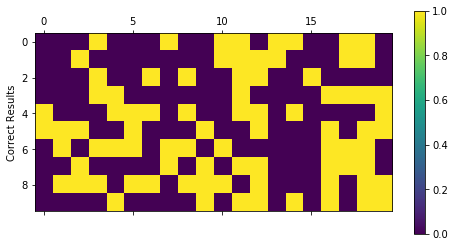

Final percentage:  tensor(0.4884)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


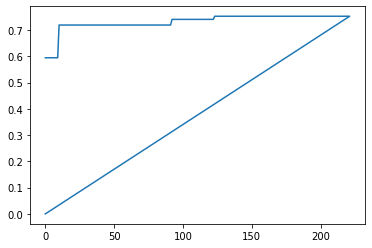

|  222      | -0.4884   |  0.5276   |  21.68    |  2.051    |  0.8664   |  0.04817  |  1.795    |  0.5214   |  1.723e+0 |  1.307    |  0.4317   |  104.7    |  0.6466   |  0.259    |  1.762    |  0.98     |  1.343    |  2.797    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

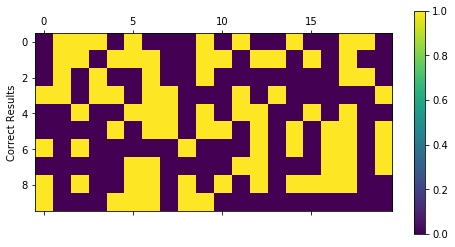

Final percentage:  tensor(0.4357)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


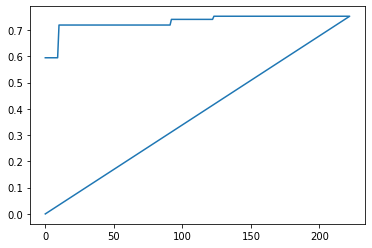

|  223      | -0.4357   |  0.4757   |  179.0    |  2.42     |  2.346    |  0.0381   |  1.696    |  0.5579   |  1.713e+0 |  3.458    |  0.566    |  109.2    |  0.03174  |  0.5359   |  2.122    |  0.6002   |  1.965    |  5.988    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

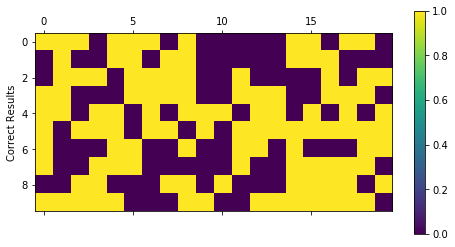

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


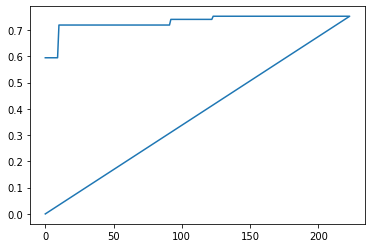

|  224      | -0.5      |  0.3416   |  167.1    |  1.143    |  2.616    |  0.02161  |  0.5848   |  0.7078   |  1.884e+0 |  3.5      |  0.2942   |  231.2    |  0.7713   |  0.5923   |  2.791    |  0.7823   |  2.27     |  3.915    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

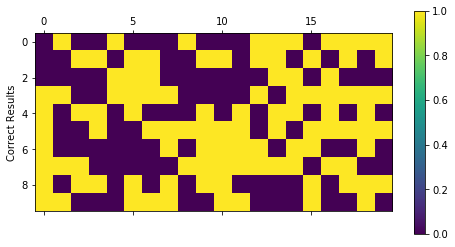

Final percentage:  tensor(0.5134)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


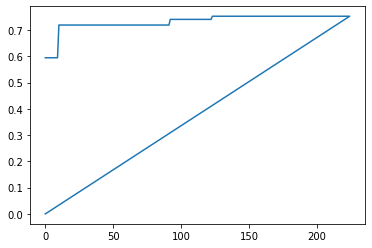

|  225      | -0.5134   |  0.7838   |  17.6     |  1.723    |  1.056    |  0.08656  |  1.769    |  0.7704   |  1.328e+0 |  3.073    |  0.5698   |  63.58    |  0.8692   |  0.1927   |  2.488    |  0.1445   |  1.319    |  7.476    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

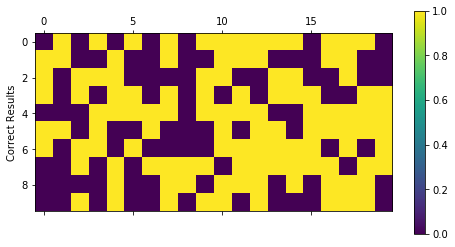

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


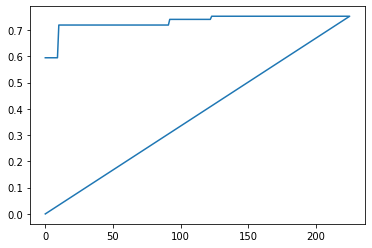

|  226      | -0.5      |  1.047    |  114.5    |  2.549    |  1.073    |  0.08533  |  1.915    |  0.7833   |  1.278e+0 |  2.241    |  0.6525   |  229.3    |  0.7109   |  0.6823   |  2.758    |  0.3666   |  2.622    |  5.808    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

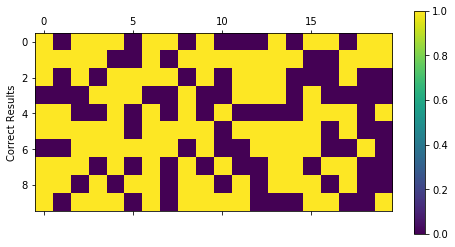

Final percentage:  tensor(0.5889)
Last epoch:  113


Best Score So Far:  tensor(-0.7522)


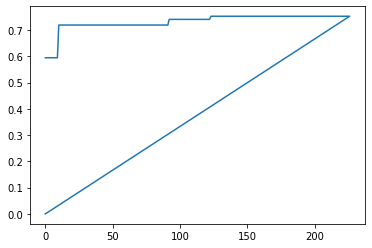

|  227      | -0.5889   |  1.289    |  229.4    |  2.196    |  2.9      |  0.07321  |  0.8264   |  0.4649   |  1.922e+0 |  2.849    |  0.6389   |  170.0    |  0.3365   |  0.183    |  1.812    |  0.1506   |  3.471    |  7.387    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

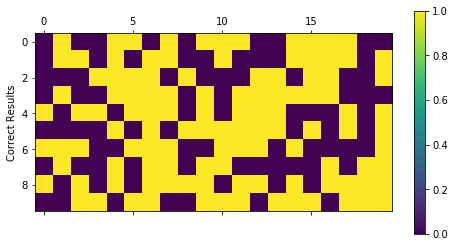

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


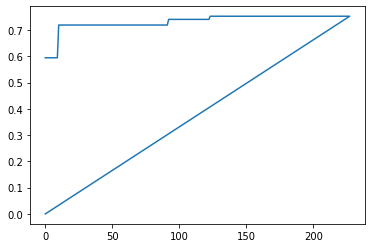

|  228      | -0.5      |  0.7981   |  45.53    |  2.743    |  1.911    |  0.09966  |  0.2012   |  0.1959   |  1.084e+0 |  3.227    |  0.1436   |  225.9    |  0.4915   |  0.4736   |  1.085    |  0.6134   |  1.681    |  2.919    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

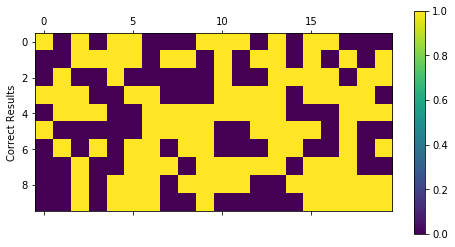

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


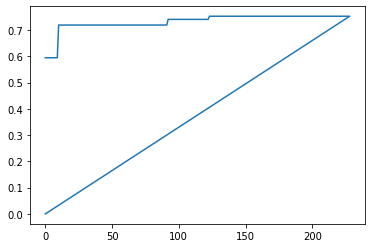

|  229      | -0.5      |  1.782    |  227.6    |  1.01     |  2.489    |  0.09023  |  1.019    |  0.5249   |  1.768e+0 |  3.049    |  0.4132   |  147.7    |  0.5739   |  0.7579   |  1.478    |  0.7565   |  3.429    |  8.165    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

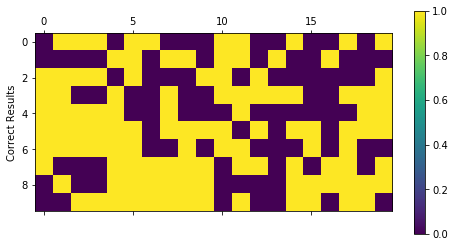

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


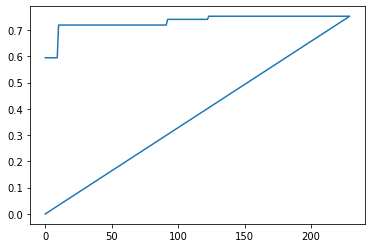

|  230      | -0.5      |  1.607    |  212.6    |  1.831    |  1.847    |  0.07552  |  1.532    |  0.7669   |  1.975e+0 |  2.689    |  0.4192   |  214.2    |  0.2205   |  0.6898   |  1.382    |  0.591    |  2.814    |  4.972    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

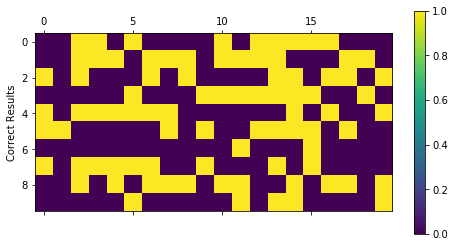

Final percentage:  tensor(0.4942)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


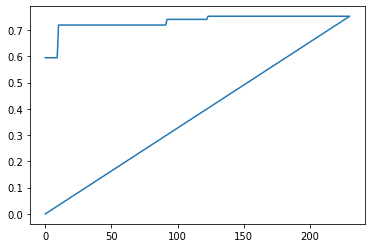

|  231      | -0.4942   |  1.72     |  140.0    |  1.981    |  1.25     |  0.006223 |  0.7207   |  0.07425  |  1.566e+0 |  2.915    |  0.691    |  162.7    |  0.1877   |  0.6752   |  2.092    |  0.1021   |  1.074    |  3.686    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

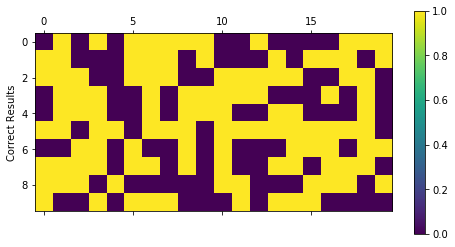

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


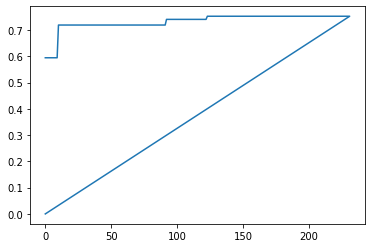

|  232      | -0.5      |  1.373    |  238.9    |  2.923    |  2.286    |  0.02932  |  1.238    |  0.1849   |  1.751e+0 |  1.496    |  0.6808   |  222.6    |  0.5195   |  0.05907  |  1.893    |  0.837    |  1.537    |  1.347    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

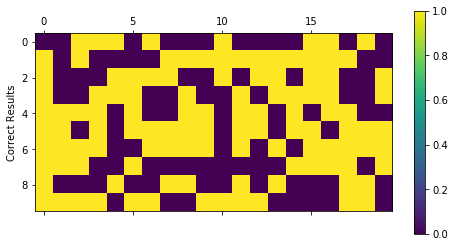

Final percentage:  tensor(0.5000)
Last epoch:  67


Best Score So Far:  tensor(-0.7522)


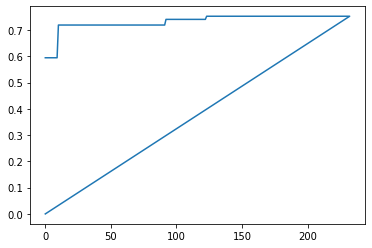

|  233      | -0.5      |  1.458    |  145.0    |  1.084    |  2.945    |  0.05693  |  1.164    |  0.6319   |  1.903e+0 |  1.182    |  0.3137   |  52.82    |  0.4652   |  0.08232  |  1.135    |  0.3006   |  3.704    |  9.77     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

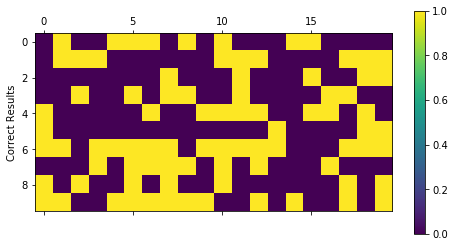

Final percentage:  tensor(0.4784)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


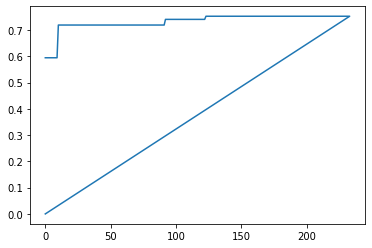

|  234      | -0.4784   |  1.52     |  2.188    |  2.463    |  0.06576  |  0.01686  |  0.02092  |  0.1193   |  1.688e+0 |  3.099    |  0.334    |  187.7    |  0.8466   |  0.1173   |  1.174    |  0.3715   |  2.208    |  3.485    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

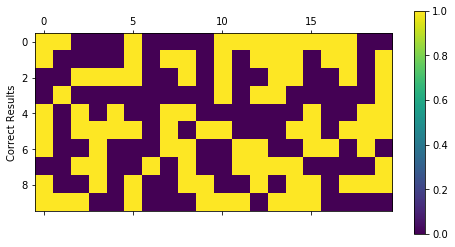

Final percentage:  tensor(0.4683)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


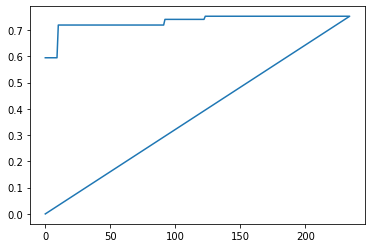

|  235      | -0.4683   |  1.501    |  83.73    |  2.592    |  2.725    |  0.05131  |  0.8545   |  0.07328  |  1.274e+0 |  3.651    |  0.2214   |  159.8    |  0.495    |  0.08494  |  2.79     |  0.0677   |  3.035    |  9.738    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

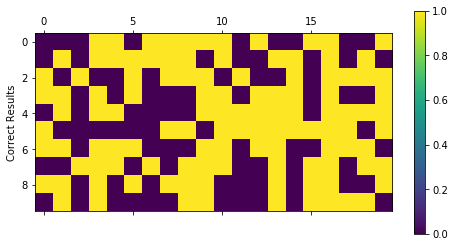

Final percentage:  tensor(0.5744)
Last epoch:  25


Best Score So Far:  tensor(-0.7522)


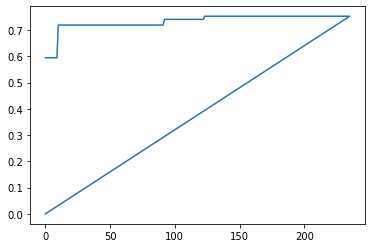

|  236      | -0.5744   |  1.412    |  84.78    |  1.146    |  1.733    |  0.07335  |  0.7141   |  0.523    |  1.567e+0 |  1.102    |  0.8286   |  98.52    |  0.3796   |  0.7617   |  1.964    |  0.4506   |  2.913    |  2.904    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

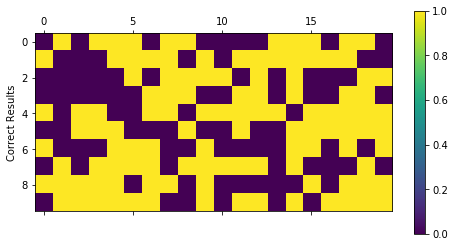

Final percentage:  tensor(0.5000)
Last epoch:  516


Best Score So Far:  tensor(-0.7522)


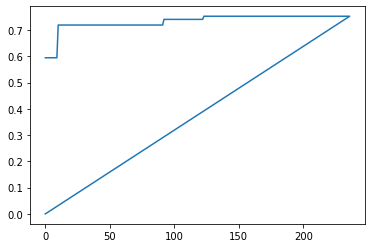

|  237      | -0.5      |  1.051    |  171.8    |  2.072    |  2.119    |  0.05985  |  1.674    |  0.7033   |  1.098e+0 |  1.773    |  0.0492   |  60.14    |  0.7205   |  0.07069  |  1.309    |  0.77     |  2.329    |  3.608    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

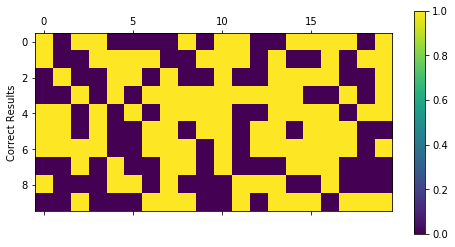

Final percentage:  tensor(0.5000)
Last epoch:  1495


Best Score So Far:  tensor(-0.7522)


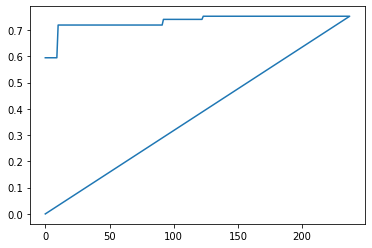

|  238      | -0.5      |  1.282    |  227.3    |  1.075    |  2.072    |  0.06686  |  1.727    |  0.1571   |  1.713e+0 |  1.311    |  0.05097  |  174.9    |  0.02359  |  0.03987  |  1.074    |  0.4649   |  3.266    |  9.92     |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

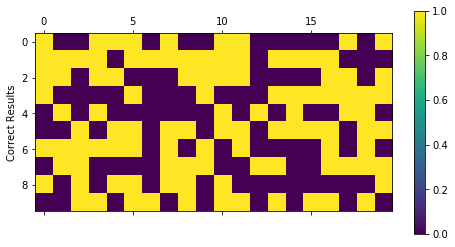

Final percentage:  tensor(0.4792)
Last epoch:  31


Best Score So Far:  tensor(-0.7522)


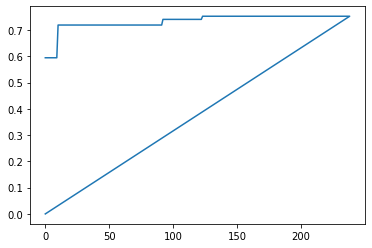

|  239      | -0.4792   |  0.4509   |  203.3    |  2.583    |  2.608    |  0.03143  |  0.2645   |  0.6374   |  1.567e+0 |  2.24     |  0.05279  |  3.665    |  0.3164   |  0.2443   |  1.947    |  0.9227   |  2.246    |  3.588    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

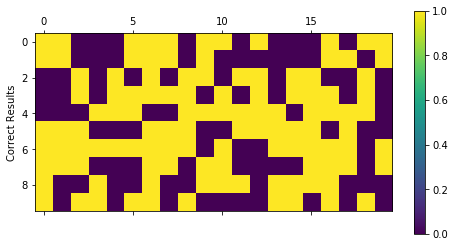

Final percentage:  tensor(0.5000)
Last epoch:  25


Best Score So Far:  tensor(-0.7522)


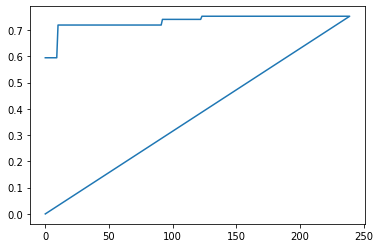

|  240      | -0.5      |  1.682    |  79.97    |  2.822    |  2.582    |  0.06388  |  1.488    |  0.1259   |  1.603e+0 |  1.978    |  0.4398   |  59.25    |  0.9012   |  0.3704   |  1.949    |  0.7207   |  1.365    |  5.523    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

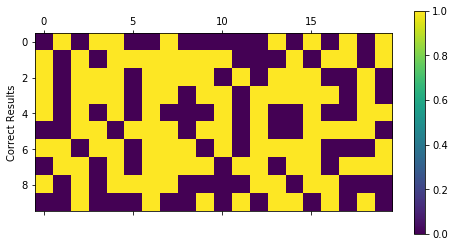

Final percentage:  tensor(0.5000)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


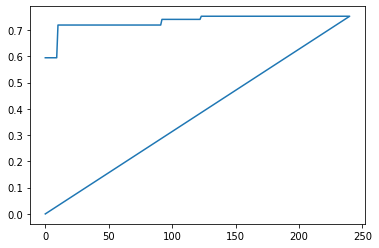

|  241      | -0.5      |  1.618    |  174.0    |  1.64     |  2.125    |  0.09344  |  1.781    |  0.5938   |  1.266e+0 |  2.114    |  0.5026   |  98.79    |  0.4558   |  0.7142   |  1.207    |  0.972    |  3.107    |  8.774    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

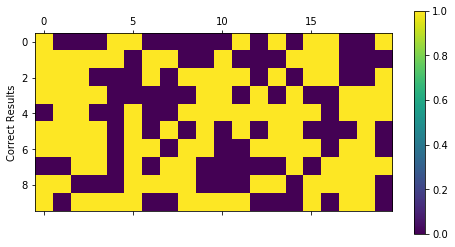

Final percentage:  tensor(0.5187)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


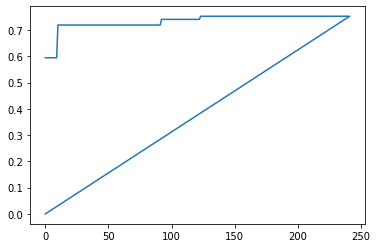

|  242      | -0.5187   |  1.556    |  111.8    |  2.876    |  0.7567   |  0.004625 |  0.1928   |  0.1606   |  1.539e+0 |  1.669    |  0.7518   |  4.372    |  0.7454   |  0.8721   |  1.532    |  0.6232   |  3.137    |  3.939    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

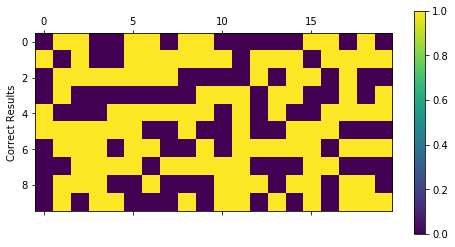

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


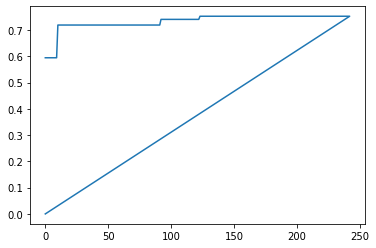

|  243      | -0.5      |  0.8619   |  188.5    |  1.261    |  0.4296   |  0.03754  |  0.4545   |  0.2456   |  1.15e+03 |  1.289    |  0.8244   |  89.86    |  0.5658   |  0.4925   |  1.896    |  0.7471   |  1.991    |  9.023    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

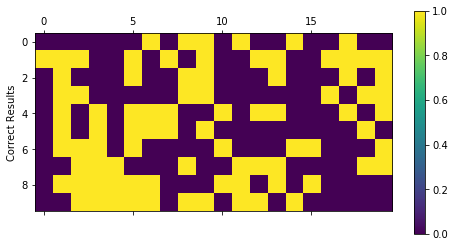

Final percentage:  tensor(0.5000)
Last epoch:  533


Best Score So Far:  tensor(-0.7522)


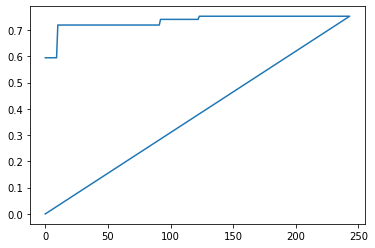

|  244      | -0.5      |  0.1354   |  148.0    |  1.675    |  1.088    |  0.03051  |  1.201    |  0.1875   |  1.294e+0 |  1.854    |  0.006126 |  96.39    |  0.0498   |  0.7869   |  2.436    |  0.5947   |  3.224    |  9.101    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

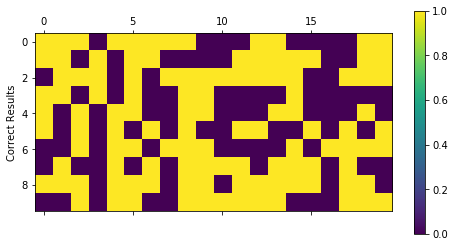

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


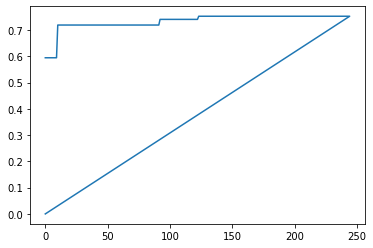

|  245      | -0.5      |  1.381    |  152.1    |  1.247    |  1.21     |  0.0579   |  1.2      |  0.7686   |  1.206e+0 |  2.983    |  0.2308   |  108.1    |  0.971    |  0.298    |  1.72     |  0.4391   |  1.122    |  4.583    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

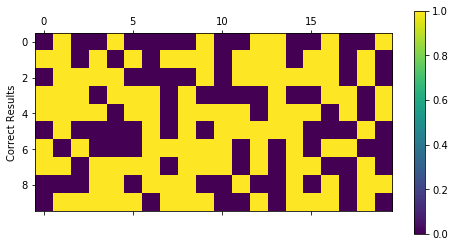

Final percentage:  tensor(0.5000)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


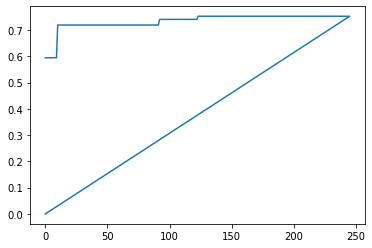

|  246      | -0.5      |  1.232    |  148.8    |  2.738    |  1.917    |  0.0557   |  1.275    |  0.03809  |  1.996e+0 |  1.454    |  0.3766   |  76.99    |  0.5771   |  0.5036   |  1.701    |  0.9727   |  3.246    |  9.0      |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

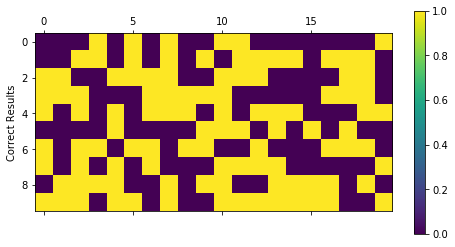

Final percentage:  tensor(0.4677)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


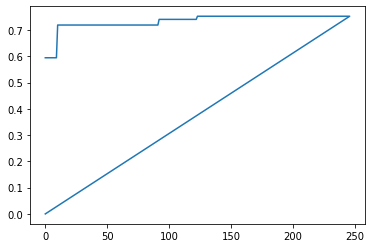

|  247      | -0.4677   |  0.9063   |  154.2    |  1.823    |  0.9097   |  0.05255  |  0.38     |  0.1713   |  1.511e+0 |  1.041    |  0.4009   |  255.2    |  0.822    |  0.07511  |  2.305    |  0.2252   |  1.353    |  4.135    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

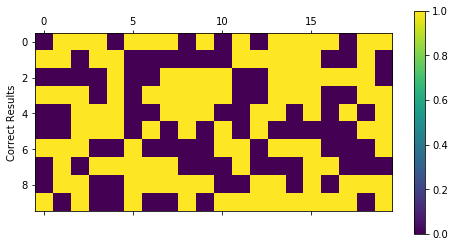

Final percentage:  tensor(0.5000)
Last epoch:  30


Best Score So Far:  tensor(-0.7522)


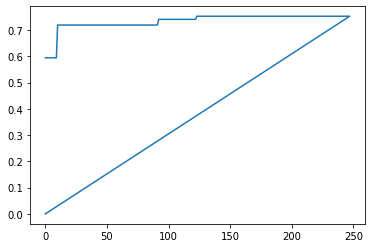

|  248      | -0.5      |  1.348    |  141.9    |  1.087    |  2.562    |  0.04776  |  1.705    |  0.1501   |  1.084e+0 |  2.543    |  0.4091   |  5.529    |  0.04028  |  0.08427  |  1.081    |  0.1756   |  2.721    |  5.286    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

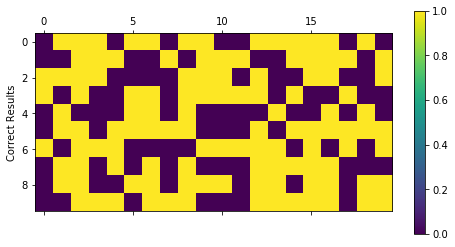

Final percentage:  tensor(0.5859)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


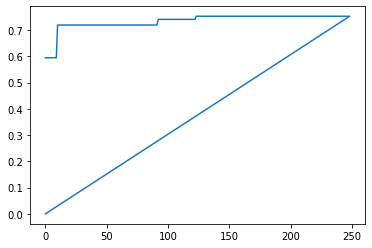

|  249      | -0.5859   |  1.95     |  19.97    |  2.726    |  1.73     |  0.08765  |  0.1109   |  0.07932  |  1.863e+0 |  2.705    |  0.5026   |  5.305    |  0.642    |  0.7629   |  2.982    |  0.4325   |  1.931    |  4.639    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

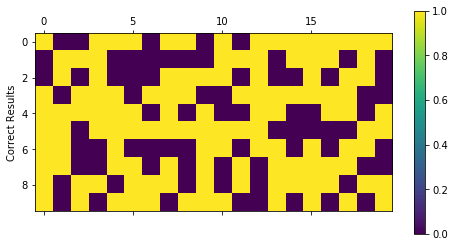

Final percentage:  tensor(0.5967)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


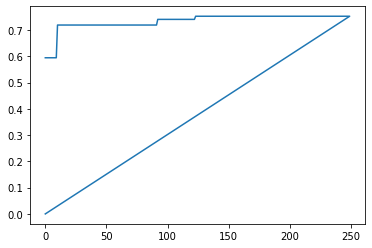

|  250      | -0.5967   |  0.4538   |  59.43    |  1.863    |  2.047    |  0.06607  |  1.537    |  0.1735   |  1.729e+0 |  3.378    |  0.5056   |  120.3    |  0.1589   |  0.04181  |  1.923    |  0.6536   |  1.636    |  4.596    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

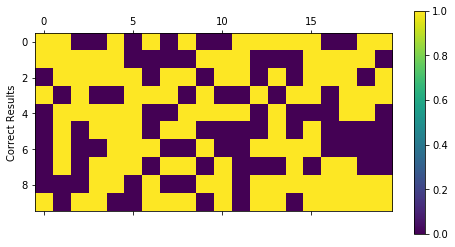

Final percentage:  tensor(0.6002)
Last epoch:  40


Best Score So Far:  tensor(-0.7522)


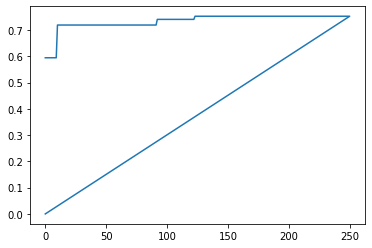

|  251      | -0.6002   |  0.9903   |  244.5    |  2.746    |  2.613    |  0.09966  |  1.539    |  0.1624   |  1.84e+03 |  1.497    |  0.8002   |  88.0     |  0.2884   |  0.5456   |  1.121    |  0.9062   |  2.139    |  8.102    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

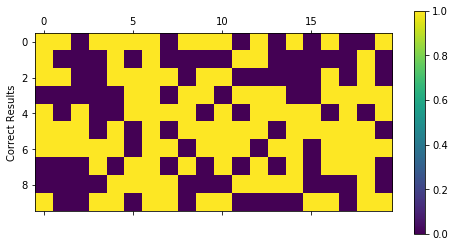

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


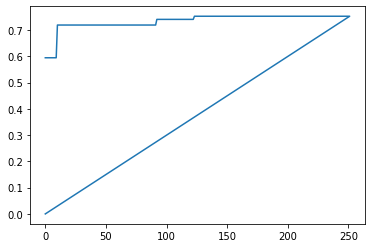

|  252      | -0.5      |  1.414    |  180.9    |  2.06     |  1.395    |  0.06454  |  1.376    |  0.1887   |  1.754e+0 |  3.8      |  0.7336   |  187.6    |  0.8211   |  0.006259 |  1.348    |  0.3416   |  3.193    |  9.796    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

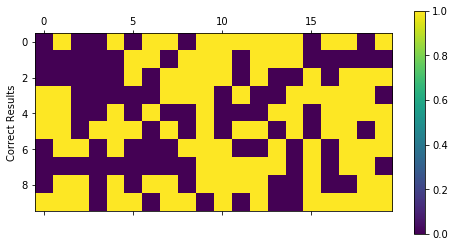

Final percentage:  tensor(0.5340)
Last epoch:  35


Best Score So Far:  tensor(-0.7522)


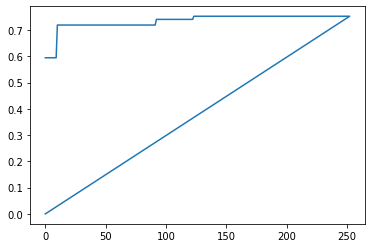

|  253      | -0.534    |  1.458    |  123.7    |  2.833    |  1.129    |  0.06417  |  0.002994 |  0.1435   |  1.295e+0 |  2.157    |  0.4138   |  204.4    |  0.2803   |  0.0744   |  2.038    |  0.9802   |  2.198    |  3.312    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

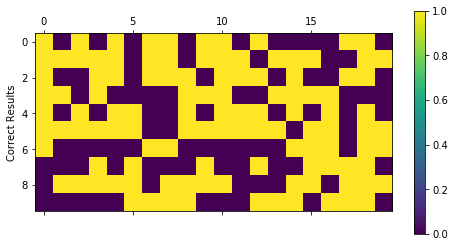

Final percentage:  tensor(0.5000)
Last epoch:  38


Best Score So Far:  tensor(-0.7522)


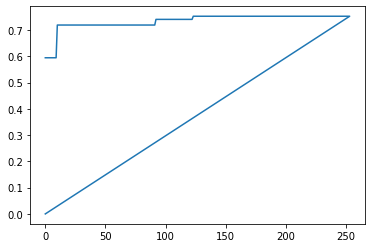

|  254      | -0.5      |  1.545    |  158.4    |  1.015    |  2.949    |  0.04889  |  0.605    |  0.5321   |  1.286e+0 |  2.386    |  0.5866   |  32.96    |  0.4673   |  0.6617   |  2.911    |  0.02137  |  3.489    |  9.443    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

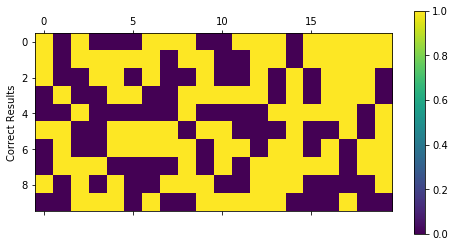

Final percentage:  tensor(0.5857)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


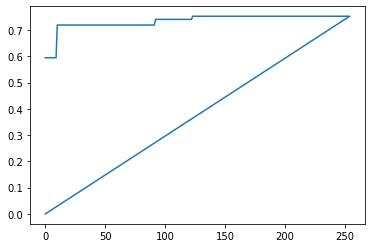

|  255      | -0.5857   |  1.962    |  240.2    |  1.257    |  2.649    |  0.01529  |  0.7174   |  0.2889   |  1.28e+03 |  2.061    |  0.4887   |  21.94    |  0.3731   |  0.5249   |  1.267    |  0.2427   |  1.935    |  1.67     |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

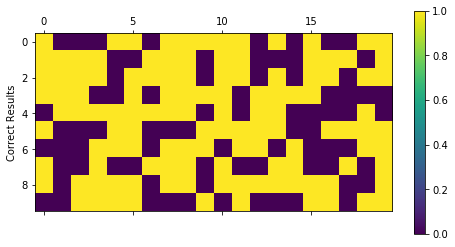

Final percentage:  tensor(0.5751)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


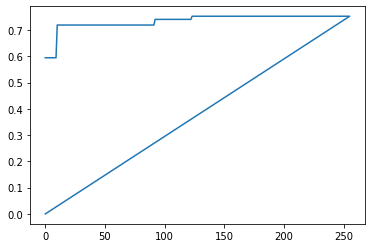

|  256      | -0.5751   |  1.607    |  68.9     |  1.817    |  1.212    |  0.03047  |  0.2542   |  0.7148   |  1.681e+0 |  1.798    |  0.0832   |  33.37    |  0.2769   |  0.04414  |  1.289    |  0.4746   |  3.799    |  4.902    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

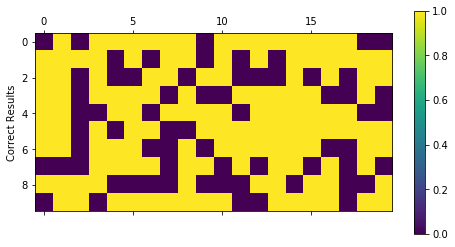

Final percentage:  tensor(0.6206)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


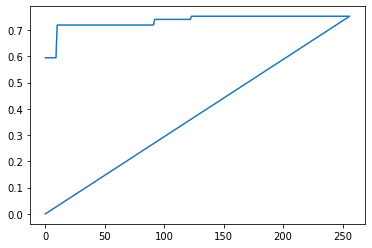

|  257      | -0.6206   |  1.411    |  146.9    |  2.943    |  0.5329   |  0.07391  |  0.6973   |  0.793    |  1.353e+0 |  3.927    |  0.7743   |  153.8    |  0.02839  |  0.167    |  1.112    |  0.7917   |  1.221    |  8.07     |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

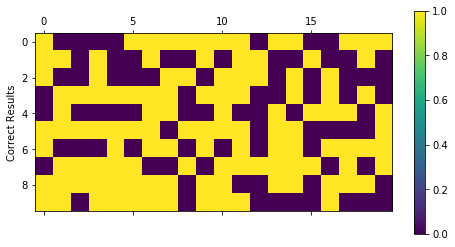

Final percentage:  tensor(0.5905)
Last epoch:  27


Best Score So Far:  tensor(-0.7522)


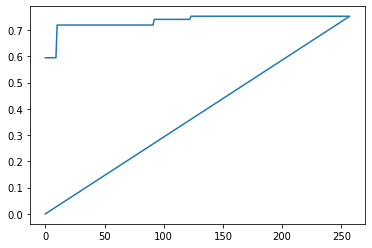

|  258      | -0.5905   |  0.05562  |  66.82    |  1.592    |  1.688    |  0.05621  |  1.766    |  0.5099   |  1.161e+0 |  1.081    |  0.6858   |  138.0    |  0.5785   |  0.3727   |  2.174    |  0.4052   |  2.333    |  6.329    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

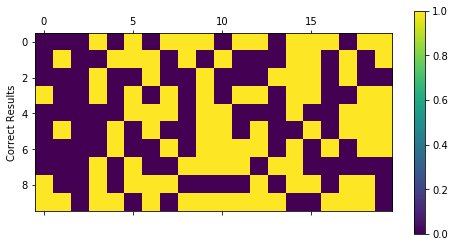

Final percentage:  tensor(0.5044)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


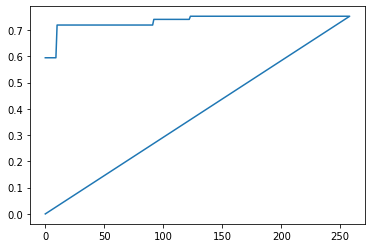

|  259      | -0.5044   |  0.9798   |  17.01    |  2.944    |  2.557    |  0.03791  |  1.088    |  0.7463   |  1.398e+0 |  3.825    |  0.02745  |  191.4    |  0.7964   |  0.1745   |  1.324    |  0.5905   |  2.434    |  6.273    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

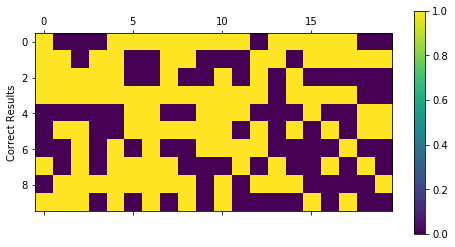

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


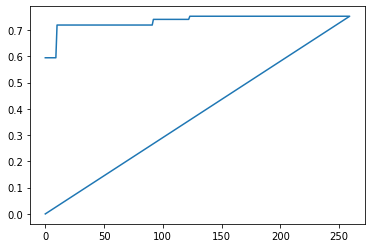

|  260      | -0.5      |  0.2632   |  72.55    |  1.139    |  0.3229   |  0.07164  |  0.05254  |  0.4317   |  1.299e+0 |  3.597    |  0.4905   |  255.4    |  0.561    |  0.5059   |  1.667    |  0.2521   |  2.278    |  3.042    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

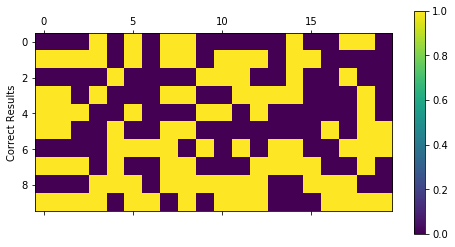

Final percentage:  tensor(0.4828)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


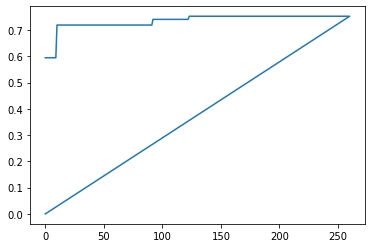

|  261      | -0.4828   |  0.141    |  110.0    |  1.212    |  2.162    |  0.02984  |  0.9758   |  0.1565   |  1.681e+0 |  3.484    |  0.1984   |  3.983    |  0.2514   |  0.5649   |  1.619    |  0.8354   |  3.55     |  4.342    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

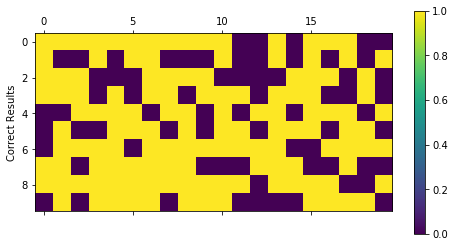

Final percentage:  tensor(0.6287)
Last epoch:  45


Best Score So Far:  tensor(-0.7522)


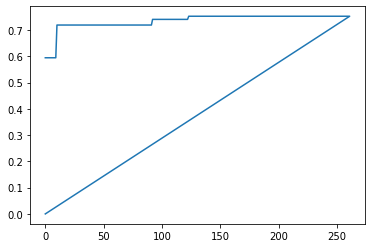

|  262      | -0.6287   |  0.727    |  6.207    |  2.094    |  0.4613   |  0.01127  |  0.1061   |  0.1434   |  1.156e+0 |  1.106    |  0.8842   |  169.2    |  0.3872   |  0.05624  |  1.094    |  0.8041   |  2.264    |  1.973    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

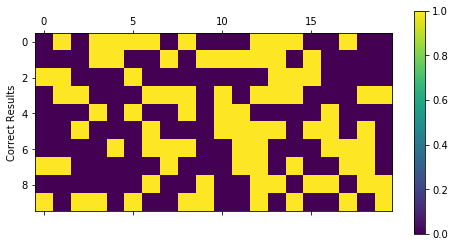

Final percentage:  tensor(0.5000)
Last epoch:  169


Best Score So Far:  tensor(-0.7522)


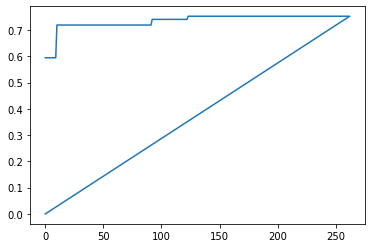

|  263      | -0.5      |  0.3324   |  174.8    |  1.85     |  0.2895   |  0.0392   |  0.08906  |  0.2168   |  1.503e+0 |  2.368    |  0.6918   |  42.7     |  0.51     |  0.1274   |  1.377    |  0.4095   |  1.436    |  6.055    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

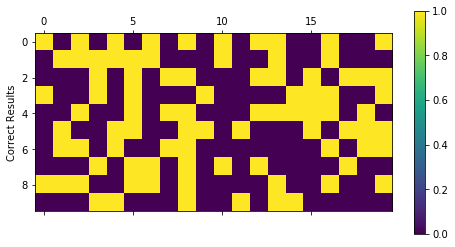

Final percentage:  tensor(0.4673)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


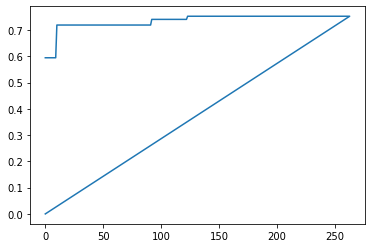

|  264      | -0.4673   |  0.9059   |  241.3    |  2.333    |  0.3084   |  0.06071  |  0.8365   |  0.4005   |  1.656e+0 |  1.555    |  0.3236   |  124.0    |  0.6146   |  0.257    |  2.001    |  0.2783   |  2.711    |  4.077    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

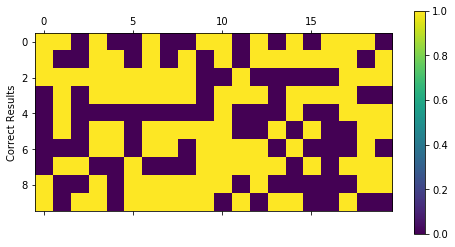

Final percentage:  tensor(0.5000)
Last epoch:  30


Best Score So Far:  tensor(-0.7522)


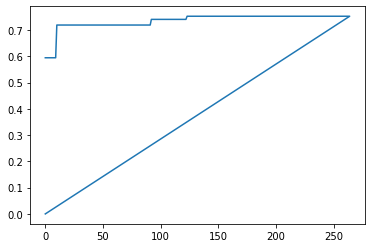

|  265      | -0.5      |  1.67     |  176.2    |  2.624    |  0.4612   |  0.01852  |  1.08     |  0.04912  |  1.538e+0 |  2.005    |  0.292    |  60.38    |  0.005677 |  0.6184   |  2.498    |  0.3379   |  2.405    |  8.168    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

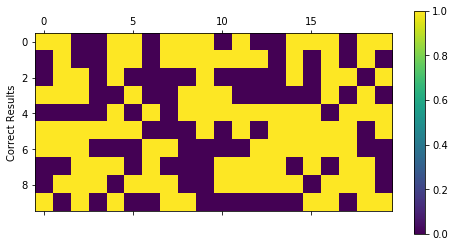

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


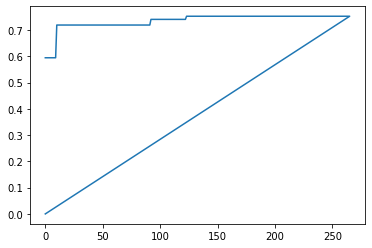

|  266      | -0.5      |  1.288    |  7.836    |  1.565    |  2.854    |  0.08832  |  0.6472   |  0.7285   |  1.479e+0 |  1.604    |  0.2443   |  63.21    |  0.05646  |  0.3934   |  2.8      |  0.5252   |  2.631    |  3.041    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

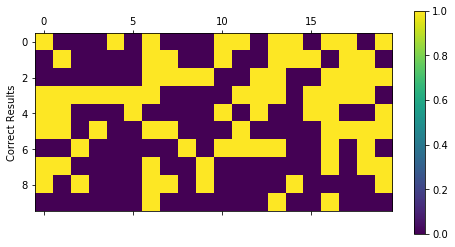

Final percentage:  tensor(0.5000)
Last epoch:  42


Best Score So Far:  tensor(-0.7522)


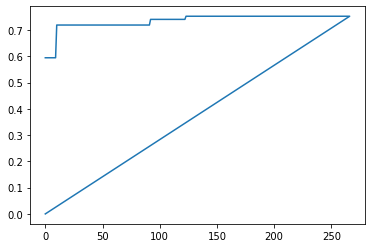

|  267      | -0.5      |  0.09234  |  33.96    |  1.428    |  2.611    |  0.09883  |  0.03535  |  0.3546   |  1.369e+0 |  2.604    |  0.5549   |  102.6    |  0.1845   |  0.5267   |  1.066    |  0.8931   |  2.927    |  1.85     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

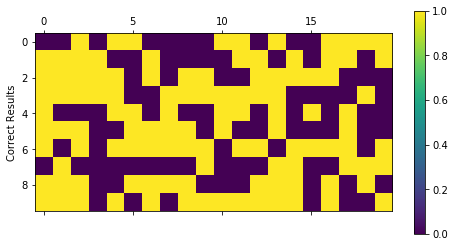

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


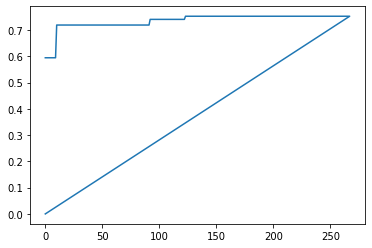

|  268      | -0.5      |  1.097    |  34.76    |  1.236    |  0.794    |  0.07629  |  1.389    |  0.4471   |  1.255e+0 |  2.548    |  0.8368   |  49.07    |  0.7337   |  0.785    |  2.332    |  0.2035   |  1.386    |  5.63     |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

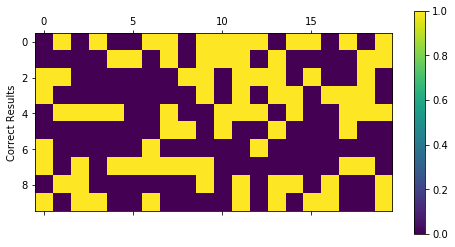

Final percentage:  tensor(0.4942)
Last epoch:  92


Best Score So Far:  tensor(-0.7522)


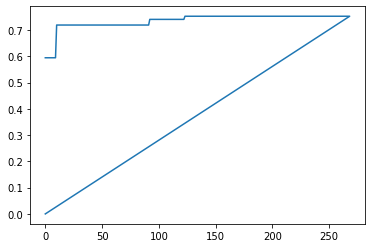

|  269      | -0.4942   |  0.2593   |  211.7    |  2.042    |  0.8714   |  0.05681  |  0.5187   |  0.4676   |  1.232e+0 |  1.655    |  0.4667   |  214.2    |  0.6445   |  0.08477  |  1.267    |  0.3899   |  1.955    |  9.012    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

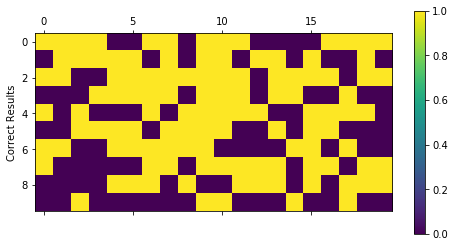

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


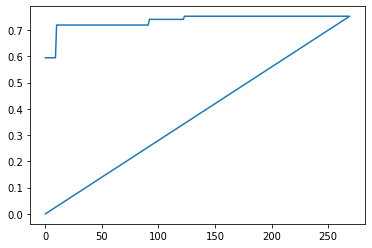

|  270      | -0.5      |  1.774    |  9.575    |  1.419    |  1.161    |  0.01764  |  1.828    |  0.1517   |  1.734e+0 |  3.861    |  0.43     |  208.8    |  0.4284   |  0.7321   |  2.516    |  0.9586   |  2.006    |  7.892    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

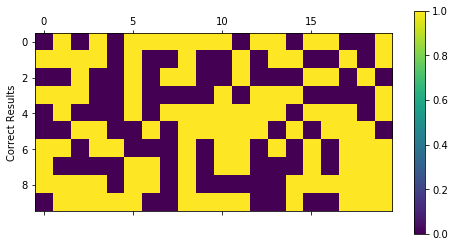

Final percentage:  tensor(0.5000)
Last epoch:  34


Best Score So Far:  tensor(-0.7522)


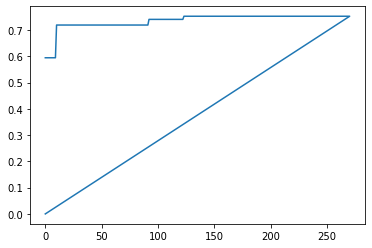

|  271      | -0.5      |  1.834    |  207.9    |  2.621    |  2.835    |  0.02907  |  0.8759   |  0.08485  |  1.877e+0 |  2.028    |  0.8147   |  53.78    |  0.3499   |  0.6214   |  2.836    |  0.6873   |  2.017    |  1.36     |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

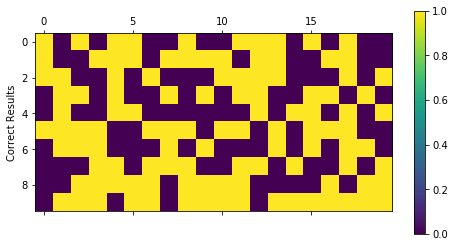

Final percentage:  tensor(0.4982)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


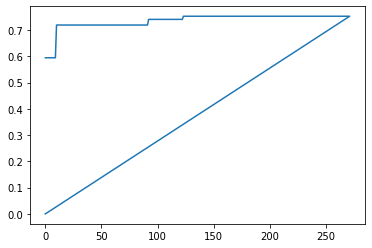

|  272      | -0.4982   |  0.6602   |  122.9    |  2.453    |  2.672    |  0.000630 |  0.1527   |  0.2254   |  1.536e+0 |  2.602    |  0.3827   |  226.4    |  0.7269   |  0.1224   |  1.468    |  0.5048   |  2.084    |  8.269    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

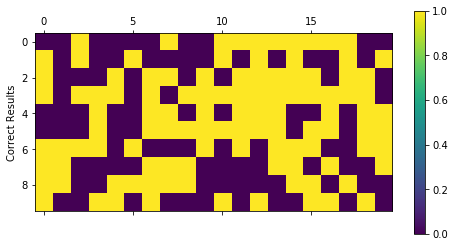

Final percentage:  tensor(0.4824)
Last epoch:  31


Best Score So Far:  tensor(-0.7522)


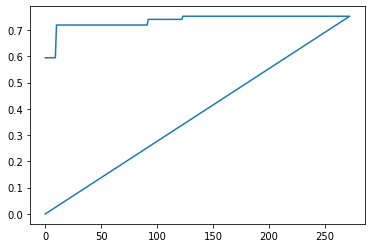

|  273      | -0.4824   |  0.8345   |  241.1    |  1.363    |  1.444    |  0.08942  |  0.1308   |  0.2234   |  1.203e+0 |  3.945    |  0.4216   |  227.6    |  0.8532   |  0.09357  |  1.696    |  0.4962   |  3.628    |  9.827    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


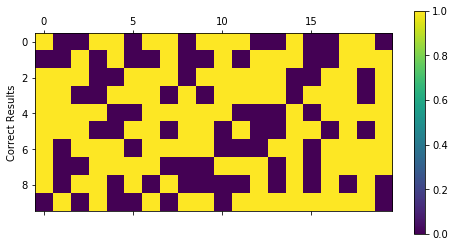

Final percentage:  tensor(0.6181)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


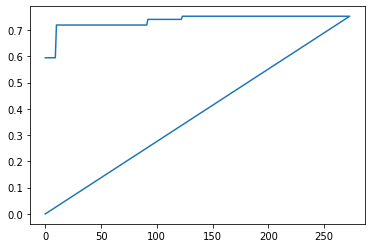

|  274      | -0.6181   |  0.6705   |  200.6    |  2.709    |  0.8409   |  0.01989  |  1.287    |  0.4513   |  1.155e+0 |  3.219    |  0.3241   |  155.6    |  0.00748  |  0.5315   |  2.46     |  0.3453   |  3.27     |  4.838    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

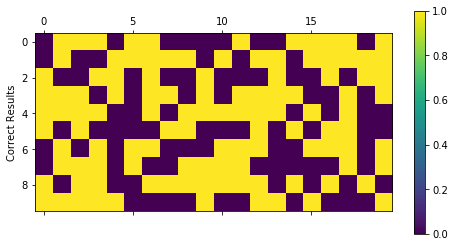

Final percentage:  tensor(0.5755)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


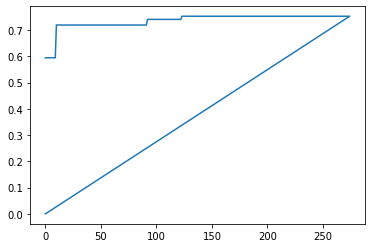

|  275      | -0.5755   |  0.8422   |  78.04    |  2.475    |  2.742    |  0.04431  |  1.964    |  0.6396   |  1.311e+0 |  1.697    |  0.323    |  104.8    |  0.4959   |  0.6314   |  2.674    |  0.05901  |  2.355    |  4.844    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

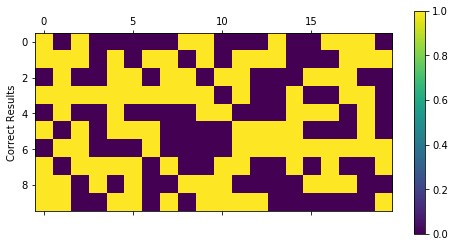

Final percentage:  tensor(0.5163)
Last epoch:  27


Best Score So Far:  tensor(-0.7522)


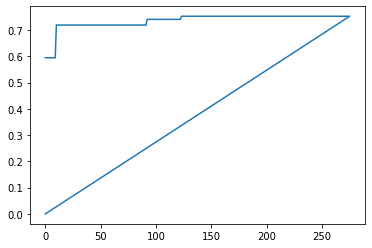

|  276      | -0.5163   |  0.8438   |  145.2    |  2.87     |  0.9877   |  0.0949   |  0.4893   |  0.4387   |  1.713e+0 |  3.633    |  0.7035   |  247.3    |  0.551    |  0.8149   |  2.303    |  0.1688   |  1.092    |  7.839    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

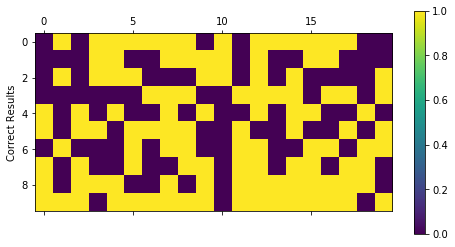

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


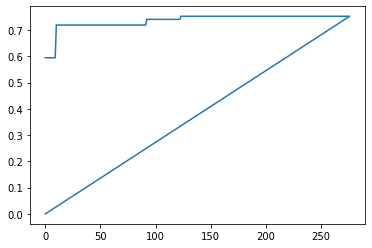

|  277      | -0.5      |  1.348    |  75.23    |  1.211    |  2.061    |  0.07495  |  1.111    |  0.5322   |  1.404e+0 |  3.59     |  0.4792   |  229.3    |  0.7392   |  0.4706   |  2.432    |  0.8859   |  1.582    |  4.864    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

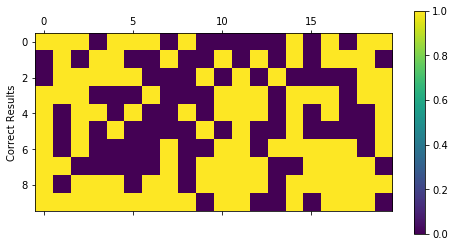

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


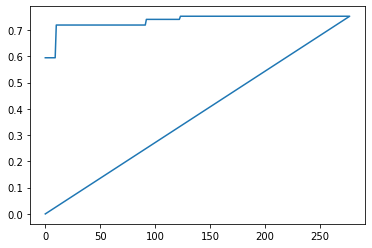

|  278      | -0.5      |  1.71     |  9.746    |  1.265    |  1.212    |  0.01124  |  1.445    |  0.7798   |  1.489e+0 |  3.871    |  0.1222   |  179.9    |  0.5827   |  0.7126   |  2.07     |  0.9789   |  2.315    |  9.543    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

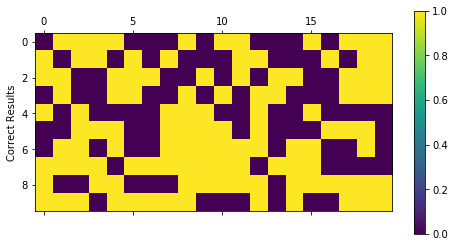

Final percentage:  tensor(0.5000)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


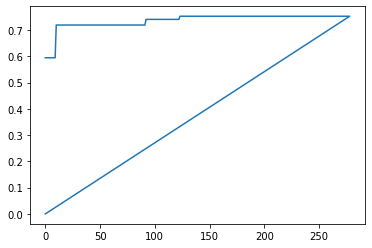

|  279      | -0.5      |  1.827    |  109.7    |  1.817    |  0.05964  |  0.04485  |  0.3968   |  0.2687   |  1.283e+0 |  3.004    |  0.3962   |  154.5    |  0.8428   |  0.7495   |  2.165    |  0.4401   |  2.197    |  1.639    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

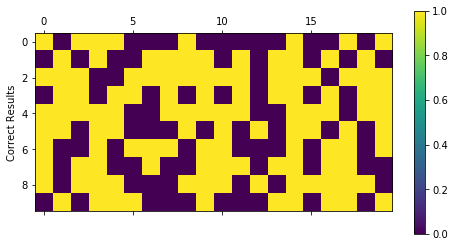

Final percentage:  tensor(0.5604)
Last epoch:  25


Best Score So Far:  tensor(-0.7522)


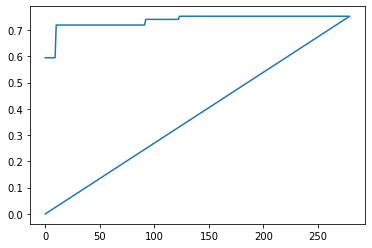

|  280      | -0.5604   |  0.9301   |  104.4    |  1.401    |  2.4      |  0.06981  |  1.941    |  0.3084   |  1.417e+0 |  2.554    |  0.318    |  140.5    |  0.889    |  0.6575   |  1.411    |  0.7994   |  3.378    |  8.184    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

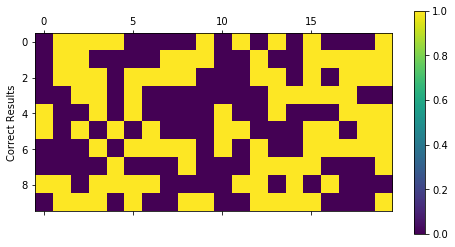

Final percentage:  tensor(0.5484)
Last epoch:  39


Best Score So Far:  tensor(-0.7522)


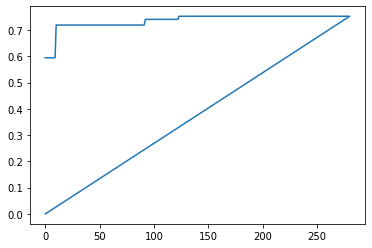

|  281      | -0.5484   |  0.6304   |  157.7    |  2.298    |  0.3595   |  0.09187  |  0.7326   |  0.5507   |  1.928e+0 |  3.018    |  0.8446   |  179.6    |  0.1715   |  0.656    |  1.807    |  0.3183   |  3.334    |  8.106    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

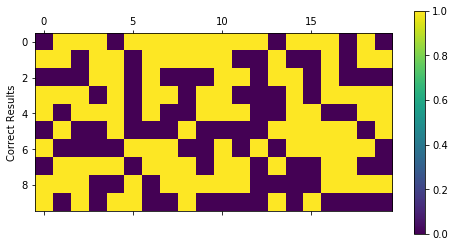

Final percentage:  tensor(0.5399)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


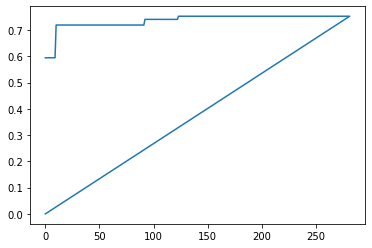

|  282      | -0.5399   |  1.889    |  53.61    |  2.06     |  2.309    |  0.05163  |  0.4553   |  0.7962   |  1.889e+0 |  2.726    |  0.4842   |  215.4    |  0.9138   |  0.7376   |  1.861    |  0.8548   |  1.675    |  5.859    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

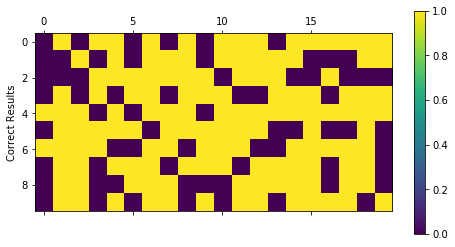

Final percentage:  tensor(0.6447)
Last epoch:  55


Best Score So Far:  tensor(-0.7522)


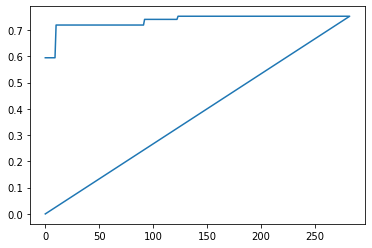

|  283      | -0.6447   |  0.6271   |  32.39    |  1.29     |  2.8      |  0.0195   |  1.293    |  0.1913   |  1.525e+0 |  1.391    |  0.2606   |  103.7    |  0.7063   |  0.811    |  1.853    |  0.7131   |  1.416    |  1.904    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

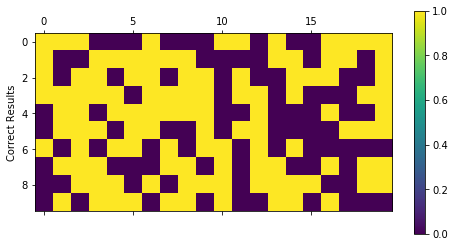

Final percentage:  tensor(0.5000)
Last epoch:  62


Best Score So Far:  tensor(-0.7522)


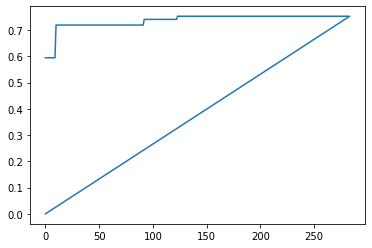

|  284      | -0.5      |  0.8917   |  195.2    |  1.461    |  2.419    |  0.02524  |  0.1668   |  0.4104   |  1.001e+0 |  3.117    |  0.6652   |  249.2    |  0.6628   |  0.4448   |  1.147    |  0.5338   |  1.424    |  8.213    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

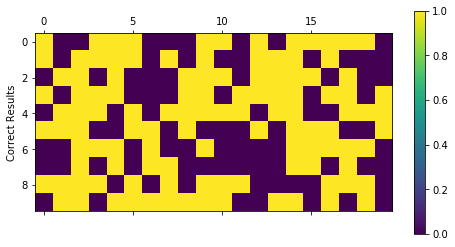

Final percentage:  tensor(0.5000)
Last epoch:  64


Best Score So Far:  tensor(-0.7522)


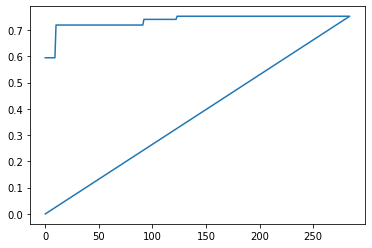

|  285      | -0.5      |  1.147    |  56.08    |  2.407    |  0.9957   |  0.06691  |  1.551    |  0.06926  |  1.511e+0 |  1.31     |  0.5845   |  82.14    |  0.6432   |  0.0437   |  2.725    |  0.4777   |  3.373    |  3.037    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

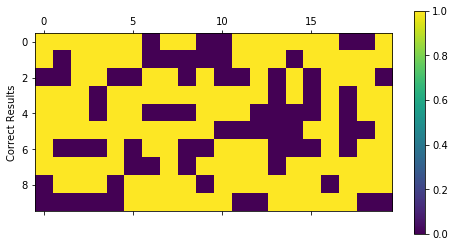

Final percentage:  tensor(0.6117)
Last epoch:  32


Best Score So Far:  tensor(-0.7522)


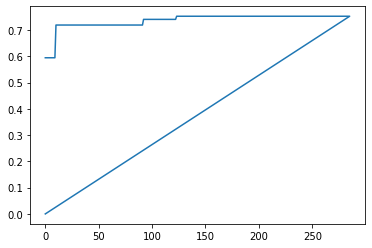

|  286      | -0.6117   |  0.6666   |  196.0    |  2.698    |  1.307    |  0.09303  |  1.153    |  0.03928  |  1.453e+0 |  1.48     |  0.6595   |  90.23    |  0.2018   |  0.7585   |  2.627    |  0.3433   |  2.207    |  1.545    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

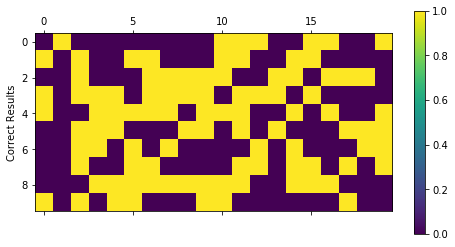

Final percentage:  tensor(0.4839)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


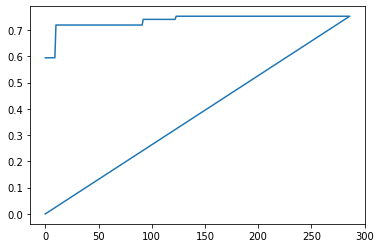

|  287      | -0.4839   |  0.356    |  188.9    |  2.127    |  2.461    |  0.05012  |  1.528    |  0.4079   |  1.568e+0 |  1.552    |  0.49     |  53.06    |  0.5561   |  0.1273   |  1.37     |  0.764    |  1.212    |  4.32     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

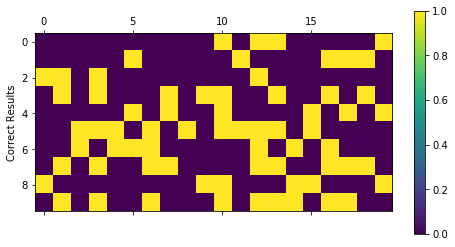

Final percentage:  tensor(0.3668)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


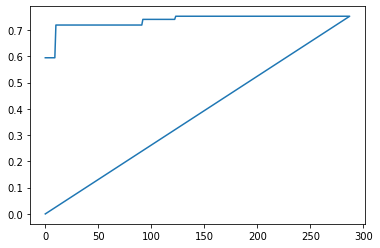

|  288      | -0.3668   |  1.747    |  28.5     |  1.715    |  0.3407   |  0.08765  |  0.2512   |  0.2036   |  1.422e+0 |  2.989    |  0.3102   |  56.23    |  0.3736   |  0.5139   |  2.972    |  0.3268   |  2.083    |  7.349    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

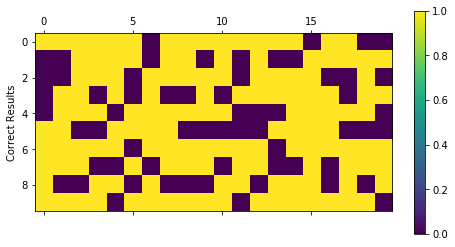

Final percentage:  tensor(0.6967)
Last epoch:  31


Best Score So Far:  tensor(-0.7522)


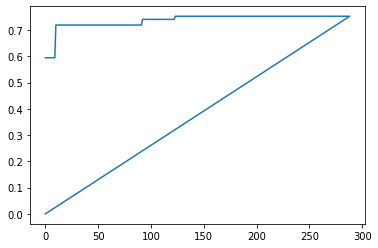

|  289      | -0.6967   |  0.5949   |  90.82    |  2.979    |  1.807    |  0.08288  |  0.06301  |  0.1164   |  1.728e+0 |  2.614    |  0.8957   |  127.9    |  0.3843   |  0.1749   |  2.174    |  0.7659   |  3.764    |  2.237    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

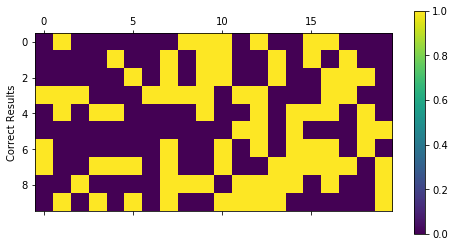

Final percentage:  tensor(0.5000)
Last epoch:  103


Best Score So Far:  tensor(-0.7522)


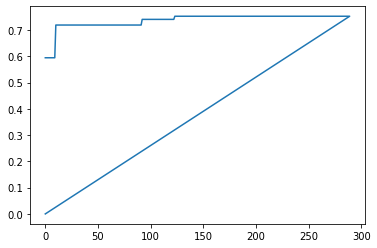

|  290      | -0.5      |  0.0161   |  123.4    |  1.364    |  1.825    |  0.06203  |  0.8152   |  0.5418   |  1.2e+03  |  3.418    |  0.04532  |  45.65    |  0.9796   |  0.8103   |  2.87     |  0.9075   |  2.32     |  9.44     |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

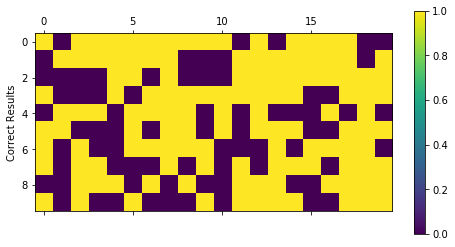

Final percentage:  tensor(0.5712)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


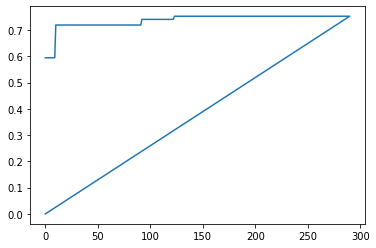

|  291      | -0.5712   |  0.4725   |  14.58    |  2.109    |  0.9368   |  0.05321  |  0.9385   |  0.3865   |  1.57e+03 |  3.761    |  0.2126   |  224.5    |  0.7334   |  0.07129  |  2.662    |  0.3972   |  2.004    |  1.004    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

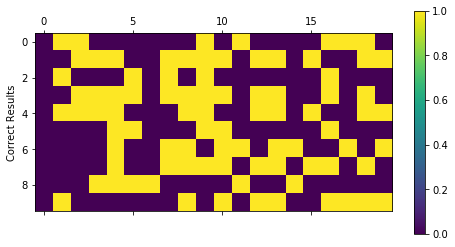

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


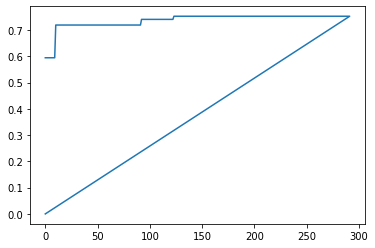

|  292      | -0.5      |  0.4892   |  176.7    |  2.694    |  0.7207   |  0.03709  |  0.2993   |  0.6428   |  1.717e+0 |  3.094    |  0.611    |  228.6    |  0.8823   |  0.5628   |  1.575    |  0.4027   |  1.087    |  9.239    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

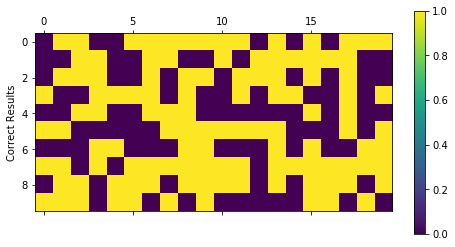

Final percentage:  tensor(0.5000)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


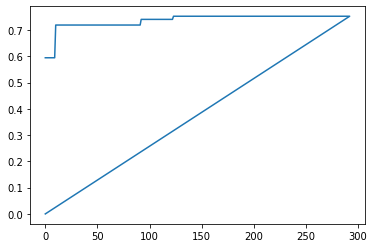

|  293      | -0.5      |  1.368    |  232.7    |  1.601    |  2.825    |  0.0864   |  1.763    |  0.000113 |  1.377e+0 |  1.366    |  0.8395   |  132.5    |  0.4894   |  0.4382   |  2.135    |  0.544    |  3.742    |  8.951    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

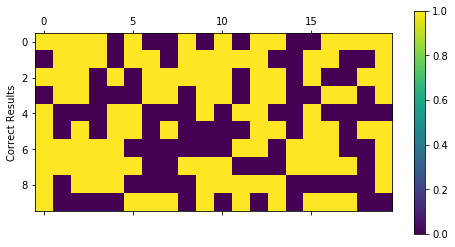

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


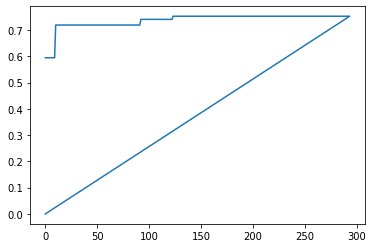

|  294      | -0.5      |  1.56     |  83.97    |  2.561    |  0.4341   |  0.08602  |  1.538    |  0.6208   |  1.529e+0 |  2.346    |  0.204    |  207.4    |  0.965    |  0.4892   |  2.795    |  0.2821   |  2.548    |  3.95     |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

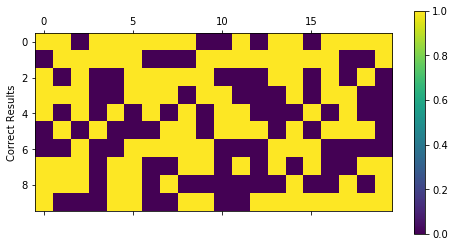

Final percentage:  tensor(0.5000)
Last epoch:  39


Best Score So Far:  tensor(-0.7522)


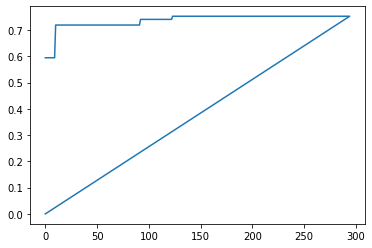

|  295      | -0.5      |  1.974    |  65.58    |  2.351    |  2.285    |  0.003223 |  1.955    |  0.07306  |  1.614e+0 |  1.447    |  0.4687   |  25.71    |  0.7806   |  0.6956   |  2.19     |  0.01453  |  1.126    |  2.627    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

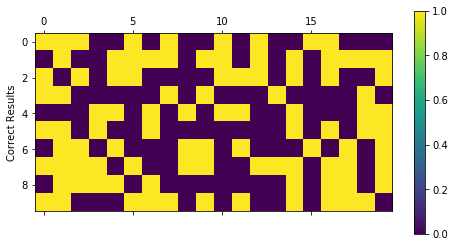

Final percentage:  tensor(0.4654)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


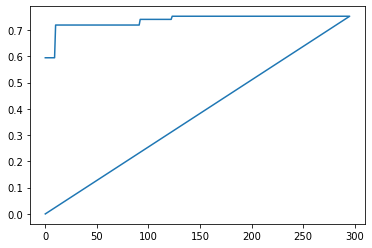

|  296      | -0.4654   |  1.934    |  66.67    |  2.495    |  0.8409   |  0.02555  |  0.5131   |  0.2376   |  1.009e+0 |  3.952    |  0.5098   |  154.9    |  0.5382   |  0.03945  |  1.938    |  0.5391   |  3.012    |  5.802    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

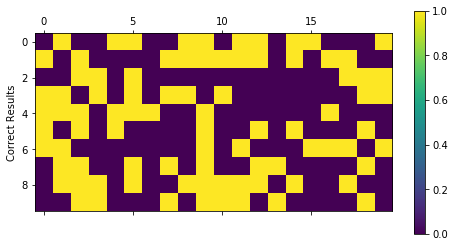

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


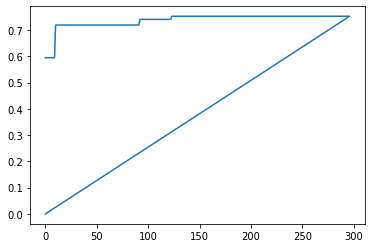

|  297      | -0.5      |  0.1096   |  159.5    |  2.157    |  1.631    |  0.08433  |  0.8903   |  0.4829   |  1.124e+0 |  1.755    |  0.7653   |  6.121    |  0.1569   |  0.741    |  1.456    |  0.2589   |  3.095    |  9.689    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

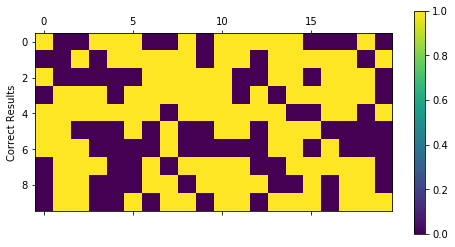

Final percentage:  tensor(0.5406)
Last epoch:  49


Best Score So Far:  tensor(-0.7522)


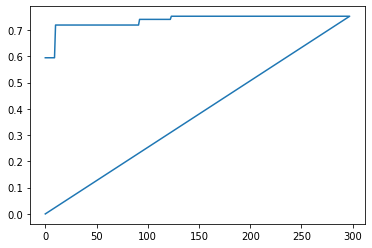

|  298      | -0.5406   |  0.3946   |  191.9    |  1.28     |  1.144    |  0.03233  |  1.759    |  0.5243   |  1.334e+0 |  1.065    |  0.3321   |  248.9    |  0.529    |  0.6679   |  1.687    |  0.4601   |  1.633    |  8.524    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

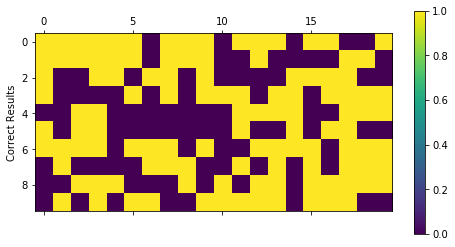

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


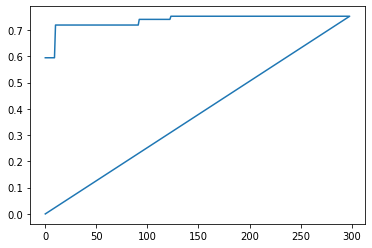

|  299      | -0.5      |  0.716    |  11.42    |  2.371    |  0.4658   |  0.07988  |  0.03037  |  0.4685   |  1.496e+0 |  3.982    |  0.1209   |  172.8    |  0.09576  |  0.1456   |  2.967    |  0.8059   |  1.731    |  8.608    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

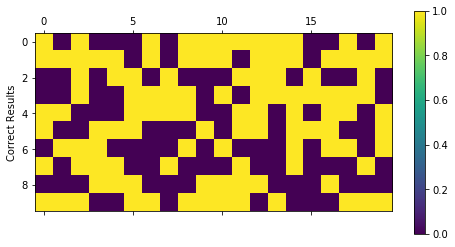

Final percentage:  tensor(0.5311)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


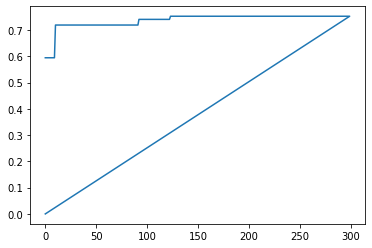

|  300      | -0.5311   |  0.07084  |  138.0    |  1.182    |  2.903    |  0.05831  |  1.106    |  0.2544   |  1.85e+03 |  2.585    |  0.0154   |  48.96    |  0.4336   |  0.07198  |  1.559    |  0.2501   |  1.002    |  7.229    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

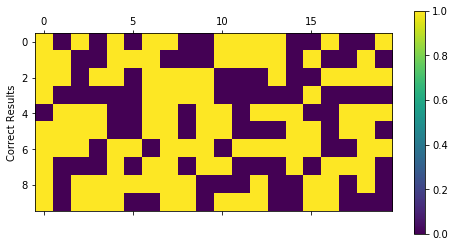

Final percentage:  tensor(0.5000)
Last epoch:  64


Best Score So Far:  tensor(-0.7522)


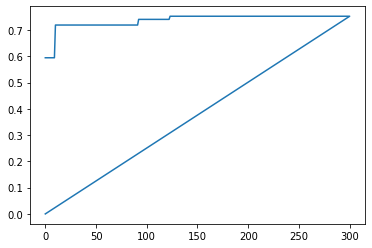

|  301      | -0.5      |  1.54     |  210.4    |  2.695    |  0.4531   |  0.089    |  1.31     |  0.5569   |  1.564e+0 |  3.81     |  0.2267   |  201.9    |  0.4953   |  0.8018   |  1.55     |  0.01523  |  1.194    |  9.088    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

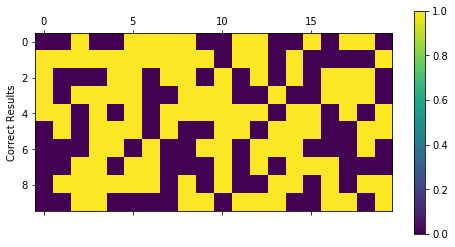

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


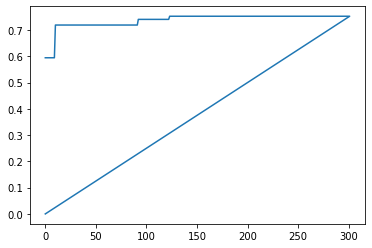

|  302      | -0.5      |  1.276    |  187.5    |  2.004    |  1.667    |  0.03639  |  1.557    |  0.6055   |  1.7e+03  |  3.876    |  0.692    |  250.4    |  0.5901   |  0.5573   |  2.272    |  0.326    |  1.099    |  8.086    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

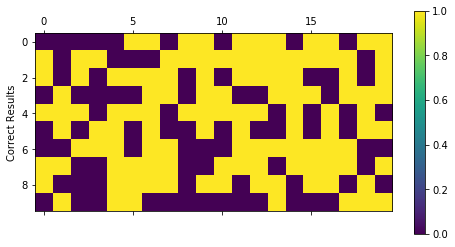

Final percentage:  tensor(0.5833)
Last epoch:  78


Best Score So Far:  tensor(-0.7522)


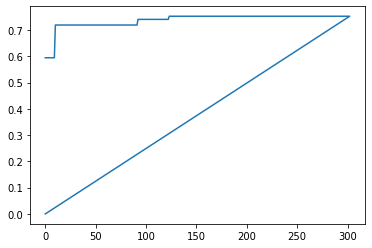

|  303      | -0.5833   |  1.413    |  22.07    |  1.296    |  2.052    |  0.0535   |  0.3805   |  0.04476  |  1.611e+0 |  1.16     |  0.1922   |  129.7    |  0.09484  |  0.368    |  1.04     |  0.1193   |  3.811    |  6.024    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

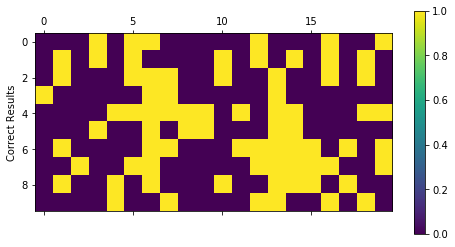

Final percentage:  tensor(0.4361)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


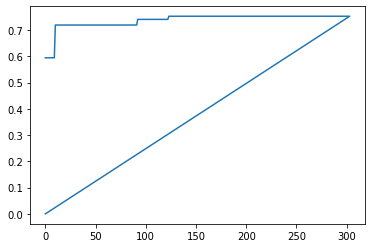

|  304      | -0.4361   |  1.366    |  97.95    |  2.519    |  2.68     |  0.09102  |  0.988    |  0.6101   |  1.709e+0 |  3.844    |  0.2174   |  144.6    |  0.04469  |  0.8309   |  2.881    |  0.5004   |  2.752    |  7.94     |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

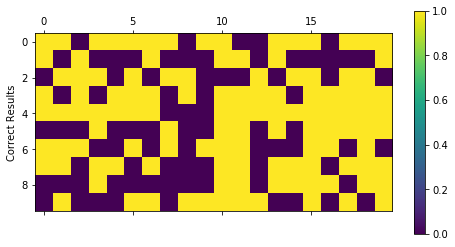

Final percentage:  tensor(0.5291)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


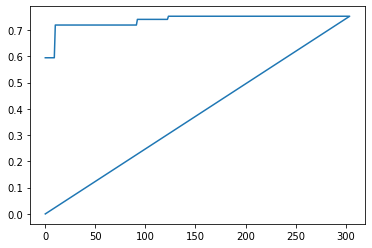

|  305      | -0.5291   |  0.4962   |  98.26    |  1.574    |  1.611    |  0.0949   |  0.7669   |  0.03601  |  1.683e+0 |  2.48     |  0.2669   |  107.6    |  0.8618   |  0.7389   |  1.34     |  0.6844   |  3.983    |  8.051    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

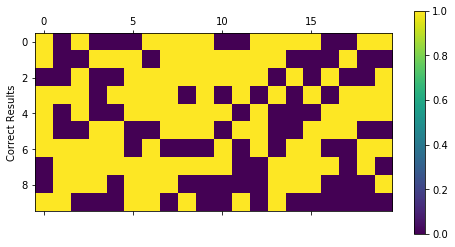

Final percentage:  tensor(0.5247)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


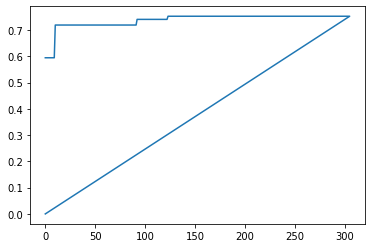

|  306      | -0.5247   |  1.443    |  80.75    |  1.317    |  2.584    |  0.06103  |  0.7763   |  0.6045   |  1.719e+0 |  2.936    |  0.1865   |  226.9    |  0.7186   |  0.2724   |  1.127    |  0.9119   |  3.374    |  5.482    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

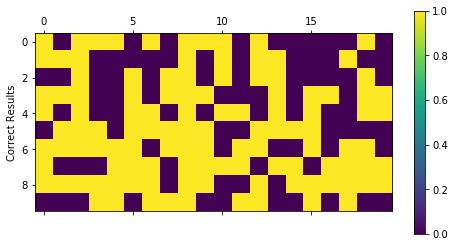

Final percentage:  tensor(0.5000)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


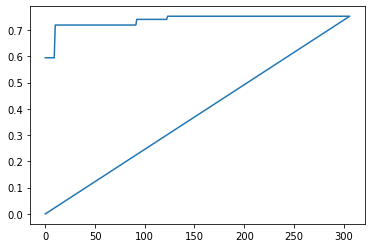

|  307      | -0.5      |  0.8237   |  158.4    |  1.793    |  0.1164   |  0.0302   |  0.4901   |  0.7778   |  1.767e+0 |  2.207    |  0.663    |  78.87    |  0.5272   |  0.1864   |  1.506    |  0.4336   |  1.246    |  8.671    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

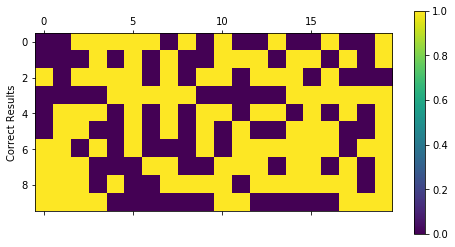

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


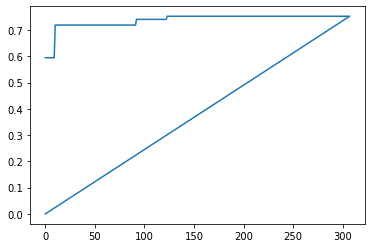

|  308      | -0.5      |  1.823    |  56.13    |  1.943    |  2.516    |  0.02883  |  1.215    |  0.3536   |  1.397e+0 |  3.36     |  0.4181   |  120.1    |  0.991    |  0.866    |  1.468    |  0.2267   |  2.982    |  4.703    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

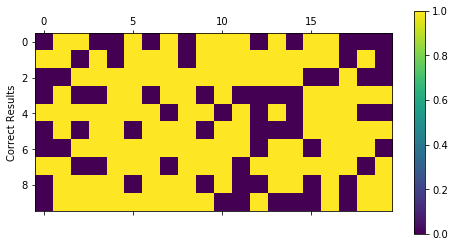

Final percentage:  tensor(0.6504)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


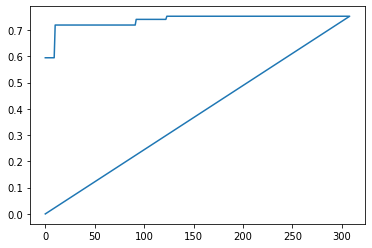

|  309      | -0.6504   |  1.43     |  188.3    |  2.559    |  0.7873   |  0.09984  |  0.9825   |  0.06714  |  1.112e+0 |  2.679    |  0.4591   |  239.4    |  0.9      |  0.4189   |  1.411    |  0.5639   |  1.923    |  6.849    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

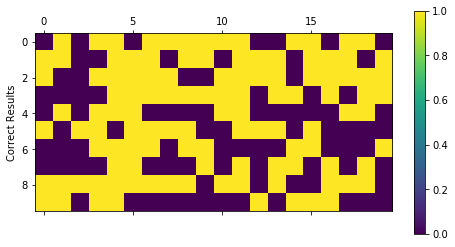

Final percentage:  tensor(0.5000)
Last epoch:  41


Best Score So Far:  tensor(-0.7522)


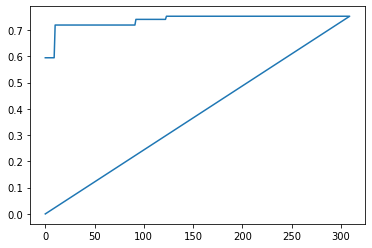

|  310      | -0.5      |  1.025    |  216.2    |  1.262    |  0.7505   |  0.05975  |  1.244    |  0.3301   |  1.901e+0 |  3.423    |  0.4868   |  104.9    |  0.3974   |  0.1026   |  2.865    |  0.2343   |  1.457    |  5.585    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

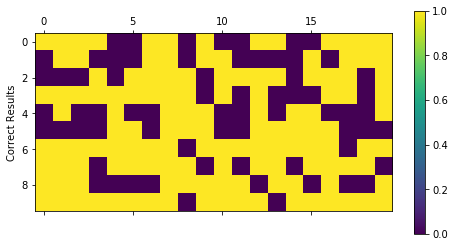

Final percentage:  tensor(0.6432)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


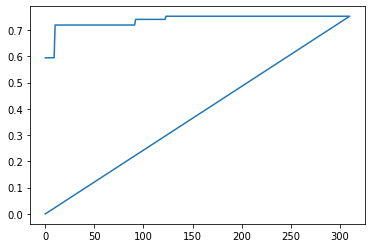

|  311      | -0.6432   |  0.9055   |  20.8     |  2.145    |  2.089    |  0.04905  |  0.1451   |  0.1437   |  1.116e+0 |  2.745    |  0.07659  |  99.55    |  0.1479   |  0.3703   |  2.244    |  0.3592   |  3.679    |  4.753    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

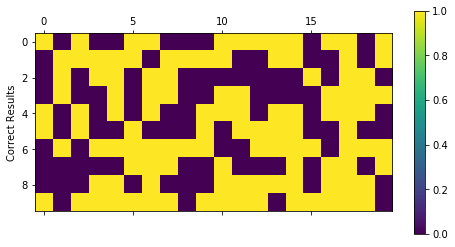

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


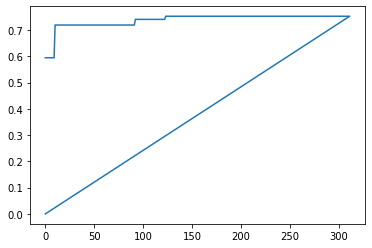

|  312      | -0.5      |  1.858    |  210.4    |  1.232    |  0.3109   |  0.01328  |  1.271    |  0.5477   |  1.79e+03 |  2.622    |  0.6078   |  176.4    |  0.3386   |  0.5855   |  1.804    |  0.6395   |  3.795    |  4.865    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

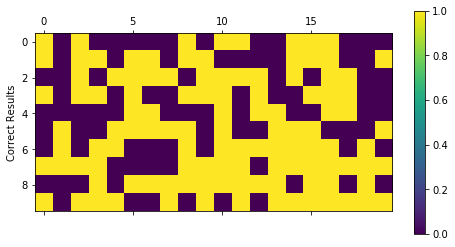

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


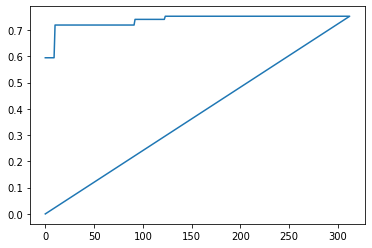

|  313      | -0.5      |  1.007    |  86.34    |  2.152    |  2.582    |  0.02836  |  1.66     |  0.4156   |  1.226e+0 |  2.254    |  0.1503   |  233.7    |  0.05883  |  0.5436   |  1.207    |  0.3132   |  1.427    |  5.491    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

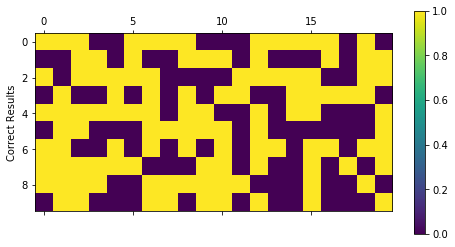

Final percentage:  tensor(0.5000)
Last epoch:  42


Best Score So Far:  tensor(-0.7522)


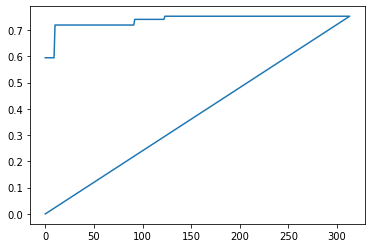

|  314      | -0.5      |  1.266    |  212.6    |  1.896    |  2.301    |  0.05953  |  1.935    |  0.09577  |  1.816e+0 |  3.497    |  0.7124   |  117.5    |  0.5272   |  0.8868   |  2.88     |  0.7622   |  2.376    |  5.857    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

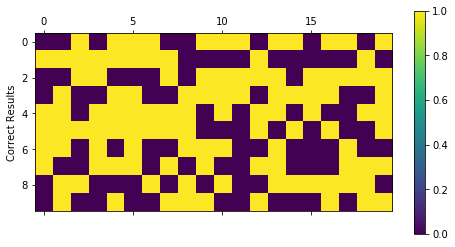

Final percentage:  tensor(0.5000)
Last epoch:  41


Best Score So Far:  tensor(-0.7522)


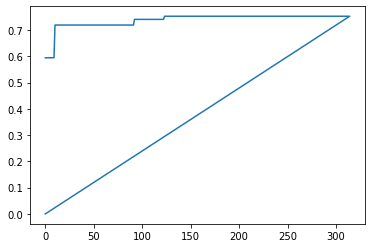

|  315      | -0.5      |  1.601    |  72.32    |  1.511    |  0.6394   |  0.05512  |  1.893    |  0.1902   |  1.802e+0 |  1.091    |  0.4556   |  74.14    |  0.2832   |  0.3528   |  2.066    |  0.7721   |  3.875    |  2.352    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


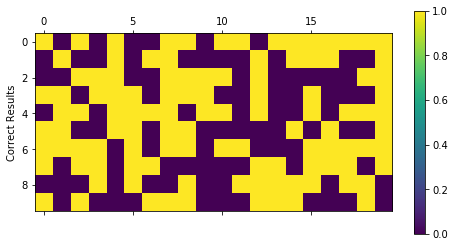

Final percentage:  tensor(0.5239)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


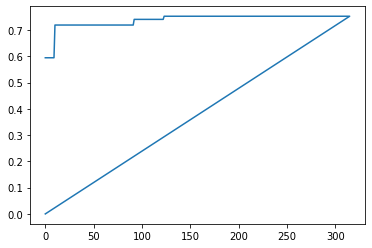

|  316      | -0.5239   |  0.7856   |  43.34    |  2.665    |  0.2536   |  0.08563  |  1.474    |  0.6867   |  1.89e+03 |  1.451    |  0.501    |  78.84    |  0.2717   |  0.01479  |  2.025    |  0.01903  |  3.686    |  3.4      |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

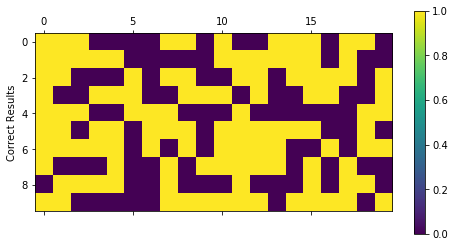

Final percentage:  tensor(0.5058)
Last epoch:  29


Best Score So Far:  tensor(-0.7522)


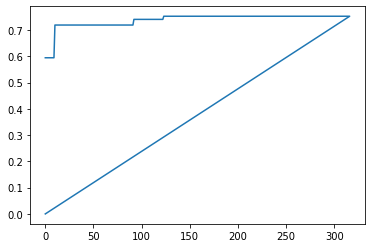

|  317      | -0.5058   |  0.9818   |  163.7    |  1.003    |  0.3386   |  0.04665  |  1.24     |  0.6557   |  1.415e+0 |  3.771    |  0.5376   |  2.465    |  0.6797   |  0.1915   |  1.03     |  0.735    |  2.65     |  8.045    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

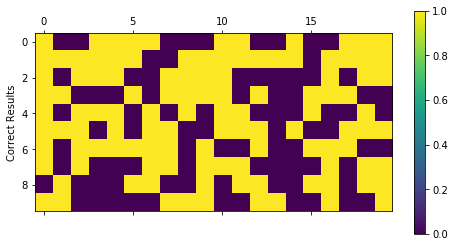

Final percentage:  tensor(0.5000)
Last epoch:  27


Best Score So Far:  tensor(-0.7522)


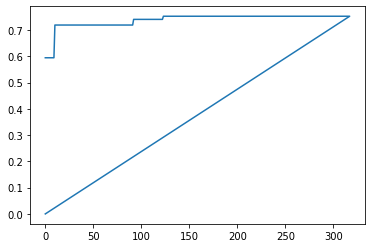

|  318      | -0.5      |  0.1755   |  92.35    |  1.596    |  1.701    |  0.05102  |  1.556    |  0.1496   |  1.576e+0 |  2.927    |  0.4139   |  143.7    |  0.9734   |  0.6765   |  1.758    |  0.4336   |  3.131    |  1.842    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

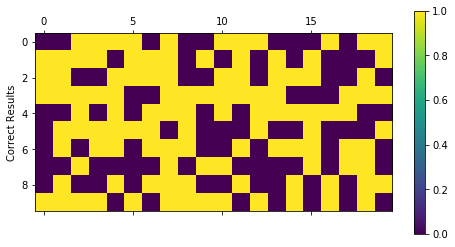

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


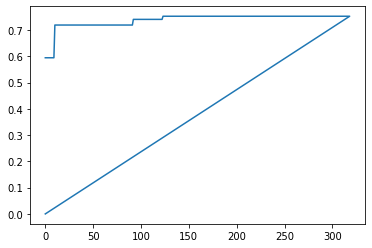

|  319      | -0.5      |  1.269    |  31.05    |  1.203    |  1.993    |  0.01671  |  1.522    |  0.6005   |  1.312e+0 |  2.707    |  0.5806   |  208.1    |  0.2021   |  0.6086   |  2.638    |  0.414    |  2.476    |  5.623    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

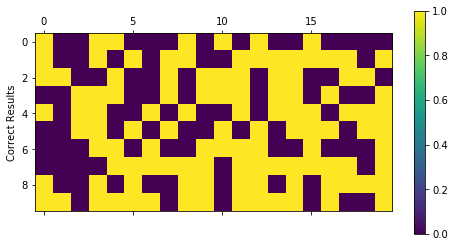

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


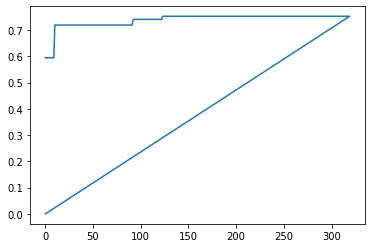

|  320      | -0.5      |  1.869    |  15.12    |  2.137    |  1.464    |  0.03438  |  1.333    |  0.6156   |  1.54e+03 |  1.124    |  0.2116   |  7.192    |  0.3281   |  0.4213   |  2.561    |  0.5317   |  2.428    |  7.275    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

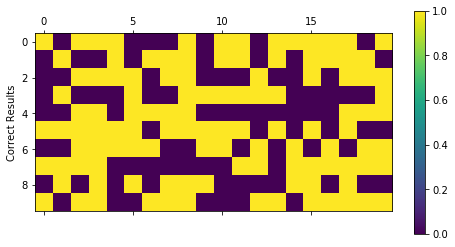

Final percentage:  tensor(0.5000)
Last epoch:  25


Best Score So Far:  tensor(-0.7522)


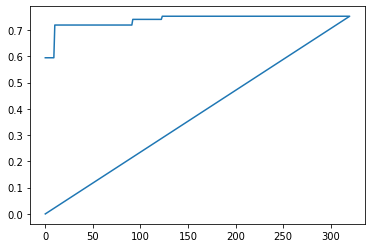

|  321      | -0.5      |  0.03466  |  178.5    |  1.621    |  1.674    |  0.06068  |  0.3625   |  0.2002   |  1.579e+0 |  1.785    |  0.2155   |  93.19    |  0.9036   |  0.7823   |  2.023    |  0.0517   |  3.393    |  2.629    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

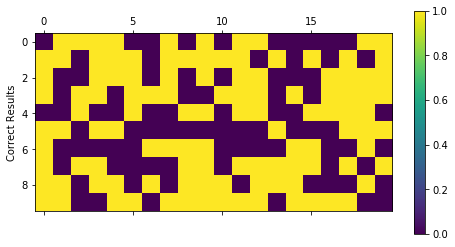

Final percentage:  tensor(0.5000)
Last epoch:  270


Best Score So Far:  tensor(-0.7522)


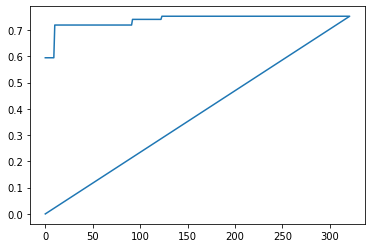

|  322      | -0.5      |  1.331    |  214.2    |  2.92     |  0.3793   |  0.05233  |  1.693    |  0.4301   |  1.73e+03 |  3.349    |  0.7529   |  171.3    |  0.8969   |  0.583    |  2.88     |  0.6287   |  3.609    |  6.355    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

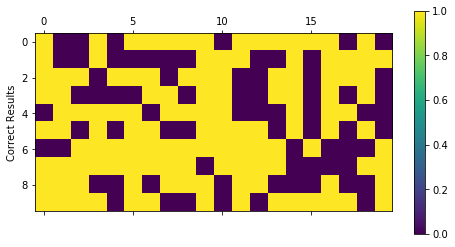

Final percentage:  tensor(0.6269)
Last epoch:  88


Best Score So Far:  tensor(-0.7522)


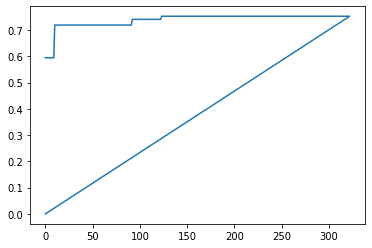

|  323      | -0.6269   |  0.6853   |  208.6    |  1.86     |  0.3784   |  0.09686  |  1.697    |  0.449    |  1.671e+0 |  3.983    |  0.1452   |  137.8    |  0.3912   |  0.487    |  1.206    |  0.4403   |  2.38     |  6.357    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

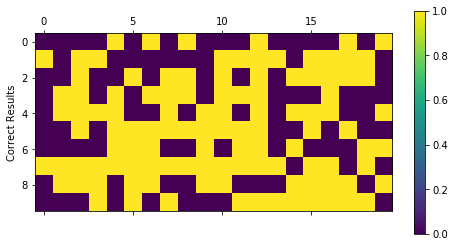

Final percentage:  tensor(0.5668)
Last epoch:  40


Best Score So Far:  tensor(-0.7522)


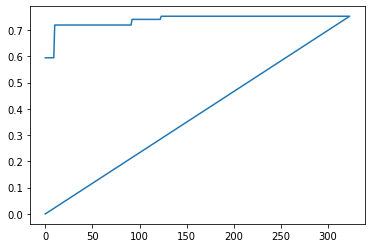

|  324      | -0.5668   |  1.318    |  151.9    |  2.451    |  1.737    |  0.04431  |  0.9886   |  0.3441   |  1.21e+03 |  1.678    |  0.4117   |  112.1    |  0.7787   |  0.3788   |  2.34     |  0.1659   |  3.464    |  7.162    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

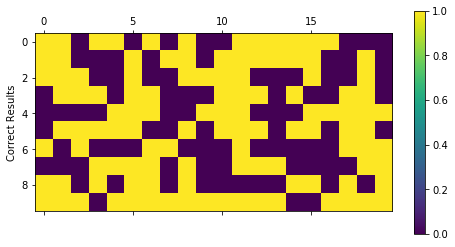

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


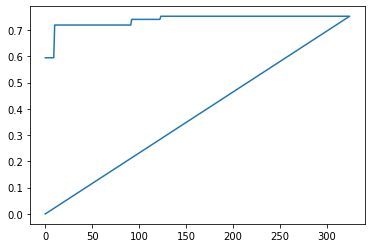

|  325      | -0.5      |  1.57     |  93.31    |  2.318    |  0.6491   |  0.0221   |  0.4825   |  0.2117   |  1.408e+0 |  3.478    |  0.8527   |  162.6    |  0.1355   |  0.378    |  2.863    |  0.3202   |  2.852    |  9.407    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

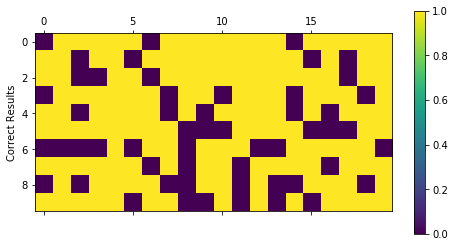

Final percentage:  tensor(0.7160)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


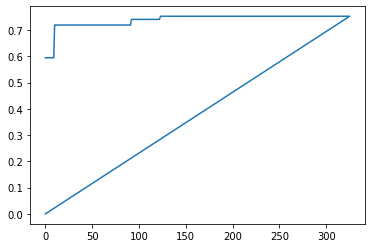

|  326      | -0.716    |  0.9168   |  129.1    |  2.828    |  2.78     |  0.09045  |  1.022    |  0.5118   |  1.589e+0 |  1.474    |  0.5611   |  83.06    |  0.1315   |  0.1935   |  1.624    |  0.9505   |  3.962    |  8.793    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

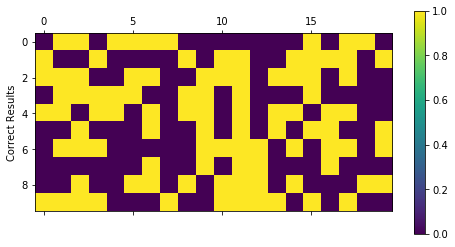

Final percentage:  tensor(0.4983)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


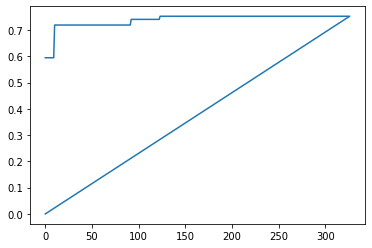

|  327      | -0.4983   |  0.9191   |  120.3    |  2.522    |  0.2942   |  0.0994   |  1.378    |  0.2394   |  1.909e+0 |  2.652    |  0.07668  |  29.49    |  0.0326   |  0.1946   |  1.102    |  0.5098   |  1.248    |  4.984    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

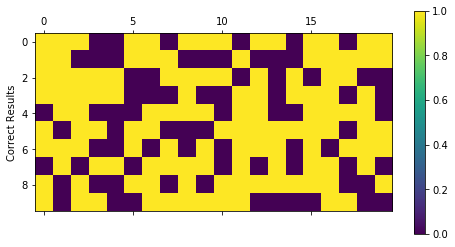

Final percentage:  tensor(0.5640)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


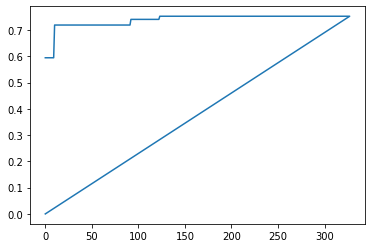

|  328      | -0.564    |  0.47     |  144.2    |  1.874    |  2.504    |  0.03365  |  0.4582   |  0.7521   |  1.466e+0 |  1.084    |  0.0715   |  143.1    |  0.2113   |  0.1334   |  1.389    |  0.744    |  3.838    |  2.163    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

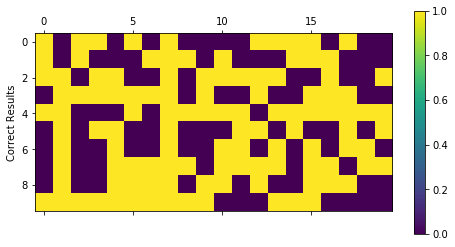

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


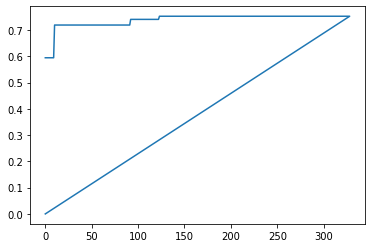

|  329      | -0.5      |  1.751    |  182.8    |  2.108    |  0.2004   |  0.07877  |  1.616    |  0.6037   |  1.55e+03 |  2.888    |  0.393    |  80.19    |  0.2083   |  0.6937   |  2.86     |  0.6209   |  2.597    |  8.941    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


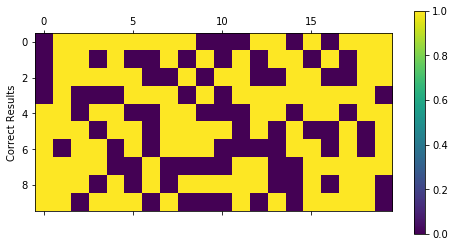

Final percentage:  tensor(0.6237)
Last epoch:  42


Best Score So Far:  tensor(-0.7522)


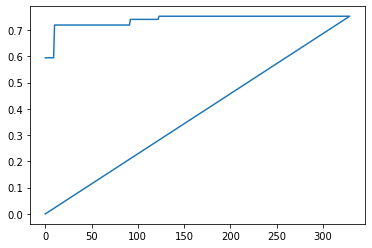

|  330      | -0.6237   |  0.08916  |  78.88    |  1.761    |  0.09299  |  0.05199  |  1.872    |  0.6378   |  1.535e+0 |  3.023    |  0.7067   |  68.32    |  0.2761   |  0.5447   |  2.342    |  0.00361  |  3.559    |  2.303    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

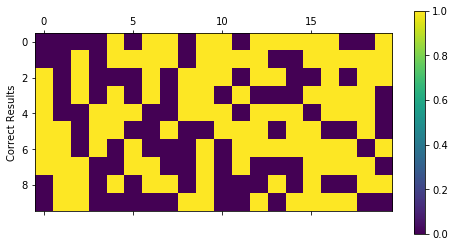

Final percentage:  tensor(0.5000)
Last epoch:  48


Best Score So Far:  tensor(-0.7522)


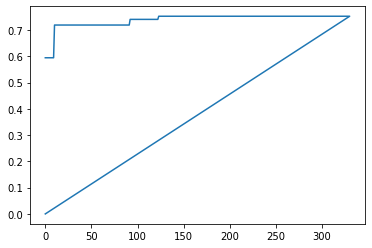

|  331      | -0.5      |  1.02     |  144.8    |  1.014    |  1.282    |  0.05337  |  1.375    |  0.7225   |  1.069e+0 |  1.846    |  0.4751   |  75.72    |  0.4203   |  0.8838   |  1.113    |  0.928    |  2.997    |  5.482    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

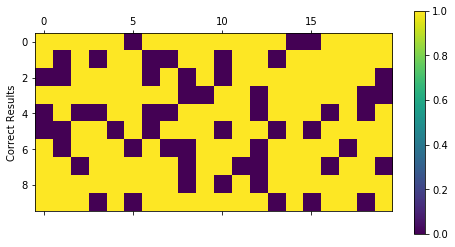

Final percentage:  tensor(0.7416)
Last epoch:  36


Best Score So Far:  tensor(-0.7522)


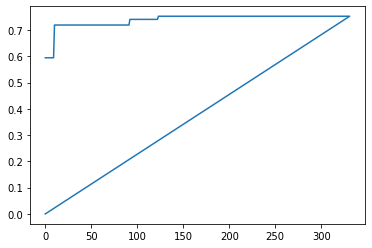

|  332      | -0.7416   |  0.9247   |  144.0    |  1.58     |  0.5137   |  0.06197  |  1.967    |  0.413    |  1.671e+0 |  2.553    |  0.18     |  149.0    |  0.957    |  0.6232   |  1.054    |  0.3628   |  2.895    |  6.098    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

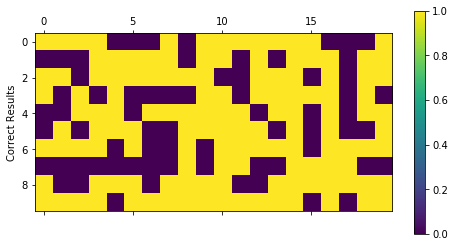

Final percentage:  tensor(0.6075)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


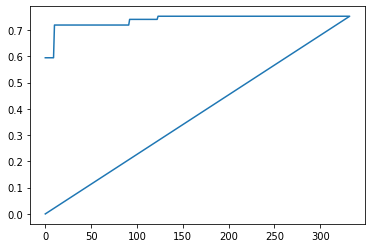

|  333      | -0.6075   |  0.2415   |  239.9    |  1.784    |  2.18     |  0.07857  |  0.4239   |  0.5301   |  1.523e+0 |  1.533    |  0.6466   |  139.3    |  0.2147   |  0.3763   |  2.355    |  0.9928   |  2.64     |  8.137    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

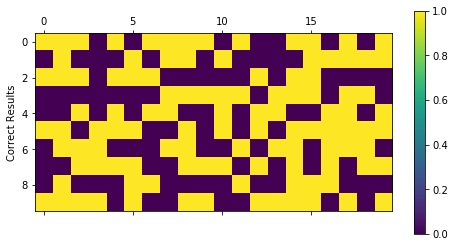

Final percentage:  tensor(0.5323)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


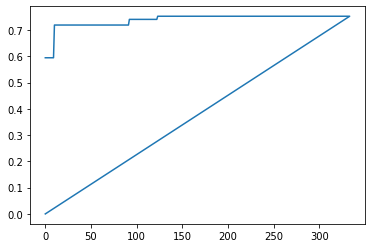

|  334      | -0.5323   |  0.6579   |  131.9    |  2.662    |  2.902    |  0.01785  |  1.694    |  0.7907   |  1.45e+03 |  1.921    |  0.8212   |  57.84    |  0.9873   |  0.3614   |  1.184    |  0.1366   |  2.426    |  1.548    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

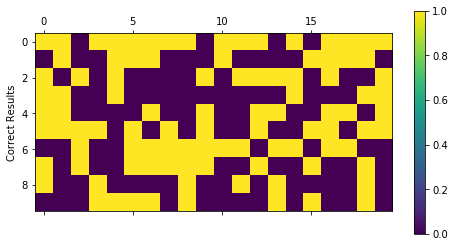

Final percentage:  tensor(0.4841)
Last epoch:  95


Best Score So Far:  tensor(-0.7522)


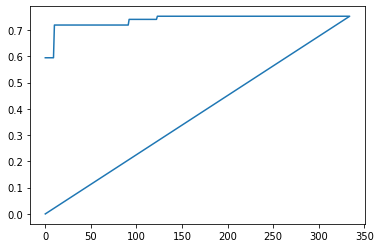

|  335      | -0.4841   |  0.5013   |  203.9    |  2.563    |  2.424    |  0.004626 |  1.525    |  0.6455   |  1.016e+0 |  2.17     |  0.779    |  245.5    |  0.9188   |  0.4923   |  1.617    |  0.5887   |  2.782    |  6.974    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

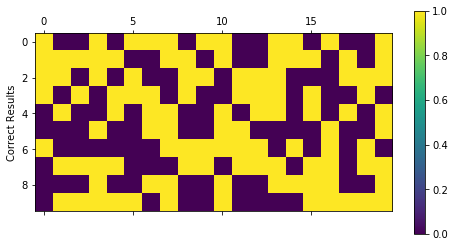

Final percentage:  tensor(0.5437)
Last epoch:  55


Best Score So Far:  tensor(-0.7522)


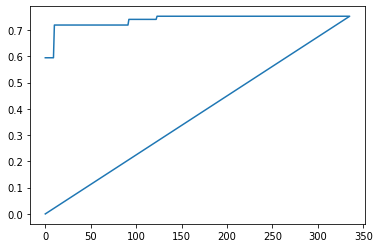

|  336      | -0.5437   |  1.176    |  222.5    |  1.744    |  0.7296   |  0.002049 |  0.4631   |  0.1293   |  1.238e+0 |  3.634    |  0.6584   |  63.82    |  0.7925   |  0.4897   |  1.809    |  0.2056   |  1.929    |  1.712    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

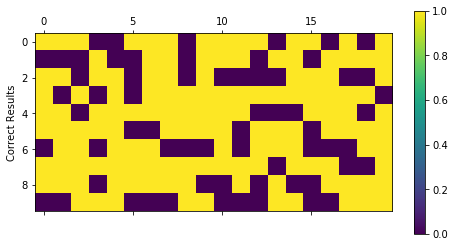

Final percentage:  tensor(0.6408)
Last epoch:  39


Best Score So Far:  tensor(-0.7522)


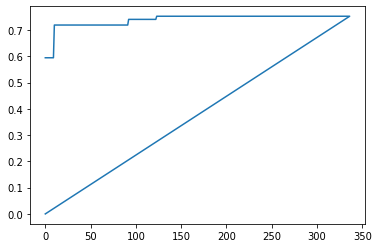

|  337      | -0.6408   |  0.4649   |  171.1    |  1.699    |  2.451    |  0.06612  |  1.242    |  0.3362   |  1.645e+0 |  3.616    |  0.2802   |  89.06    |  0.848    |  0.4769   |  2.838    |  0.1874   |  1.642    |  8.754    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

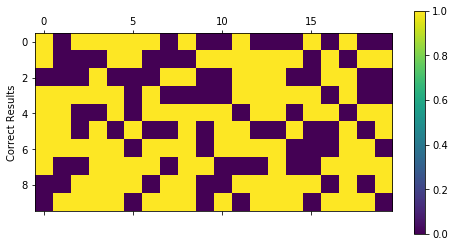

Final percentage:  tensor(0.6362)
Last epoch:  32


Best Score So Far:  tensor(-0.7522)


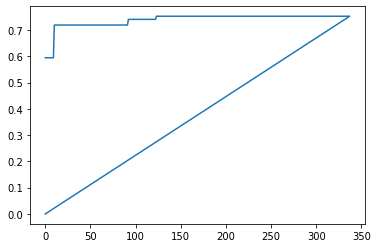

|  338      | -0.6362   |  0.198    |  121.8    |  2.67     |  2.074    |  0.04622  |  0.3287   |  0.4407   |  1.988e+0 |  3.407    |  0.04945  |  182.6    |  0.9757   |  0.174    |  2.903    |  0.2331   |  3.45     |  2.343    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

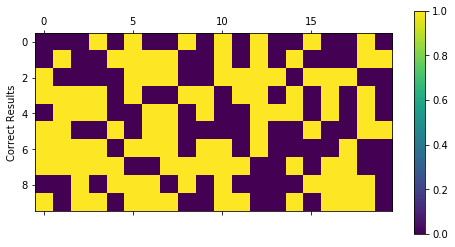

Final percentage:  tensor(0.5177)
Last epoch:  27


Best Score So Far:  tensor(-0.7522)


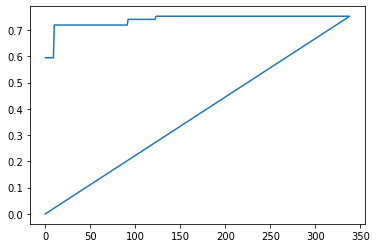

|  339      | -0.5177   |  1.023    |  94.46    |  2.335    |  0.5356   |  0.05797  |  0.004823 |  0.3405   |  1.516e+0 |  3.505    |  0.6819   |  25.34    |  0.6248   |  0.594    |  2.461    |  0.5543   |  1.321    |  6.757    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

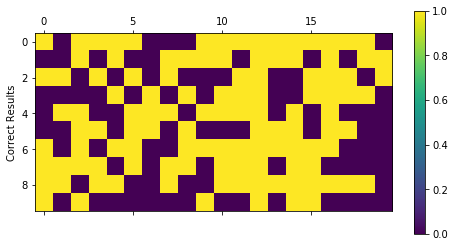

Final percentage:  tensor(0.5000)
Last epoch:  60


Best Score So Far:  tensor(-0.7522)


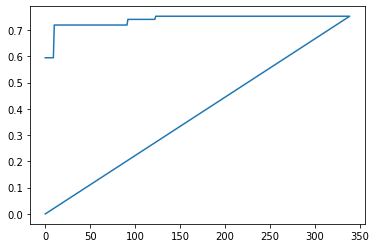

|  340      | -0.5      |  1.334    |  65.53    |  2.887    |  1.353    |  0.08667  |  1.3      |  0.4932   |  1.549e+0 |  2.936    |  0.7599   |  199.3    |  0.6723   |  0.02866  |  1.017    |  0.3582   |  1.092    |  5.655    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

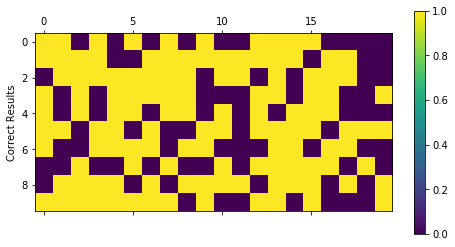

Final percentage:  tensor(0.5810)
Last epoch:  134


Best Score So Far:  tensor(-0.7522)


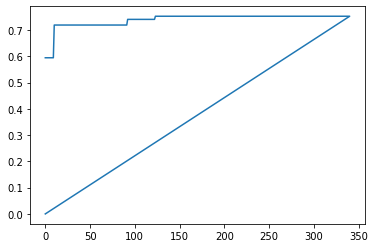

|  341      | -0.581    |  0.007072 |  124.1    |  1.751    |  2.863    |  0.005585 |  0.1297   |  0.6794   |  1.795e+0 |  3.798    |  0.07042  |  159.5    |  0.5144   |  0.2894   |  2.216    |  0.9172   |  1.187    |  6.931    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

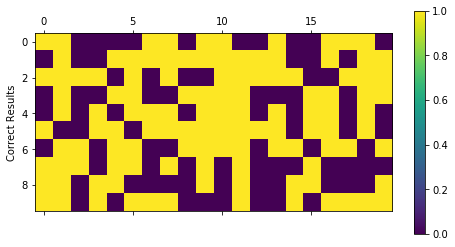

Final percentage:  tensor(0.5290)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


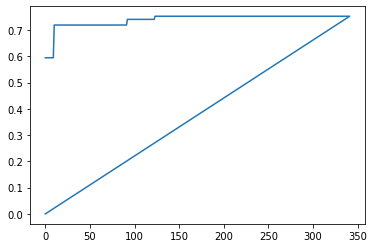

|  342      | -0.529    |  0.5675   |  105.0    |  2.691    |  0.364    |  0.0843   |  0.8044   |  0.7871   |  1.918e+0 |  2.219    |  0.2681   |  58.12    |  0.2183   |  0.6919   |  2.503    |  0.9773   |  1.249    |  2.979    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

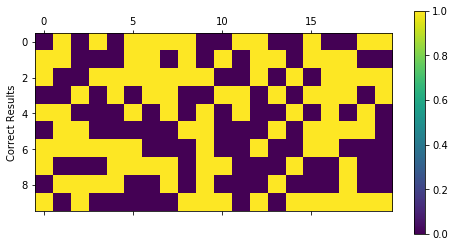

Final percentage:  tensor(0.4761)
Last epoch:  35


Best Score So Far:  tensor(-0.7522)


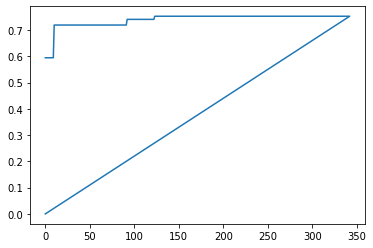

|  343      | -0.4761   |  1.958    |  140.8    |  2.102    |  1.043    |  0.07038  |  0.9945   |  0.3756   |  1.55e+03 |  1.075    |  0.4781   |  35.77    |  0.459    |  0.07404  |  2.769    |  0.378    |  2.287    |  7.671    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

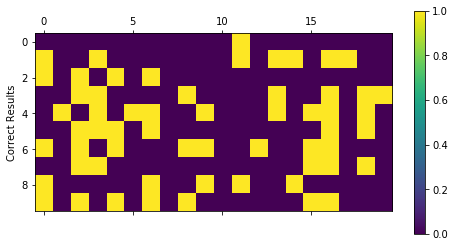

Final percentage:  tensor(0.2859)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


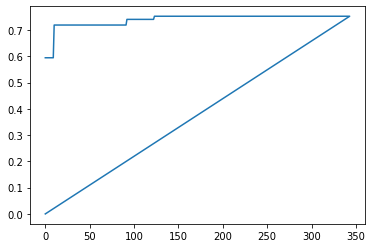

|  344      | -0.2859   |  0.31     |  148.1    |  2.017    |  1.101    |  0.06833  |  1.581    |  0.3741   |  1.627e+0 |  3.728    |  0.4113   |  36.3     |  0.5431   |  0.387    |  2.529    |  0.7969   |  1.514    |  4.937    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

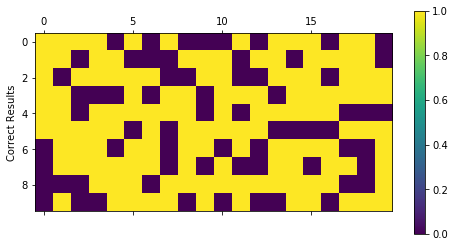

Final percentage:  tensor(0.6604)
Last epoch:  30


Best Score So Far:  tensor(-0.7522)


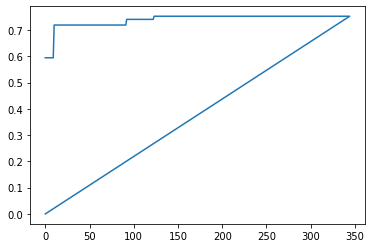

|  345      | -0.6604   |  0.531    |  244.5    |  2.864    |  1.299    |  0.0431   |  1.485    |  0.4768   |  1.259e+0 |  2.445    |  0.8011   |  175.1    |  0.563    |  0.7891   |  1.55     |  0.9959   |  1.598    |  8.55     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

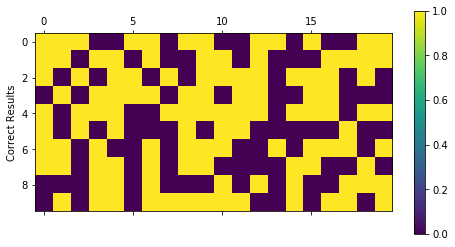

Final percentage:  tensor(0.5000)
Last epoch:  32


Best Score So Far:  tensor(-0.7522)


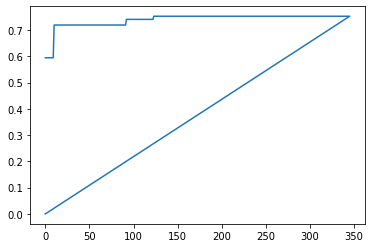

|  346      | -0.5      |  1.477    |  221.5    |  2.164    |  0.6948   |  0.04835  |  1.716    |  0.6382   |  1.174e+0 |  3.967    |  0.02738  |  101.7    |  0.7539   |  0.8764   |  1.283    |  0.9231   |  1.655    |  5.968    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

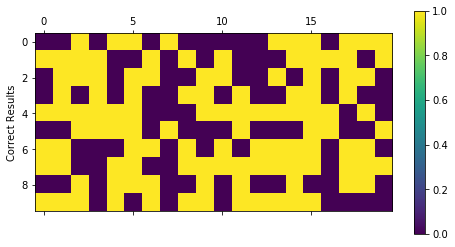

Final percentage:  tensor(0.5000)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


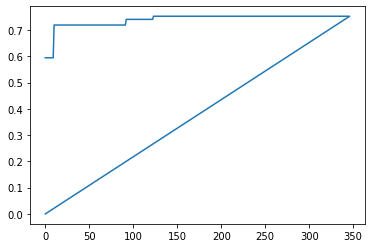

|  347      | -0.5      |  0.8613   |  207.2    |  1.276    |  0.5707   |  0.05675  |  0.4178   |  0.704    |  1.578e+0 |  3.726    |  0.6879   |  122.6    |  0.692    |  0.05382  |  2.256    |  0.9831   |  1.357    |  5.06     |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

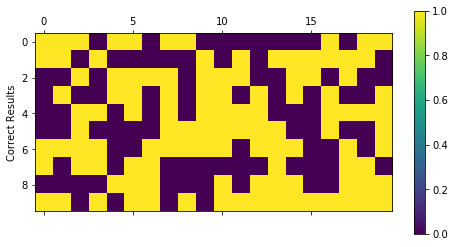

Final percentage:  tensor(0.5669)
Last epoch:  109


Best Score So Far:  tensor(-0.7522)


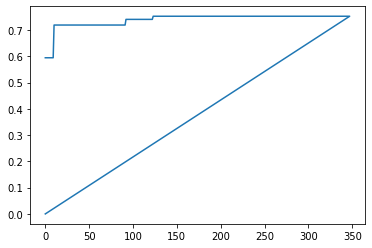

|  348      | -0.5669   |  0.03688  |  176.8    |  1.039    |  1.361    |  0.02192  |  1.606    |  0.5165   |  1.666e+0 |  2.644    |  0.2254   |  209.2    |  0.8794   |  0.3945   |  2.167    |  0.6237   |  3.176    |  6.312    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

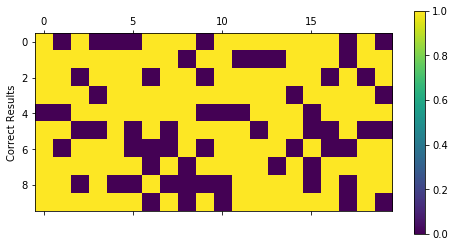

Final percentage:  tensor(0.6910)
Last epoch:  134


Best Score So Far:  tensor(-0.7522)


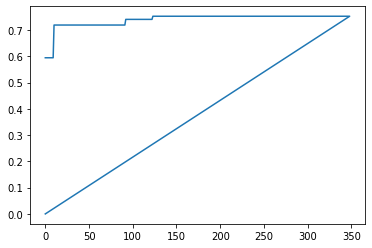

|  349      | -0.691    |  1.605    |  211.3    |  2.108    |  2.64     |  0.02029  |  0.8231   |  0.5041   |  1.103e+0 |  3.149    |  0.4317   |  98.26    |  0.4519   |  0.3308   |  1.477    |  0.915    |  3.39     |  4.002    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

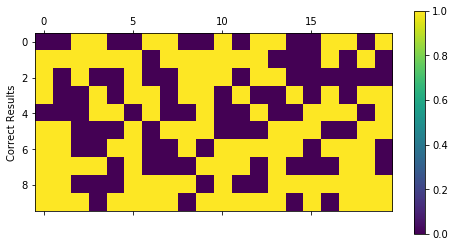

Final percentage:  tensor(0.5803)
Last epoch:  59


Best Score So Far:  tensor(-0.7522)


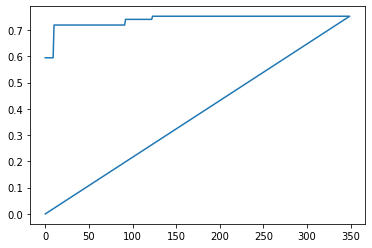

|  350      | -0.5803   |  0.3364   |  31.62    |  2.583    |  2.099    |  0.007523 |  0.232    |  0.731    |  1.87e+03 |  1.873    |  0.09181  |  207.5    |  0.02712  |  0.5727   |  1.319    |  0.6909   |  1.502    |  4.138    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

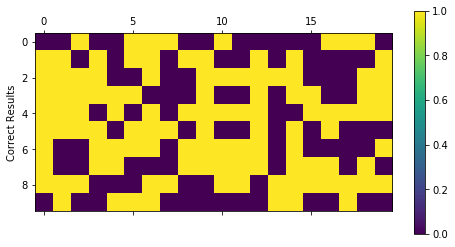

Final percentage:  tensor(0.5000)
Last epoch:  27


Best Score So Far:  tensor(-0.7522)


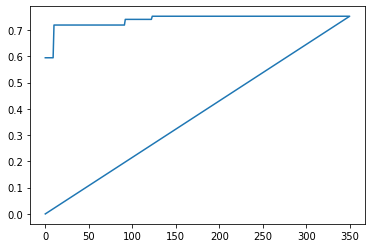

|  351      | -0.5      |  0.243    |  74.92    |  1.257    |  1.386    |  0.06494  |  0.7851   |  0.7624   |  1.755e+0 |  2.628    |  0.5072   |  83.43    |  0.5125   |  0.682    |  1.004    |  0.4801   |  3.703    |  8.637    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

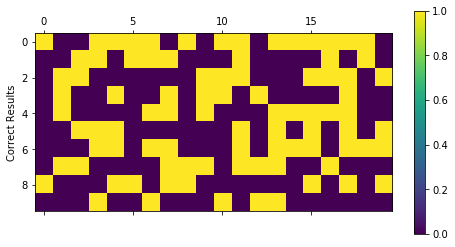

Final percentage:  tensor(0.4060)
Last epoch:  26


Best Score So Far:  tensor(-0.7522)


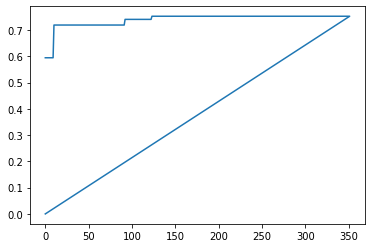

|  352      | -0.406    |  0.4398   |  189.0    |  2.164    |  1.571    |  0.06614  |  1.258    |  0.05713  |  1.417e+0 |  1.596    |  0.6305   |  71.42    |  0.4365   |  0.7395   |  2.558    |  0.8533   |  2.432    |  9.329    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

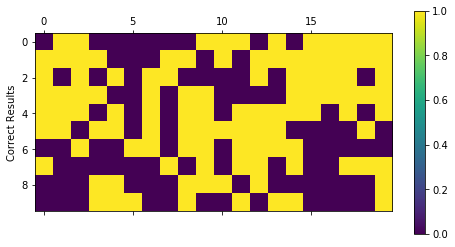

Final percentage:  tensor(0.5352)
Last epoch:  110


Best Score So Far:  tensor(-0.7522)


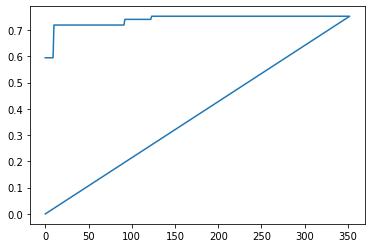

|  353      | -0.5352   |  0.06279  |  240.3    |  1.694    |  2.43     |  0.09483  |  1.775    |  0.5584   |  1.67e+03 |  3.911    |  0.4186   |  28.42    |  0.0251   |  0.7932   |  1.052    |  0.9499   |  2.704    |  6.912    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

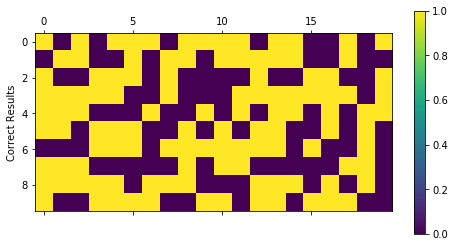

Final percentage:  tensor(0.5000)
Last epoch:  38


Best Score So Far:  tensor(-0.7522)


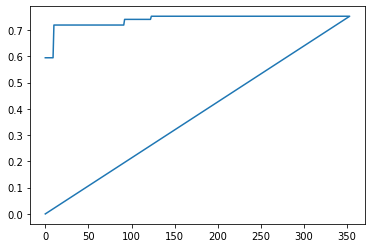

|  354      | -0.5      |  1.809    |  231.1    |  1.778    |  1.831    |  0.05218  |  1.626    |  0.04495  |  1.627e+0 |  2.285    |  0.7748   |  176.7    |  0.2615   |  0.1208   |  2.077    |  0.9809   |  2.046    |  9.949    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

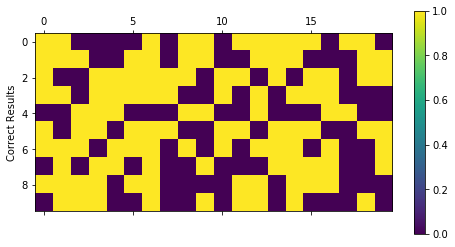

Final percentage:  tensor(0.5000)
Last epoch:  226


Best Score So Far:  tensor(-0.7522)


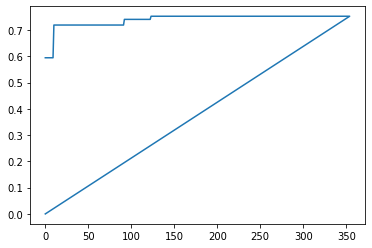

|  355      | -0.5      |  1.031    |  50.35    |  1.061    |  0.906    |  0.003508 |  1.174    |  0.5613   |  1.67e+03 |  2.065    |  0.1005   |  164.9    |  0.06407  |  0.5799   |  2.662    |  0.0571   |  2.064    |  6.562    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

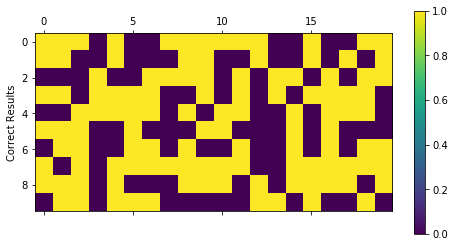

Final percentage:  tensor(0.5000)
Last epoch:  27


Best Score So Far:  tensor(-0.7522)


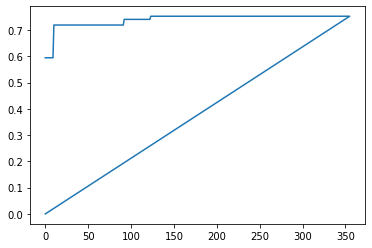

|  356      | -0.5      |  1.271    |  52.28    |  2.24     |  1.667    |  0.08857  |  1.387    |  0.2914   |  1.225e+0 |  2.827    |  0.23     |  21.26    |  0.8221   |  0.2052   |  1.755    |  0.8456   |  1.308    |  9.715    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

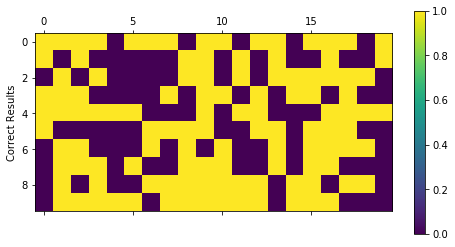

Final percentage:  tensor(0.5000)
Last epoch:  46


Best Score So Far:  tensor(-0.7522)


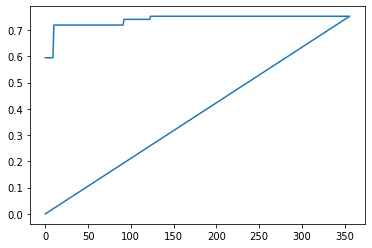

|  357      | -0.5      |  1.04     |  173.0    |  2.456    |  2.933    |  0.05528  |  1.392    |  0.5461   |  1.63e+03 |  3.39     |  0.3111   |  124.4    |  0.07897  |  0.8191   |  2.113    |  0.5245   |  1.798    |  9.091    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

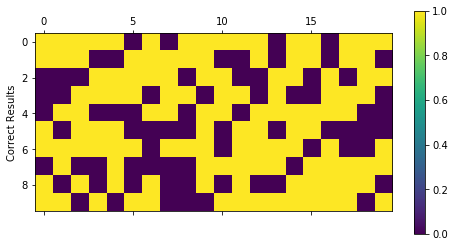

Final percentage:  tensor(0.6412)
Last epoch:  59


Best Score So Far:  tensor(-0.7522)


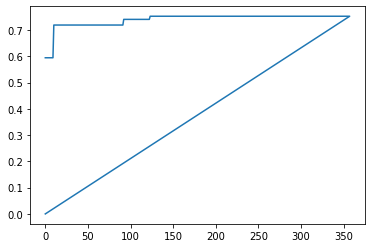

|  358      | -0.6412   |  0.02769  |  26.64    |  1.12     |  0.7204   |  0.04968  |  0.9224   |  0.2164   |  1.555e+0 |  1.68     |  0.3291   |  45.17    |  0.6639   |  0.0735   |  1.683    |  0.5305   |  2.643    |  4.305    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

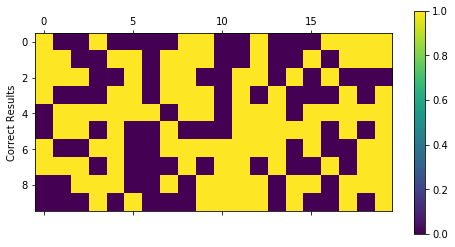

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


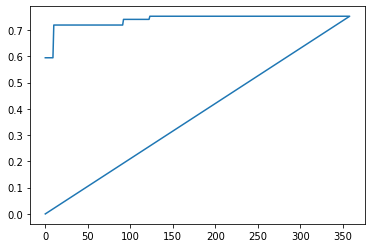

|  359      | -0.5      |  1.281    |  43.77    |  2.441    |  2.766    |  0.09898  |  1.748    |  0.2087   |  1.038e+0 |  3.912    |  0.5014   |  139.1    |  0.1472   |  0.8212   |  2.906    |  0.8588   |  3.071    |  4.469    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

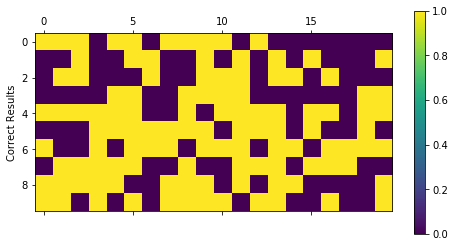

Final percentage:  tensor(0.4912)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


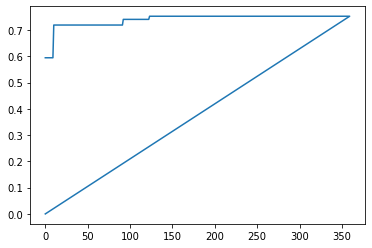

|  360      | -0.4912   |  1.844    |  219.0    |  2.667    |  1.746    |  0.006998 |  0.05105  |  0.1805   |  1.092e+0 |  3.228    |  0.766    |  139.3    |  0.611    |  0.4258   |  2.861    |  0.6122   |  2.855    |  8.713    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

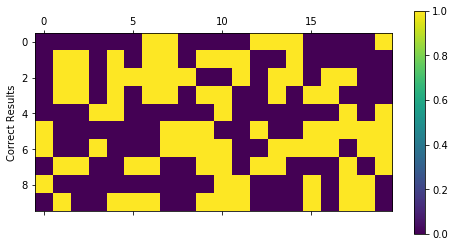

Final percentage:  tensor(0.4490)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


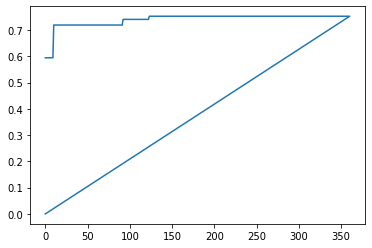

|  361      | -0.449    |  0.7636   |  18.28    |  2.473    |  2.524    |  0.05202  |  0.9306   |  0.0789   |  1.313e+0 |  1.56     |  0.6727   |  42.73    |  0.6843   |  0.3966   |  1.008    |  0.7016   |  3.371    |  4.043    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

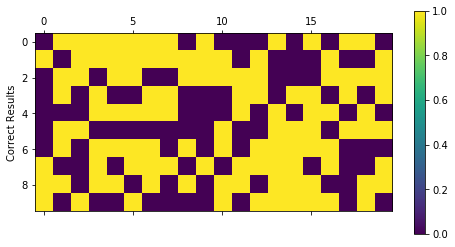

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


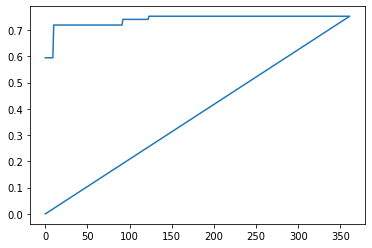

|  362      | -0.5      |  0.9499   |  14.37    |  1.451    |  2.082    |  0.01411  |  0.4589   |  0.5558   |  1.068e+0 |  3.181    |  0.5647   |  167.6    |  0.3218   |  0.4846   |  1.157    |  0.2842   |  1.607    |  5.597    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

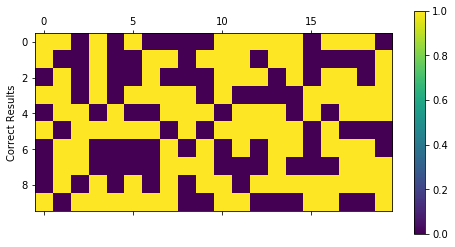

Final percentage:  tensor(0.5330)
Last epoch:  34


Best Score So Far:  tensor(-0.7522)


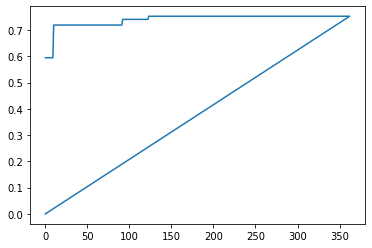

|  363      | -0.533    |  1.298    |  158.2    |  1.266    |  0.5387   |  0.04973  |  0.0399   |  0.5889   |  1.592e+0 |  1.475    |  0.8256   |  140.1    |  0.9968   |  0.03809  |  2.618    |  0.0773   |  3.811    |  4.249    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

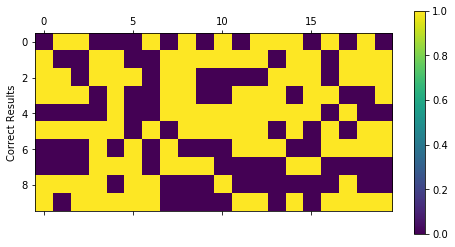

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


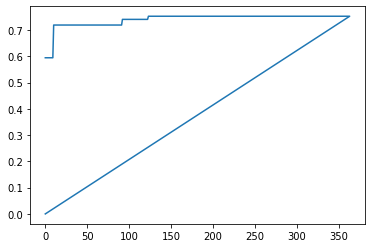

|  364      | -0.5      |  1.327    |  183.5    |  2.419    |  2.075    |  0.001165 |  0.4387   |  0.6378   |  1.787e+0 |  3.397    |  0.007056 |  12.5     |  0.07468  |  0.7864   |  1.95     |  0.731    |  1.653    |  7.022    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


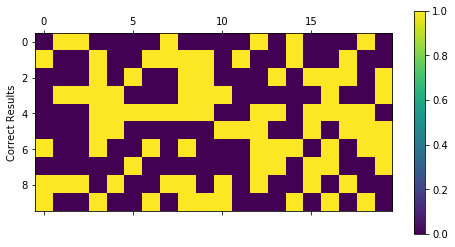

Final percentage:  tensor(0.4561)
Last epoch:  1538


Best Score So Far:  tensor(-0.7522)


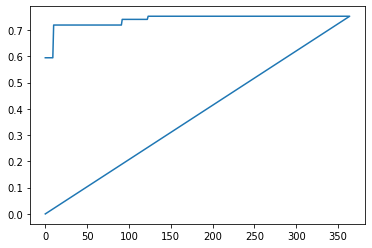

|  365      | -0.4561   |  0.8836   |  253.1    |  1.57     |  0.3244   |  0.05469  |  1.356    |  0.1078   |  1.539e+0 |  3.226    |  0.1007   |  201.6    |  0.5441   |  0.009472 |  2.172    |  0.8039   |  3.963    |  9.912    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


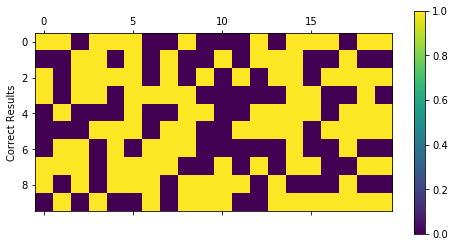

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


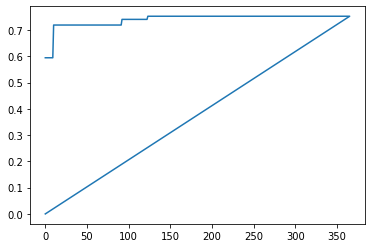

|  366      | -0.5      |  0.8238   |  11.48    |  2.931    |  0.6594   |  0.0955   |  1.921    |  0.2627   |  1.763e+0 |  2.889    |  0.7618   |  244.4    |  0.2064   |  0.3684   |  2.45     |  0.5893   |  3.814    |  5.018    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

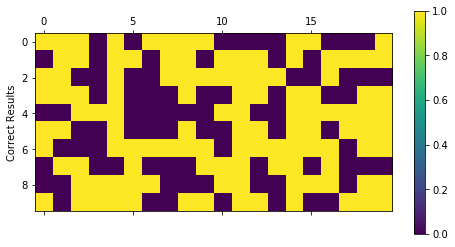

Final percentage:  tensor(0.5290)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


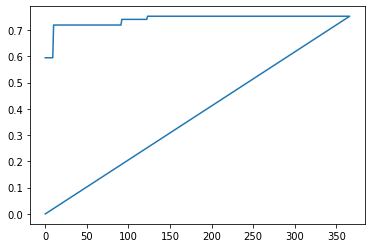

|  367      | -0.529    |  1.229    |  22.95    |  1.459    |  0.3647   |  0.07667  |  0.03834  |  0.7528   |  1.836e+0 |  3.03     |  0.02579  |  67.51    |  0.137    |  0.6396   |  1.138    |  0.889    |  2.658    |  1.929    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

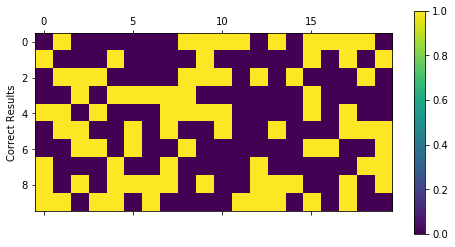

Final percentage:  tensor(0.4314)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


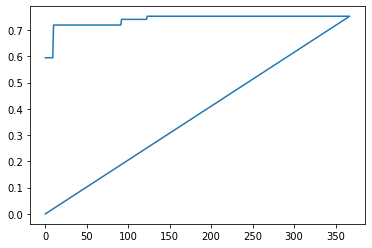

|  368      | -0.4314   |  0.9164   |  38.06    |  1.842    |  2.134    |  0.06963  |  0.6928   |  0.279    |  1.076e+0 |  1.262    |  0.0449   |  20.92    |  0.3853   |  0.7347   |  1.679    |  0.5056   |  2.864    |  6.262    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

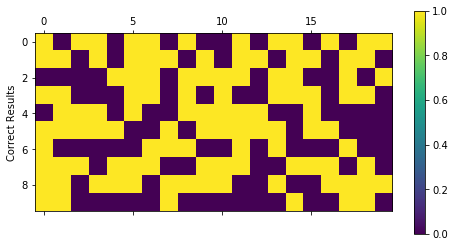

Final percentage:  tensor(0.5353)
Last epoch:  34


Best Score So Far:  tensor(-0.7522)


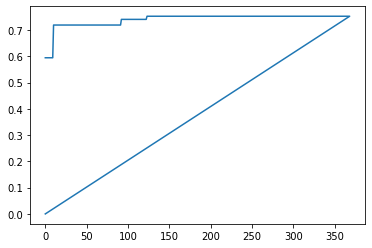

|  369      | -0.5353   |  0.2664   |  159.3    |  2.039    |  2.247    |  0.06757  |  0.9531   |  0.7649   |  1.261e+0 |  3.125    |  0.1815   |  170.6    |  0.25     |  0.1856   |  1.737    |  0.5083   |  3.036    |  3.783    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

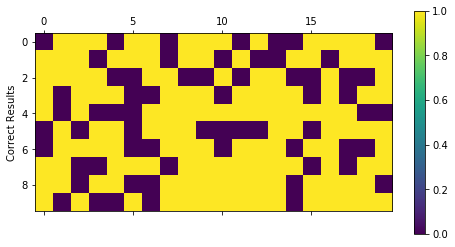

Final percentage:  tensor(0.6508)
Last epoch:  33


Best Score So Far:  tensor(-0.7522)


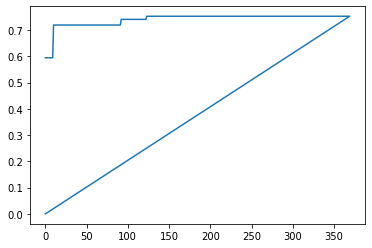

|  370      | -0.6508   |  0.7609   |  195.3    |  1.657    |  0.1908   |  0.00461  |  0.2685   |  0.3756   |  1.384e+0 |  3.019    |  0.08586  |  43.1     |  0.9682   |  0.382    |  2.823    |  0.2341   |  3.938    |  2.137    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

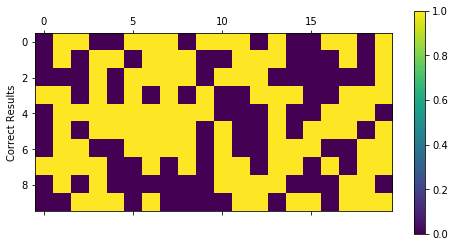

Final percentage:  tensor(0.5000)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


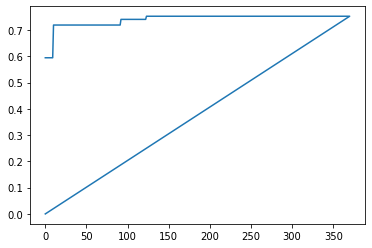

|  371      | -0.5      |  1.552    |  251.1    |  1.969    |  1.465    |  0.01751  |  1.212    |  0.1943   |  1.717e+0 |  2.417    |  0.2092   |  119.0    |  0.02556  |  0.08742  |  1.202    |  0.3888   |  3.141    |  1.475    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

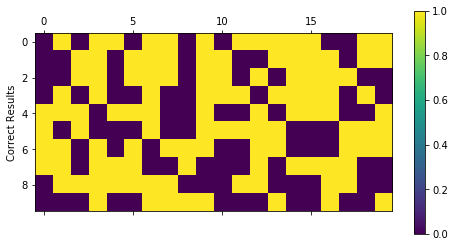

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


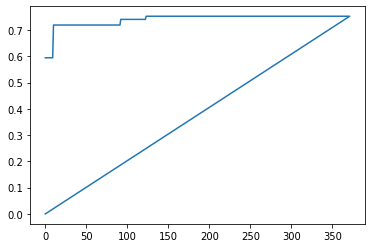

|  372      | -0.5      |  0.02485  |  39.46    |  2.864    |  2.589    |  0.04025  |  0.321    |  0.2839   |  1.935e+0 |  2.924    |  0.424    |  104.2    |  0.8958   |  0.8761   |  2.55     |  0.8325   |  1.918    |  9.446    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

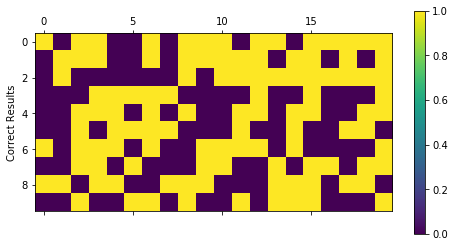

Final percentage:  tensor(0.5637)
Last epoch:  27


Best Score So Far:  tensor(-0.7522)


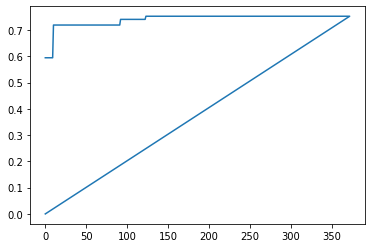

|  373      | -0.5637   |  0.9009   |  47.54    |  2.187    |  2.045    |  0.04373  |  0.743    |  0.5635   |  1.26e+03 |  3.052    |  0.5174   |  87.09    |  0.6763   |  0.03861  |  2.092    |  0.595    |  1.859    |  4.203    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

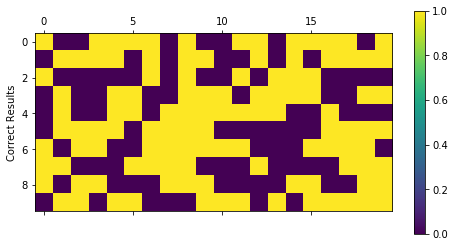

Final percentage:  tensor(0.5000)
Last epoch:  1434


Best Score So Far:  tensor(-0.7522)


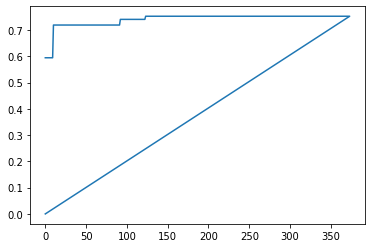

|  374      | -0.5      |  1.717    |  159.3    |  2.273    |  0.3128   |  0.02379  |  1.431    |  0.5596   |  1.447e+0 |  1.117    |  0.04537  |  24.48    |  0.8636   |  0.1225   |  2.31     |  0.5764   |  3.173    |  6.237    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

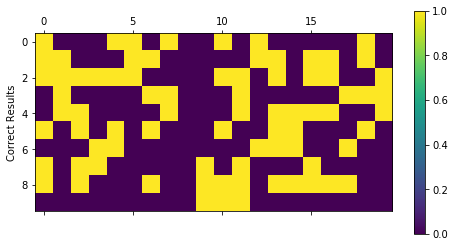

Final percentage:  tensor(0.4178)
Last epoch:  28


Best Score So Far:  tensor(-0.7522)


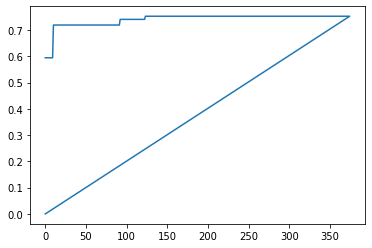

|  375      | -0.4178   |  0.357    |  188.5    |  2.185    |  1.633    |  0.07271  |  0.6248   |  0.05649  |  1.088e+0 |  1.98     |  0.2085   |  192.0    |  0.6074   |  0.08589  |  2.433    |  0.9152   |  3.465    |  7.053    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

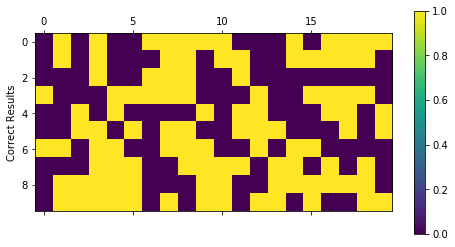

Final percentage:  tensor(0.5418)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


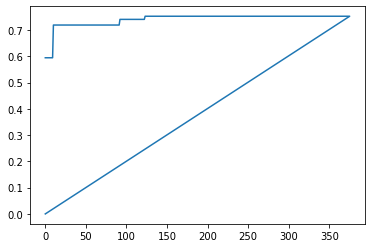

|  376      | -0.5418   |  1.546    |  40.13    |  1.13     |  2.236    |  0.09848  |  0.4781   |  0.4495   |  1.081e+0 |  2.678    |  0.4054   |  63.1     |  0.5652   |  0.5886   |  2.814    |  0.7819   |  3.921    |  4.98     |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


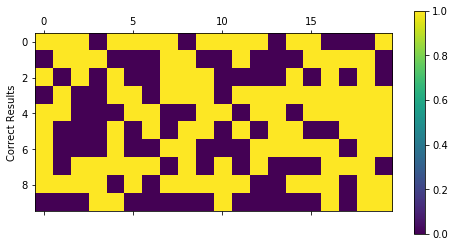

Final percentage:  tensor(0.5845)
Last epoch:  24


Best Score So Far:  tensor(-0.7522)


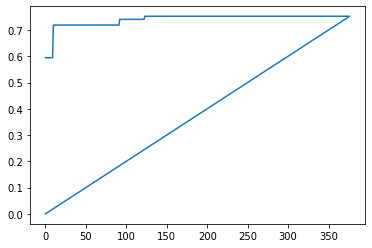

|  377      | -0.5845   |  0.2806   |  106.1    |  2.577    |  0.631    |  0.01774  |  1.284    |  0.7576   |  1.409e+0 |  3.084    |  0.3636   |  90.85    |  0.1337   |  0.01792  |  1.238    |  0.4438   |  3.182    |  1.483    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

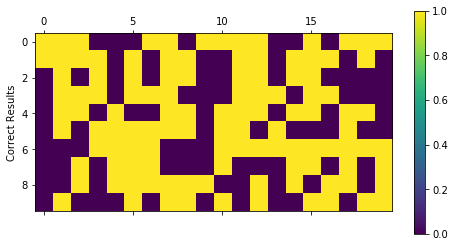

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


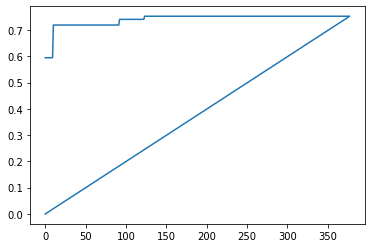

|  378      | -0.5      |  0.4411   |  9.89     |  2.658    |  1.142    |  0.02846  |  1.56     |  0.2231   |  1.281e+0 |  3.796    |  0.1478   |  11.63    |  0.9551   |  0.2755   |  1.824    |  0.796    |  2.065    |  1.943    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

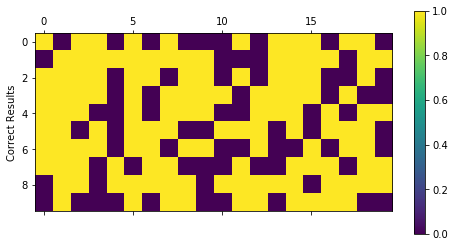

Final percentage:  tensor(0.6415)
Last epoch:  38


Best Score So Far:  tensor(-0.7522)


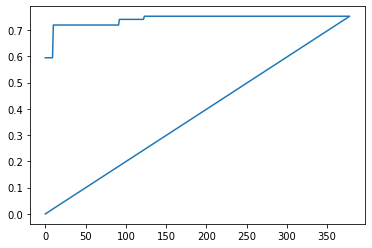

|  379      | -0.6415   |  1.57     |  34.92    |  1.394    |  0.4177   |  0.02217  |  0.4683   |  0.5811   |  1.095e+0 |  2.998    |  0.8198   |  162.0    |  0.3372   |  0.7555   |  2.788    |  0.493    |  2.685    |  6.22     |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

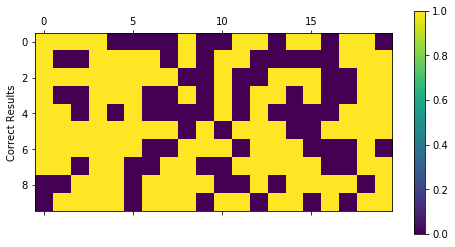

Final percentage:  tensor(0.6082)
Last epoch:  22


Best Score So Far:  tensor(-0.7522)


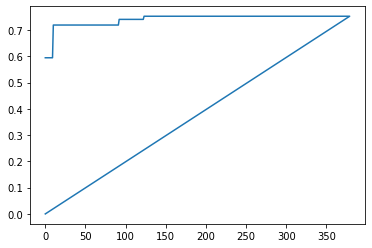

|  380      | -0.6082   |  0.2642   |  96.76    |  2.615    |  1.554    |  0.09396  |  1.225    |  0.6236   |  1.248e+0 |  2.672    |  0.7296   |  40.79    |  0.5401   |  0.5493   |  1.372    |  0.6363   |  1.202    |  8.008    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

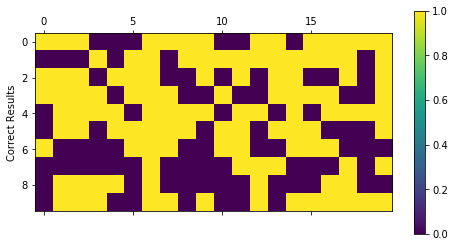

Final percentage:  tensor(0.6088)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


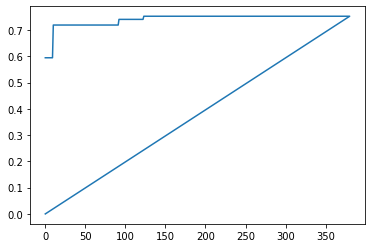

|  381      | -0.6088   |  0.6487   |  124.6    |  1.761    |  0.9777   |  0.09877  |  1.749    |  0.2418   |  1.161e+0 |  2.583    |  0.1243   |  167.0    |  0.2335   |  0.0869   |  1.044    |  0.8582   |  1.427    |  4.622    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

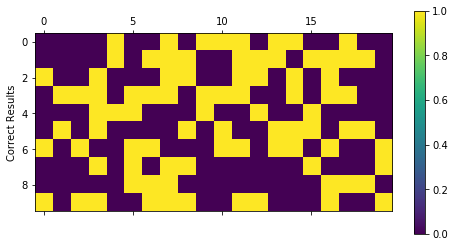

Final percentage:  tensor(0.4000)
Last epoch:  23


Best Score So Far:  tensor(-0.7522)


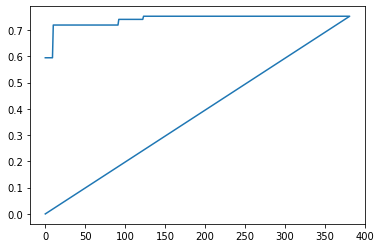

|  382      | -0.4      |  0.1862   |  31.94    |  1.746    |  0.4945   |  0.0719   |  0.2504   |  0.5911   |  1.841e+0 |  1.247    |  0.03608  |  127.4    |  0.6006   |  0.6156   |  1.952    |  0.5426   |  2.643    |  7.417    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

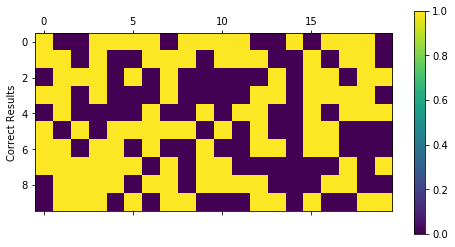

Final percentage:  tensor(0.5609)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


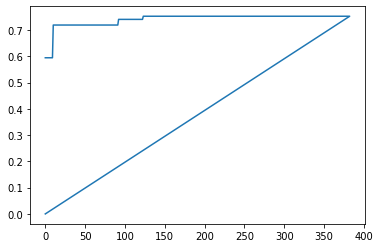

|  383      | -0.5609   |  0.3108   |  7.523    |  2.011    |  2.852    |  0.002515 |  1.219    |  0.3951   |  1.9e+03  |  1.071    |  0.5936   |  168.7    |  0.883    |  0.4828   |  2.374    |  0.4123   |  3.472    |  7.158    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

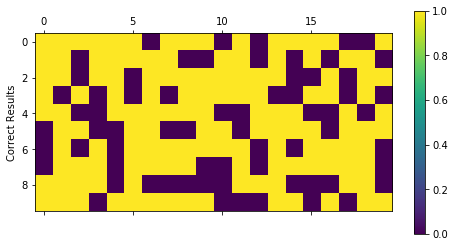

Final percentage:  tensor(0.6433)
Last epoch:  30


Best Score So Far:  tensor(-0.7522)


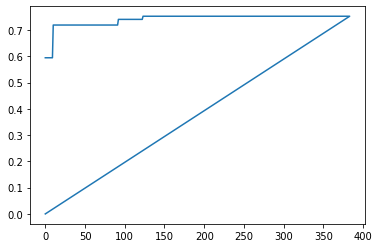

|  384      | -0.6433   |  0.2149   |  37.53    |  1.315    |  0.3604   |  0.02303  |  0.8425   |  0.5366   |  1.337e+0 |  2.554    |  0.739    |  226.7    |  0.7041   |  0.751    |  1.615    |  0.7898   |  3.741    |  1.345    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

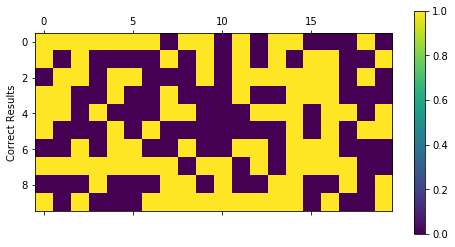

Final percentage:  tensor(0.4677)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


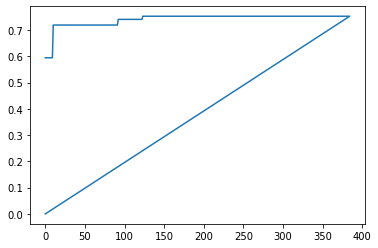

|  385      | -0.4677   |  0.8868   |  62.94    |  1.983    |  1.846    |  0.0209   |  1.74     |  0.2047   |  1.714e+0 |  3.548    |  0.8392   |  244.8    |  0.6798   |  0.5657   |  2.186    |  0.4846   |  2.078    |  1.187    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

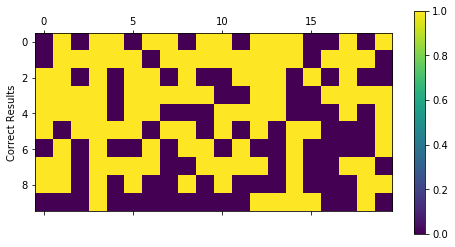

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7522)


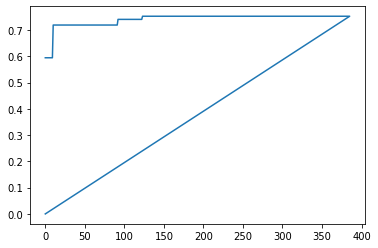

|  386      | -0.5      |  1.49     |  102.0    |  1.556    |  2.325    |  0.06603  |  1.81     |  0.1021   |  1.382e+0 |  2.726    |  0.3191   |  90.4     |  0.4841   |  0.06429  |  1.077    |  0.8398   |  1.022    |  7.327    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

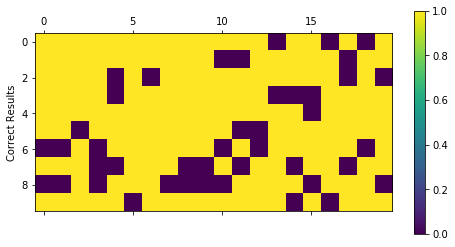

Final percentage:  tensor(0.7928)
Last epoch:  189


Best Score So Far:  tensor(-0.7928)


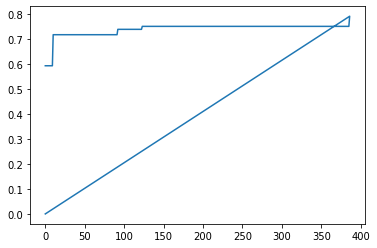

|  387      | -0.7928   |  0.8867   |  248.3    |  2.612    |  1.195    |  0.03938  |  0.2559   |  0.2917   |  1.204e+0 |  1.945    |  0.5061   |  220.9    |  0.09901  |  0.7471   |  2.832    |  0.2234   |  1.601    |  7.908    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

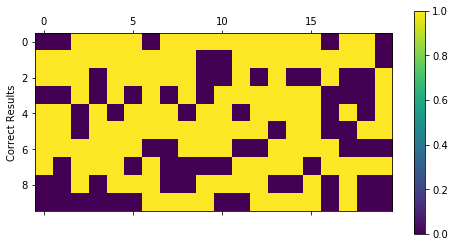

Final percentage:  tensor(0.6230)
Last epoch:  28


Best Score So Far:  tensor(-0.7928)


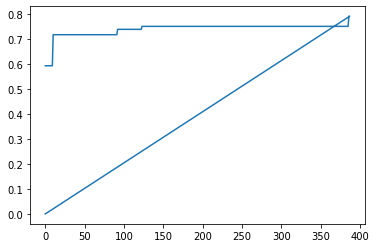

|  388      | -0.623    |  0.04085  |  126.4    |  1.045    |  2.414    |  0.002436 |  0.3195   |  0.1969   |  1.997e+0 |  2.258    |  0.06505  |  65.57    |  0.4117   |  0.3782   |  1.243    |  0.009494 |  3.438    |  3.175    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

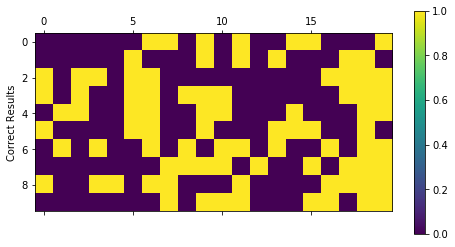

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


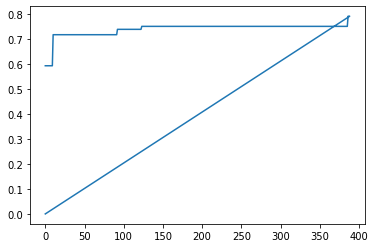

|  389      | -0.5      |  0.166    |  101.1    |  1.861    |  1.567    |  0.07603  |  1.568    |  0.3755   |  1.885e+0 |  1.237    |  0.3201   |  93.41    |  0.7105   |  0.7609   |  2.439    |  0.1107   |  2.792    |  5.582    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

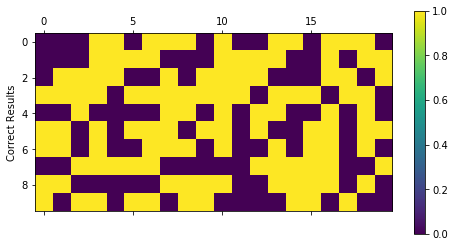

Final percentage:  tensor(0.5000)
Last epoch:  28


Best Score So Far:  tensor(-0.7928)


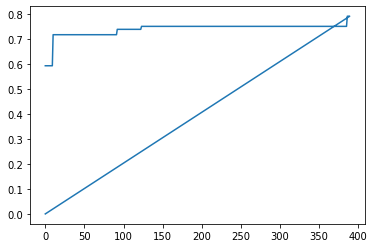

|  390      | -0.5      |  1.205    |  5.091    |  1.574    |  0.1551   |  0.03859  |  1.511    |  0.2208   |  1.614e+0 |  2.876    |  0.2265   |  122.7    |  0.1442   |  0.06302  |  2.578    |  0.1793   |  1.377    |  9.694    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

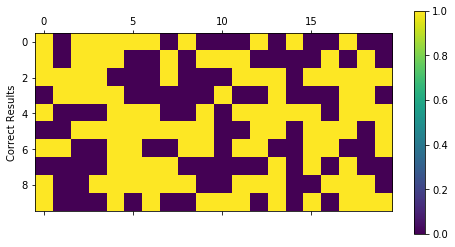

Final percentage:  tensor(0.5396)
Last epoch:  25


Best Score So Far:  tensor(-0.7928)


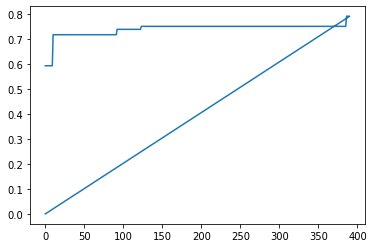

|  391      | -0.5396   |  0.1107   |  175.2    |  1.746    |  0.5187   |  0.02729  |  1.456    |  0.6844   |  1.269e+0 |  2.038    |  0.3686   |  212.2    |  0.7494   |  0.1885   |  2.08     |  0.766    |  2.431    |  5.994    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

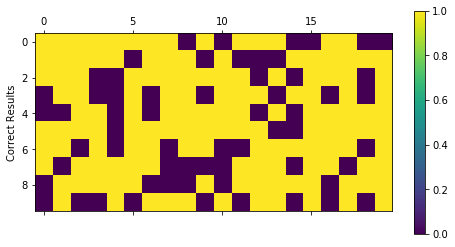

Final percentage:  tensor(0.6796)
Last epoch:  22


Best Score So Far:  tensor(-0.7928)


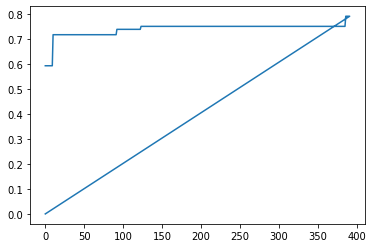

|  392      | -0.6796   |  0.4229   |  169.5    |  1.143    |  1.082    |  0.04004  |  1.211    |  0.7589   |  1.219e+0 |  2.627    |  0.722    |  155.2    |  0.7384   |  0.1048   |  2.663    |  0.311    |  2.307    |  1.763    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

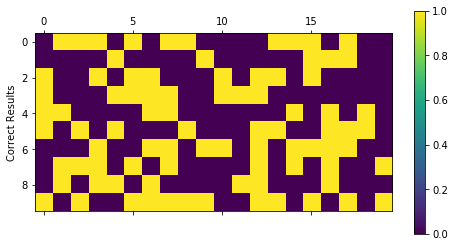

Final percentage:  tensor(0.4942)
Last epoch:  44


Best Score So Far:  tensor(-0.7928)


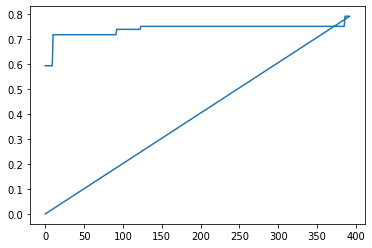

|  393      | -0.4942   |  1.367    |  217.2    |  1.963    |  0.303    |  0.0103   |  0.2301   |  0.3959   |  1.622e+0 |  1.099    |  0.05633  |  252.6    |  0.2915   |  0.4291   |  2.255    |  0.7142   |  1.327    |  1.986    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

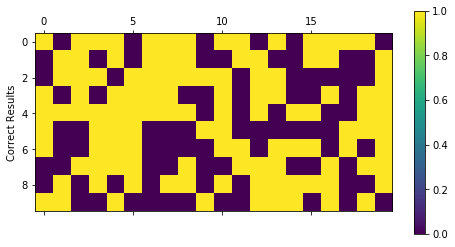

Final percentage:  tensor(0.5145)
Last epoch:  23


Best Score So Far:  tensor(-0.7928)


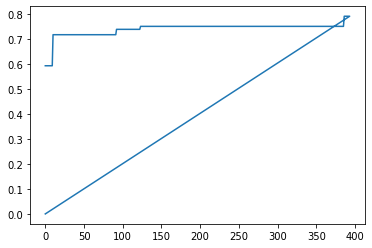

|  394      | -0.5145   |  1.815    |  84.32    |  2.44     |  2.122    |  0.04688  |  0.1817   |  0.7119   |  1.835e+0 |  2.291    |  0.4103   |  140.7    |  0.3787   |  0.4542   |  1.941    |  0.2856   |  3.609    |  1.424    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

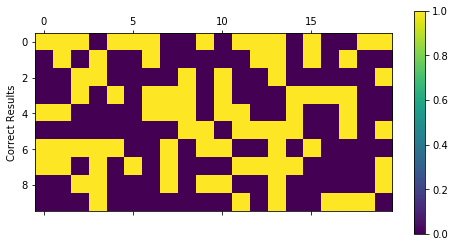

Final percentage:  tensor(0.5000)
Last epoch:  124


Best Score So Far:  tensor(-0.7928)


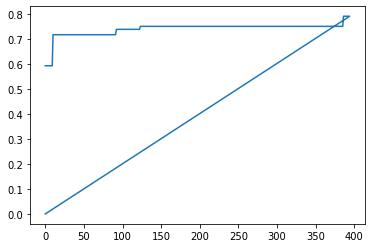

|  395      | -0.5      |  0.725    |  198.6    |  1.966    |  2.351    |  0.04826  |  1.969    |  0.7072   |  1.008e+0 |  2.42     |  0.7717   |  89.26    |  0.7285   |  0.3765   |  1.191    |  0.3149   |  1.936    |  6.884    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

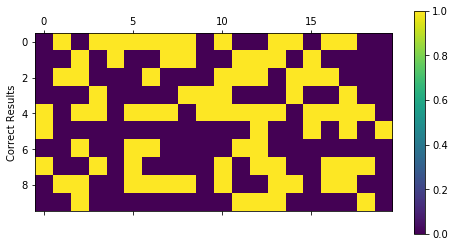

Final percentage:  tensor(0.4942)
Last epoch:  30


Best Score So Far:  tensor(-0.7928)


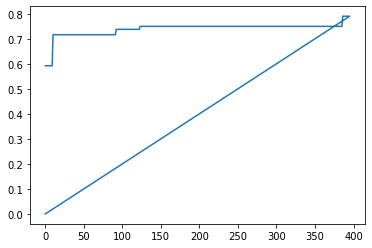

|  396      | -0.4942   |  1.844    |  180.7    |  1.643    |  2.043    |  0.00841  |  0.7472   |  0.152    |  1.693e+0 |  2.98     |  0.3178   |  47.87    |  0.1573   |  0.2133   |  1.654    |  0.8687   |  1.365    |  2.512    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


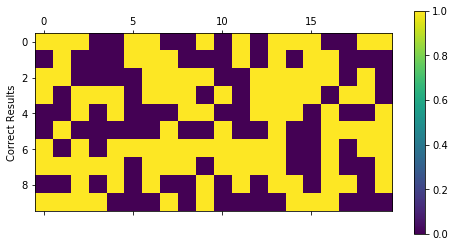

Final percentage:  tensor(0.4911)
Last epoch:  26


Best Score So Far:  tensor(-0.7928)


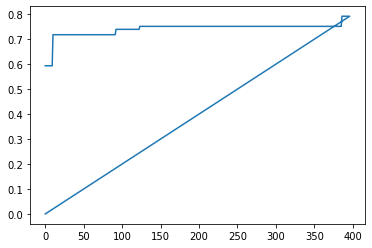

|  397      | -0.4911   |  0.7372   |  155.5    |  1.111    |  0.7332   |  0.0834   |  1.319    |  0.2811   |  1.114e+0 |  1.971    |  0.2201   |  182.5    |  0.3009   |  0.6095   |  1.821    |  0.3496   |  3.35     |  2.667    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

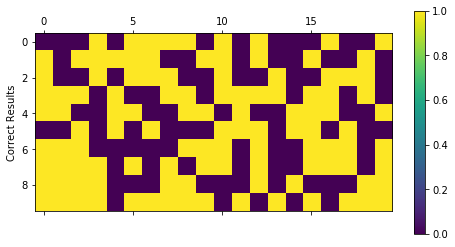

Final percentage:  tensor(0.4984)
Last epoch:  75


Best Score So Far:  tensor(-0.7928)


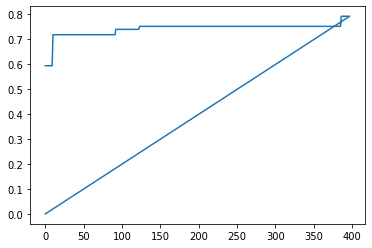

|  398      | -0.4984   |  0.9091   |  150.2    |  1.639    |  2.112    |  0.09178  |  0.1454   |  0.1451   |  1.509e+0 |  3.392    |  0.5679   |  7.001    |  0.3303   |  0.5884   |  2.367    |  0.4818   |  1.161    |  6.644    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

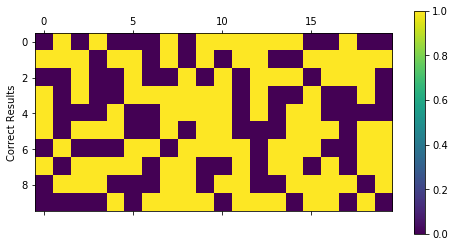

Final percentage:  tensor(0.5000)
Last epoch:  31


Best Score So Far:  tensor(-0.7928)


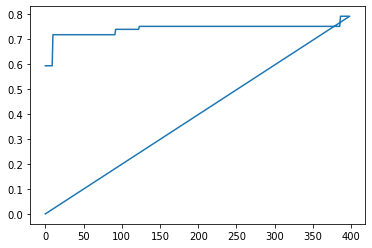

|  399      | -0.5      |  1.003    |  186.3    |  1.777    |  2.499    |  0.03075  |  1.719    |  0.01158  |  1.763e+0 |  3.474    |  0.6128   |  231.3    |  0.2023   |  0.3168   |  1.456    |  0.8441   |  3.232    |  8.813    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

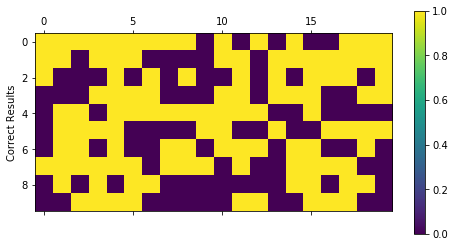

Final percentage:  tensor(0.5886)
Last epoch:  27


Best Score So Far:  tensor(-0.7928)


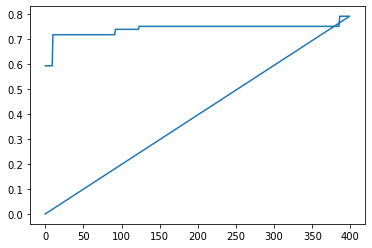

|  400      | -0.5886   |  0.6918   |  41.1     |  2.927    |  1.342    |  0.07299  |  1.302    |  0.1143   |  1.844e+0 |  3.926    |  0.8696   |  87.45    |  0.9251   |  0.1199   |  2.87     |  0.04406  |  2.223    |  8.579    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

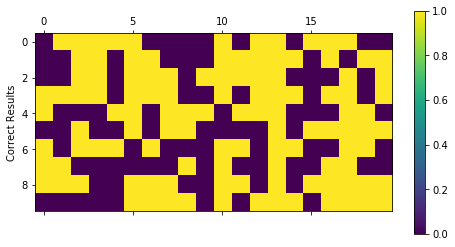

Final percentage:  tensor(0.5000)
Last epoch:  24


Best Score So Far:  tensor(-0.7928)


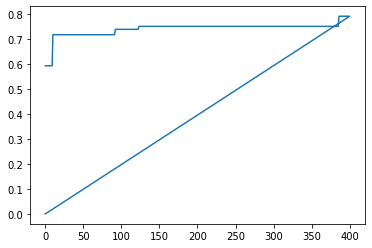

|  401      | -0.5      |  1.445    |  185.1    |  1.552    |  1.259    |  0.05895  |  0.7744   |  0.4048   |  1.54e+03 |  3.465    |  0.6525   |  169.8    |  0.03681  |  0.1398   |  2.764    |  0.765    |  1.539    |  1.586    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

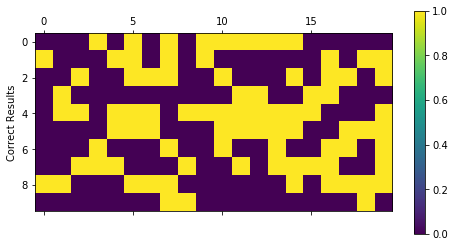

Final percentage:  tensor(0.5000)
Last epoch:  24


Best Score So Far:  tensor(-0.7928)


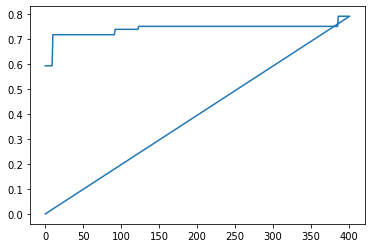

|  402      | -0.5      |  0.3238   |  214.7    |  2.936    |  2.258    |  0.07846  |  0.05847  |  0.6997   |  1.681e+0 |  2.044    |  0.4496   |  243.3    |  0.05498  |  0.1725   |  1.299    |  0.5377   |  1.705    |  1.69     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

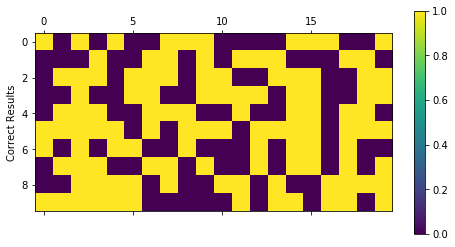

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


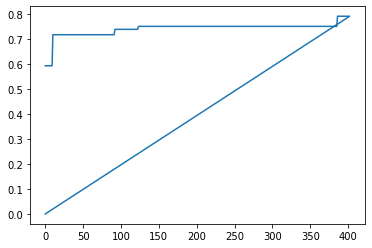

|  403      | -0.5      |  1.025    |  214.4    |  2.357    |  0.1098   |  0.004527 |  1.071    |  0.1131   |  1.707e+0 |  1.74     |  0.396    |  159.6    |  0.9718   |  0.1773   |  2.815    |  0.3504   |  1.484    |  4.784    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

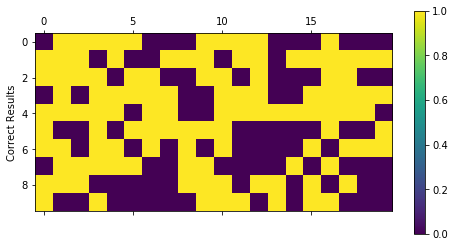

Final percentage:  tensor(0.5857)
Last epoch:  57


Best Score So Far:  tensor(-0.7928)


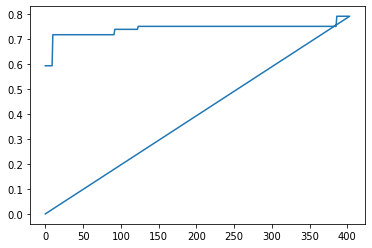

|  404      | -0.5857   |  1.675    |  13.12    |  1.273    |  1.764    |  0.04086  |  0.9518   |  0.6576   |  1.167e+0 |  1.963    |  0.185    |  27.23    |  0.5243   |  0.1913   |  2.8      |  0.04598  |  3.683    |  6.284    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

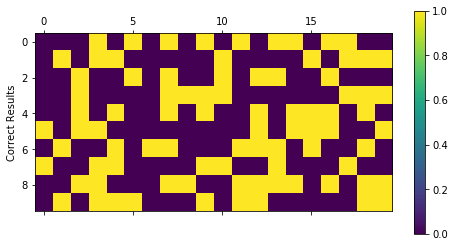

Final percentage:  tensor(0.4942)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


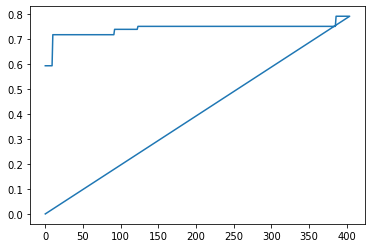

|  405      | -0.4942   |  1.715    |  9.409    |  1.663    |  1.498    |  0.02171  |  0.841    |  0.02363  |  1.587e+0 |  3.78     |  0.06824  |  215.8    |  0.7473   |  0.207    |  2.031    |  0.3134   |  2.841    |  2.916    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

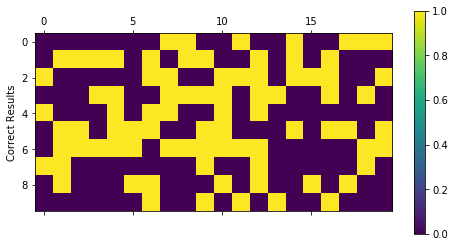

Final percentage:  tensor(0.4627)
Last epoch:  23


Best Score So Far:  tensor(-0.7928)


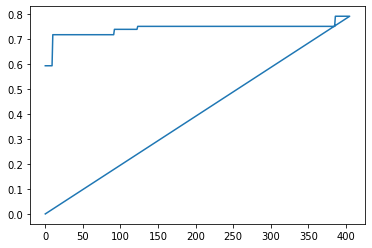

|  406      | -0.4627   |  0.8674   |  202.4    |  1.928    |  2.014    |  0.08848  |  1.867    |  0.7878   |  1.884e+0 |  1.728    |  0.3675   |  97.2     |  0.1529   |  0.06341  |  1.589    |  0.8591   |  1.117    |  2.937    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

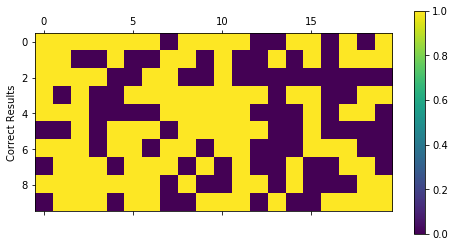

Final percentage:  tensor(0.5917)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


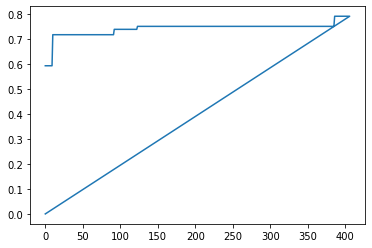

|  407      | -0.5917   |  0.6896   |  166.6    |  2.121    |  2.381    |  0.0687   |  1.77     |  0.3895   |  1.536e+0 |  3.505    |  0.005134 |  63.61    |  0.2221   |  0.5054   |  2.428    |  0.2522   |  2.513    |  7.646    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

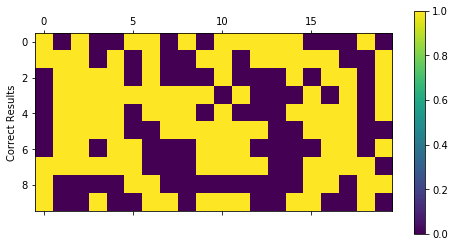

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


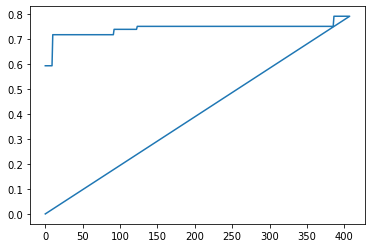

|  408      | -0.5      |  1.437    |  121.0    |  2.405    |  1.672    |  0.007841 |  1.896    |  0.7805   |  1.162e+0 |  2.249    |  0.5576   |  146.3    |  0.375    |  0.8132   |  2.348    |  0.1125   |  3.002    |  2.96     |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

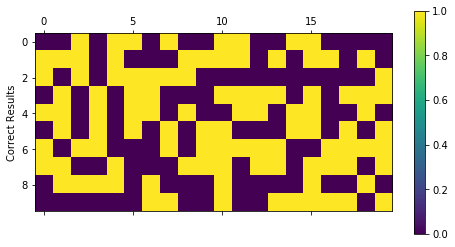

Final percentage:  tensor(0.5003)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


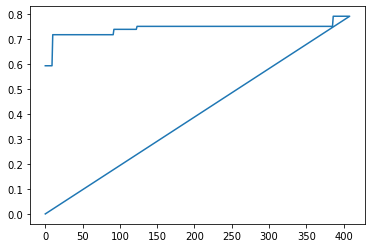

|  409      | -0.5003   |  0.1713   |  93.42    |  1.099    |  0.4384   |  0.04531  |  1.957    |  0.6735   |  1.013e+0 |  3.598    |  0.2551   |  52.2     |  0.31     |  0.4763   |  1.961    |  0.6292   |  1.499    |  4.365    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

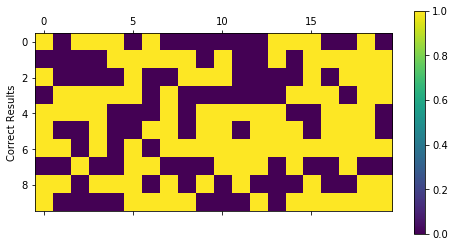

Final percentage:  tensor(0.5000)
Last epoch:  32


Best Score So Far:  tensor(-0.7928)


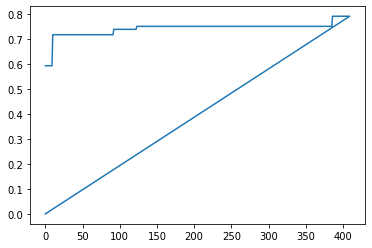

|  410      | -0.5      |  1.159    |  207.9    |  1.733    |  2.51     |  0.04168  |  1.876    |  0.2371   |  1.369e+0 |  2.952    |  0.5251   |  91.96    |  0.4843   |  0.5979   |  1.112    |  0.6058   |  3.233    |  8.138    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

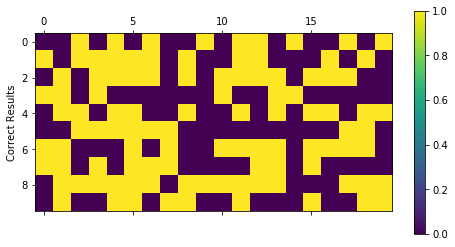

Final percentage:  tensor(0.4789)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


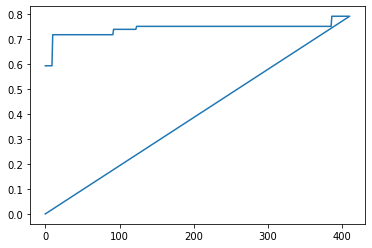

|  411      | -0.4789   |  0.4254   |  164.8    |  2.455    |  0.2842   |  0.007007 |  1.763    |  0.2891   |  1.703e+0 |  2.675    |  0.304    |  89.8     |  0.9047   |  0.4081   |  1.96     |  0.9782   |  2.231    |  4.321    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

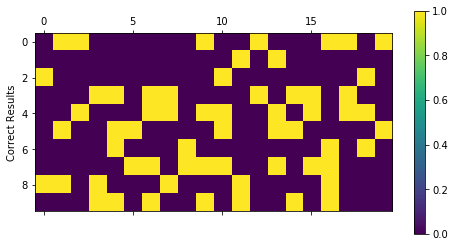

Final percentage:  tensor(0.3404)
Last epoch:  27


Best Score So Far:  tensor(-0.7928)


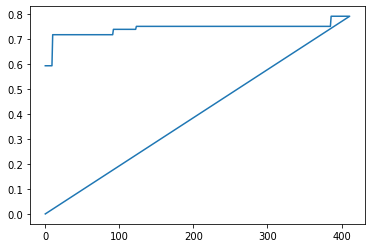

|  412      | -0.3404   |  0.1591   |  100.5    |  1.354    |  0.3927   |  0.03677  |  0.316    |  0.2461   |  1.688e+0 |  3.507    |  0.2743   |  91.69    |  0.7302   |  0.7      |  1.352    |  0.4014   |  1.009    |  4.601    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

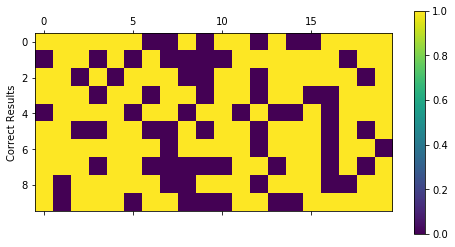

Final percentage:  tensor(0.6604)
Last epoch:  22


Best Score So Far:  tensor(-0.7928)


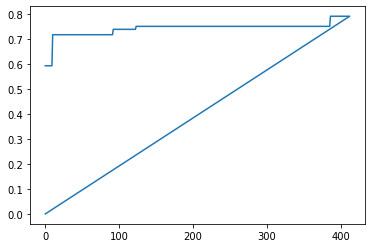

|  413      | -0.6604   |  1.777    |  16.6     |  1.775    |  0.7934   |  0.003678 |  0.797    |  0.1902   |  1.831e+0 |  2.924    |  0.4289   |  182.0    |  0.1002   |  0.6813   |  1.594    |  0.5023   |  1.282    |  8.323    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

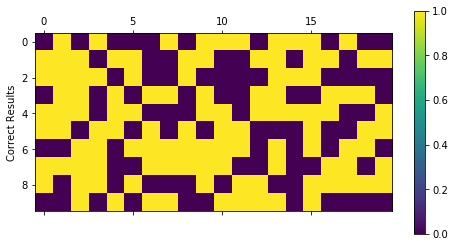

Final percentage:  tensor(0.5000)
Last epoch:  31


Best Score So Far:  tensor(-0.7928)


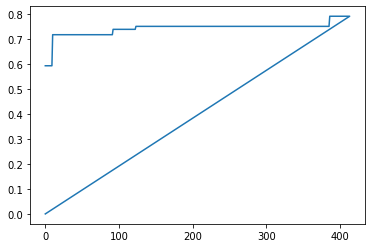

|  414      | -0.5      |  1.016    |  114.3    |  1.268    |  1.898    |  0.03523  |  1.359    |  0.61     |  1.007e+0 |  1.775    |  0.6101   |  87.37    |  0.7496   |  0.5013   |  2.708    |  0.57     |  3.659    |  3.045    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

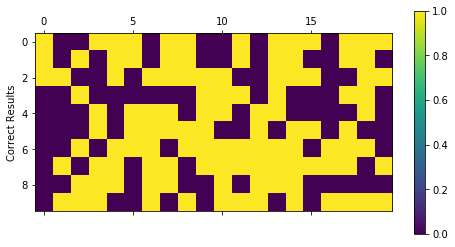

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


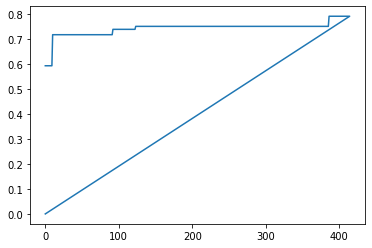

|  415      | -0.5      |  1.58     |  10.62    |  1.154    |  1.184    |  0.01858  |  1.879    |  0.6237   |  1.744e+0 |  2.471    |  0.441    |  149.6    |  0.5964   |  0.8082   |  1.24     |  0.5091   |  3.977    |  5.328    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

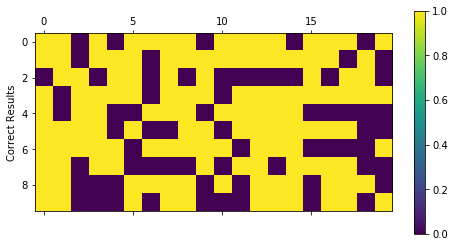

Final percentage:  tensor(0.5988)
Last epoch:  22


Best Score So Far:  tensor(-0.7928)


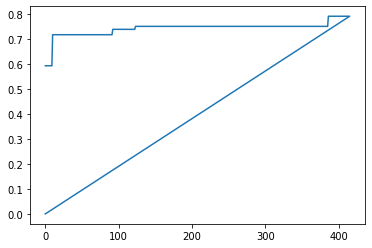

|  416      | -0.5988   |  1.667    |  155.3    |  2.322    |  0.8147   |  0.08309  |  0.4865   |  0.5387   |  1.088e+0 |  1.056    |  0.4251   |  240.5    |  0.3259   |  0.2899   |  1.104    |  0.6746   |  3.158    |  9.124    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

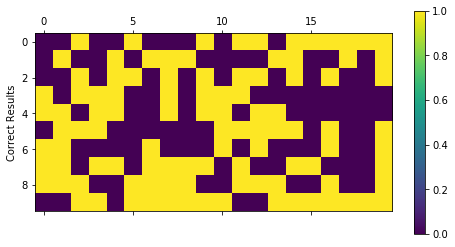

Final percentage:  tensor(0.5032)
Last epoch:  26


Best Score So Far:  tensor(-0.7928)


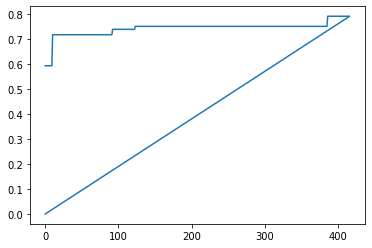

|  417      | -0.5032   |  0.8699   |  29.82    |  1.075    |  2.633    |  0.06523  |  1.822    |  0.7045   |  1.47e+03 |  3.004    |  0.6706   |  109.2    |  0.1546   |  0.2557   |  2.091    |  0.2555   |  3.666    |  6.221    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

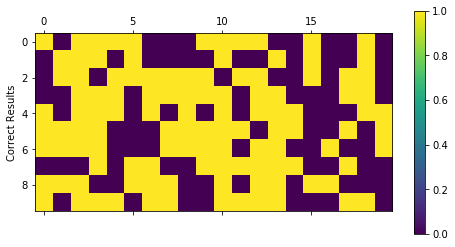

Final percentage:  tensor(0.5000)
Last epoch:  504


Best Score So Far:  tensor(-0.7928)


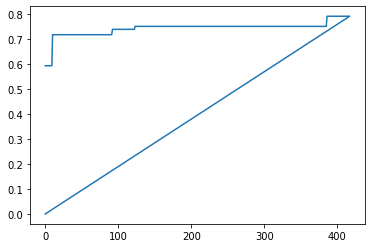

|  418      | -0.5      |  1.43     |  221.0    |  2.784    |  2.863    |  0.06275  |  1.988    |  0.6324   |  1.271e+0 |  3.962    |  0.7214   |  66.29    |  0.03283  |  0.8575   |  2.108    |  0.5522   |  1.142    |  6.745    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

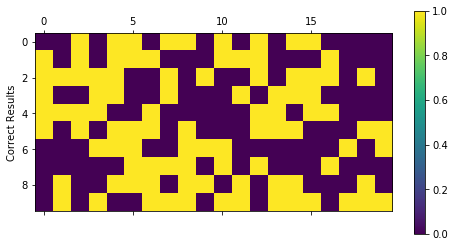

Final percentage:  tensor(0.5153)
Last epoch:  65


Best Score So Far:  tensor(-0.7928)


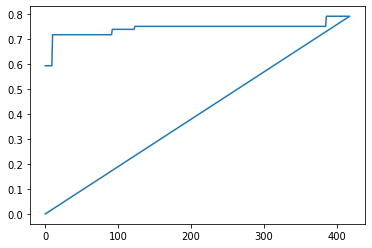

|  419      | -0.5153   |  0.9952   |  206.3    |  1.138    |  1.683    |  0.04087  |  1.098    |  0.2868   |  1.999e+0 |  2.346    |  0.3112   |  50.19    |  0.9227   |  0.09386  |  1.876    |  0.6855   |  1.426    |  9.374    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

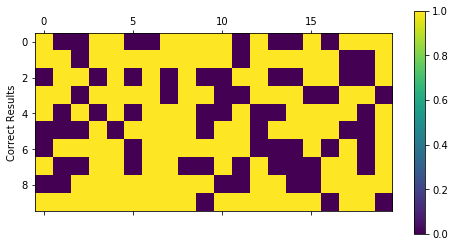

Final percentage:  tensor(0.6243)
Last epoch:  23


Best Score So Far:  tensor(-0.7928)


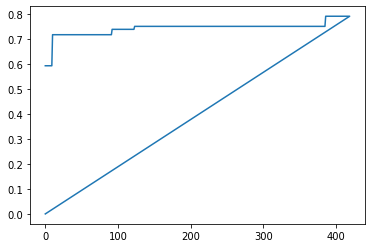

|  420      | -0.6243   |  0.1172   |  57.4     |  1.154    |  1.23     |  0.05973  |  1.455    |  0.7027   |  1.353e+0 |  3.1      |  0.04376  |  210.1    |  0.3186   |  0.1995   |  1.718    |  0.114    |  1.878    |  1.079    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

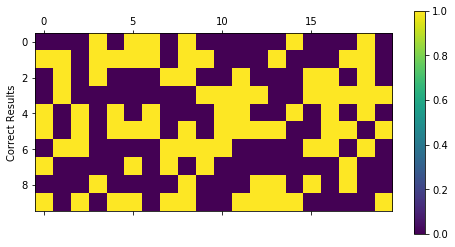

Final percentage:  tensor(0.4945)
Last epoch:  25


Best Score So Far:  tensor(-0.7928)


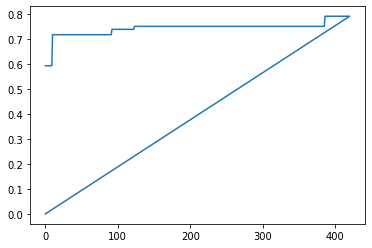

|  421      | -0.4945   |  0.504    |  214.8    |  2.607    |  1.144    |  0.04307  |  0.3633   |  0.2535   |  1.417e+0 |  1.199    |  0.3041   |  127.9    |  0.007708 |  0.3943   |  1.435    |  0.2132   |  1.745    |  2.154    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
l

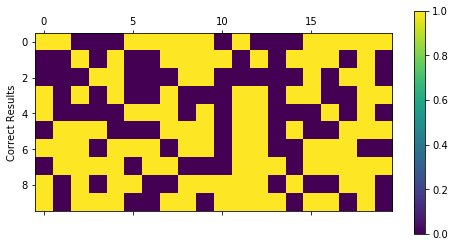

Final percentage:  tensor(0.5000)
Last epoch:  29


Best Score So Far:  tensor(-0.7928)


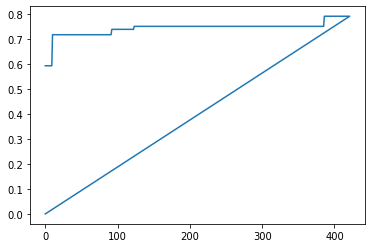

|  422      | -0.5      |  1.88     |  44.94    |  2.13     |  0.5128   |  0.02609  |  1.347    |  0.4026   |  1.157e+0 |  1.247    |  0.7937   |  63.44    |  0.9581   |  0.8031   |  1.318    |  0.5032   |  1.356    |  1.996    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

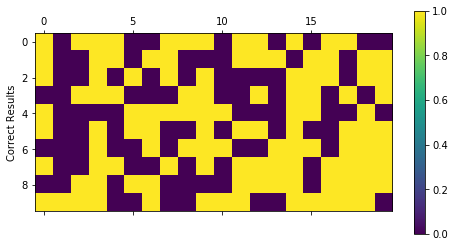

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


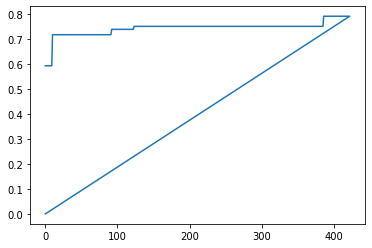

|  423      | -0.5      |  1.386    |  70.97    |  2.923    |  2.509    |  0.009252 |  0.7772   |  0.09937  |  1.555e+0 |  1.485    |  0.7486   |  67.45    |  0.5105   |  0.7042   |  2.071    |  0.5283   |  3.556    |  3.203    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


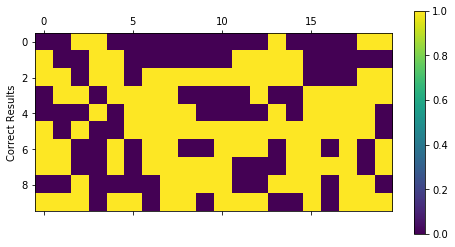

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.7928)


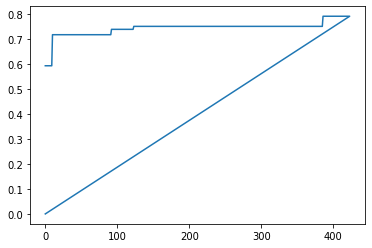

|  424      | -0.5      |  0.2529   |  144.3    |  1.255    |  0.9902   |  0.03264  |  1.887    |  0.3007   |  1.469e+0 |  3.833    |  0.7455   |  172.7    |  0.2678   |  0.1199   |  1.665    |  0.1597   |  3.872    |  2.806    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

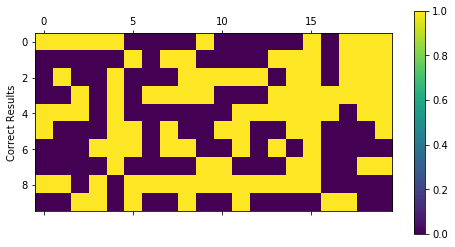

Final percentage:  tensor(0.5187)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


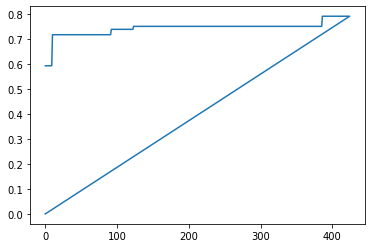

|  425      | -0.5187   |  0.6182   |  170.0    |  1.871    |  1.764    |  0.08488  |  1.17     |  0.3976   |  1.836e+0 |  3.386    |  0.883    |  242.9    |  0.9164   |  0.4453   |  2.467    |  0.5999   |  3.207    |  4.378    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

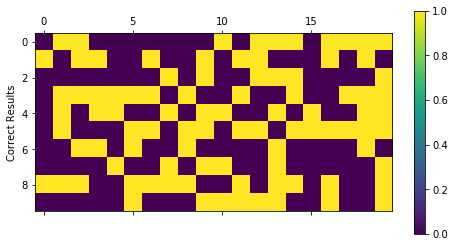

Final percentage:  tensor(0.4835)
Last epoch:  31


Best Score So Far:  tensor(-0.7928)


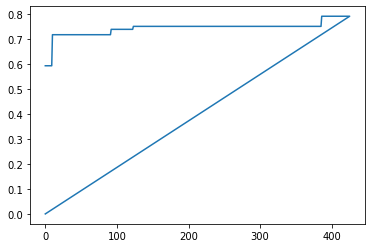

|  426      | -0.4835   |  1.813    |  223.6    |  2.402    |  0.7811   |  0.05011  |  0.4332   |  0.08202  |  1.578e+0 |  2.434    |  0.2228   |  115.5    |  0.1391   |  0.4705   |  2.931    |  0.823    |  1.013    |  1.824    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

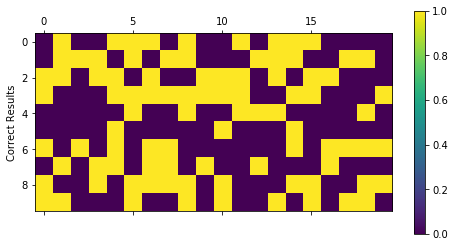

Final percentage:  tensor(0.5175)
Last epoch:  22


Best Score So Far:  tensor(-0.7928)


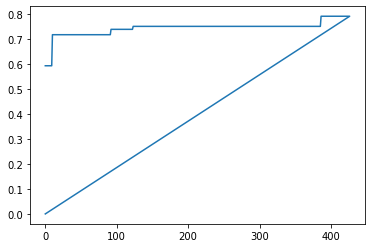

|  427      | -0.5175   |  0.0509   |  80.34    |  2.951    |  1.377    |  0.04097  |  0.8124   |  0.6599   |  1.582e+0 |  1.357    |  0.4003   |  39.19    |  0.6657   |  0.1101   |  1.173    |  0.7027   |  2.23     |  9.955    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

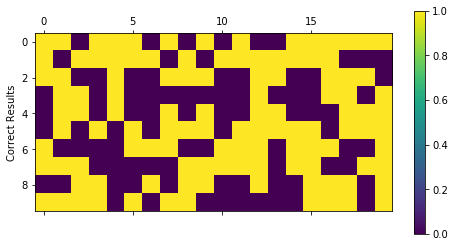

Final percentage:  tensor(0.5000)
Last epoch:  34


Best Score So Far:  tensor(-0.7928)


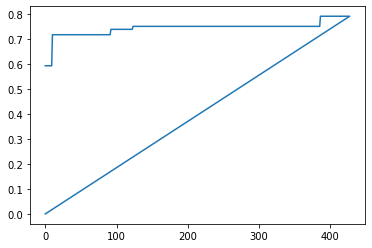

|  428      | -0.5      |  1.063    |  199.9    |  2.729    |  2.388    |  0.02141  |  1.354    |  0.0037   |  1.796e+0 |  1.645    |  0.8881   |  241.8    |  0.5849   |  0.1444   |  2.4      |  0.417    |  2.396    |  3.742    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

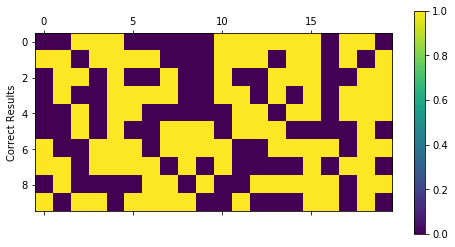

Final percentage:  tensor(0.5426)
Last epoch:  76


Best Score So Far:  tensor(-0.7928)


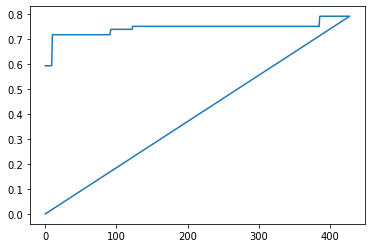

|  429      | -0.5426   |  1.73     |  121.2    |  2.604    |  2.412    |  0.0557   |  0.7684   |  0.5497   |  1.681e+0 |  1.544    |  0.6877   |  43.95    |  0.3245   |  0.7832   |  2.138    |  0.2563   |  3.763    |  6.939    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

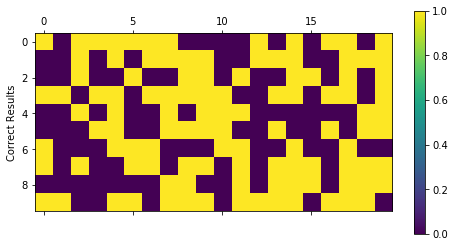

Final percentage:  tensor(0.4909)
Last epoch:  102


Best Score So Far:  tensor(-0.7928)


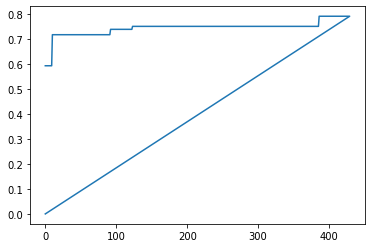

|  430      | -0.4909   |  1.103    |  254.3    |  2.683    |  2.025    |  0.008173 |  0.7252   |  0.4017   |  1.618e+0 |  2.913    |  0.6526   |  233.2    |  0.5681   |  0.8822   |  1.225    |  0.4652   |  1.304    |  7.675    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

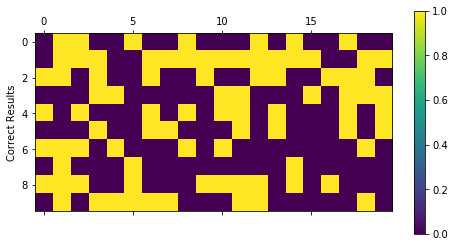

Final percentage:  tensor(0.4942)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


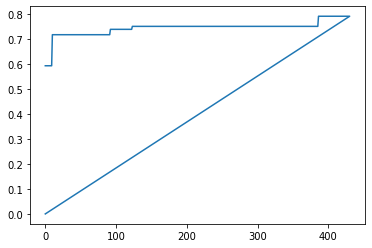

|  431      | -0.4942   |  1.606    |  134.9    |  1.861    |  0.2003   |  0.05646  |  0.5071   |  0.06587  |  1.734e+0 |  3.223    |  0.334    |  48.86    |  0.5129   |  0.08411  |  2.549    |  0.4755   |  3.873    |  1.98     |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

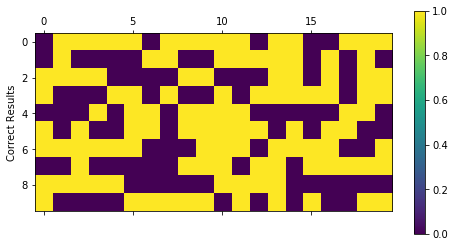

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


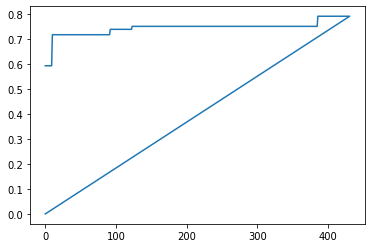

|  432      | -0.5      |  1.389    |  206.1    |  2.446    |  1.38     |  0.05461  |  1.224    |  0.04728  |  1.996e+0 |  1.762    |  0.5791   |  34.11    |  0.1685   |  0.442    |  1.574    |  0.5037   |  1.306    |  4.769    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

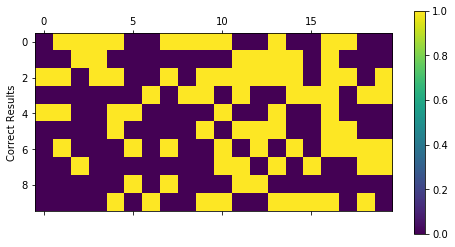

Final percentage:  tensor(0.4485)
Last epoch:  76


Best Score So Far:  tensor(-0.7928)


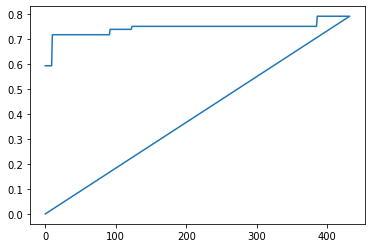

|  433      | -0.4485   |  0.5345   |  149.8    |  1.342    |  2.877    |  0.05442  |  1.397    |  0.7459   |  1.345e+0 |  2.542    |  0.7079   |  19.63    |  0.7527   |  0.1057   |  1.774    |  0.6963   |  1.179    |  6.978    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

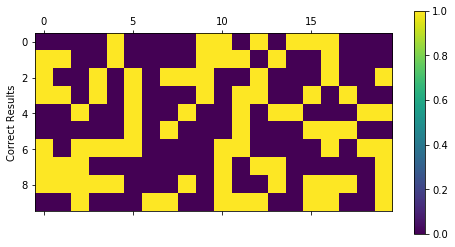

Final percentage:  tensor(0.4942)
Last epoch:  33


Best Score So Far:  tensor(-0.7928)


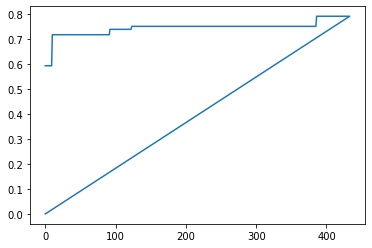

|  434      | -0.4942   |  1.934    |  65.35    |  1.516    |  0.2608   |  0.009302 |  0.6257   |  0.666    |  1.512e+0 |  2.153    |  0.1643   |  249.9    |  0.741    |  0.3061   |  2.835    |  0.5857   |  1.793    |  5.329    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

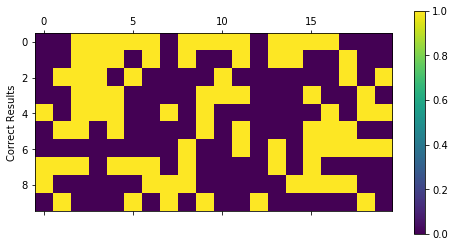

Final percentage:  tensor(0.4285)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


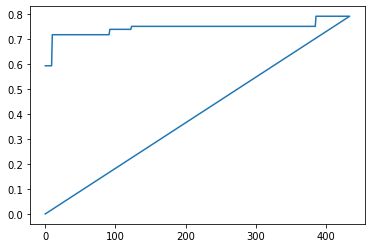

|  435      | -0.4285   |  0.8644   |  78.84    |  2.307    |  2.369    |  0.03533  |  0.8714   |  0.7704   |  1.26e+03 |  3.151    |  0.766    |  190.4    |  0.2171   |  0.3918   |  2.211    |  0.591    |  3.846    |  4.222    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

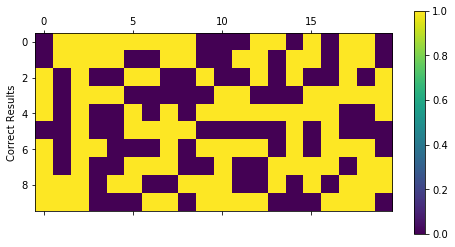

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


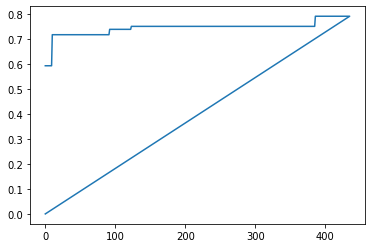

|  436      | -0.5      |  1.058    |  103.2    |  2.223    |  1.39     |  0.09555  |  1.41     |  0.3991   |  1.493e+0 |  1.743    |  0.1939   |  99.5     |  0.2699   |  0.2685   |  1.428    |  0.4303   |  1.71     |  4.857    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

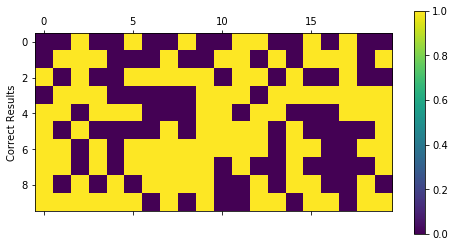

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


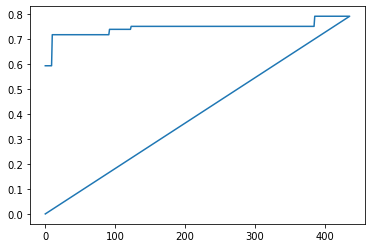

|  437      | -0.5      |  1.469    |  50.34    |  2.951    |  0.7503   |  0.009193 |  1.318    |  0.09931  |  1.459e+0 |  2.659    |  0.821    |  215.6    |  0.4765   |  0.7925   |  2.619    |  0.1944   |  3.011    |  7.466    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

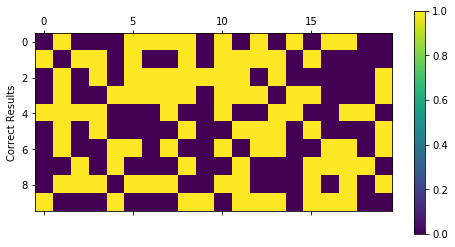

Final percentage:  tensor(0.5328)
Last epoch:  25


Best Score So Far:  tensor(-0.7928)


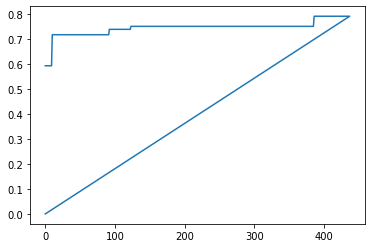

|  438      | -0.5328   |  1.299    |  105.0    |  1.087    |  1.133    |  0.003316 |  0.486    |  0.6742   |  1.475e+0 |  1.585    |  0.8401   |  46.66    |  0.7098   |  0.2269   |  1.25     |  0.4231   |  1.918    |  6.001    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

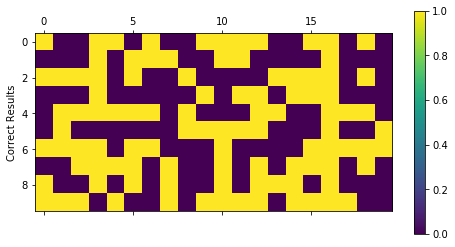

Final percentage:  tensor(0.5415)
Last epoch:  31


Best Score So Far:  tensor(-0.7928)


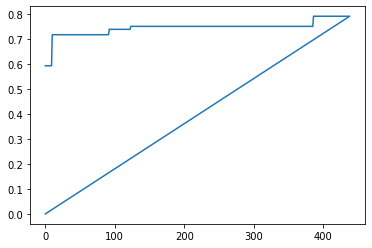

|  439      | -0.5415   |  0.01133  |  104.1    |  1.646    |  0.6245   |  0.07647  |  0.4293   |  0.2938   |  1.061e+0 |  3.389    |  0.772    |  250.7    |  0.9497   |  0.4384   |  1.59     |  0.6935   |  3.167    |  8.807    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


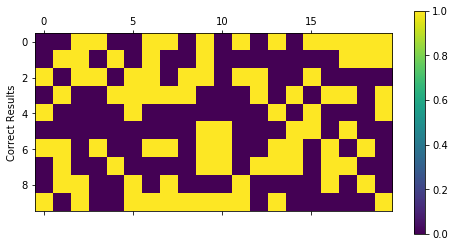

Final percentage:  tensor(0.4389)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


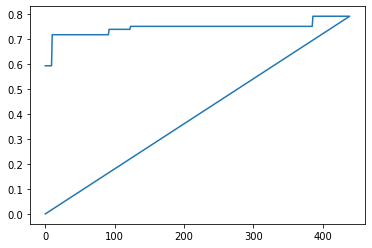

|  440      | -0.4389   |  0.4106   |  103.3    |  2.57     |  0.6658   |  0.04822  |  1.554    |  0.4837   |  1.199e+0 |  2.472    |  0.8822   |  50.75    |  0.2432   |  0.3739   |  2.582    |  0.8591   |  3.299    |  4.8      |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

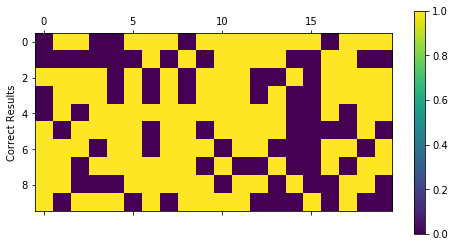

Final percentage:  tensor(0.5783)
Last epoch:  35


Best Score So Far:  tensor(-0.7928)


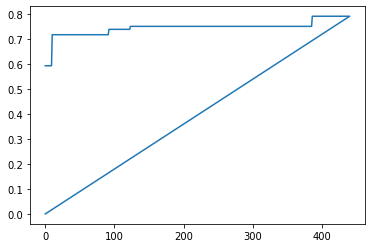

|  441      | -0.5783   |  0.5226   |  152.1    |  2.107    |  0.9658   |  0.02448  |  1.252    |  0.2892   |  1.447e+0 |  2.267    |  0.5445   |  19.05    |  0.4649   |  0.8427   |  1.295    |  0.8807   |  1.594    |  5.341    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

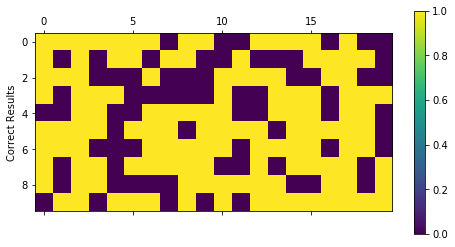

Final percentage:  tensor(0.6486)
Last epoch:  23


Best Score So Far:  tensor(-0.7928)


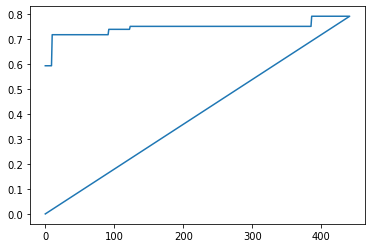

|  442      | -0.6486   |  0.977    |  61.64    |  2.187    |  2.503    |  0.02428  |  1.006    |  0.3747   |  1.805e+0 |  2.452    |  0.0432   |  77.92    |  0.7212   |  0.4867   |  2.419    |  0.8895   |  1.11     |  2.453    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

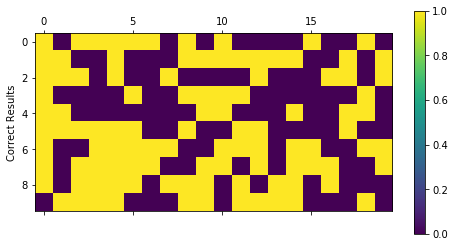

Final percentage:  tensor(0.5190)
Last epoch:  46


Best Score So Far:  tensor(-0.7928)


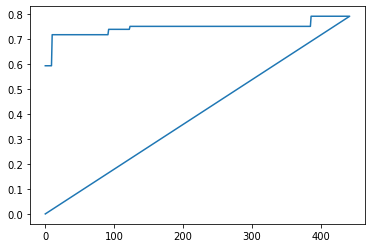

|  443      | -0.519    |  0.4103   |  141.2    |  2.368    |  1.024    |  0.08698  |  1.75     |  0.1521   |  1.532e+0 |  3.959    |  0.05182  |  23.19    |  0.4178   |  0.7692   |  1.793    |  0.009939 |  2.93     |  3.641    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

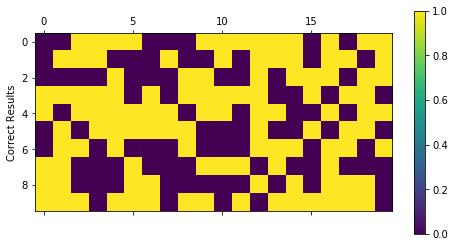

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


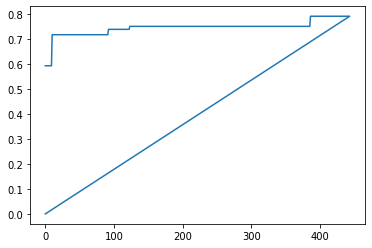

|  444      | -0.5      |  0.2984   |  29.38    |  2.729    |  0.009763 |  0.05186  |  1.096    |  0.09276  |  1.2e+03  |  3.578    |  0.1053   |  211.5    |  0.1937   |  0.896    |  1.938    |  0.5467   |  1.246    |  1.461    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

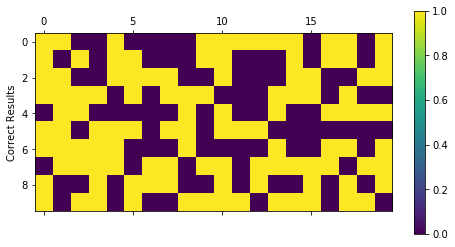

Final percentage:  tensor(0.4941)
Last epoch:  39


Best Score So Far:  tensor(-0.7928)


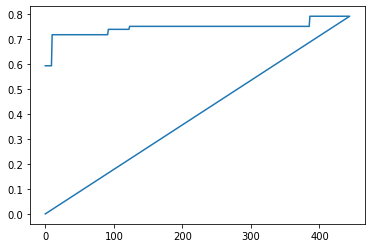

|  445      | -0.4941   |  0.4128   |  42.84    |  1.898    |  1.884    |  0.07263  |  0.9075   |  0.3015   |  1.064e+0 |  2.61     |  0.4059   |  104.2    |  0.07469  |  0.1744   |  2.211    |  0.9142   |  2.888    |  6.193    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

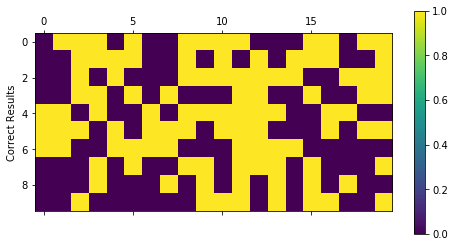

Final percentage:  tensor(0.5674)
Last epoch:  43


Best Score So Far:  tensor(-0.7928)


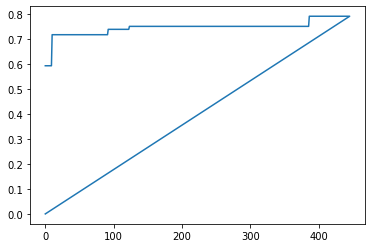

|  446      | -0.5674   |  0.6813   |  36.41    |  2.012    |  1.932    |  0.09675  |  1.516    |  0.1464   |  1.24e+03 |  3.861    |  0.6822   |  51.0     |  0.7015   |  0.7501   |  1.868    |  0.009467 |  2.998    |  1.627    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

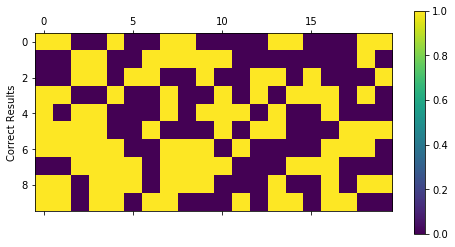

Final percentage:  tensor(0.5202)
Last epoch:  36


Best Score So Far:  tensor(-0.7928)


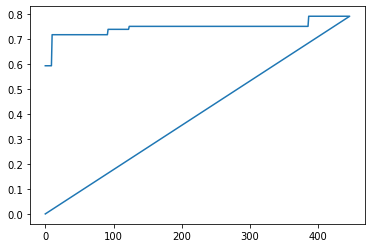

|  447      | -0.5202   |  0.4732   |  26.65    |  2.732    |  2.494    |  0.02352  |  1.501    |  0.4067   |  1.421e+0 |  1.654    |  0.1995   |  25.06    |  0.2493   |  0.5307   |  2.756    |  0.1549   |  1.783    |  6.696    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

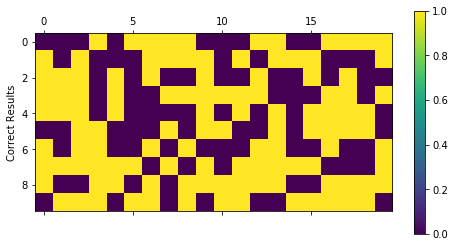

Final percentage:  tensor(0.5058)
Last epoch:  22


Best Score So Far:  tensor(-0.7928)


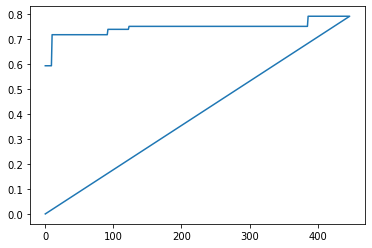

|  448      | -0.5058   |  0.2014   |  132.9    |  1.889    |  0.1508   |  0.07658  |  0.1894   |  0.2707   |  1.579e+0 |  3.544    |  0.2348   |  207.8    |  0.4368   |  0.7449   |  2.834    |  0.4378   |  1.784    |  5.148    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

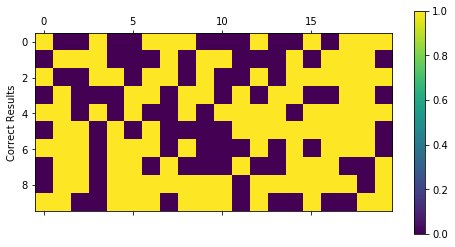

Final percentage:  tensor(0.6033)
Last epoch:  141


Best Score So Far:  tensor(-0.7928)


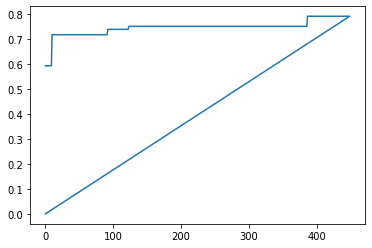

|  449      | -0.6033   |  0.1887   |  169.3    |  2.258    |  1.485    |  0.04702  |  0.2557   |  0.2675   |  1.269e+0 |  2.602    |  0.3778   |  214.4    |  0.7008   |  0.4463   |  2.193    |  0.3963   |  1.65     |  7.673    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

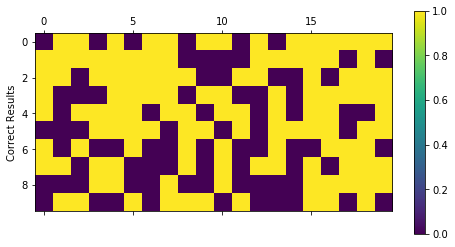

Final percentage:  tensor(0.5450)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


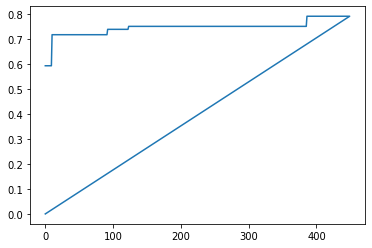

|  450      | -0.545    |  1.836    |  68.37    |  2.258    |  2.122    |  0.07371  |  0.5377   |  0.08187  |  1.719e+0 |  2.325    |  0.6144   |  16.84    |  0.654    |  0.2595   |  2.747    |  0.1651   |  2.332    |  9.713    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

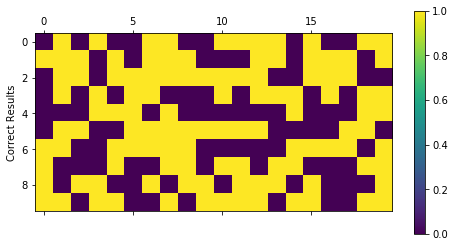

Final percentage:  tensor(0.5000)
Last epoch:  28


Best Score So Far:  tensor(-0.7928)


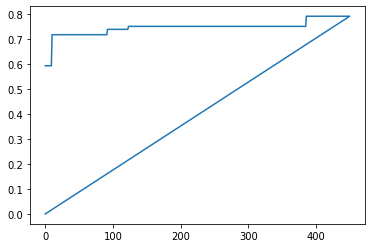

|  451      | -0.5      |  0.1714   |  103.7    |  1.568    |  0.2472   |  0.07098  |  1.119    |  0.7904   |  1.228e+0 |  1.313    |  0.4229   |  186.2    |  0.2037   |  0.1741   |  1.033    |  0.6128   |  2.754    |  5.137    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

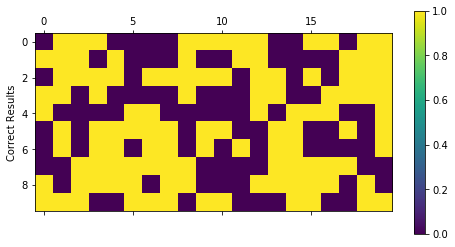

Final percentage:  tensor(0.5000)
Last epoch:  372


Best Score So Far:  tensor(-0.7928)


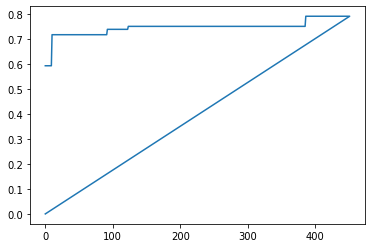

|  452      | -0.5      |  1.405    |  17.07    |  2.323    |  0.5637   |  0.01342  |  1.781    |  0.5509   |  1.635e+0 |  1.187    |  0.09034  |  108.2    |  0.7756   |  0.008335 |  1.925    |  0.2      |  3.672    |  6.379    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

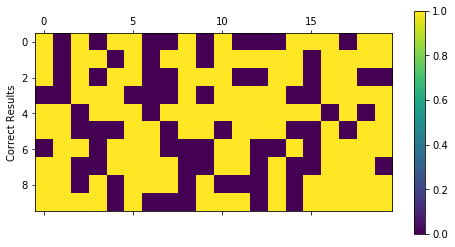

Final percentage:  tensor(0.6514)
Last epoch:  97


Best Score So Far:  tensor(-0.7928)


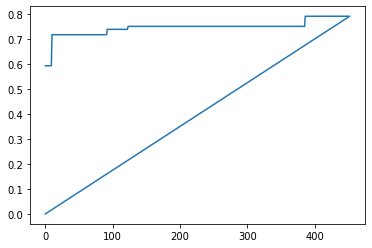

|  453      | -0.6514   |  1.368    |  207.1    |  2.17     |  2.534    |  0.04705  |  0.347    |  0.5132   |  1.976e+0 |  2.047    |  0.7224   |  174.0    |  0.5204   |  0.13     |  2.669    |  0.4257   |  3.341    |  6.319    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

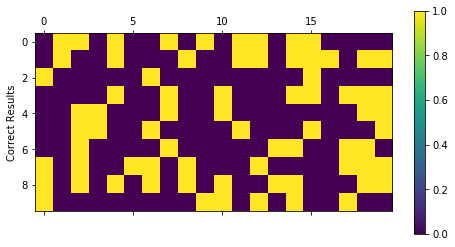

Final percentage:  tensor(0.3716)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


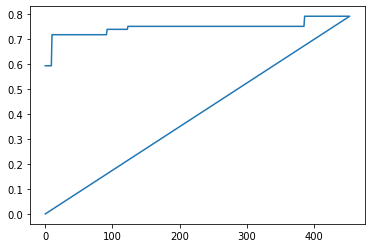

|  454      | -0.3716   |  0.4986   |  46.08    |  2.469    |  0.3352   |  0.02176  |  1.722    |  0.7237   |  1.094e+0 |  1.044    |  0.2736   |  34.59    |  0.2575   |  0.4521   |  2.117    |  0.9796   |  2.284    |  7.107    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

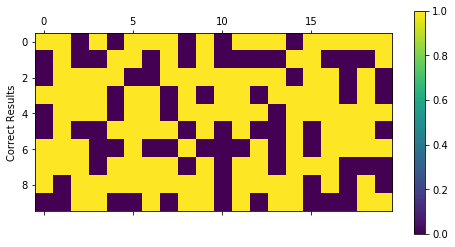

Final percentage:  tensor(0.6184)
Last epoch:  27


Best Score So Far:  tensor(-0.7928)


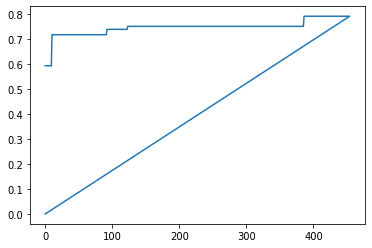

|  455      | -0.6184   |  1.77     |  40.58    |  1.185    |  0.8873   |  0.01297  |  0.3204   |  0.2749   |  1.311e+0 |  3.279    |  0.854    |  149.5    |  0.9825   |  0.8566   |  1.513    |  0.3011   |  3.517    |  6.258    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizat

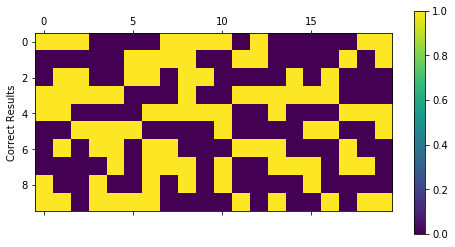

Final percentage:  tensor(0.4607)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


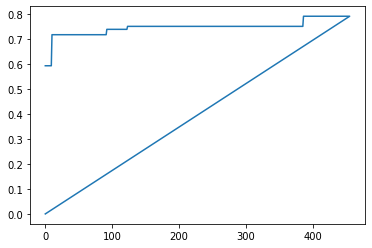

|  456      | -0.4607   |  0.3484   |  15.24    |  2.085    |  0.4424   |  0.07724  |  1.201    |  0.2036   |  1.01e+03 |  1.875    |  0.5525   |  51.04    |  0.2915   |  0.8844   |  2.552    |  0.2302   |  1.818    |  7.166    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

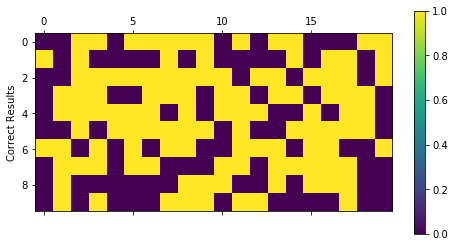

Final percentage:  tensor(0.5000)
Last epoch:  27


Best Score So Far:  tensor(-0.7928)


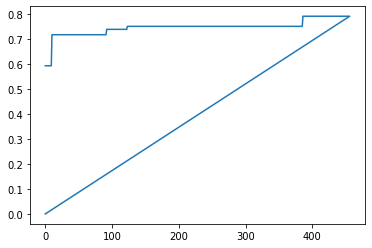

|  457      | -0.5      |  1.936    |  95.43    |  1.047    |  2.426    |  0.04596  |  1.16     |  0.4412   |  1.631e+0 |  3.156    |  0.3359   |  221.1    |  0.04585  |  0.5694   |  1.656    |  0.5367   |  1.751    |  3.698    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

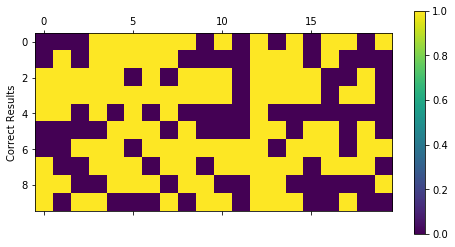

Final percentage:  tensor(0.6345)
Last epoch:  28


Best Score So Far:  tensor(-0.7928)


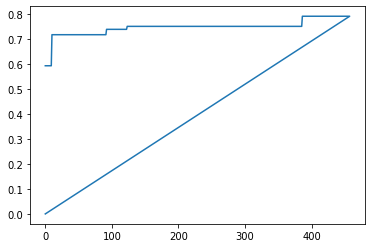

|  458      | -0.6345   |  1.363    |  80.4     |  1.966    |  2.163    |  0.09393  |  0.3756   |  0.424    |  1.742e+0 |  2.598    |  0.7067   |  191.3    |  0.7681   |  0.6944   |  2.759    |  0.4539   |  2.375    |  2.319    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

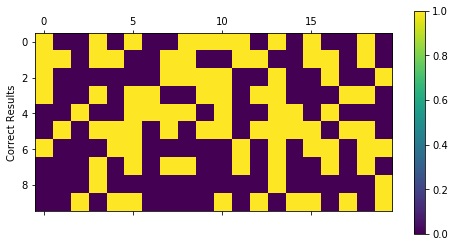

Final percentage:  tensor(0.4519)
Last epoch:  58


Best Score So Far:  tensor(-0.7928)


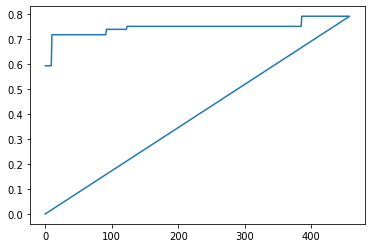

|  459      | -0.4519   |  0.4689   |  70.5     |  2.468    |  0.4695   |  0.07232  |  1.186    |  0.7442   |  1.725e+0 |  3.09     |  0.06838  |  130.7    |  0.7624   |  0.2626   |  1.992    |  0.3015   |  2.346    |  3.191    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

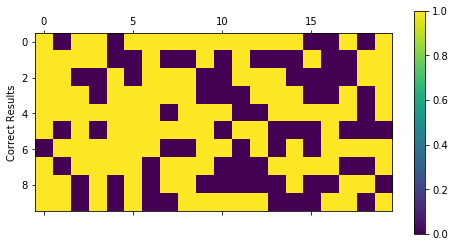

Final percentage:  tensor(0.6253)
Last epoch:  36


Best Score So Far:  tensor(-0.7928)


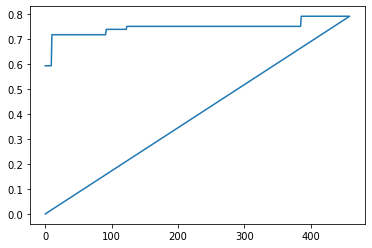

|  460      | -0.6253   |  1.126    |  243.2    |  1.434    |  1.311    |  0.07689  |  0.2805   |  0.7305   |  1.394e+0 |  1.972    |  0.5191   |  65.01    |  0.8113   |  0.7946   |  2.66     |  0.3509   |  1.437    |  6.437    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

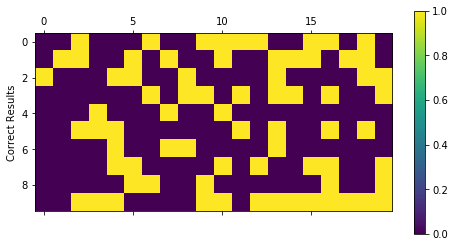

Final percentage:  tensor(0.3459)
Last epoch:  67


Best Score So Far:  tensor(-0.7928)


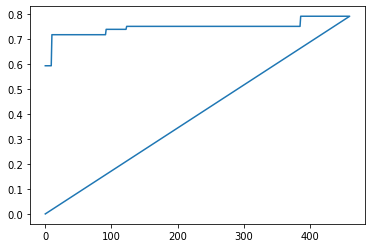

|  461      | -0.3459   |  1.983    |  206.1    |  2.476    |  1.156    |  0.04062  |  0.5863   |  0.2394   |  1.653e+0 |  1.127    |  0.5409   |  117.6    |  0.3843   |  0.6489   |  1.181    |  0.2487   |  1.48     |  7.046    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

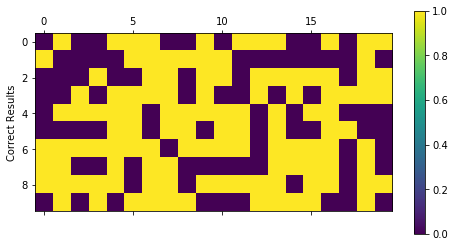

Final percentage:  tensor(0.5761)
Last epoch:  25


Best Score So Far:  tensor(-0.7928)


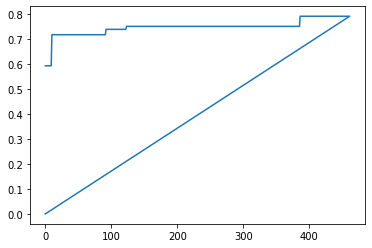

|  462      | -0.5761   |  0.3938   |  122.4    |  2.895    |  2.364    |  0.06679  |  1.705    |  0.2312   |  1.778e+0 |  1.057    |  0.7862   |  64.92    |  0.1238   |  0.1137   |  2.17     |  0.891    |  1.276    |  5.347    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

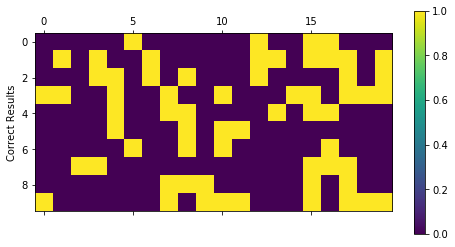

Final percentage:  tensor(0.3506)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


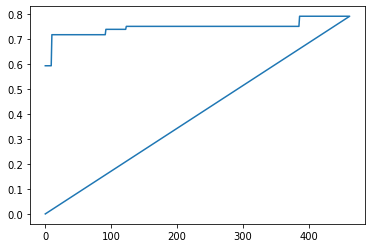

|  463      | -0.3506   |  1.762    |  245.1    |  2.972    |  1.082    |  0.05853  |  0.766    |  0.1087   |  1.762e+0 |  1.66     |  0.6271   |  207.6    |  0.273    |  0.4576   |  1.84     |  0.05461  |  3.217    |  8.27     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

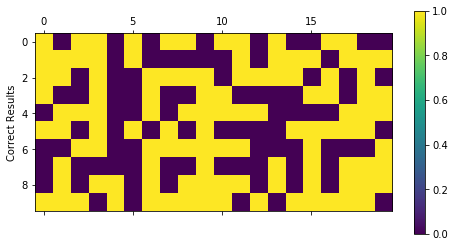

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7928)


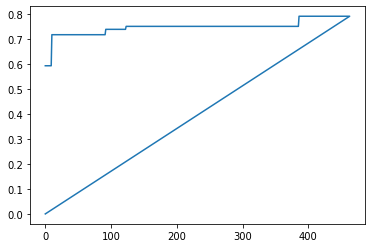

|  464      | -0.5      |  1.071    |  194.9    |  1.082    |  0.545    |  0.05671  |  1.236    |  0.6256   |  1.601e+0 |  2.675    |  0.6027   |  49.09    |  0.1488   |  0.2101   |  2.764    |  0.6262   |  2.965    |  3.755    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

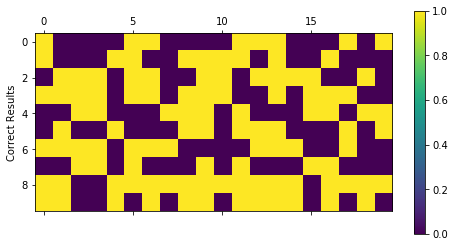

Final percentage:  tensor(0.5537)
Last epoch:  140


Best Score So Far:  tensor(-0.7928)


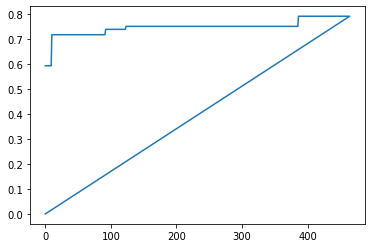

|  465      | -0.5537   |  0.5155   |  153.7    |  1.428    |  2.797    |  0.08037  |  0.1545   |  0.1399   |  1.487e+0 |  1.805    |  0.2612   |  246.2    |  0.3424   |  0.7523   |  1.686    |  0.7207   |  1.55     |  7.167    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

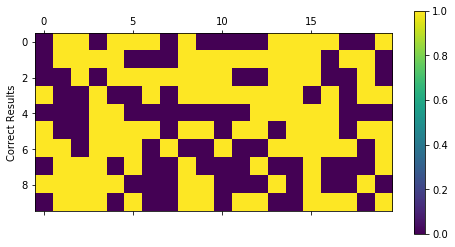

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


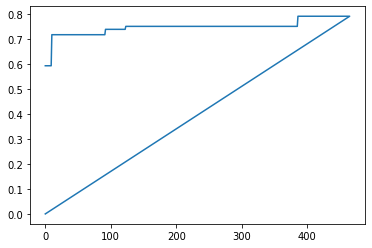

|  466      | -0.5      |  1.143    |  186.9    |  1.869    |  2.837    |  0.09899  |  0.753    |  0.6047   |  1.934e+0 |  3.43     |  0.4047   |  2.5      |  0.9459   |  0.3145   |  1.074    |  0.2442   |  3.879    |  5.169    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

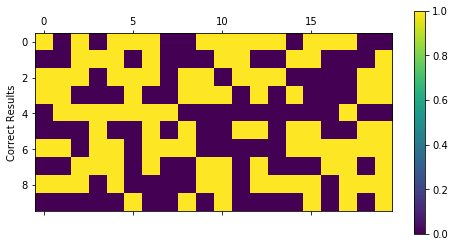

Final percentage:  tensor(0.5247)
Last epoch:  76


Best Score So Far:  tensor(-0.7928)


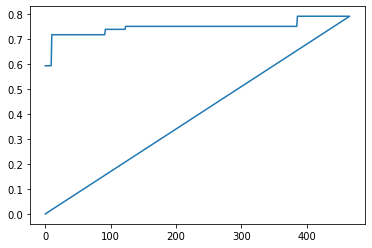

|  467      | -0.5247   |  0.2472   |  171.5    |  1.028    |  2.389    |  0.05349  |  1.692    |  0.1834   |  1.09e+03 |  3.071    |  0.7335   |  162.4    |  0.7723   |  0.568    |  2.772    |  0.9918   |  1.52     |  5.939    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

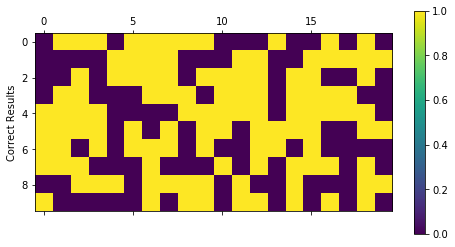

Final percentage:  tensor(0.5000)
Last epoch:  22


Best Score So Far:  tensor(-0.7928)


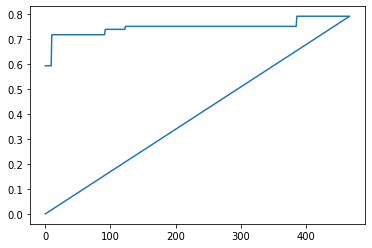

|  468      | -0.5      |  0.2388   |  196.9    |  1.454    |  0.3317   |  0.09688  |  0.8906   |  0.664    |  1.026e+0 |  1.271    |  0.7337   |  233.0    |  0.0691   |  0.5852   |  2.101    |  0.2063   |  2.27     |  5.249    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

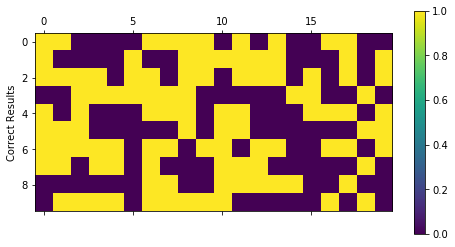

Final percentage:  tensor(0.5362)
Last epoch:  23


Best Score So Far:  tensor(-0.7928)


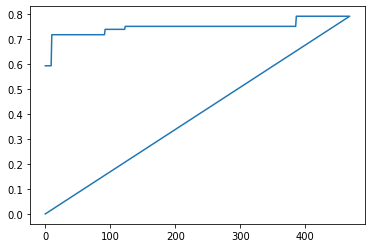

|  469      | -0.5362   |  0.02285  |  140.4    |  2.557    |  2.734    |  0.004604 |  1.576    |  0.3515   |  1.705e+0 |  2.822    |  0.8227   |  174.6    |  0.2052   |  0.8907   |  2.609    |  0.0511   |  3.961    |  1.759    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

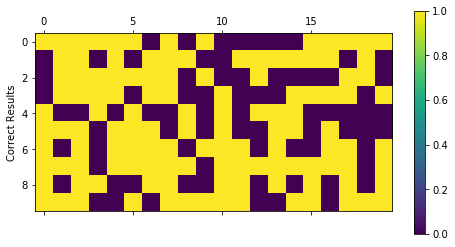

Final percentage:  tensor(0.5523)
Last epoch:  33


Best Score So Far:  tensor(-0.7928)


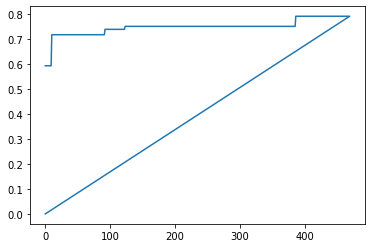

|  470      | -0.5523   |  0.8278   |  227.6    |  2.517    |  2.012    |  0.05337  |  0.6905   |  0.72     |  1.819e+0 |  3.828    |  0.3596   |  61.34    |  0.7228   |  0.6202   |  2.081    |  0.5366   |  3.421    |  8.188    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

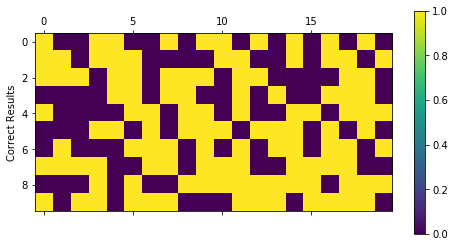

Final percentage:  tensor(0.5000)
Last epoch:  23


Best Score So Far:  tensor(-0.7928)


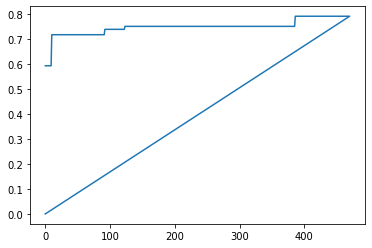

|  471      | -0.5      |  1.687    |  50.35    |  1.399    |  2.313    |  0.05655  |  0.5351   |  0.3835   |  1.675e+0 |  3.046    |  0.7393   |  94.62    |  0.6724   |  0.4978   |  1.809    |  0.3976   |  2.833    |  1.552    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

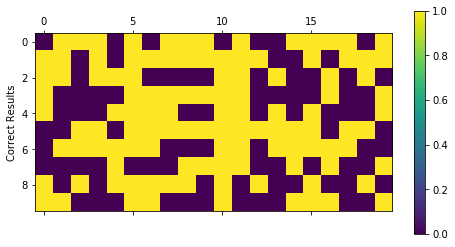

Final percentage:  tensor(0.5000)
Last epoch:  32


Best Score So Far:  tensor(-0.7928)


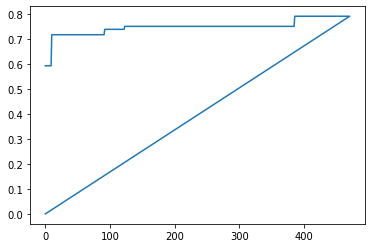

|  472      | -0.5      |  1.521    |  61.35    |  1.33     |  1.266    |  0.04684  |  0.5461   |  0.2481   |  1.673e+0 |  1.09     |  0.5897   |  134.4    |  0.4788   |  0.6484   |  2.37     |  0.06475  |  3.393    |  1.352    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

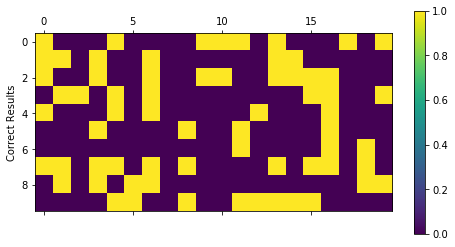

Final percentage:  tensor(0.3609)
Last epoch:  28


Best Score So Far:  tensor(-0.7928)


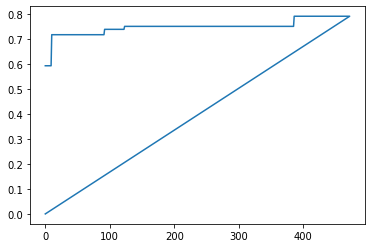

|  473      | -0.3609   |  0.05376  |  135.6    |  2.462    |  1.512    |  0.02937  |  0.3705   |  0.5302   |  1.942e+0 |  1.475    |  0.2483   |  253.7    |  0.8331   |  0.6751   |  1.084    |  0.02699  |  2.457    |  1.289    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

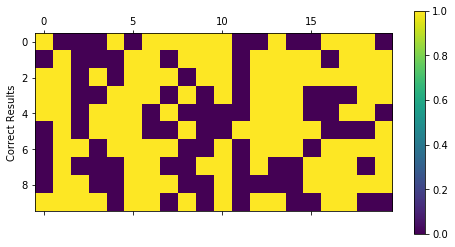

Final percentage:  tensor(0.6249)
Last epoch:  44


Best Score So Far:  tensor(-0.7928)


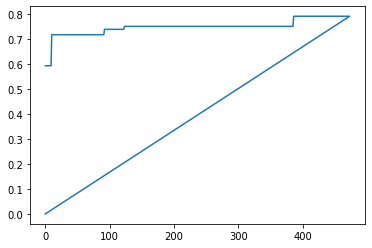

|  474      | -0.6249   |  0.202    |  145.1    |  1.851    |  2.365    |  0.0274   |  0.5422   |  0.3247   |  1.673e+0 |  3.935    |  0.3577   |  191.1    |  0.856    |  0.6075   |  2.551    |  0.8111   |  2.785    |  4.947    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

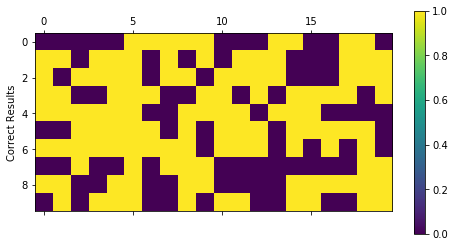

Final percentage:  tensor(0.5635)
Last epoch:  26


Best Score So Far:  tensor(-0.7928)


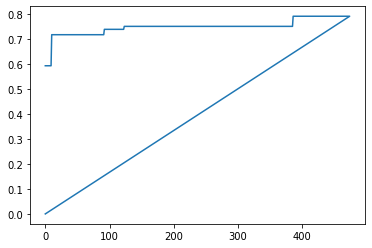

|  475      | -0.5635   |  0.3358   |  200.5    |  1.386    |  2.986    |  0.05426  |  0.01864  |  0.335    |  1.241e+0 |  1.159    |  0.6445   |  82.39    |  0.8204   |  0.688    |  1.131    |  0.712    |  1.583    |  7.981    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimization

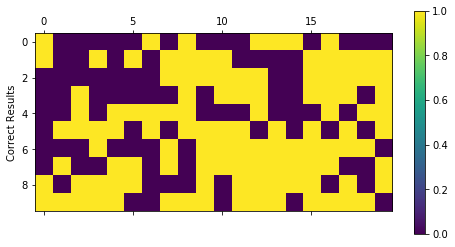

Final percentage:  tensor(0.6229)
Last epoch:  41


Best Score So Far:  tensor(-0.7928)


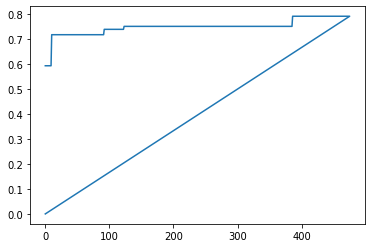

|  476      | -0.6229   |  0.4984   |  104.6    |  2.758    |  1.964    |  0.00815  |  0.2677   |  0.006146 |  1.982e+0 |  1.143    |  0.09485  |  118.2    |  0.05529  |  0.2602   |  2.349    |  0.04858  |  2.369    |  6.149    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

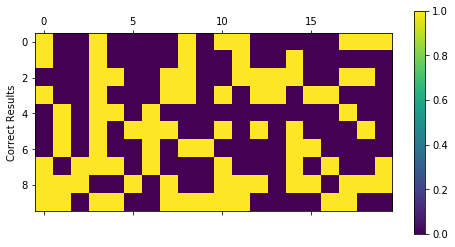

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


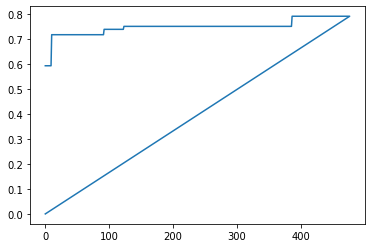

|  477      | -0.5      |  0.3965   |  49.29    |  1.204    |  0.2057   |  0.0169   |  0.121    |  0.4413   |  1.808e+0 |  3.405    |  0.5681   |  139.6    |  0.4672   |  0.8641   |  1.577    |  0.3661   |  2.72     |  5.608    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

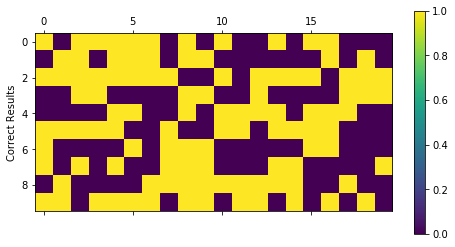

Final percentage:  tensor(0.5392)
Last epoch:  126


Best Score So Far:  tensor(-0.7928)


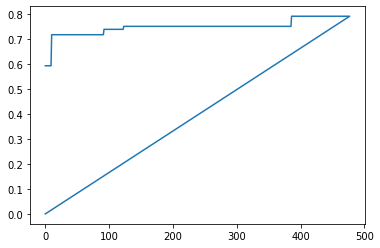

|  478      | -0.5392   |  1.342    |  198.8    |  1.363    |  1.88     |  0.0694   |  0.5419   |  0.7425   |  1.345e+0 |  2.908    |  0.8332   |  251.1    |  0.2492   |  0.8478   |  2.809    |  0.2507   |  1.302    |  4.258    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

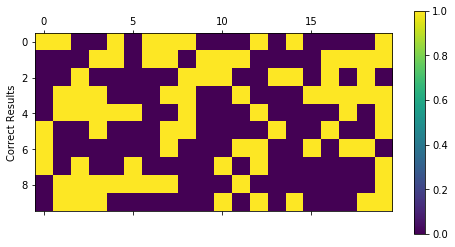

Final percentage:  tensor(0.4942)
Last epoch:  24


Best Score So Far:  tensor(-0.7928)


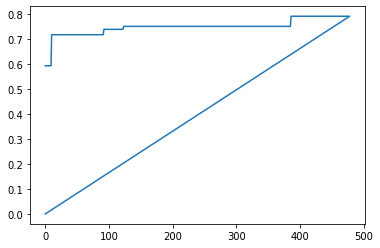

|  479      | -0.4942   |  1.838    |  216.7    |  1.514    |  0.8241   |  0.02983  |  0.162    |  0.1347   |  1.614e+0 |  2.472    |  0.3707   |  133.0    |  0.8866   |  0.8596   |  1.509    |  0.2334   |  1.21     |  3.335    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

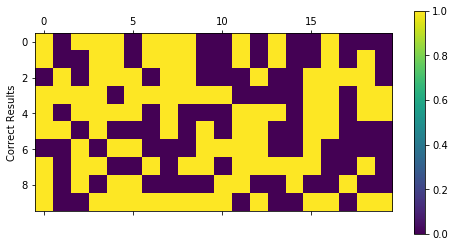

Final percentage:  tensor(0.5438)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


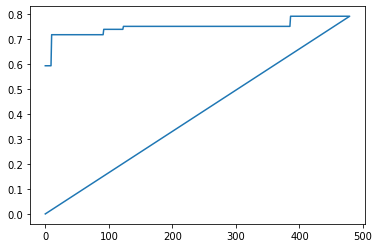

|  480      | -0.5438   |  0.3467   |  9.001    |  1.347    |  2.334    |  0.09203  |  1.436    |  0.2387   |  1.631e+0 |  3.303    |  0.3983   |  159.3    |  0.5736   |  0.8125   |  2.497    |  0.2647   |  1.686    |  7.235    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

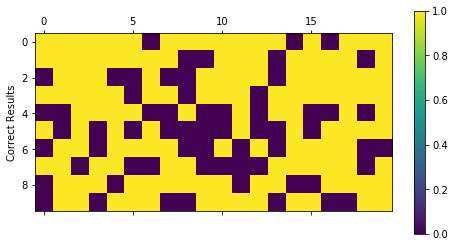

Final percentage:  tensor(0.6565)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


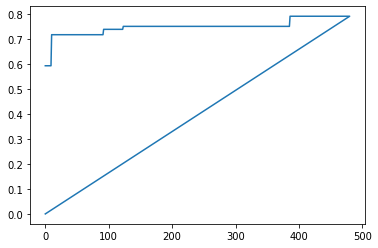

|  481      | -0.6565   |  0.4637   |  160.0    |  1.507    |  2.752    |  0.03026  |  1.689    |  0.1838   |  1.572e+0 |  1.565    |  0.378    |  97.56    |  0.03996  |  0.1152   |  2.5      |  0.4122   |  3.404    |  7.022    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

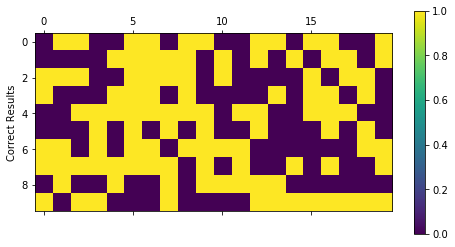

Final percentage:  tensor(0.5649)
Last epoch:  48


Best Score So Far:  tensor(-0.7928)


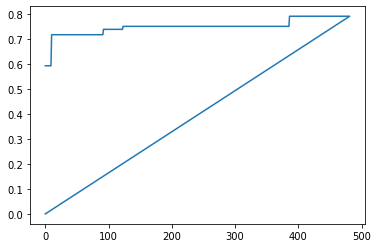

|  482      | -0.5649   |  0.7618   |  127.7    |  2.892    |  2.834    |  0.0485   |  1.418    |  0.5999   |  1.511e+0 |  2.337    |  0.6921   |  107.6    |  0.5001   |  0.07873  |  2.8      |  0.4543   |  2.791    |  1.634    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

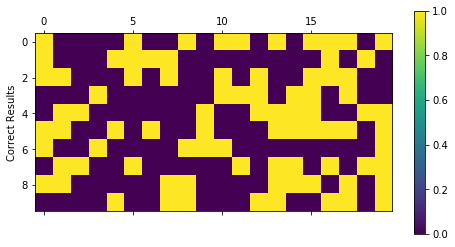

Final percentage:  tensor(0.4942)
Last epoch:  26


Best Score So Far:  tensor(-0.7928)


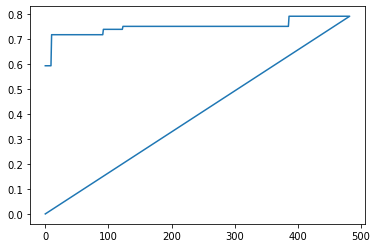

|  483      | -0.4942   |  1.054    |  58.21    |  1.767    |  1.674    |  0.0815   |  0.5231   |  0.5823   |  1.492e+0 |  1.91     |  0.2614   |  63.24    |  0.07402  |  0.523    |  2.244    |  0.235    |  2.687    |  8.845    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

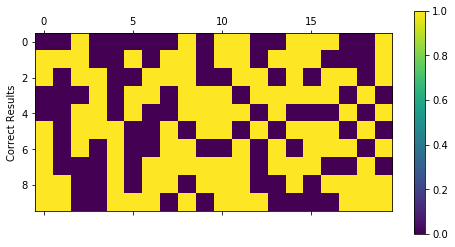

Final percentage:  tensor(0.5000)
Last epoch:  52


Best Score So Far:  tensor(-0.7928)


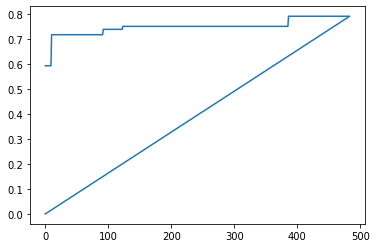

|  484      | -0.5      |  1.607    |  105.5    |  1.987    |  2.112    |  0.05779  |  1.502    |  0.7601   |  1.177e+0 |  3.36     |  0.3015   |  145.2    |  0.2075   |  0.6669   |  2.95     |  0.8325   |  2.855    |  5.424    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

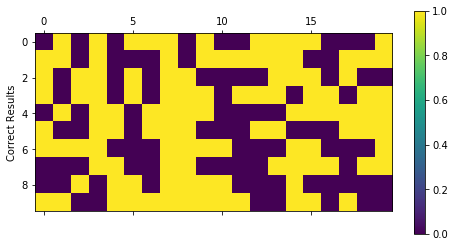

Final percentage:  tensor(0.5000)
Last epoch:  24


Best Score So Far:  tensor(-0.7928)


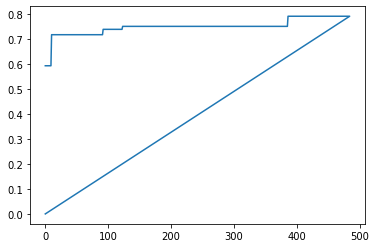

|  485      | -0.5      |  1.042    |  238.6    |  1.315    |  1.766    |  0.0638   |  1.807    |  0.2155   |  1.711e+0 |  2.047    |  0.328    |  22.68    |  0.3286   |  0.292    |  1.059    |  0.549    |  3.113    |  5.482    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

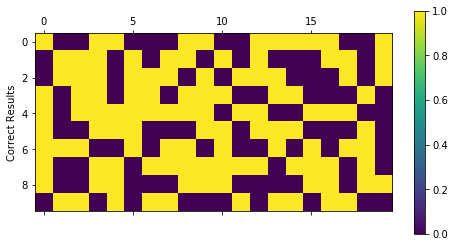

Final percentage:  tensor(0.5000)
Last epoch:  33


Best Score So Far:  tensor(-0.7928)


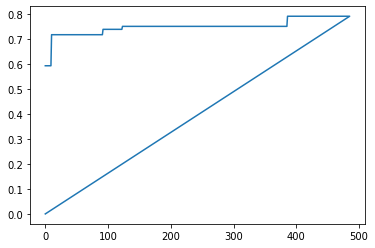

|  486      | -0.5      |  1.049    |  28.88    |  2.363    |  1.409    |  0.02293  |  1.703    |  0.4522   |  1.999e+0 |  1.231    |  0.4635   |  79.2     |  0.8609   |  0.1456   |  1.003    |  0.4425   |  3.025    |  9.701    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         :

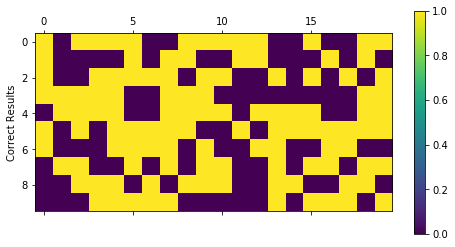

Final percentage:  tensor(0.5000)
Last epoch:  34


Best Score So Far:  tensor(-0.7928)


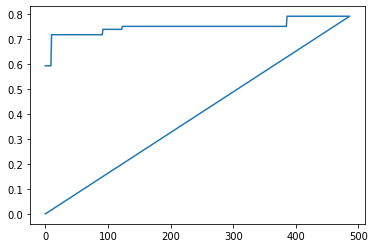

|  487      | -0.5      |  1.234    |  50.35    |  1.721    |  2.332    |  0.03297  |  0.3268   |  0.2281   |  1.04e+03 |  3.258    |  0.2568   |  196.2    |  0.8419   |  0.4095   |  2.708    |  0.9904   |  3.816    |  9.804    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

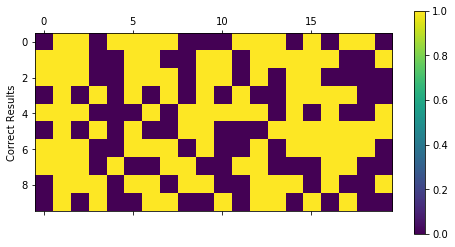

Final percentage:  tensor(0.5000)
Last epoch:  38


Best Score So Far:  tensor(-0.7928)


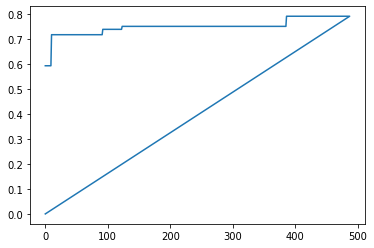

|  488      | -0.5      |  1.892    |  246.8    |  2.389    |  0.467    |  0.06468  |  1.972    |  0.1954   |  1.682e+0 |  1.386    |  0.8984   |  108.6    |  0.351    |  0.1859   |  2.692    |  0.6118   |  2.72     |  3.23     |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Op

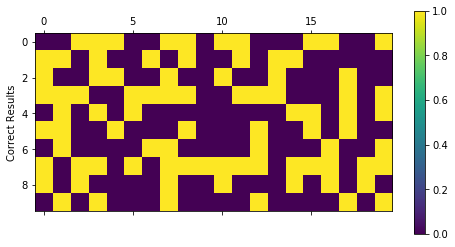

Final percentage:  tensor(0.4942)
Last epoch:  22


Best Score So Far:  tensor(-0.7928)


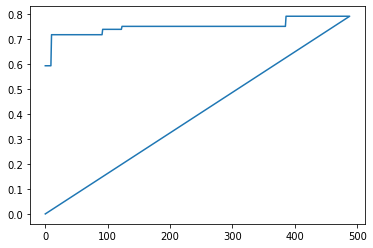

|  489      | -0.4942   |  0.2657   |  18.5     |  2.208    |  2.181    |  0.04249  |  0.197    |  0.07142  |  1.53e+03 |  2.005    |  0.5953   |  244.3    |  0.04989  |  0.1091   |  2.21     |  0.2959   |  3.149    |  5.358    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

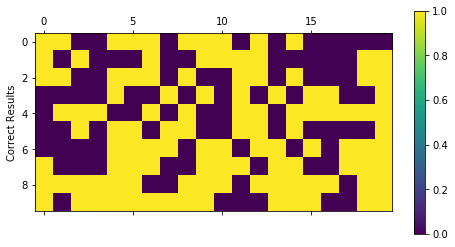

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


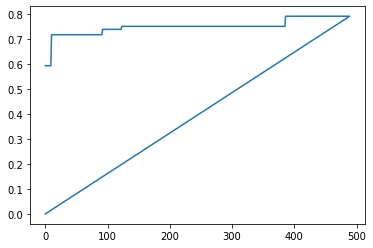

|  490      | -0.5      |  1.899    |  93.13    |  2.443    |  1.773    |  0.07017  |  0.5693   |  0.4403   |  1.007e+0 |  3.843    |  0.3944   |  92.46    |  0.1027   |  0.2136   |  1.591    |  0.4781   |  2.241    |  1.505    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         

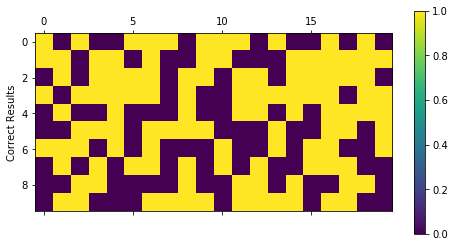

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


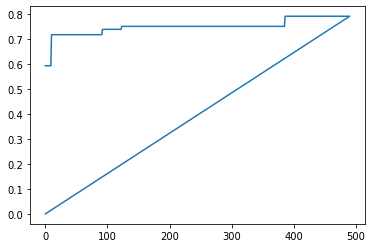

|  491      | -0.5      |  1.172    |  19.02    |  1.555    |  2.785    |  0.07017  |  1.361    |  0.285    |  1.596e+0 |  3.454    |  0.7011   |  192.7    |  0.5315   |  0.6707   |  1.433    |  0.518    |  3.43     |  3.49     |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
lo

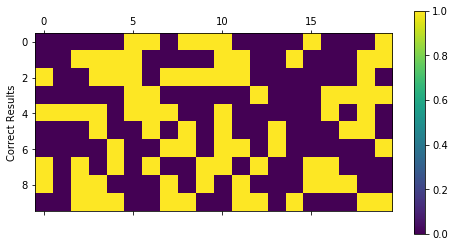

Final percentage:  tensor(0.4942)
Last epoch:  37


Best Score So Far:  tensor(-0.7928)


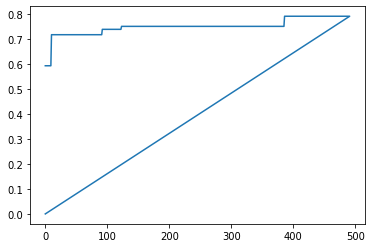

|  492      | -0.4942   |  1.002    |  167.7    |  1.162    |  0.4351   |  0.05935  |  0.8237   |  0.1049   |  1.809e+0 |  3.14     |  0.8782   |  12.17    |  0.8025   |  0.4424   |  1.388    |  0.142    |  1.595    |  1.066    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizatio

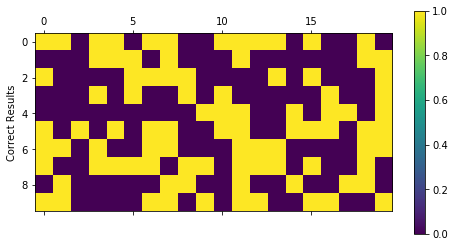

Final percentage:  tensor(0.4548)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


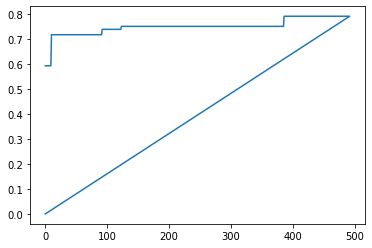

|  493      | -0.4548   |  0.2408   |  177.4    |  1.581    |  1.473    |  0.08809  |  1.042    |  0.5648   |  1.151e+0 |  2.305    |  0.8018   |  42.58    |  0.1194   |  0.74     |  1.116    |  0.232    |  2.779    |  7.396    |
32 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
O

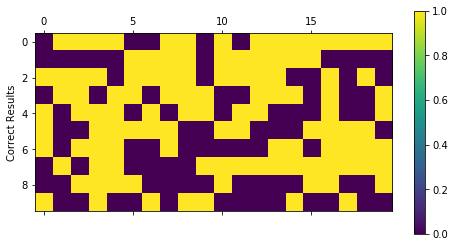

Final percentage:  tensor(0.5414)
Last epoch:  23


Best Score So Far:  tensor(-0.7928)


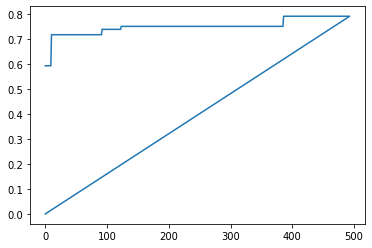

|  494      | -0.5414   |  0.8616   |  123.9    |  1.173    |  1.824    |  0.02803  |  1.829    |  0.1906   |  1.751e+0 |  3.108    |  0.1105   |  55.02    |  0.1978   |  0.7059   |  2.097    |  0.5075   |  3.22     |  8.889    |
32 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  False
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic
Optimizati

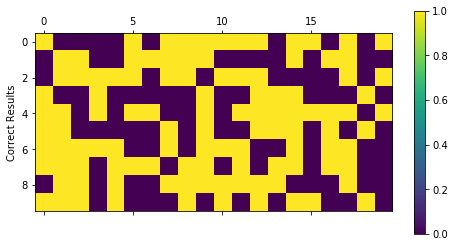

Final percentage:  tensor(0.5396)
Last epoch:  220


Best Score So Far:  tensor(-0.7928)


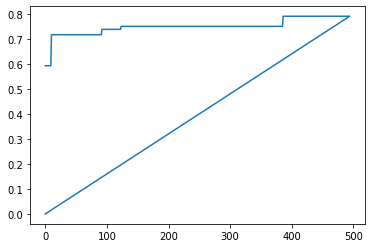

|  495      | -0.5396   |  0.1394   |  97.59    |  1.68     |  2.524    |  0.07689  |  1.06     |  0.07164  |  1.925e+0 |  2.668    |  0.02153  |  166.1    |  0.2742   |  0.4083   |  2.782    |  0.2038   |  1.34     |  6.557    |
16 bits computations
BN Batch EPS:  1e-06
BN Batch STATS:  True
*** LOSS ******: 1
*********  BCELoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

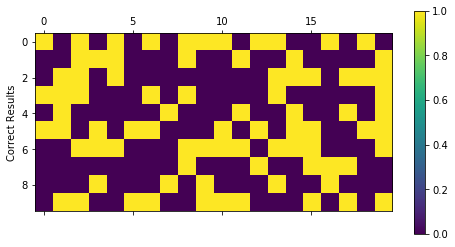

Final percentage:  tensor(0.4368)
Last epoch:  22


Best Score So Far:  tensor(-0.7928)


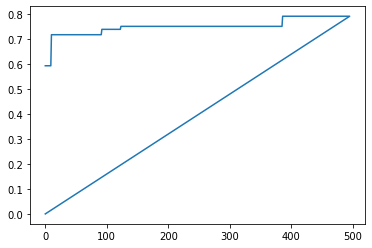

|  496      | -0.4368   |  1.344    |  253.2    |  1.64     |  2.713    |  0.05905  |  0.1529   |  0.7445   |  1.542e+0 |  2.417    |  0.49     |  135.9    |  0.6612   |  0.58     |  1.344    |  0.507    |  1.533    |  5.186    |
32 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O0:  Pure FP32 training.

Defaults for this optimization level are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : None
master_weights         : False
loss_scale             : 1.0
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O0
cast_model_type        : torch.float32
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : False
loss_scale             : dynamic


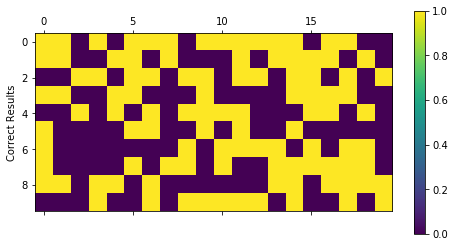

Final percentage:  tensor(0.5060)
Last epoch:  45


Best Score So Far:  tensor(-0.7928)


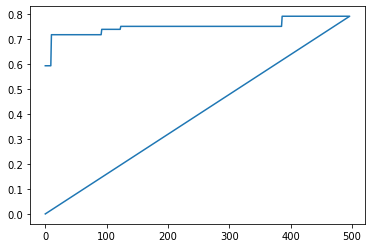

|  497      | -0.506    |  0.1903   |  232.9    |  2.678    |  0.6119   |  0.0222   |  1.124    |  0.03302  |  1.979e+0 |  2.03     |  0.2666   |  237.7    |  0.245    |  0.3647   |  1.366    |  0.08593  |  3.731    |  3.493    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

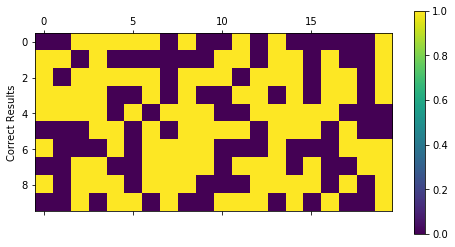

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


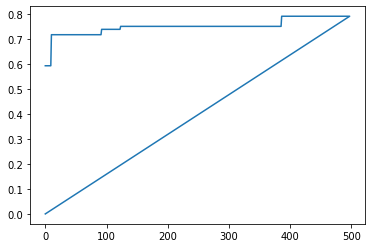

|  498      | -0.5      |  1.549    |  43.19    |  2.325    |  0.8203   |  0.07253  |  0.1139   |  0.5297   |  1.056e+0 |  2.966    |  0.3147   |  188.9    |  0.4181   |  0.4999   |  1.377    |  0.2774   |  2.453    |  1.418    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
los

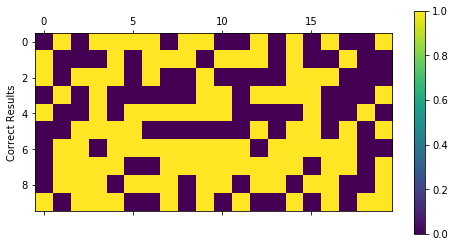

Final percentage:  tensor(0.4912)
Last epoch:  118


Best Score So Far:  tensor(-0.7928)


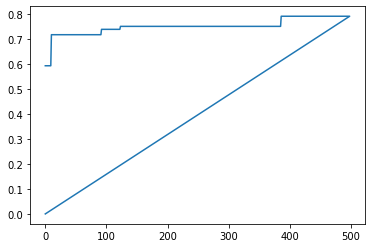

|  499      | -0.4912   |  1.689    |  113.4    |  1.379    |  0.4473   |  0.01262  |  0.9596   |  0.7955   |  1.836e+0 |  3.631    |  0.4619   |  5.329    |  0.7887   |  0.823    |  1.126    |  0.1748   |  2.524    |  4.874    |
16 bits computations
BN Batch EPS:  1e-05
BN Batch STATS:  True
*** LOSS ******: 2
*********  MMLoss
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss

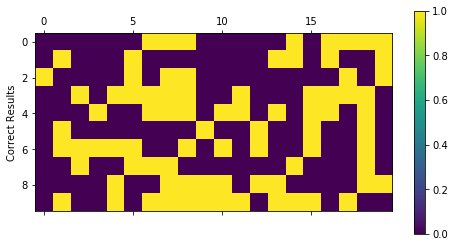

Final percentage:  tensor(0.4654)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


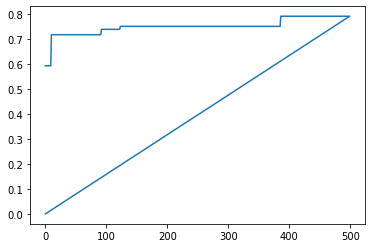

|  500      | -0.4654   |  1.908    |  252.1    |  1.307    |  1.056    |  0.05769  |  0.8402   |  0.4063   |  1.877e+0 |  1.181    |  0.8238   |  81.39    |  0.7287   |  0.2476   |  2.452    |  0.7836   |  2.696    |  1.998    |
16 bits computations
BN Batch EPS:  0.0001
BN Batch STATS:  False
*** LOSS ******: 3
********* CrossEntropyLoss 
Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights        

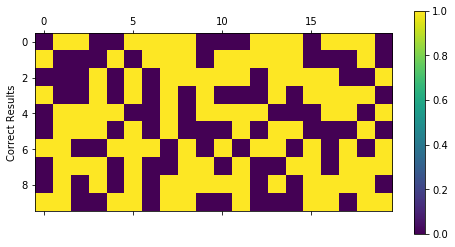

Final percentage:  tensor(0.5000)
Last epoch:  21


Best Score So Far:  tensor(-0.7928)


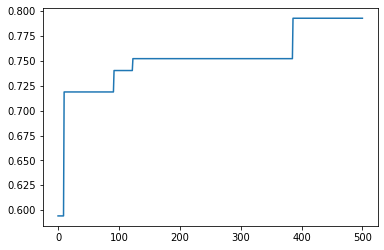

|  501      | -0.5      |  1.99     |  2.0      |  1.0      |  0.0      |  0.1      |  1.99     |  0.0      |  1e+03    |  1.0      |  1e-05    |  256.0    |  0.001    |  0.0      |  2.99     |  0.0      |  3.99     |  1.0      |
{'target': -0.2859037220478058, 'params': {'SCI_16BITS': 0.3099912935729809, 'SCI_BATCH_SIZE': 148.05601774804236, 'SCI_BIAS': 2.0169850239577802, 'SCI_BN_EPS': 1.101227697247571, 'SCI_BN_MOMENTUM': 0.0683335516406005, 'SCI_BN_STATS': 1.5810275435545533, 'SCI_DROPOUT': 0.3741475945551166, 'SCI_EPOCHS': 1627.351105797296, 'SCI_LINEARITY': 3.7284919592888173, 'SCI_LR': 0.4112801063868319, 'SCI_L_SECOND': 36.29506657723757, 'SCI_MM': 0.5431466281807754, 'SCI_REGULARIZATION': 0.3870252500337321, 'SCI_RELU': 2.5289430291882002, 'SCI_SGD_MOMENTUM': 0.7968769362234699, 'SCI_loss_type': 1.5138194558958715, 'SCI_optimizer': 4.937071037522211}}
Iteration 0: 
	{'target': -0.5942472219467163, 'params': {'SCI_16BITS': 0.8298737893581223, 'SCI_BATCH_SIZE': 184.9624213343081

In [4]:


if OPTIMIZATION_PLUGIN == 'Bayesian' :
    from bayes_opt import BayesianOptimization
    
    #def black_box_function(x, y):
    def objective(SCI_RELU, SCI_BIAS, SCI_loss_type,
                  SCI_optimizer, SCI_LR, SCI_MM, 
                  SCI_REGULARIZATION, SCI_EPOCHS, SCI_BATCH_SIZE, 
                  SCI_DROPOUT, SCI_L_SECOND, SCI_BN_MOMENTUM, SCI_SGD_MOMENTUM,
                  SCI_LINEARITY, SCI_16BITS, SCI_BN_EPS, SCI_BN_STATS):
        global count, PercentVector, PercentVec, device, MaxPercent

        
        SCI_BATCH_SIZE = int(SCI_BATCH_SIZE)                    # integer between 4 and 256
        SCI_MM = round(SCI_MM,3)                                # real with three decimals between (0.001, 0.999)
        SCI_LR = round(SCI_LR,5)                                # real with five decimals between(1e-4, 7e-1)            
        SCI_DROPOUT = round(SCI_DROPOUT,2)                      # real with two decimals between (0, 0.4)
        SCI_L_SECOND = int(SCI_L_SECOND)                        # integer between 2 and 64
        SCI_EPOCHS = int(SCI_EPOCHS)                            # integer between (100, 500)
        SCI_BN_MOMENTUM = round(SCI_BN_MOMENTUM,2)              # real with two decimals between (0, 0.99)
        SCI_SGD_MOMENTUM = round(SCI_SGD_MOMENTUM,2)            # real with two decimals between (0, 0.99) 
        SCI_loss_type = int(SCI_loss_type)                      # integer between 1 and 3 ('CrossEntropyLoss', 'MultiMarginLoss','NLLLoss')
        SCI_LINEARITY = int(SCI_LINEARITY)
        SCI_BN_EPS = int(SCI_BN_EPS)
        if SCI_16BITS < 1:
            BITS = 'O0'
        else:
            BITS = 'O2'
            
        if int(SCI_RELU) == 1 :                                 # integer between 1 and 2 ('True', 'False')
            SCI_RELU = True      
        else:
            SCI_RELU = False      
        if int(SCI_BIAS) == 1 :                                 # integer between 1 and 2 ('True', 'False')
            SCI_BIAS = True      
        else:
            SCI_BIAS = False  
 
        SCI_REGULARIZATION = float(str(SCI_REGULARIZATION))
    
    
        if SCI_BN_EPS == 0:
            BN_EPS = 1e-4
        if SCI_BN_EPS == 1:
            BN_EPS = 1e-5
        if SCI_BN_EPS == 2:
            BN_EPS = 1e-6
        print('BN Batch EPS: ', BN_EPS)     
        
        SCI_BN_STATS = int(SCI_BN_STATS)
        if SCI_BN_STATS == 0:
            BN_STATS = True
        if SCI_BN_STATS == 1:
            BN_STATS = False
        print('BN Batch STATS: ', BN_STATS)     
            
        
        
        cnn = CNN6(L_FIRST, SCI_L_SECOND, KERNEL_X,
                   SCI_BIAS, SCI_BN_MOMENTUM, SCI_RELU,
                   SCI_DROPOUT, dataset.CLASSES, SCI_LINEARITY,
                   BN_EPS, BN_STATS)     

        optimizer = Utillities.optimization_algorithms(SCI_optimizer,cnn, SCI_LR, SCI_SGD_MOMENTUM,
                                                       SCI_REGULARIZATION)
        
        if GPU_SELECT == 2:
            if torch.cuda.device_count() > 1:
                cnn = nn.DataParallel(cnn,device_ids=[0, 1], dim = 0) 
            cnn = cnn.cuda()                
        if GPU_SELECT == 1:
            cnn.to(device)  
        if GPU_SELECT == 0:
            cnn.to(device)        

            
           
            
        cnn.apply(CNN6.weights_reset)        
        cnn.share_memory()
     
        loss_func = nn.CrossEntropyLoss()

        def create_loss(LOSS):   
            print('*** LOSS ******:',  LOSS)
            if LOSS == 1:
                loss_func = nn.BCELoss()
                print('*********  BCELoss')
            if LOSS == 2:
                loss_func = nn.MultiMarginLoss()
                print('*********  MMLoss')                               
            if LOSS == 3:
                loss_func = nn.CrossEntropyLoss() 
                print('********* CrossEntropyLoss ')                 
            return loss_func
        

        
        MM = float(str(SCI_MM))

        LR = float(str(SCI_LR))
        train_losses = []         # to track the training loss as the model trains
        output = 0
        loss = 0
        accuracy = 0
        early_stopping.counter = 0
        early_stopping.best_score = None
        early_stopping.early_stop = False
        early_stopping.verbose = False  
        TEST_RESULTS = torch.zeros(1,2)
    
        loss_type = create_loss(SCI_loss_type)
        
        cnn, optimizer = amp.initialize(
           cnn, optimizer, opt_level=BITS, 
           keep_batchnorm_fp32=True, loss_scale="dynamic"
        )
    
        Utillities.listing(optimizer, SCI_SGD_MOMENTUM, SCI_BN_MOMENTUM, 
                           SCI_L_SECOND, SCI_LR, SCI_RELU, 
                           SCI_BIAS, SCI_loss_type, SCI_REGULARIZATION, 
                           SCI_BATCH_SIZE, SCI_DROPOUT, SCI_LINEARITY)

    
        # Data Loader for easy mini-batch return in training
        SCI_BATCH_SIZE = int(SCI_BATCH_SIZE)
        train_loader = Data.DataLoader(dataset = dataset.train_dataset, batch_size = SCI_BATCH_SIZE, shuffle = True, num_workers = 0, drop_last=True, pin_memory=True)
        validation_loader = Data.DataLoader(dataset = dataset.validation_dataset, batch_size = 190, shuffle = True, num_workers = 0, drop_last=True, pin_memory=True)    
        test_loader = Data.DataLoader(dataset = dataset.test_dataset, batch_size = 200, shuffle = True, num_workers = 0, drop_last=True, pin_memory=True)
    
        for epoch in range(SCI_EPOCHS):
            loss = None        
            cnn.train().cuda()
            for step, (train_data, train_target) in enumerate(train_loader):   
                train_data, train_target = train_data.to(device), train_target.to(device)
                output, temp = cnn(train_data)                # forward pass: compute predicted outputs by passing inputs to the model     
                loss = loss_func(output, train_target)
                train_losses.append(loss.item())
                if APEX_AVAILABLE:
                    with amp.scale_loss(loss, optimizer) as scaled_loss:
                        scaled_loss.backward()
                else:
                    #batch_loss.backward()
                    loss.backward()                               # backward pass: compute gradient of the loss with respect to model parameters
                optimizer.zero_grad()
                optimizer.step()                              # perform a single optimization step (parameter update)
      
            cnn.eval().cuda()                 # switch to evaluation (no change) mode           
            valid_loss = 0
            accuracy = 0
            running_loss = 0.0
            with torch.no_grad():
                for step, (validation_data, validation_target) in enumerate(validation_loader):
                    validation_data, validation_target = validation_data.to(device), validation_target.to(device)
                    output, temp = cnn(validation_data)            # forward pass: compute predicted outputs by passing inputs to the model
                    valid_loss += loss_func(output, validation_target).item()
                running_loss += valid_loss
                if epoch % 100 == 0: 
                    print('average loss: %.6f' %(running_loss))
                    running_loss = 0.0
                   
            train_losses = []
            early_stopping(valid_loss, cnn)
        
            if early_stopping.early_stop:
                if os.path.exists('checkpoint.pt'):
                    #cnn = TheModelClass(*args, **kwargs)
                    print("Loaded the model with the lowest Validation Loss!")
                    cnn.load_state_dict(torch.load('checkpoint.pt'))  # Choose whatever GPU device number you want
                    cnn.to(device)
                break
      
        cnn.eval()
        class_correct = list(0. for i in range(1000))
        class_total = list(0. for i in range(1000))
        with torch.no_grad():
            for (test_data, test_target) in test_loader:
                test_data, test_target = test_data.to(device), test_target.to(device)
                outputs, temp = cnn(test_data)
                _, predicted = torch.max(outputs, 1)
                c = (predicted == test_target).squeeze()
                dx = ((c.cpu()).numpy()).astype(int)
                for i in range(test_target.size(0)):
                    label = test_target[i]
                    class_correct[label] += c[i].item()
                    class_total[label] += 1

        for i in range(dataset.CLASSES):
            TEST_RESULTS[0,i] = class_correct[i] / dataset.TESTED_ELEMENTS[i]
            print('Class: ',i,' accuracy: ', TEST_RESULTS[0,i])   
            print('Class: ',i,' correct: ', class_correct[i],' of ',dataset.TESTED_ELEMENTS[i])

        plt.matshow(dx.reshape((10, 20)))
        plt.ylabel('Correct Results')
        plt.colorbar()
        plt.show()
        percent = (TEST_RESULTS[0,0]+TEST_RESULTS[0,1])/2
        print('Final percentage: ',percent)
    
        CreditCost = int((1 - TEST_RESULTS[0,0]) * dataset.TESTED_ELEMENTS[0] + (1 - TEST_RESULTS[0,1]) * dataset.TESTED_ELEMENTS[1])
        
    
        print('Last epoch: ', epoch)
    
        if os.path.exists('checkpoint.pt'):  
            os.remove('checkpoint.pt') 

        print()
        print()
        
        if -percent < MaxPercent : 
            MaxPercent = -percent
        print('Best Score So Far: ',MaxPercent)    
        
        PercentVector[count] = MaxPercent    
        PercentVec[count] = count
        # plot the data
        fig = plt.figure()
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(PercentVec, -PercentVector, color='tab:blue')
        #print(CreditVec, -CreditVector)
        count = count + 1
        # display the plot
        plt.show()
        
        return -percent
    
    
    optimizer = BayesianOptimization(
        f=objective,
        #pbounds=pbounds,
        pbounds={'SCI_RELU': (1,2.99), 
                 'SCI_BIAS': (1,2.99), 
                 'SCI_loss_type': (1, 3.99), 
                 'SCI_optimizer': (1, 9.99),
                 'SCI_LR': (0.00001, 0.9), 
                 'SCI_MM': (0.001, 0.999), 
                 'SCI_REGULARIZATION': (0, 0.9), 
                 'SCI_EPOCHS': (1000, 2000), 
                 'SCI_BATCH_SIZE': (2, 256), 
                 'SCI_DROPOUT': (0, 0.8), 
                 'SCI_L_SECOND': (2, 256), 
                 'SCI_BN_MOMENTUM': (0, 0.1), 
                 'SCI_SGD_MOMENTUM': (0, 0.999), 
                 'SCI_LINEARITY': (1,3.99),
                 'SCI_16BITS': (0,1.99),
                 'SCI_BN_EPS':(0,2.99),
                 'SCI_BN_STATS':(0,1.99)
                },
        verbose=2, # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
        random_state=1,
    )
        

    #optimizer.maximize(
        #n_iter=TRIALS, acq="ucb", kappa=0.1
    #)
    
    
    optimizer.maximize(
        init_points = RANDOM_STARTS,
        n_iter = TRIALS,
        #acq="ucb", kappa=0.1
        
        acq="ei", xi=1e-4
    )
    
    
    print(optimizer.max)
    
    for i, res in enumerate(optimizer.res):
        print("Iteration {}: \n\t{}".format(i, res))

In [5]:
if OPTIMIZATION_PLUGIN == 'GradDescent' :
    import pandas as pd
    import matplotlib.pyplot as plt
    import torch
    import torch.optim as optim
    from torch.autograd import Variable
    from Utillities import Utillities
    from cnn_model import CNN6      

    #SCI_LR = 0.2
    SCI_REGULARIZATION = 0.03
    SCI_EPOCHS = 200
    SCI_RELU = 'True'
    SCI_BIAS = 'True'
    SCI_BN_MOMENTUM = 0.1
    
    
    SCI_loss_type = torch.randint(3, 4, (1,1), dtype=torch.float, requires_grad=True) 
    print('SCI_loss_type: ',SCI_loss_type)    
    SCI_SGD_MOMENTUM = torch.rand(1, requires_grad=True)
    print('SCI_SGD_MOMENTUM: ', SCI_SGD_MOMENTUM)
    SCI_BATCH_SIZE   = torch.randint(128, 256, (1,1), dtype=torch.float, requires_grad=True) 
    print('SCI_BATCH_SIZE: ',SCI_BATCH_SIZE)
    SCI_L_SECOND   = torch.randint(80, 96, (1,1), dtype=torch.float, requires_grad=True) 
    print('SCI_L_SECOND: ',SCI_L_SECOND)
    SCI_optimizer   = torch.randint(6, 11, (1,1), dtype=torch.float, requires_grad=True) 
    print('SCI_optimizer: ',SCI_optimizer)    
    SCI_DROPOUT      = torch.rand(1, requires_grad=True)    
    print('SCI_DROPOUT: ',SCI_DROPOUT)   
    SCI_LR      = torch.rand(1, requires_grad=True)    
    print('SCI_LR: ',SCI_LR) 
    

    def objective(SCI_SGD_MOMENTUM, SCI_DROPOUT, SCI_BATCH_SIZE, SCI_L_SECOND, SCI_optimizer, LINEARITY, SCI_loss_type, SCI_LR):
        global SCI_REGULARIZATION, SCI_EPOCHS, SCI_RELU
        global SCI_BIAS, SCI_BN_MOMENTUM, device, MaxCredit, count, CreditVector, CreditVec
        
        SCI_SGD_MOMENTUM = SCI_SGD_MOMENTUM/10
        DROPOUT = (SCI_DROPOUT/2).item()
        if SCI_DROPOUT < 0 :
            DROPOUT = 0
            
        if SCI_BATCH_SIZE < 2 :
            SCI_BATCH_SIZE = 64            

        BATCH_SIZE = int(SCI_BATCH_SIZE)
        
        if SCI_L_SECOND < 4 :
            SCI_L_SECOND = 64
            
        
        L_SECOND = int(SCI_L_SECOND)
        
        def create_loss(LOSS):   
            print('*** LOSS ******:',  LOSS)
            if LOSS == 1:
                loss_func = nn.CrossEntropyLoss()
                print('*********  CrossEntropyLoss')
            if LOSS == 2:
                loss_func = nn.MultiMarginLoss()
                print('*********  MMLoss')                               
            if LOSS == 3:
                loss_func = nn.NLLLoss() 
                print('*********  NLLLoss')                 
            return loss_func

        SCI_LR = SCI_LR.item() / 3
        print('SCI_LR: ', SCI_LR)
        print('SCI_LR type: ', type(SCI_LR))


        
        loss_type = int(SCI_loss_type)
        loss_func = create_loss(loss_type)
        print('LOSS FUNCTION IS: ',loss_func)

        REGULARIZATION = float(str(SCI_REGULARIZATION))

        cnn = CNN6(L_FIRST, L_SECOND, KERNEL_X, SCI_BIAS, SCI_BN_MOMENTUM, SCI_RELU, DROPOUT, dataset.CLASSES, LINEARITY)     

        optimizer1 = Utillities.optimization_algorithms(SCI_optimizer.detach().numpy(),cnn, SCI_LR, SCI_SGD_MOMENTUM, SCI_REGULARIZATION)
        
        if GPU_SELECT == 2:
            if torch.cuda.device_count() > 1:
                cnn = nn.DataParallel(cnn,device_ids=[0, 1], dim=0) 
            cnn = cnn.cuda()
        if GPU_SELECT == 1:
            cnn.to(device)  
        if GPU_SELECT == 0:
            cnn.to(device)        

        cnn.apply(CNN6.weights_reset)
        cnn.share_memory()


        train_losses = []         # to track the training loss as the model trains
        output = 0
        loss = 0
        accuracy = 0
        early_stopping.counter = 0
        early_stopping.best_score = None
        early_stopping.early_stop = False
        early_stopping.verbose = False  
        TEST_RESULTS = torch.zeros(1,2)

    
        Utillities.listing(optimizer1, SCI_SGD_MOMENTUM, SCI_BN_MOMENTUM, L_SECOND, SCI_LR, SCI_RELU, SCI_BIAS, loss_type, REGULARIZATION, BATCH_SIZE, DROPOUT, LINEARITY)

        train_loader = Data.DataLoader(dataset = dataset.train_dataset, batch_size = BATCH_SIZE, shuffle = False, num_workers = 0, drop_last=True, pin_memory=True)
        validation_loader = Data.DataLoader(dataset = dataset.validation_dataset, batch_size = 144, shuffle = False, num_workers = 0, drop_last=True, pin_memory=True)    
        test_loader = Data.DataLoader(dataset = dataset.test_dataset, batch_size = 599, shuffle = False, num_workers = 0, pin_memory=True, drop_last=True)
    
        for epoch in range(SCI_EPOCHS):
            loss = None        
            cnn.train().cuda()
            for step, (train_data, train_target) in enumerate(train_loader):   
                train_data, train_target = train_data.to(device), train_target.to(device)
                output, temp = cnn(train_data)                   
                loss = loss_func(output, train_target)
                train_losses.append(loss.item())            
                loss.backward()                             
                optimizer1.zero_grad()
                optimizer1.step()                           
      
            cnn.eval().cuda()                   
            valid_loss = 0
            accuracy = 0
            with torch.no_grad():
                for step, (validation_data, validation_target) in enumerate(validation_loader):
                    validation_data, validation_target = validation_data.to(device), validation_target.to(device)
                    output, temp = cnn(validation_data)            # forward pass: compute predicted outputs by passing inputs to the model
                    valid_loss += loss_func(output, validation_target).item()  
               
            train_losses = []
            early_stopping(valid_loss, cnn)
       
            if early_stopping.early_stop:
                if os.path.exists('checkpoint.pt'):
                    print("Loaded the model with the lowest Validation Loss!")
                    cnn.load_state_dict(torch.load('checkpoint.pt', map_location="cuda:1"))  # Choose whatever GPU device number you want
                    cnn.to(device)
                break
      
        cnn.eval()
        class_correct = list(0. for i in range(1000))
        class_total = list(0. for i in range(1000))
        with torch.no_grad():
            for (test_data, test_target) in test_loader:
                test_data, test_target = test_data.to(device), test_target.to(device)
                outputs, temp = cnn(test_data)
                _, predicted = torch.max(outputs, 1)
                c = (predicted == test_target).squeeze()
                for i in range(test_target.size(0)):
                    label = test_target[i]
                    class_correct[label] += c[i].item()
                    class_total[label] += 1

        for i in range(dataset.CLASSES):
            TEST_RESULTS[0,i] = class_correct[i] / dataset.TESTED_ELEMENTS[i]
            print('Class: ',i,' accuracy: ', TEST_RESULTS[0,i])
            print('Class: ',i,' correct: ', class_correct[i])
        percent = (TEST_RESULTS[0,0]+TEST_RESULTS[0,1])/2
        print('Final percentage: ',percent)
    
        CreditCost = (1 - TEST_RESULTS[0,0]) * dataset.TESTED_ELEMENTS[0] + (1 - TEST_RESULTS[0,1]) * dataset.TESTED_ELEMENTS[1] * 5
    
        if TEST_RESULTS[0,0] == 0 or TEST_RESULTS[0,1] == 0 :
            CreditCost = CreditCost + 300
    
        print('Last epoch: ', epoch)
   
        if os.path.exists('checkpoint.pt'):  
            os.remove('checkpoint.pt') 

        print()
        torch.cuda.empty_cache()
        print()
        
        CreditCost = CreditCost + (SCI_SGD_MOMENTUM + SCI_DROPOUT + SCI_BATCH_SIZE + SCI_L_SECOND + SCI_optimizer + SCI_loss_type+ SCI_LR)/1000
        print('Credit Cost: ',CreditCost)
        
        
        if -CreditCost > MaxCredit : 
            MaxCredit = -CreditCost
        print('Best Score So Far: ',MaxCredit)   
        
        CreditVector[count] = MaxCredit    
        CreditVec[count] = count
        # plot the data
        fig = plt.figure()
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(CreditVec, -CreditVector, color='tab:orange')
        #print(CreditVec, -CreditVector)
        count = count + 1
        # display the plot
        plt.show()
             
        return CreditCost

    
    def loss(y_predicted, expected):
        return (y_predicted - expected).sum()
            
    
    expected = 250
    
    optim_alg = optim.Adadelta([       
        {'params': SCI_SGD_MOMENTUM, 'lr': 0.9},
        {'params': SCI_DROPOUT, 'lr': 1e-2},
        {'params': SCI_BATCH_SIZE, 'lr': 1},
        {'params': SCI_L_SECOND, 'lr': 1},
        {'params': SCI_optimizer, 'lr': 0.9},
        {'params': SCI_loss_type, 'lr': 0.6}, 
        {'params': SCI_LR, 'lr': 0.1}   
        ]) 
    
    LINEARITY = 2
    # Main optimization loop
    for t in range(RANDOM_STARTS + TRIALS):
        optim_alg.zero_grad()
        y_predicted = objective(SCI_SGD_MOMENTUM, SCI_DROPOUT, SCI_BATCH_SIZE, SCI_L_SECOND, SCI_optimizer, LINEARITY, SCI_loss_type, SCI_LR)
        current_loss = loss(y_predicted, expected)
        current_loss.backward()
        optim_alg.step()
        print(f"t = {t}, loss = {current_loss}, SCI_DROPOUT = {SCI_DROPOUT.detach().numpy()}, SCI_SGD_MOMENTUM = {SCI_SGD_MOMENTUM.item()}, SCI_BATCH_SIZE = {SCI_BATCH_SIZE.detach().numpy()}, SCI_L_SECOND = {SCI_L_SECOND.detach().numpy()}, SCI_optimizer = {SCI_optimizer.detach().numpy()}, SCI_loss_type = {SCI_loss_type.detach().numpy()}, SCI_LR = {SCI_LR.detach().numpy()}")
    

In [6]:
end.record()

#print('Minimum Credit Cost: ',Min_Credit_Cost)

print()
print('Total execution time (minutes): ',start.elapsed_time(end)/60000)

torch.cuda.empty_cache()

if GET_STATS:
    pr.disable()
    s = io.StringIO()
    sortby = SortKey.CUMULATIVE
    ps = pstats.Stats(pr, stream=s).sort_stats(sortby)
    ps.print_stats()
    print(s.getvalue())


Total execution time (minutes):  13.76599375
